# Checking to see if the maps and stellar mass profiles of the FULL and FOF files match up 

- ## plot the images of the maps side by side as well as the stellar mass profiles to check by eye 
   - we decide to use the same ellipticity parameters for both the FOF and FULL maps when measuring the profiles to limit differences as a result of ellipticity differences
- ## while we are at it we will save the stellar mass profiles to an `.npy` file

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import h5py

import sys
sys.path.append('/Users/fardila/Documents/GitHub/HSC_vs_hydro/')
from functions import *

In [75]:
from matplotlib.patches import Ellipse

def measure_profile_from_map(particle_map, gal_n, pixel_scale, theta=None, a=None, b=None):
    
    maps_location='/Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/'

    file_name='TNG_'+str(gal_n)+'_xy_full_particles'
    file_path = maps_location + file_name + '.fits'

    save_to_fits(particle_map, file_path)
    data=particle_map

    #central pixels
    x0=len(data)/2.
    y0=len(data)/2.

    ###########################################################################
    #ellipse information
    #########################

    #get background
    bkg = sep.Background(data, bw=10, bh=10, fw=5, fh=5)
    bkg_subtracted_data = data - bkg

    # import pdb; pdb.set_trace()

    thresh = 20 * bkg.globalrms
    objects, seg_map = sep.extract(bkg_subtracted_data, thresh, minarea = 100,
                          deblend_nthresh=24, deblend_cont=0.1, segmentation_map=True)

    #find object closest to image center
    try:
        obj = find_closest(objects, x0=x0, y0=y0)
        print(obj)
        
        fig, ax = plt.subplots()
        ax.imshow(seg_map)
        ax.scatter(obj[7], obj[8], marker='+', c='r', s =50)

    except:
        print('NO OBJECTS FOUND AT THIS THRESHOLD')
        return None

    #ellipse parameters
    if theta is None and a is None and b is None:
        theta = obj['theta']
        q = obj['b']/ obj['a']
        a = obj['a']
        b = obj['b']
        
    
    
    e = Ellipse(xy=(obj['x'], obj['y']),
        width=pixel_scale*a,
        height=pixel_scale*b,
        angle=theta * 180. / np.pi)
    e.set_facecolor('none')
    e.set_edgecolor('red')
    ax.add_patch(e)
    plt.show()

    ###########################################################################
    #1D masses from galSBP
#     pixel_scale = 1
    intMode='mean'
    x0,y0 = obj[7], obj[8]
    q=b/a
    iso, iso_bin = galSBP.galSBP(file_path,
                                     galX=x0,
                                     galY=y0,
                                     galQ=q,
                                     galPA=theta* 180. / np.pi,
                                     maxSma=1000,
                                     iniSma=50.0,
                                     stage=3,
                                     intMode=intMode,
                                     ellipStep=0.1,
                                     pix=pixel_scale,
                                     zpPhoto=0.0,
                                     isophote=x_isophote,
                                     xttools=x_ttools,
                                     recenter=True,
                                     savePng=False,
                                     verbose=True,
                                     uppClip=3.0,
                                     lowClip=3.0,
                                     nClip=2)


    ###########################################################################
    if iso:
        iso['sma_kpc'] = iso['sma'] * pixel_scale
        iso['intens_kpc']=iso['intens'] / (pixel_scale**2)

    return iso, theta, a, b

In [2]:
z_tng = 0.4
h_tng = 0.704

In [81]:
Group_IDs = [ 29, 284, 132, 269,  73, 154,  86, 211, 201,  94,  67, 160, 260, 199, 5, 163, 147, 7, 384, 2, 37,
             74, 31, 198, 178, 17, 77, 222, 164,  80, 221,  57, 189,  96, 327, 100, 220,  11, 128, 273, 424,
             360, 122,  79, 194,  70, 149, 412,  55, 334, 104, 153, 546, 140, 459,  66, 114, 28, 170, 159, 63,
             52, 123, 84, 36, 204, 380, 38, 197, 351, 15, 22, 243, 54, 145,  82, 113, 332,  69, 193,  95, 331,
             44, 363, 339, 150, 195,  46,  48, 56, 214]

In [4]:
full_particles_file_location = '/Users/fardila/Documents/GitHub/HSC_vs_hydro/Data/TNG/full_particles/boxptl_tng100_072_profiletest.hdf5'

full_particles_file = h5py.File(full_particles_file_location, 'r')
keys = full_particles_file.keys()[2:]

In [5]:
FOF_particles_file_location = '/Users/fardila/Documents/GitHub/HSC_vs_hydro/Data/TNG/galaxies_stellarmaps_tng75_11.2.hdf5'
f = h5py.File(FOF_particles_file_location, 'r')
FOF_galaxy_IDS = f['catgrp_id'].value
M200 = np.array(f['catgrp_Group_M_Crit200']) # in solar masses
f.close()

## use the distinct ellipticity parameters measured for each map

Galaxy 29
(0, u'subbox_000_ptlstr_Coordinates', u'subbox_000_ptlstr_Masses')
Pixel Scales: 9.55647405376, 5.3333 kpc/pixel


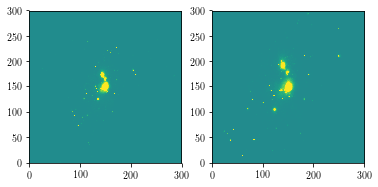

Measuring FULL PARTICLE profile
(30169218., 811, 760, 127, 160, 116, 179, 149.06717346, 150.50800738, 37.44519974, 75.61138767, -40.6812763, 0., 0., 0., 10.07288551, 3.40493107, -1.00470495, 0.06427806, 0.03183257, 0.06916718, 8.08097612e+11, 8.08749171e+11, 3.8607106e+10, 8.88093327e+10, 150, 150, 150, 150, 1)


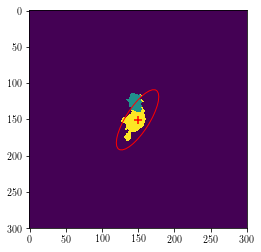

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.06717346215856 150.50800737836428
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_29_xy_full_particles.fits
###      Input Image   : temp_1D91E.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

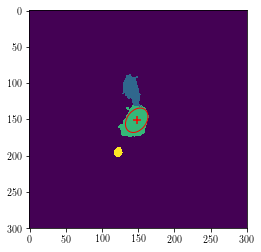

----------------------------------------------------------------------------------------------------
###      galX, galY :  147.88942271717124 151.1407878745708
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_29_xy_full_particles.fits
###      Input Image   : temp_V8AY0.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

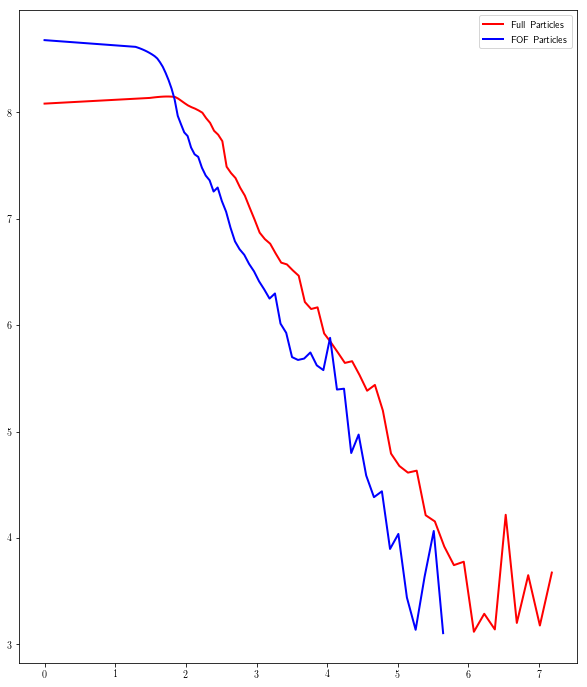

Galaxy 284
(1, u'subbox_001_ptlstr_Coordinates', u'subbox_001_ptlstr_Masses')
Pixel Scales: 4.70209907831, 5.3333 kpc/pixel


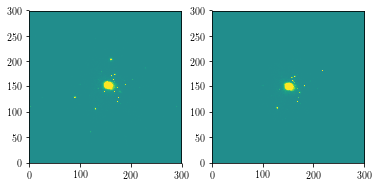

Measuring FULL PARTICLE profile
(16645046., 597, 535, 143, 175, 134, 160, 155.34602657, 147.30537859, 15.05437752, 9.2482602, 0.39019434, 0., 0., 0., 3.88335967, 3.03680015, 0.06680364, 0.06649859, 0.10824682, -0.0056113, 2.65187754e+11, 2.65367142e+11, 1.67638508e+10, 4.05976269e+10, 154, 147, 154, 147, 0)


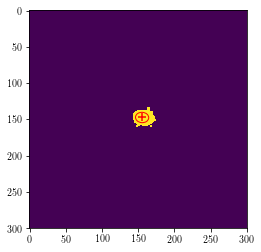

----------------------------------------------------------------------------------------------------
###      galX, galY :  155.3460265741062 147.30537858630112
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_284_xy_full_particles.fits
###      Input Image   : temp_8RLGP.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

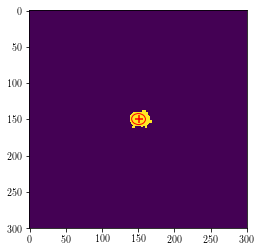

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.43104808604568 149.4706258744038
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_284_xy_full_particles.fits
###      Input Image   : temp_M56TQ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

/Users/fardila/anaconda/envs/hsc_hydro4/lib/python2.7/site-packages/ipykernel/__main__.py:70: RuntimeWarning: divide by zero encountered in log10


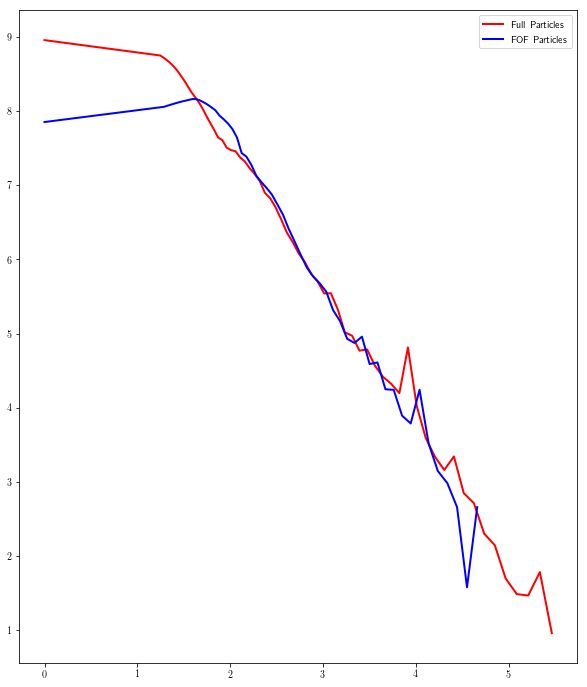

Galaxy 132
(2, u'subbox_002_ptlstr_Coordinates', u'subbox_002_ptlstr_Masses')
Pixel Scales: 5.63643333024, 5.3333 kpc/pixel


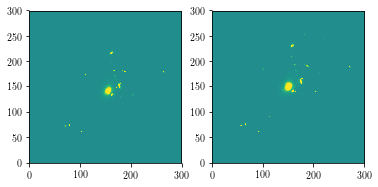

Measuring FULL PARTICLE profile
(20447102., 485, 464, 143, 167, 144, 172, 154.89919945, 157.20262986, 6.65932752, 8.31392356, -1.82753531, 0., 0., 0., 3.08102155, 2.34105921, -0.99794048, 0.15980554, 0.12800182, 0.0702557, 2.12419969e+11, 2.12560396e+11, 2.16361226e+10, 6.47094272e+10, 155, 157, 155, 157, 1)


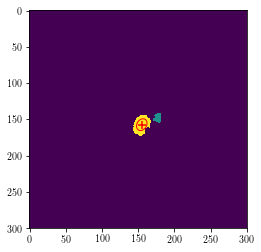

----------------------------------------------------------------------------------------------------
###      galX, galY :  154.89919945470913 157.20262985732322
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_132_xy_full_particles.fits
###      Input Image   : temp_OVC7H.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

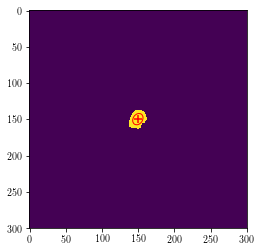

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.4778462379641 149.577017920388
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_132_xy_full_particles.fits
###      Input Image   : temp_T4TM5.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

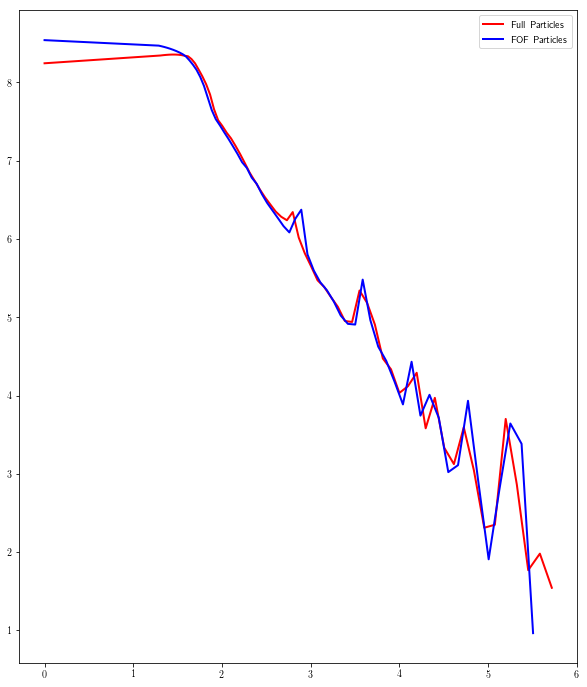

Galaxy 269
(3, u'subbox_003_ptlstr_Coordinates', u'subbox_003_ptlstr_Masses')
Pixel Scales: 4.23885668221, 5.3333 kpc/pixel


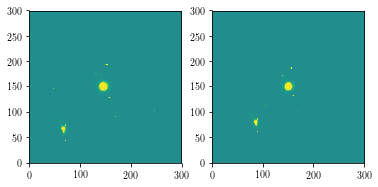

Measuring FULL PARTICLE profile
(14404572., 487, 466, 132, 159, 137, 161, 145.55503608, 149.20516581, 9.07254169, 8.73903512, 0.35838171, 0., 0., 0., 3.04976487, 2.91727805, 0.56764799, 0.11040154, 0.11461478, -0.00905498, 2.19760132e+11, 2.19911487e+11, 1.0932864e+10, 2.08984945e+10, 146, 150, 146, 150, 0)


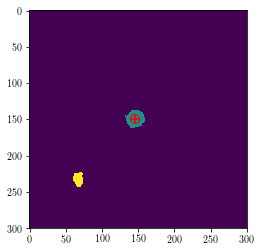

----------------------------------------------------------------------------------------------------
###      galX, galY :  145.55503608319054 149.2051658113734
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_269_xy_full_particles.fits
###      Input Image   : temp_YRHWS.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

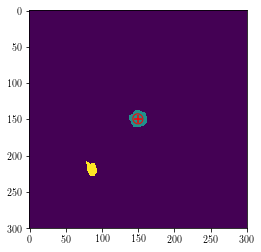

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.48627974814778 149.17284448351168
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_269_xy_full_particles.fits
###      Input Image   : temp_GYBC4.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

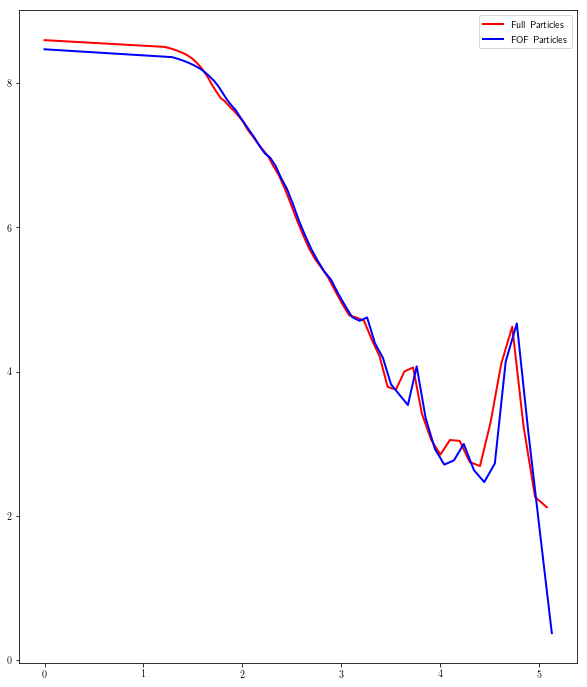

Galaxy 73
(4, u'subbox_004_ptlstr_Coordinates', u'subbox_004_ptlstr_Masses')
Pixel Scales: 6.75600173221, 5.3333 kpc/pixel


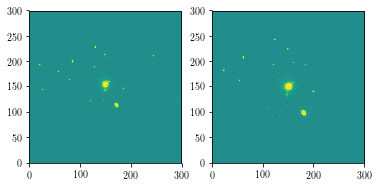

Measuring FULL PARTICLE profile
(19119562., 730, 699, 134, 163, 129, 164, 149.11574193, 145.4025743, 7.21902705, 11.22208461, -0.44315526, 0., 0., 0., 3.3571651, 2.67778921, -1.46184969, 0.13885944, 0.08932655, 0.010967, 4.08739348e+11, 4.09028755e+11, 4.97907384e+10, 1.56703179e+11, 149, 145, 149, 145, 0)


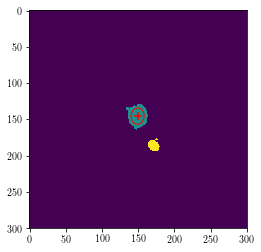

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.11574192969658 145.40257430091307
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_73_xy_full_particles.fits
###      Input Image   : temp_9QRSW.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

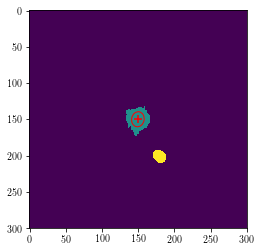

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.50264834090123 149.74566998558117
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_73_xy_full_particles.fits
###      Input Image   : temp_WY3WM.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

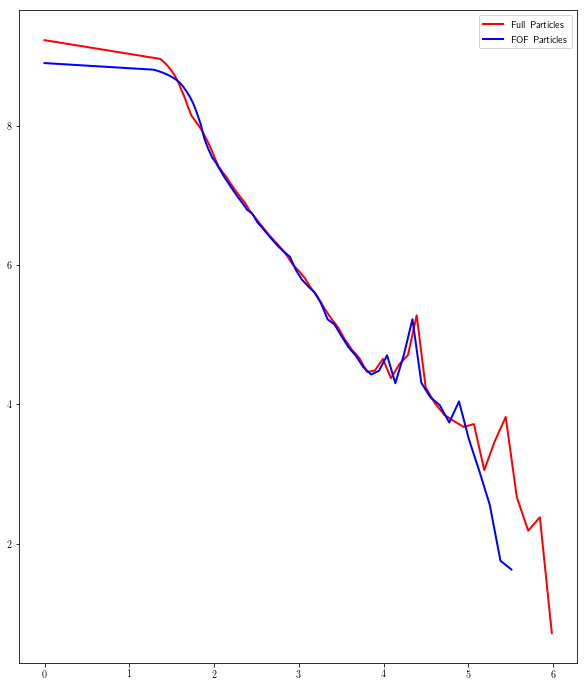

Galaxy 154
(5, u'subbox_005_ptlstr_Coordinates', u'subbox_005_ptlstr_Masses')
Pixel Scales: 5.46486496485, 5.3333 kpc/pixel


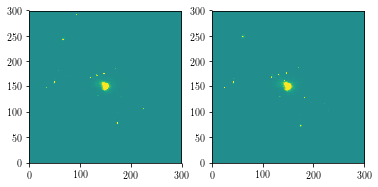

Measuring FULL PARTICLE profile
(19508384., 377, 356, 129, 165, 138, 160, 150.47784791, 149.43457695, 5.43703729, 6.22179149, -1.70820737, 0., 0., 0., 2.75356269, 2.01908922, -0.8982904, 0.20128642, 0.17589818, 0.11052731, 2.64155595e+11, 2.63660323e+11, 2.25589535e+10, 5.30986885e+10, 151, 149, 151, 149, 1)


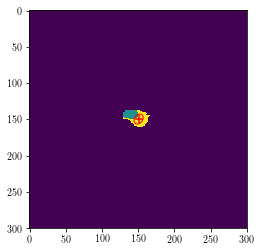

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.4778479139403 149.43457695172123
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_154_xy_full_particles.fits
###      Input Image   : temp_6NPXK.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

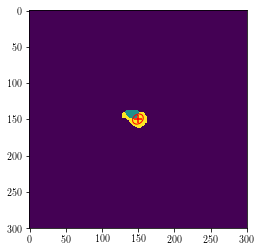

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.57167013212853 149.45119142534128
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_154_xy_full_particles.fits
###      Input Image   : temp_K1LVN.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

/Users/fardila/anaconda/envs/hsc_hydro4/lib/python2.7/site-packages/ipykernel/__main__.py:67: RuntimeWarning: divide by zero encountered in log10


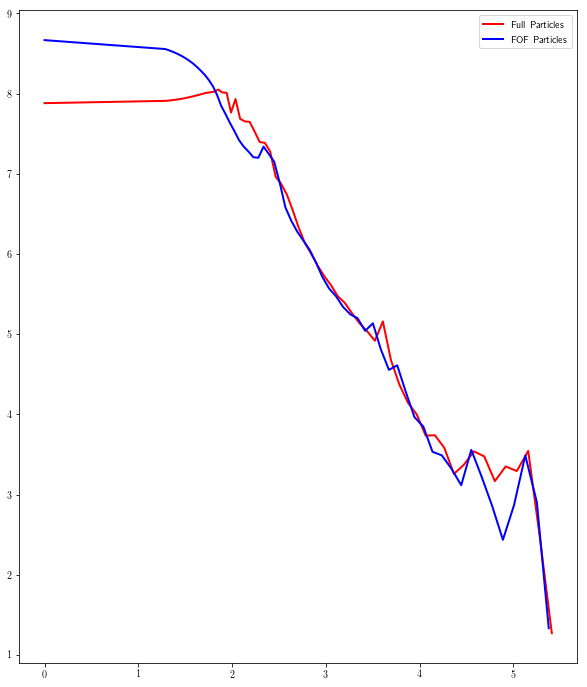

Galaxy 86
(6, u'subbox_006_ptlstr_Coordinates', u'subbox_006_ptlstr_Masses')
Pixel Scales: 6.8000912395, 5.3333 kpc/pixel


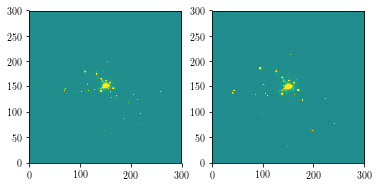

Measuring FULL PARTICLE profile
(19207692., 639, 587, 128, 165, 118, 162, 150.41686136, 147.17582224, 50.96820308, 71.43382934, 46.7629578, 0., 0., 0., 10.44368076, 3.65124106, 0.89311188, 0.04912649, 0.03505186, -0.06431966, 3.19254561e+11, 3.19558877e+11, 1.94422702e+10, 4.75512054e+10, 150, 147, 150, 147, 1)


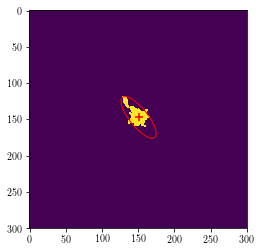

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.41686135503613 147.1758222427445
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_86_xy_full_particles.fits
###      Input Image   : temp_01XR9.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

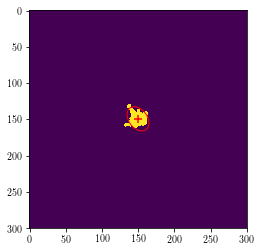

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.67157441923976 149.13258986110463
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_86_xy_full_particles.fits
###      Input Image   : temp_TMRZN.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

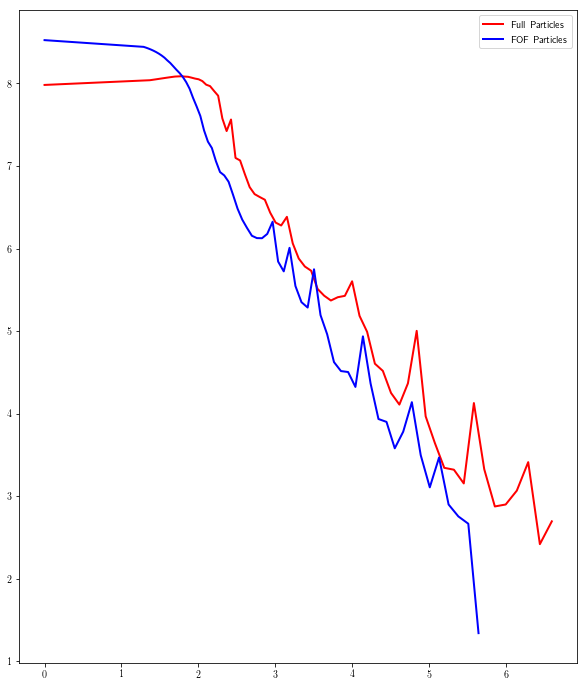

Galaxy 211
(7, u'subbox_007_ptlstr_Coordinates', u'subbox_007_ptlstr_Masses')
Pixel Scales: 3.80342158929, 5.3333 kpc/pixel


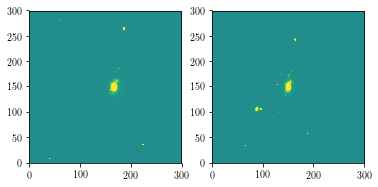

Measuring FULL PARTICLE profile
(20990488., 576, 548, 154, 178, 134, 167, 166.45249143, 149.90538154, 7.10910295, 15.56939938, -2.40695576, 0., 0., 0., 4.02569771, 2.54406404, -1.31213951, 0.14843404, 0.06777608, 0.04589441, 1.72861211e+11, 1.73117555e+11, 1.39034132e+10, 3.3727531e+10, 167, 150, 167, 150, 0)


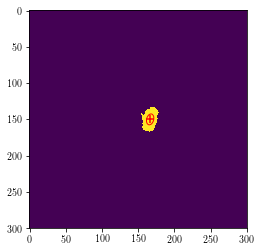

----------------------------------------------------------------------------------------------------
###      galX, galY :  166.45249142953267 149.90538153534297
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_211_xy_full_particles.fits
###      Input Image   : temp_7ZTVY.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

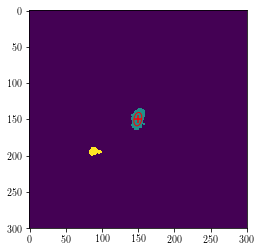

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.42028124493092 149.5667291471334
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_211_xy_full_particles.fits
###      Input Image   : temp_X6LFB.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

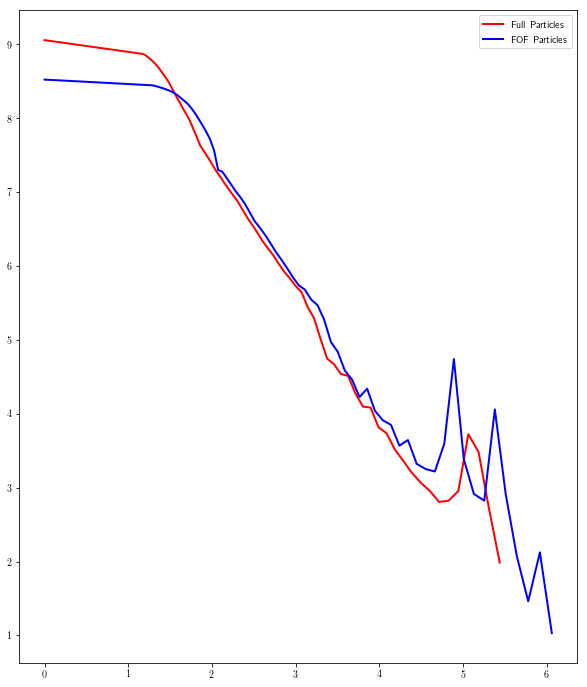

Galaxy 201
(8, u'subbox_008_ptlstr_Coordinates', u'subbox_008_ptlstr_Masses')
Pixel Scales: 4.64782047815, 5.3333 kpc/pixel


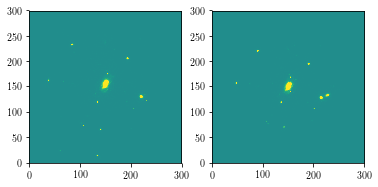

Measuring FULL PARTICLE profile
(17002492., 506, 475, 140, 161, 123, 161, 149.85544589, 144.42761151, 5.87462386, 17.47707239, -4.29739674, 0., 0., 0., 4.3468833, 2.11099601, -1.25201118, 0.20755729, 0.06976689, 0.10207156, 2.21056483e+11, 2.21332603e+11, 1.92081879e+10, 5.17922652e+10, 150, 145, 150, 145, 0)


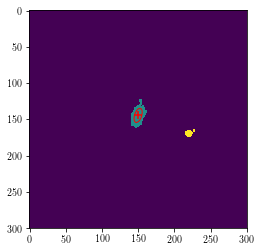

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.855445887816 144.42761150685521
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_201_xy_full_particles.fits
###      Input Image   : temp_CWTLT.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

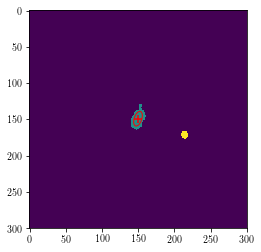

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.69229853321573 149.01608674245497
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_201_xy_full_particles.fits
###      Input Image   : temp_75398.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

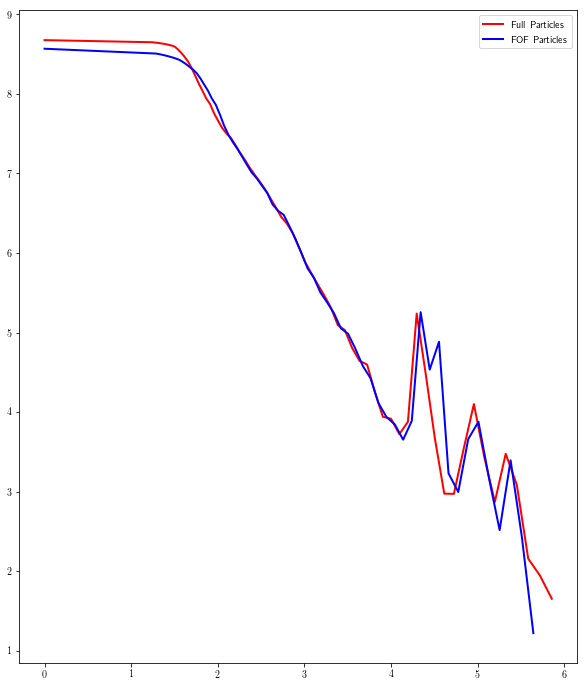

Galaxy 94
(9, u'subbox_009_ptlstr_Coordinates', u'subbox_009_ptlstr_Masses')
Pixel Scales: 5.85846568707, 5.3333 kpc/pixel


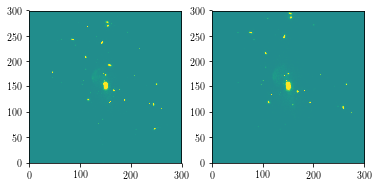

Measuring FULL PARTICLE profile
(25318224., 365, 324, 140, 158, 123, 160, 149.80189338, 146.6210557, 2.44748526, 18.96242923, 1.34666567, 0., 0., 0., 4.36709499, 1.52918136, 1.48996568, 0.42519748, 0.05488034, -0.06039299, 2.81854444e+11, 2.82197e+11, 2.01649869e+10, 5.94205082e+10, 150, 149, 150, 149, 0)


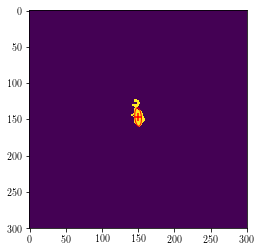

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.80189337755095 146.62105570334063
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_94_xy_full_particles.fits
###      Input Image   : temp_SPDCE.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

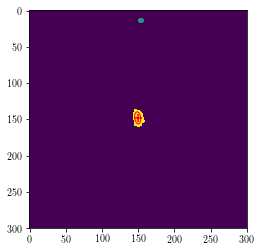

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.24613197942884 147.81623497025458
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_94_xy_full_particles.fits
###      Input Image   : temp_GP65U.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

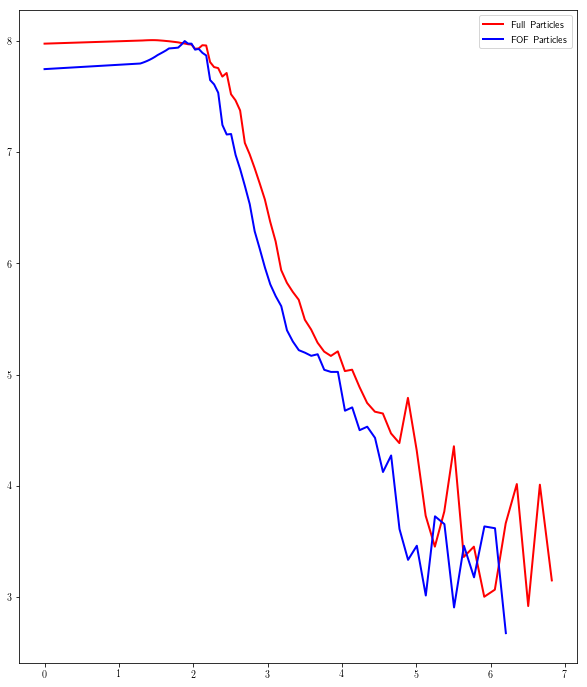

Galaxy 67
(10, u'subbox_010_ptlstr_Coordinates', u'subbox_010_ptlstr_Masses')
Pixel Scales: 7.59465770178, 5.3333 kpc/pixel


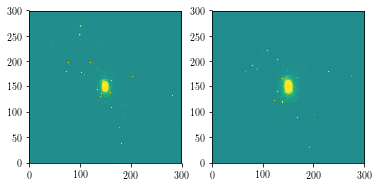

Measuring FULL PARTICLE profile
(28310230., 988, 951, 133, 163, 128, 172, 148.77419021, 149.70831157, 10.89357224, 24.73764822, -0.56859164, 0., 0., 0., 4.97603893, 3.29700756, -1.52981722, 0.09190752, 0.04047277, 0.00422496, 7.32814639e+11, 7.33311271e+11, 4.79250227e+10, 1.0951938e+11, 149, 149, 149, 149, 0)


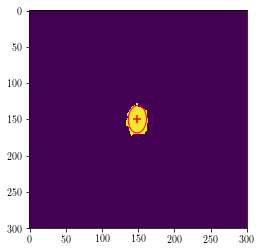

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.77419021298712 149.70831156651926
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_67_xy_full_particles.fits
###      Input Image   : temp_Z2HOJ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

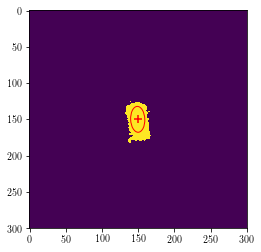

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.300082945047 149.84296312103538
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_67_xy_full_particles.fits
###      Input Image   : temp_70DQX.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

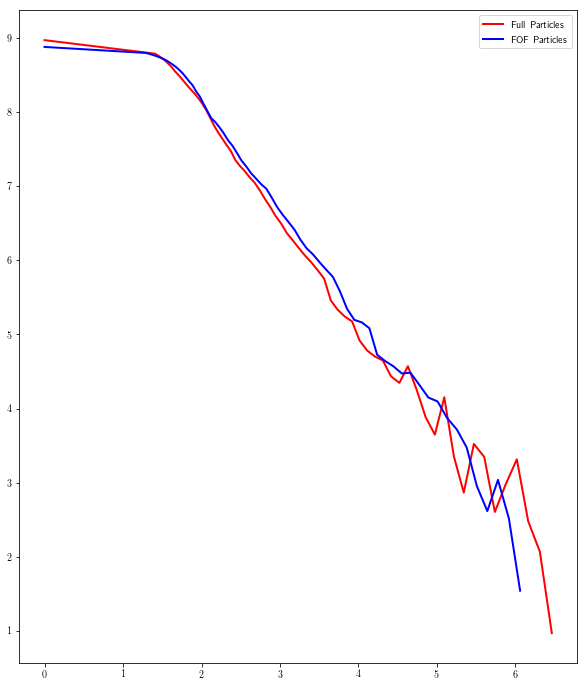

Galaxy 160
(11, u'subbox_011_ptlstr_Coordinates', u'subbox_011_ptlstr_Masses')
Pixel Scales: 5.33204427061, 5.3333 kpc/pixel


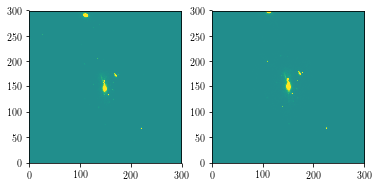

Measuring FULL PARTICLE profile
(18567552., 534, 504, 139, 157, 124, 168, 147.98783523, 151.13580194, 3.33169918, 33.79454001, 4.58869434, 0., 0., 0., 5.87117863, 1.6295712, 1.42448783, 0.36918944, 0.03639724, -0.10025865, 2.52017164e+11, 2.52270526e+11, 2.62725079e+10, 7.98573281e+10, 148, 153, 148, 153, 0)


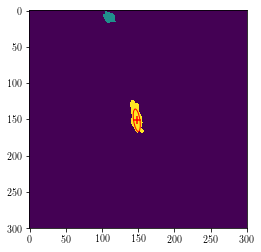

----------------------------------------------------------------------------------------------------
###      galX, galY :  147.98783522728436 151.13580193918415
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_160_xy_full_particles.fits
###      Input Image   : temp_VXNGO.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

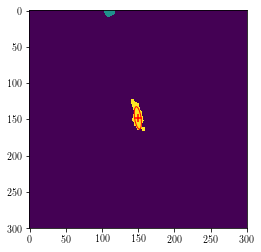

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.44719337364995 147.88595832128175
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_160_xy_full_particles.fits
###      Input Image   : temp_MYWOA.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

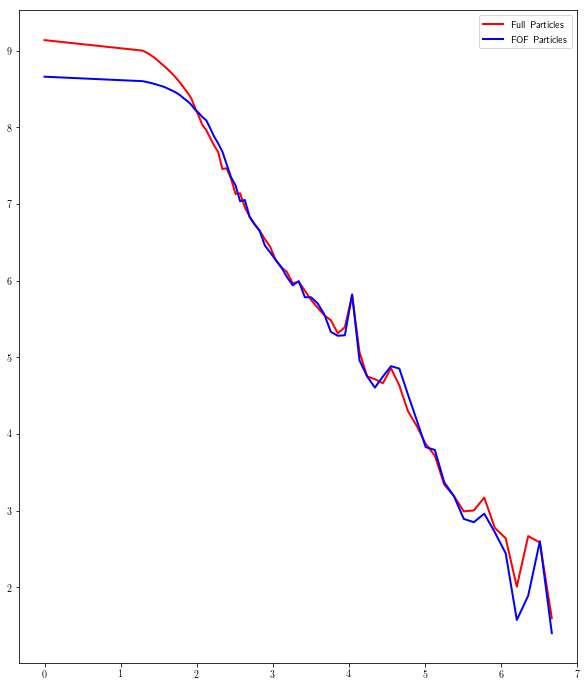

Galaxy 260
(12, u'subbox_012_ptlstr_Coordinates', u'subbox_012_ptlstr_Masses')
Pixel Scales: 5.03073851808, 5.3333 kpc/pixel


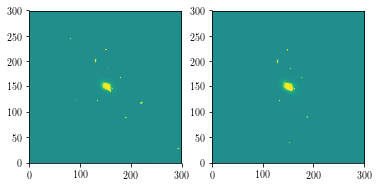

Measuring FULL PARTICLE profile
(14436716., 559, 534, 138, 166, 136, 163, 151.93562688, 149.28299748, 10.87237338, 8.52152631, 4.25009363, 0., 0., 0., 3.75587392, 2.29941535, 0.65048826, 0.11425114, 0.14576979, -0.11396504, 1.91513543e+11, 1.91682658e+11, 1.7046869e+10, 5.20758927e+10, 152, 149, 152, 149, 0)


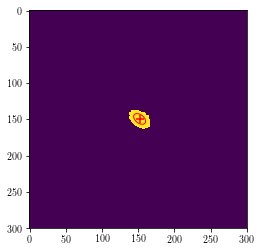

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.93562688187464 149.28299747536576
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_260_xy_full_particles.fits
###      Input Image   : temp_GYVSU.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

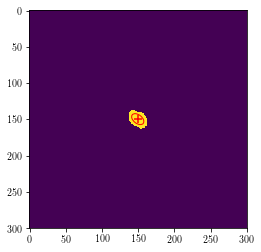

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.3132224833235 149.57017593549054
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_260_xy_full_particles.fits
###      Input Image   : temp_UQ9TS.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

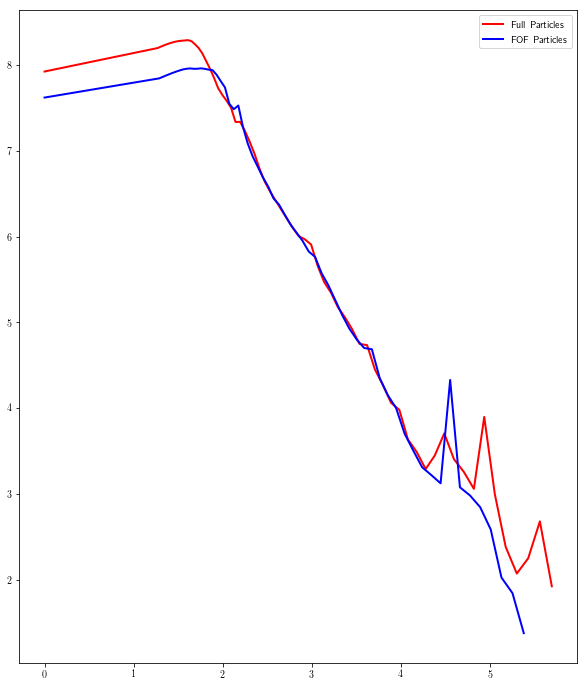

Galaxy 199
(13, u'subbox_013_ptlstr_Coordinates', u'subbox_013_ptlstr_Masses')
Pixel Scales: 4.75256395288, 5.3333 kpc/pixel


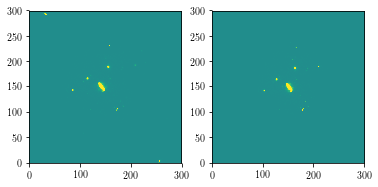

Measuring FULL PARTICLE profile
(11374584., 172, 157, 137, 153, 143, 161, 145.76388918, 153.17218112, 2.64641716, 3.11468941, 0.09036712, 0., 0., 0., 1.769611, 1.62159896, 1.3866241, 0.3782441, 0.32137769, -0.02194815, 9.73257114e+10, 9.69395978e+10, 9.64804813e+09, 2.25040712e+10, 146, 153, 146, 153, 1)


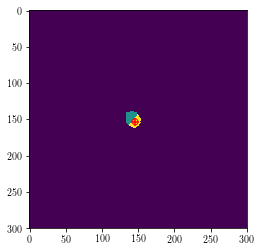

----------------------------------------------------------------------------------------------------
###      galX, galY :  145.76388917869096 153.17218111528794
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_199_xy_full_particles.fits
###      Input Image   : temp_G79R3.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

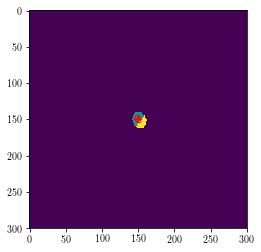

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.50851375268223 149.4764850065048
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_199_xy_full_particles.fits
###      Input Image   : temp_SOSDS.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

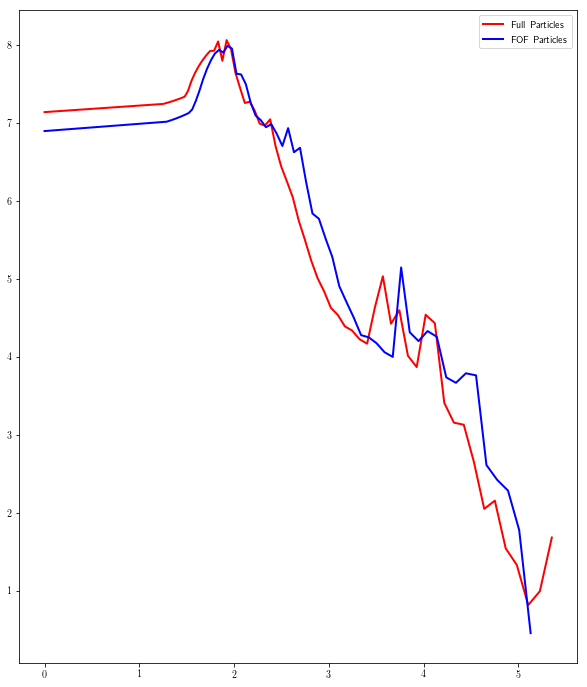

Galaxy 5
(14, u'subbox_014_ptlstr_Coordinates', u'subbox_014_ptlstr_Masses')
Pixel Scales: 13.0514807268, 5.3333 kpc/pixel


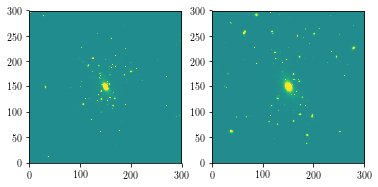

Measuring FULL PARTICLE profile
(30406170., 1433, 1297, 134, 173, 120, 195, 150.46921048, 153.65861272, 45.28537766, 174.64017301, 45.09686472, 0., 0., 0., 13.74081707, 5.57812691, 1.26635444, 0.0297264, 0.00770826, -0.01535234, 1.72282216e+12, 1.72418951e+12, 9.81778268e+10, 2.04416254e+11, 150, 150, 150, 150, 0)


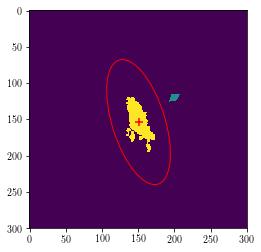

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.46921048082288 153.6586127210399
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_5_xy_full_particles.fits
###      Input Image   : temp_RO0KX.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

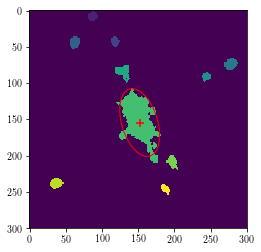

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.96404439276236 154.30931218401554
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_5_xy_full_particles.fits
###      Input Image   : temp_TB9KH.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

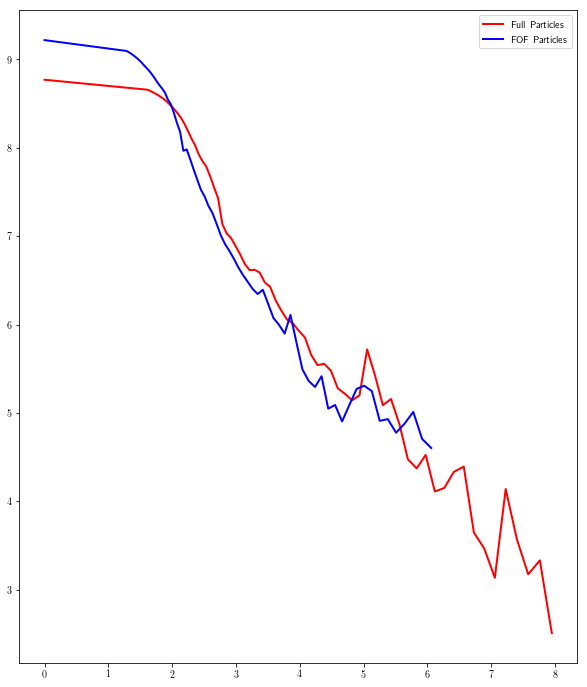

Galaxy 163
(15, u'subbox_015_ptlstr_Coordinates', u'subbox_015_ptlstr_Masses')
Pixel Scales: 5.46254347739, 5.3333 kpc/pixel


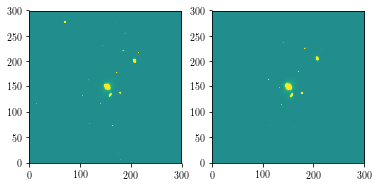

Measuring FULL PARTICLE profile
(19225360., 438, 411, 140, 165, 138, 162, 153.16427914, 149.89470742, 5.13657649, 5.29432327, 0.57345403, 0., 0., 0., 2.40713573, 2.15327597, 0.8537398, 0.19706519, 0.19119355, -0.04269019, 2.35996234e+11, 2.36136022e+11, 2.25483223e+10, 6.18161398e+10, 153, 150, 153, 150, 1)


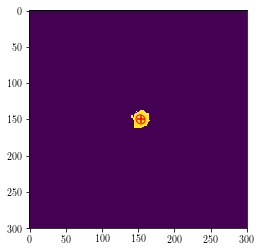

----------------------------------------------------------------------------------------------------
###      galX, galY :  153.16427913918028 149.89470741764214
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_163_xy_full_particles.fits
###      Input Image   : temp_9IQ0Q.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

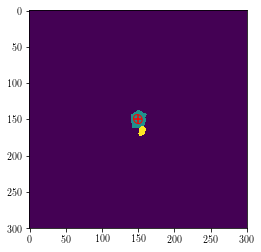

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.4881275128911 149.50757511308873
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_163_xy_full_particles.fits
###      Input Image   : temp_4PVGK.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

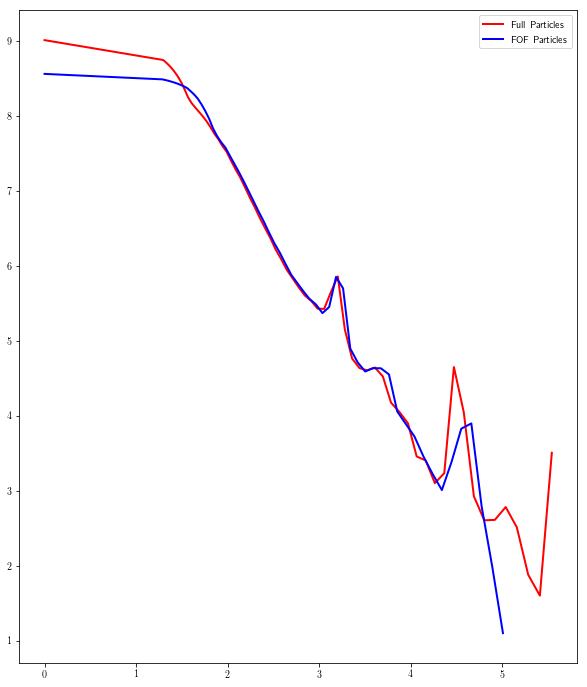

Galaxy 147
(16, u'subbox_016_ptlstr_Coordinates', u'subbox_016_ptlstr_Masses')
Pixel Scales: 5.8330985855, 5.3333 kpc/pixel


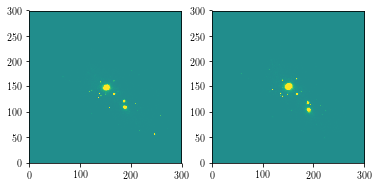

Measuring FULL PARTICLE profile
(16172085., 445, 408, 139, 164, 139, 166, 151.07683349, 151.34027135, 7.55292665, 5.81136867, 1.2187711, 0., 0., 0., 2.86007571, 2.27689767, 0.47521144, 0.13703655, 0.17810382, -0.05747912, 2.08457073e+11, 2.08661398e+11, 1.86437345e+10, 4.59428127e+10, 151, 151, 151, 151, 0)


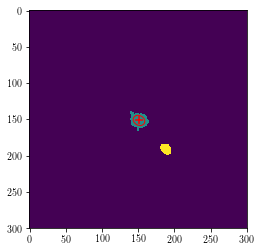

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.0768334904024 151.34027134556618
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_147_xy_full_particles.fits
###      Input Image   : temp_HH6KC.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

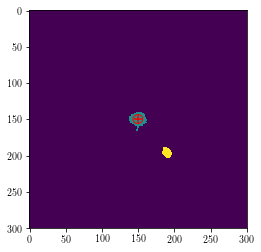

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.47412261745717 149.5420831363994
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_147_xy_full_particles.fits
###      Input Image   : temp_7YCBO.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

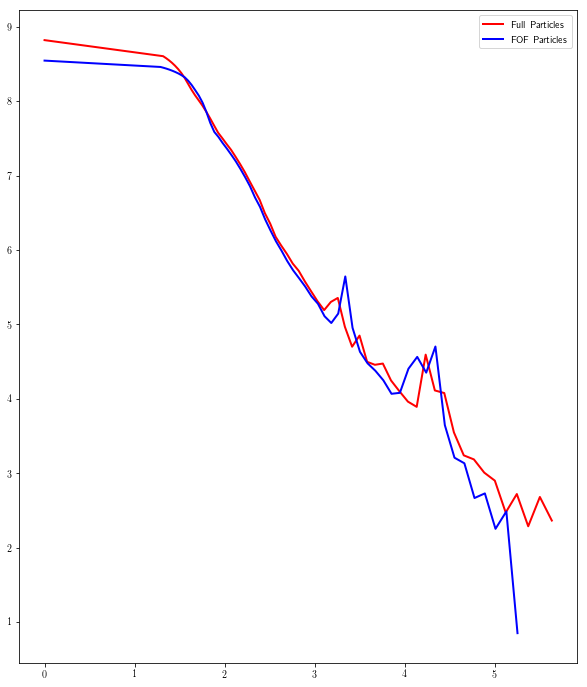

Galaxy 7
(17, u'subbox_017_ptlstr_Coordinates', u'subbox_017_ptlstr_Masses')
Pixel Scales: 13.0022490087, 5.3333 kpc/pixel


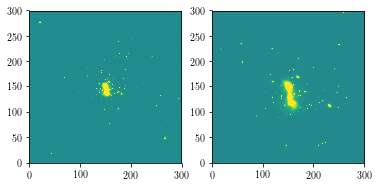

Measuring FULL PARTICLE profile
(24511652., 580, 514, 132, 169, 124, 156, 149.61587376, 148.74464629, 18.80580859, 22.06932742, 0.19827055, 0., 0., 0., 4.69907761, 4.33518267, 1.51033914, 0.0531801, 0.04531605, -0.00095554, 1.17566079e+12, 1.13376258e+12, 5.5753257e+10, 1.09026066e+11, 149, 148, 149, 148, 1)


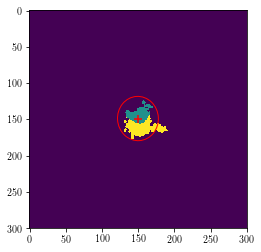

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.6158737584309 148.74464629410312
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_7_xy_full_particles.fits
###      Input Image   : temp_L5TQG.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

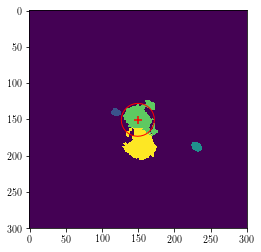

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.47090692232214 150.52839708211283
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_7_xy_full_particles.fits
###      Input Image   : temp_5F9NU.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

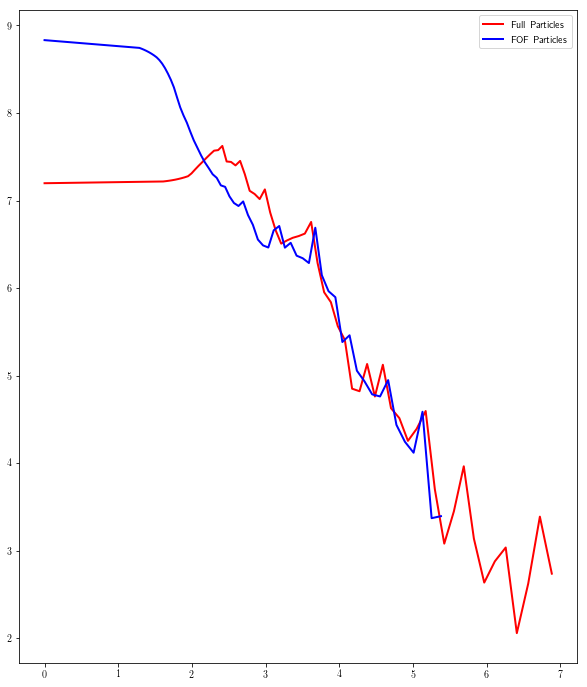

Galaxy 384
(18, u'subbox_018_ptlstr_Coordinates', u'subbox_018_ptlstr_Masses')
Pixel Scales: 3.94969330656, 5.3333 kpc/pixel


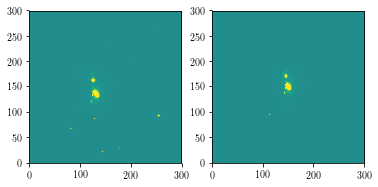

Measuring FULL PARTICLE profile
(24363928., 290, 271, 122, 139, 150, 174, 130.98248116, 163.14358392, 5.70937139, 6.47761917, 2.09526693, 0., 0., 0., 2.86769629, 1.9908061, 0.87605613, 0.1987427, 0.17517176, -0.12857163, 1.57443883e+11, 1.57667033e+11, 1.19522161e+10, 2.74082038e+10, 131, 163, 131, 163, 0)


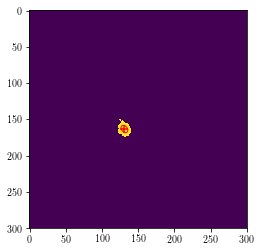

----------------------------------------------------------------------------------------------------
###      galX, galY :  130.98248116197783 163.14358392467273
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_384_xy_full_particles.fits
###      Input Image   : temp_DU5CQ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

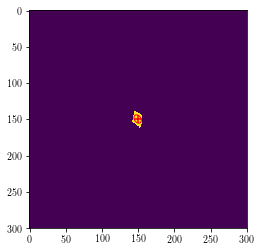

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.20282167139052 149.4081697259791
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_384_xy_full_particles.fits
###      Input Image   : temp_VK9FT.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

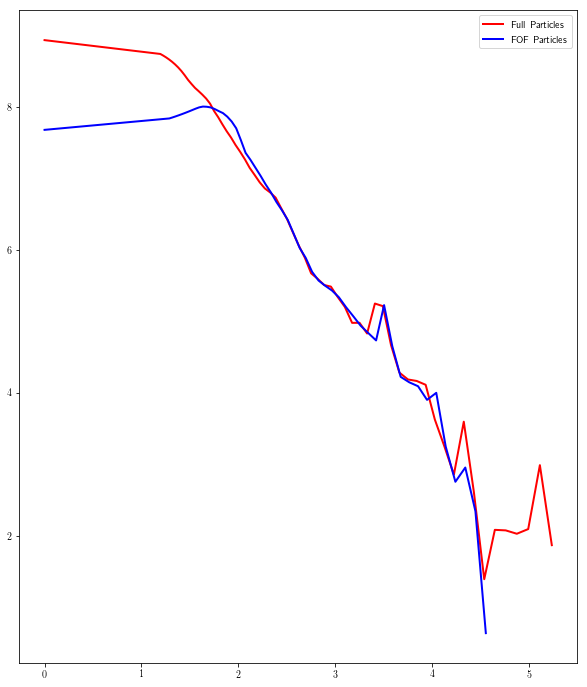

Galaxy 2
(19, u'subbox_019_ptlstr_Coordinates', u'subbox_019_ptlstr_Masses')
Pixel Scales: 14.1701145834, 5.3333 kpc/pixel


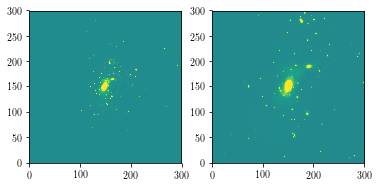

Measuring FULL PARTICLE profile
(33505096., 1914, 1769, 127, 176, 120, 191, 150.30002798, 149.52898343, 46.6222899, 113.61925998, -18.56598981, 0., 0., 0., 10.88210392, 6.46694422, -1.31775236, 0.02294183, 0.0094139, 0.00749763, 3.00424443e+12, 3.00587339e+12, 1.47725353e+11, 4.05283897e+11, 148, 150, 148, 150, 0)


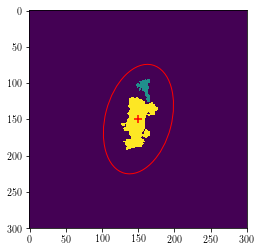

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.30002798167476 149.52898343477403
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_2_xy_full_particles.fits
###      Input Image   : temp_VEUOU.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

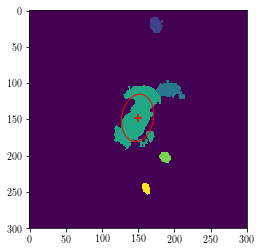

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.21088779887117 147.8569290134976
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_2_xy_full_particles.fits
###      Input Image   : temp_9MNC3.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

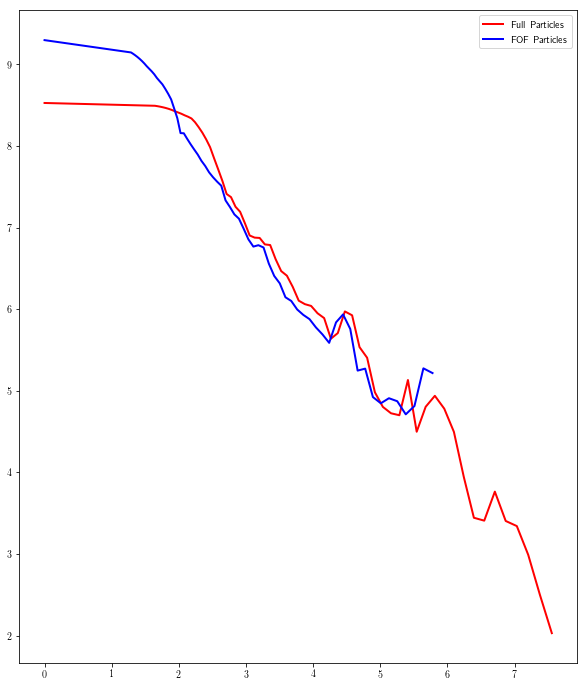

Galaxy 37
(20, u'subbox_020_ptlstr_Coordinates', u'subbox_020_ptlstr_Masses')
Pixel Scales: 8.76193422577, 5.3333 kpc/pixel


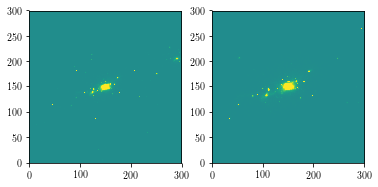

Measuring FULL PARTICLE profile
(23703832., 1075, 997, 106, 178, 129, 172, 149.38635806, 150.32851821, 60.46556632, 19.37876492, -24.82089003, 0., 0., 0., 8.49363613, 2.77533484, -0.43970609, 0.0348745, 0.10881533, 0.08933657, 1.1793831e+12, 1.1798859e+12, 7.82809498e+10, 1.7610462e+11, 149, 151, 149, 151, 1)


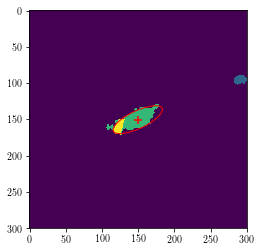

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.38635806092682 150.32851820588868
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_37_xy_full_particles.fits
###      Input Image   : temp_X3AIA.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

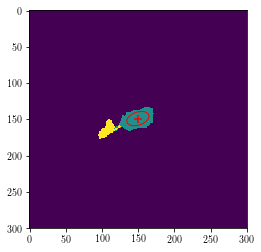

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.53374157657743 148.8526848443837
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_37_xy_full_particles.fits
###      Input Image   : temp_D32E1.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

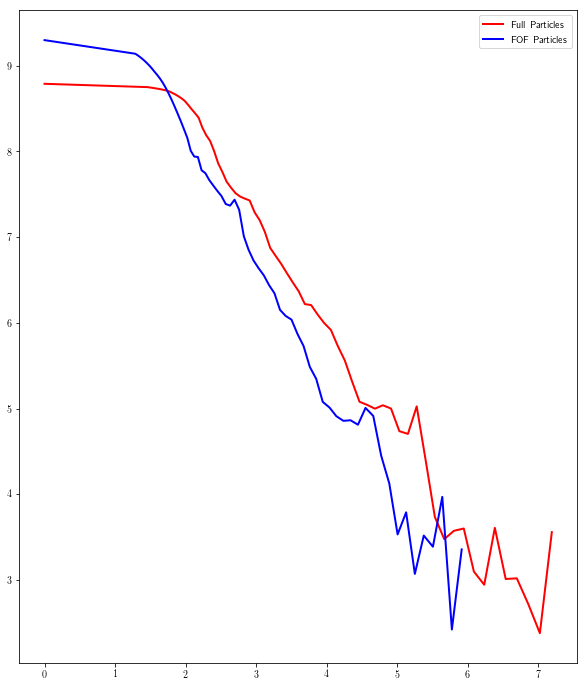

Galaxy 74
(21, u'subbox_021_ptlstr_Coordinates', u'subbox_021_ptlstr_Masses')
Pixel Scales: 6.92185503078, 5.3333 kpc/pixel


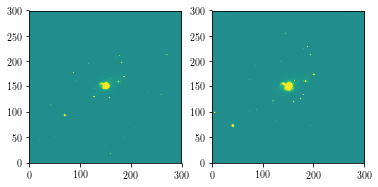

Measuring FULL PARTICLE profile
(25123532., 615, 580, 134, 166, 133, 159, 149.00374301, 147.2651707, 13.11124549, 7.42238913, 1.71399259, 0., 0., 0., 3.68615556, 2.63550615, 0.27115682, 0.0786445, 0.13892122, -0.03632148, 4.76041052e+11, 4.76371223e+11, 4.22768148e+10, 1.28655557e+11, 150, 148, 150, 148, 0)


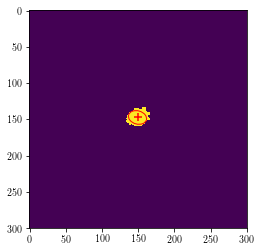

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.00374300740222 147.26517069653812
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_74_xy_full_particles.fits
###      Input Image   : temp_XZ5AU.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

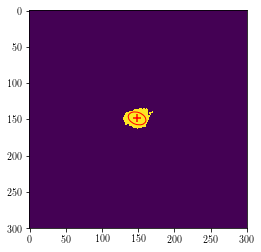

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.42131129036034 148.53201810796116
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_74_xy_full_particles.fits
###      Input Image   : temp_1HSN4.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

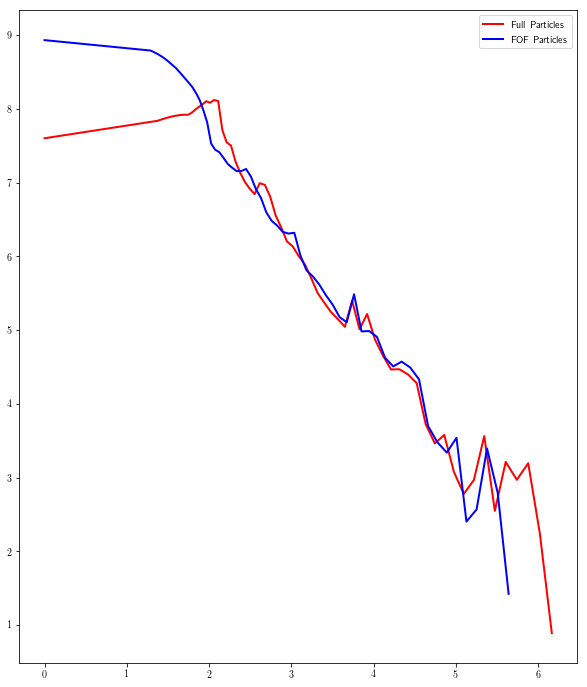

Galaxy 31
(22, u'subbox_022_ptlstr_Coordinates', u'subbox_022_ptlstr_Masses')
Pixel Scales: 8.98117372293, 5.3333 kpc/pixel


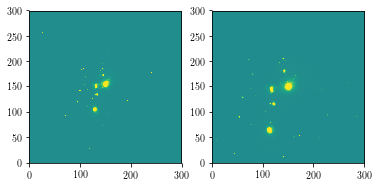

Measuring FULL PARTICLE profile
(29377556., 646, 612, 136, 163, 123, 156, 149.45999647, 144.73194122, 10.40346707, 40.01672425, 5.45725985, 0., 0., 0., 6.40237427, 3.07079697, 1.39423609, 0.10352786, 0.02691496, -0.02823711, 5.23544855e+11, 5.23821285e+11, 4.48679731e+10, 1.40266439e+11, 150, 145, 150, 145, 1)


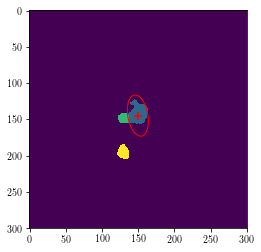

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.45999647035023 144.73194121604968
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_31_xy_full_particles.fits
###      Input Image   : temp_2EMYL.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

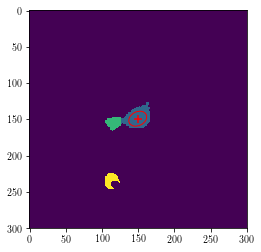

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.30095729712815 148.97054397255573
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_31_xy_full_particles.fits
###      Input Image   : temp_VQEIY.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

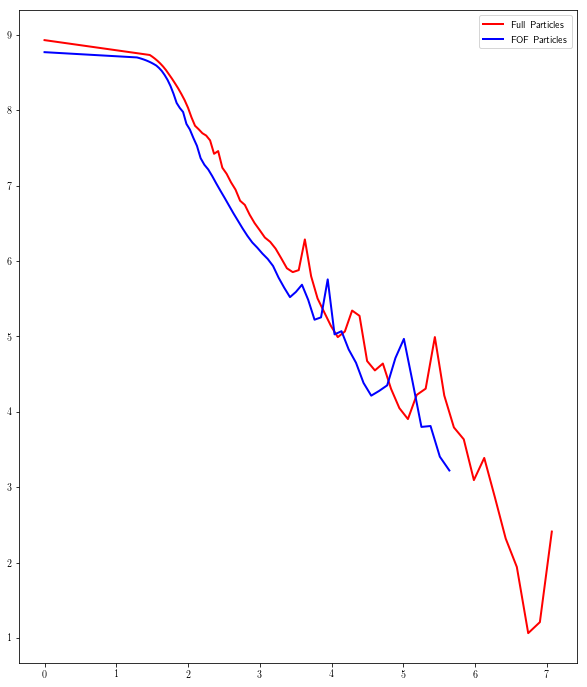

Galaxy 198
(23, u'subbox_023_ptlstr_Coordinates', u'subbox_023_ptlstr_Masses')
Pixel Scales: 5.30078995778, 5.3333 kpc/pixel


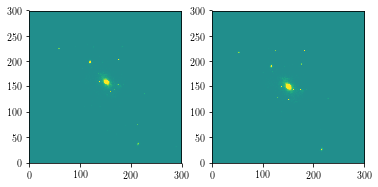

Measuring FULL PARTICLE profile
(15518738., 536, 506, 136, 164, 122, 154, 151.12150687, 140.64872458, 8.38611818, 8.66877011, 3.48357708, 0., 0., 0., 3.46610546, 2.24521756, 0.80567163, 0.14313872, 0.13847157, -0.11504164, 1.72430328e+11, 1.72680069e+11, 2.09346867e+10, 5.99223296e+10, 151, 141, 151, 141, 0)


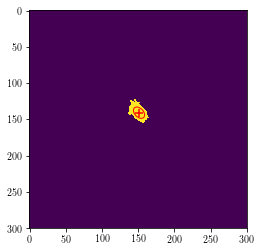

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.12150687099157 140.64872457671459
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_198_xy_full_particles.fits
###      Input Image   : temp_XINML.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

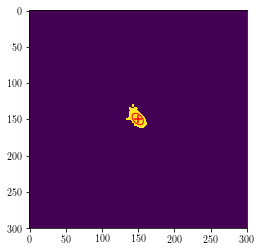

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.32638983164594 149.31401526326655
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_198_xy_full_particles.fits
###      Input Image   : temp_MBOO3.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

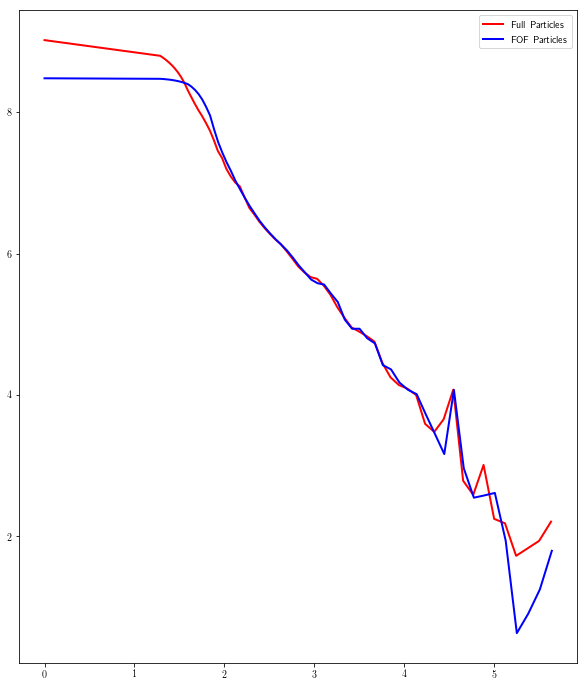

Galaxy 178
(24, u'subbox_024_ptlstr_Coordinates', u'subbox_024_ptlstr_Masses')
Pixel Scales: 5.3642850415, 5.3333 kpc/pixel


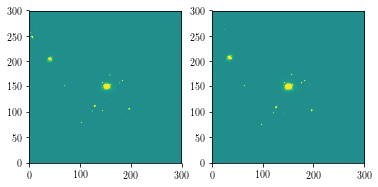

Measuring FULL PARTICLE profile
(11416879., 572, 537, 138, 170, 138, 160, 152.08184858, 149.21253492, 8.44739201, 5.12019779, 0.1666548, 0., 0., 0., 2.90787196, 2.26094484, 0.04992213, 0.1184558, 0.19543044, -0.00771112, 2.14250242e+11, 2.14391783e+11, 2.44163338e+10, 7.16581192e+10, 152, 149, 152, 149, 0)


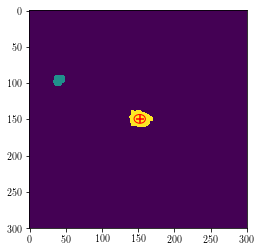

----------------------------------------------------------------------------------------------------
###      galX, galY :  152.08184858324722 149.21253492009964
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_178_xy_full_particles.fits
###      Input Image   : temp_WGCR6.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

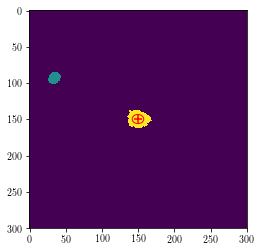

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.61321396989112 149.4678219247581
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_178_xy_full_particles.fits
###      Input Image   : temp_9IOVY.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

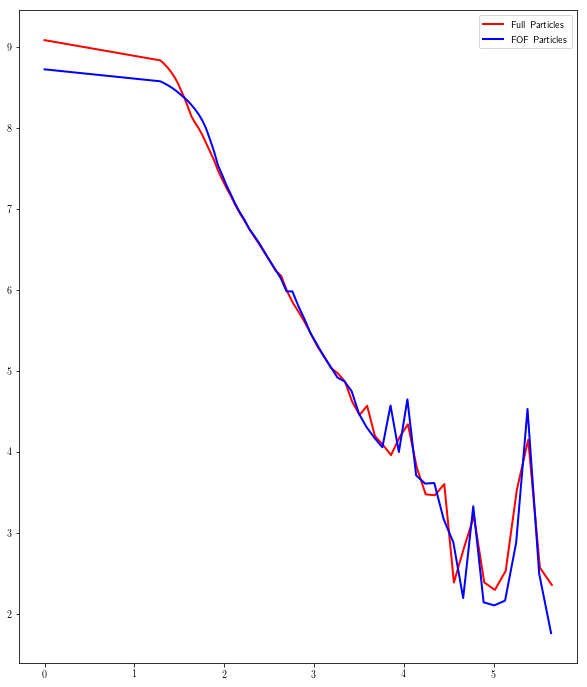

Galaxy 17
(25, u'subbox_025_ptlstr_Coordinates', u'subbox_025_ptlstr_Masses')
Pixel Scales: 8.25952875245, 5.3333 kpc/pixel


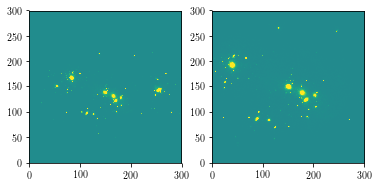

Measuring FULL PARTICLE profile
(27353752., 306, 282, 139, 163, 152, 170, 149.19050807, 160.20829754, 5.09962921, 5.94852054, -0.7901532, 0., 0., 0., 2.53397155, 2.15107822, -1.0318675, 0.20021336, 0.17164165, 0.05318944, 1.86440745e+11, 1.866588e+11, 2.33365565e+10, 7.79643044e+10, 149, 160, 149, 160, 1)


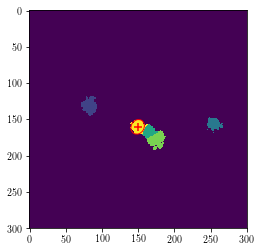

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.19050806681037 160.20829754160823
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_17_xy_full_particles.fits
###      Input Image   : temp_P8YFP.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

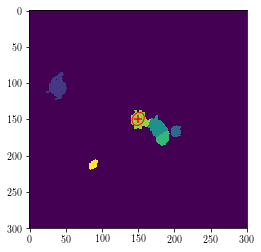

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.960640134305 149.26203647346844
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_17_xy_full_particles.fits
###      Input Image   : temp_T79UY.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

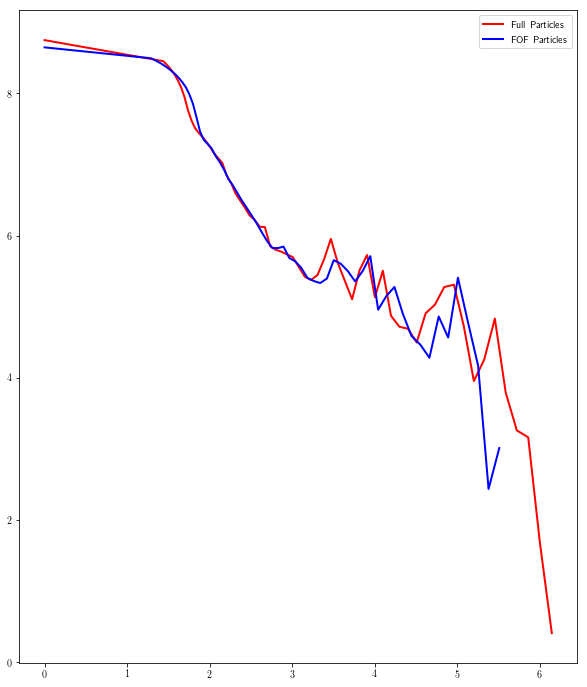

Galaxy 77
(26, u'subbox_026_ptlstr_Coordinates', u'subbox_026_ptlstr_Masses')
Pixel Scales: 6.1874456374, 5.3333 kpc/pixel


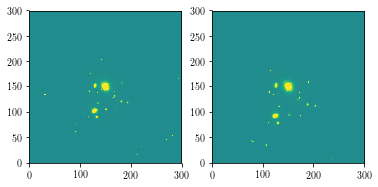

Measuring FULL PARTICLE profile
(33896924., 465, 442, 138, 160, 137, 162, 149.45916653, 149.49123357, 7.22041882, 8.83023602, 0.94101875, 0., 0., 0., 3.0436213, 2.60519195, 1.13919663, 0.14044675, 0.11484227, -0.0299342, 2.85236888e+11, 2.85517283e+11, 2.08499589e+10, 4.29214597e+10, 150, 150, 150, 150, 0)


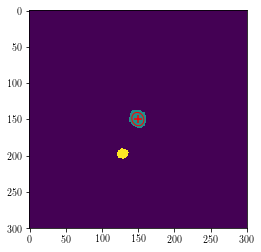

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.4591665283128 149.4912335690329
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_77_xy_full_particles.fits
###      Input Image   : temp_FDNEU.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

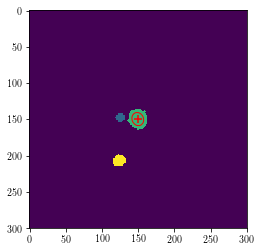

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.38537532951275 149.50396790257074
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_77_xy_full_particles.fits
###      Input Image   : temp_BT26G.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

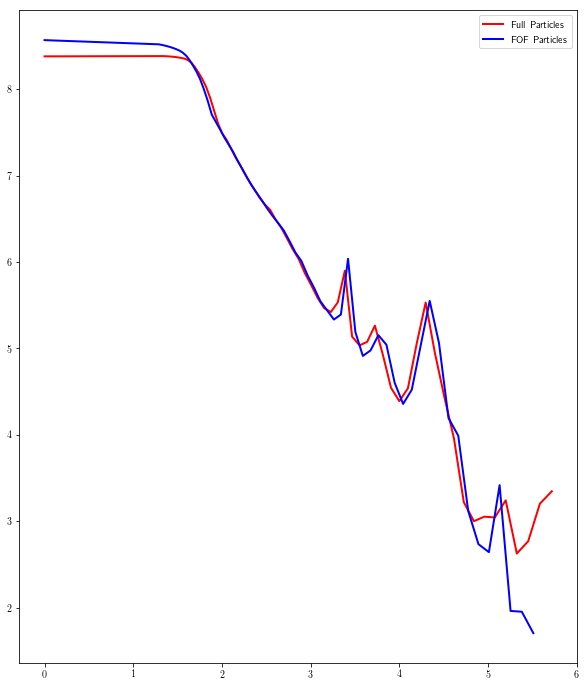

Galaxy 222
(27, u'subbox_027_ptlstr_Coordinates', u'subbox_027_ptlstr_Masses')
Pixel Scales: 4.72694710641, 5.3333 kpc/pixel


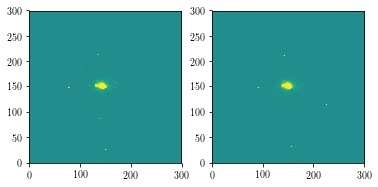

Measuring FULL PARTICLE profile
(17791362., 581, 548, 126, 163, 136, 160, 142.16422668, 148.60144488, 20.71303302, 5.86541722, 3.02797129, 0., 0., 0., 4.61592913, 2.29600716, 0.19363751, 0.05221968, 0.18440767, -0.05391592, 2.08528359e+11, 2.08710304e+11, 1.47477688e+10, 3.29317704e+10, 144, 149, 144, 149, 0)


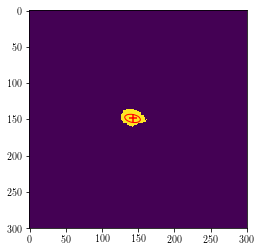

----------------------------------------------------------------------------------------------------
###      galX, galY :  142.16422667951062 148.6014448830194
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_222_xy_full_particles.fits
###      Input Image   : temp_LYXMQ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

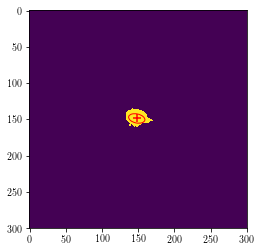

----------------------------------------------------------------------------------------------------
###      galX, galY :  147.95022654148735 148.6324055853179
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_222_xy_full_particles.fits
###      Input Image   : temp_AQMR8.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

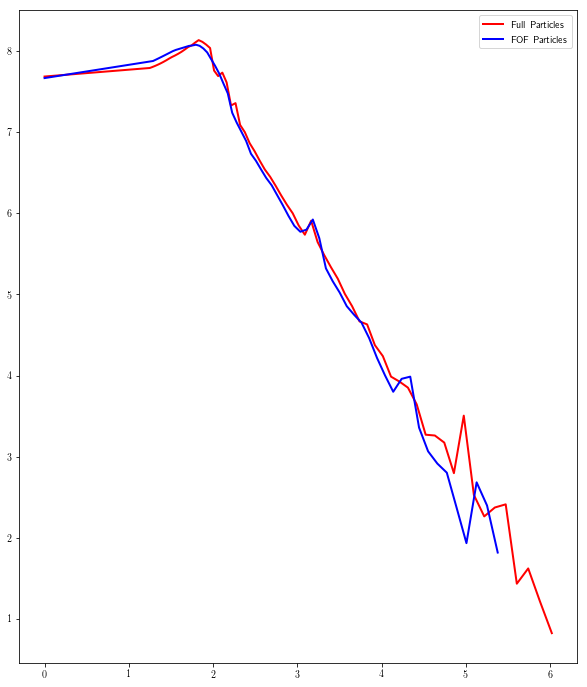

Galaxy 164
(28, u'subbox_028_ptlstr_Coordinates', u'subbox_028_ptlstr_Masses')
Pixel Scales: 5.70654330761, 5.3333 kpc/pixel


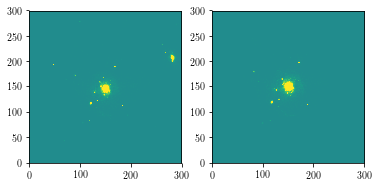

Measuring FULL PARTICLE profile
(21173082., 760, 702, 125, 163, 138, 172, 147.87853296, 153.63661694, 32.47512083, 25.97671736, 0.42576038, 0., 0., 0., 5.70113134, 5.09401035, 0.06514652, 0.03079942, 0.03850428, -0.00100961, 3.1483016e+11, 3.15156169e+11, 1.58079816e+10, 3.75552164e+10, 150, 154, 150, 154, 0)


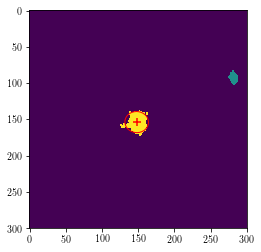

----------------------------------------------------------------------------------------------------
###      galX, galY :  147.87853296474026 153.63661694024324
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_164_xy_full_particles.fits
###      Input Image   : temp_2S7RW.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

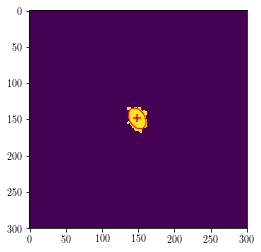

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.49832677694528 148.6001319834465
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_164_xy_full_particles.fits
###      Input Image   : temp_8DFZB.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

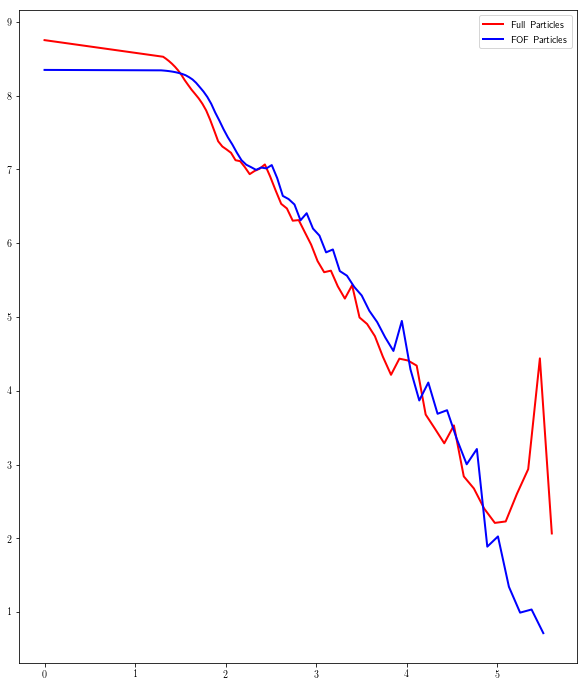

Galaxy 80
(29, u'subbox_029_ptlstr_Coordinates', u'subbox_029_ptlstr_Masses')
Pixel Scales: 6.80173071975, 5.3333 kpc/pixel


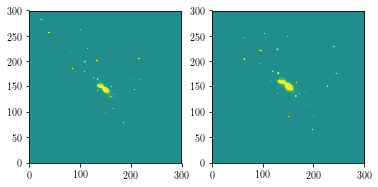

Measuring FULL PARTICLE profile
(20481398., 725, 676, 131, 172, 132, 175, 147.1267451, 153.26061886, 34.78077752, 41.38735478, 32.81677762, 0., 0., 0., 8.43010521, 2.25864029, 0.83555847, 0.11415832, 0.09593546, -0.18103637, 4.14629233e+11, 4.15043617e+11, 3.34263153e+10, 1.05381282e+11, 149, 155, 149, 155, 0)


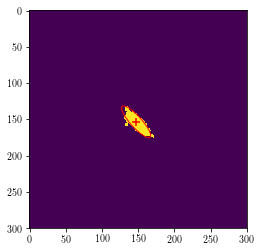

----------------------------------------------------------------------------------------------------
###      galX, galY :  147.12674510310185 153.26061886423196
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_80_xy_full_particles.fits
###      Input Image   : temp_3QCCB.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

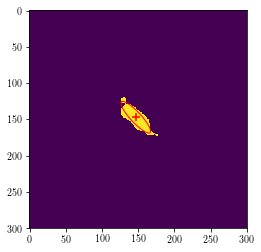

----------------------------------------------------------------------------------------------------
###      galX, galY :  146.63714456829535 146.92741240789263
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_80_xy_full_particles.fits
###      Input Image   : temp_FN94M.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

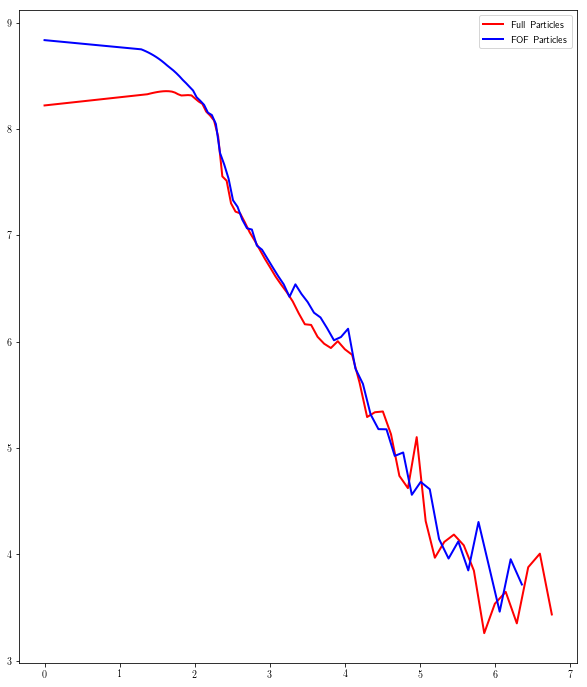

Galaxy 221
(30, u'subbox_030_ptlstr_Coordinates', u'subbox_030_ptlstr_Masses')
Pixel Scales: 4.87548777681, 5.3333 kpc/pixel


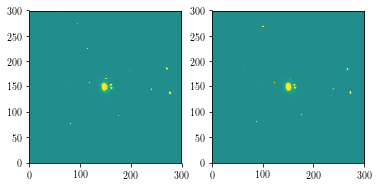

Measuring FULL PARTICLE profile
(11200054., 587, 555, 137, 165, 133, 165, 148.98264139, 149.90446367, 20.7170852, 8.30061033, 0.49192779, 0., 0., 0., 4.55373955, 2.8776989, 0.03953635, 0.04833736, 0.12064284, -0.00572934, 1.98038831e+11, 1.9819425e+11, 1.52504535e+10, 3.35229276e+10, 147, 150, 147, 150, 0)


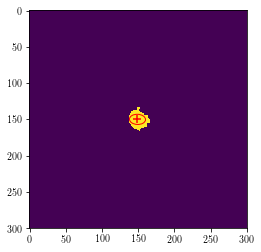

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.98264139059074 149.9044636735355
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_221_xy_full_particles.fits
###      Input Image   : temp_M1U4K.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

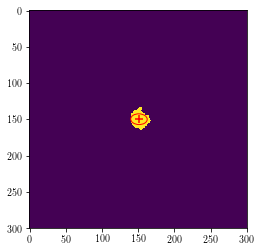

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.99137992640692 149.65555230243362
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_221_xy_full_particles.fits
###      Input Image   : temp_1FOG3.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

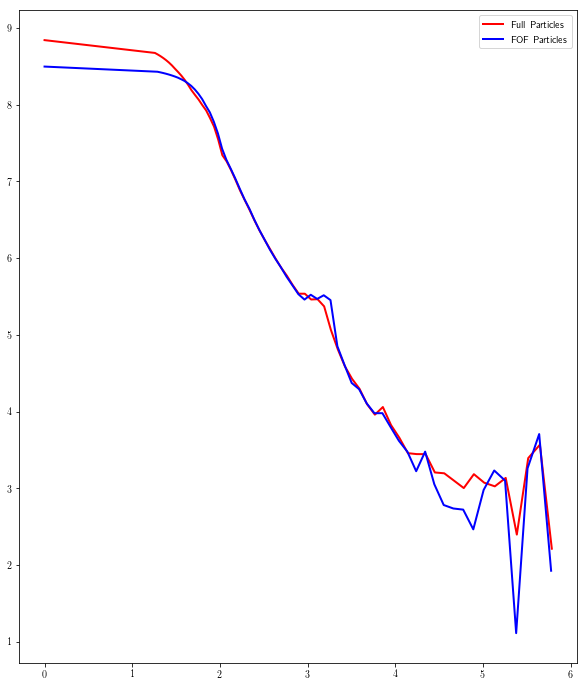

Galaxy 57
(31, u'subbox_031_ptlstr_Coordinates', u'subbox_031_ptlstr_Masses')
Pixel Scales: 6.797229416, 5.3333 kpc/pixel


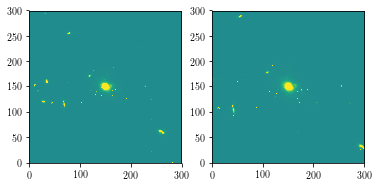

Measuring FULL PARTICLE profile
(21584750., 873, 811, 132, 171, 133, 170, 150.31927128, 149.86920214, 17.59196669, 10.44382824, 3.88579581, 0., 0., 0., 4.3928833, 2.956074, 0.41358051, 0.0619341, 0.10432407, -0.04608718, 5.07557544e+11, 5.07862024e+11, 2.8894935e+10, 5.35025705e+10, 149, 149, 149, 149, 0)


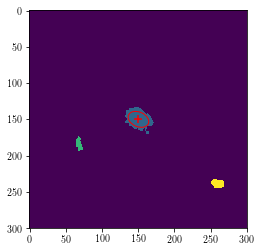

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.31927128414515 149.86920213687856
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_57_xy_full_particles.fits
###      Input Image   : temp_8R33V.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

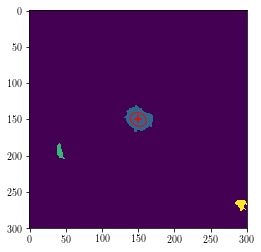

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.2006539028561 149.9700914923761
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_57_xy_full_particles.fits
###      Input Image   : temp_4YDGU.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

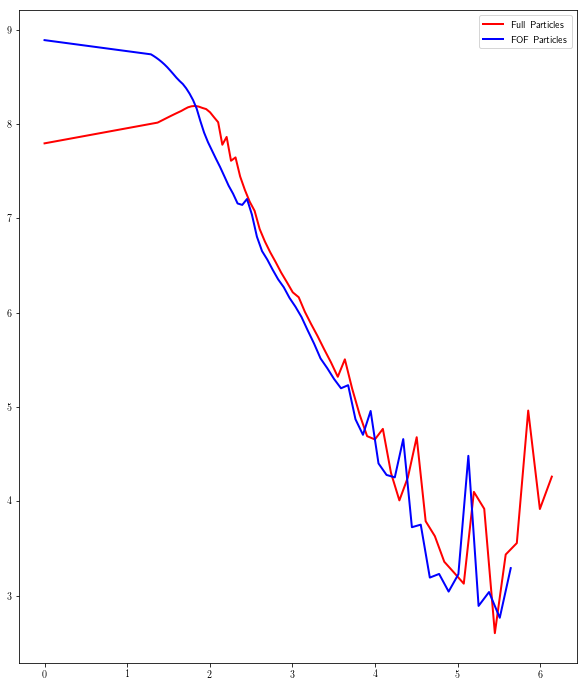

Galaxy 189
(32, u'subbox_032_ptlstr_Coordinates', u'subbox_032_ptlstr_Masses')
Pixel Scales: 5.34451850889, 5.3333 kpc/pixel


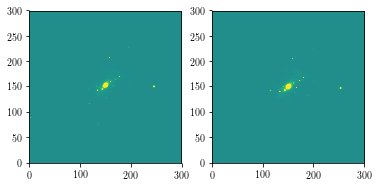

Measuring FULL PARTICLE profile
(21643148., 427, 395, 132, 162, 136, 163, 148.8116441, 147.77808824, 12.82007337, 10.53123739, -8.84360729, 0., 0., 0., 4.53795147, 1.66081548, -0.72105265, 0.18540308, 0.22569819, 0.3113845, 1.78191876e+11, 1.78380358e+11, 2.15174636e+10, 6.56064963e+10, 150, 147, 150, 147, 0)


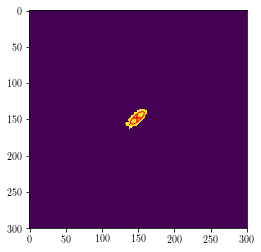

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.81164410156433 147.77808823694804
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_189_xy_full_particles.fits
###      Input Image   : temp_FLXIS.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

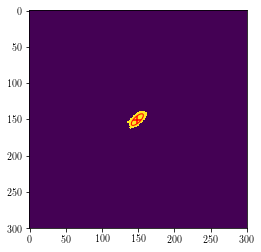

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.75264328922046 150.21943558494473
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_189_xy_full_particles.fits
###      Input Image   : temp_NM6UF.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

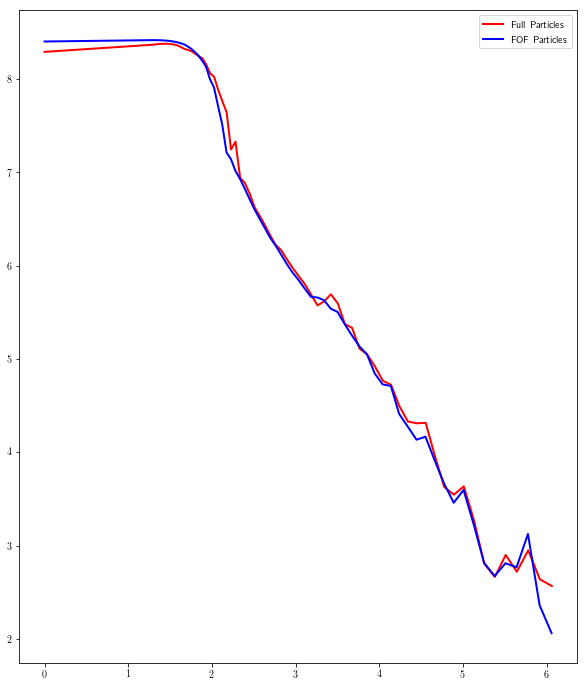

Galaxy 96
(33, u'subbox_033_ptlstr_Coordinates', u'subbox_033_ptlstr_Masses')
Pixel Scales: 6.29191722801, 5.3333 kpc/pixel


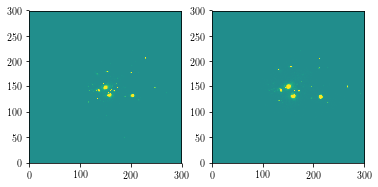

Measuring FULL PARTICLE profile
(27143748., 337, 310, 130, 162, 143, 160, 149.21384233, 151.14511768, 32.77262127, 7.46383325, -12.1195281, 0., 0., 0., 6.13515425, 1.61131525, -0.38190582, 0.07637478, 0.33535069, 0.24802972, 1.86713686e+11, 1.87423474e+11, 2.37345915e+10, 7.66180966e+10, 149, 151, 149, 151, 1)


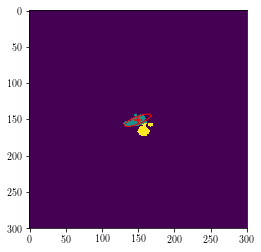

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.21384232698284 151.14511767758887
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_96_xy_full_particles.fits
###      Input Image   : temp_GGA8K.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

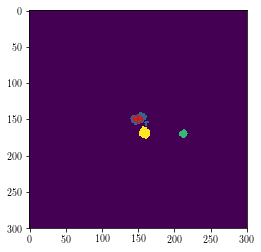

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.52286490127494 149.47895167637205
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_96_xy_full_particles.fits
###      Input Image   : temp_UYQFM.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

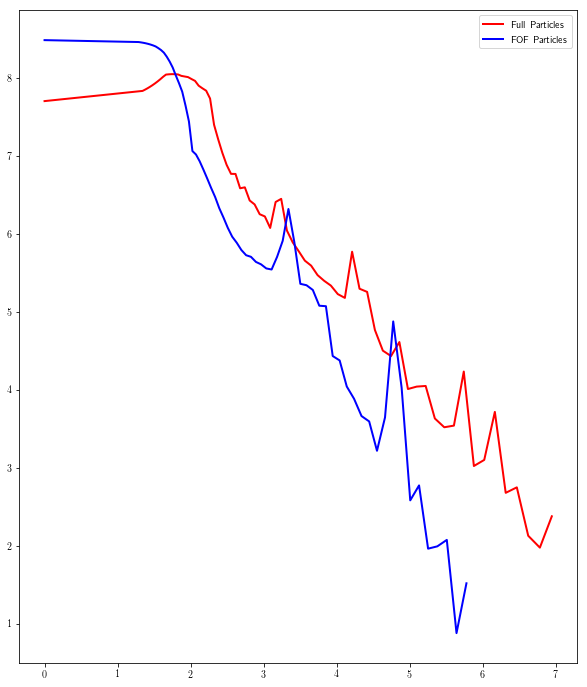

Galaxy 327
(34, u'subbox_034_ptlstr_Coordinates', u'subbox_034_ptlstr_Masses')
Pixel Scales: 3.6377186228, 5.3333 kpc/pixel


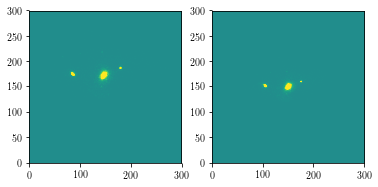

Measuring FULL PARTICLE profile
(16329412., 490, 465, 135, 158, 114, 141, 146.39982325, 127.46180657, 6.49397216, 9.90535386, -2.38022285, 0., 0., 0., 3.33585763, 2.29594851, -1.09629154, 0.16886151, 0.11070599, 0.08115369, 1.66275367e+11, 1.66392365e+11, 1.02634701e+10, 1.94705838e+10, 147, 127, 147, 127, 0)


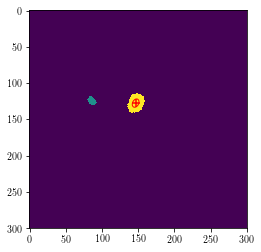

----------------------------------------------------------------------------------------------------
###      galX, galY :  146.39982325478906 127.46180656715458
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_327_xy_full_particles.fits
###      Input Image   : temp_0CV88.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

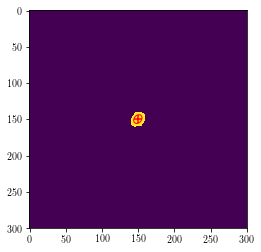

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.44743315295335 149.53825329038435
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_327_xy_full_particles.fits
###      Input Image   : temp_VMJUH.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

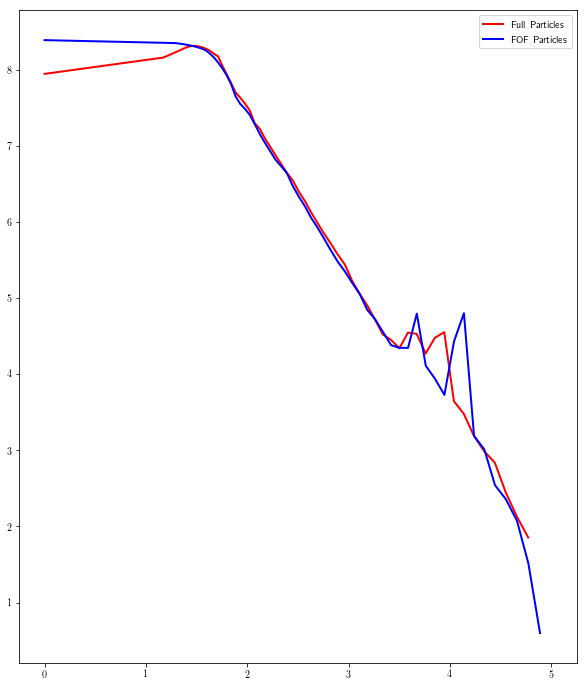

Galaxy 100
(35, u'subbox_035_ptlstr_Coordinates', u'subbox_035_ptlstr_Masses')
Pixel Scales: 6.53938711433, 5.3333 kpc/pixel


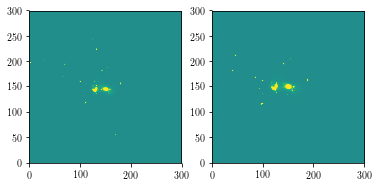

Measuring FULL PARTICLE profile
(22648658., 375, 355, 137, 165, 147, 165, 150.83020737, 154.13486464, 12.65907287, 3.04606224, 1.18393074, 0., 0., 0., 3.57809138, 1.70364237, 0.12075532, 0.08197455, 0.34067652, -0.06372305, 2.02237755e+11, 2.02429858e+11, 2.49853379e+10, 7.93163612e+10, 150, 154, 150, 154, 1)


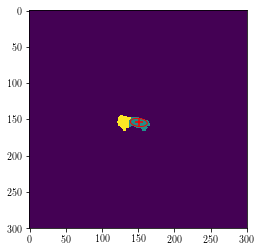

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.83020737205084 154.1348646403044
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_100_xy_full_particles.fits
###      Input Image   : temp_YEKOY.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

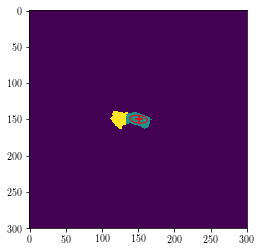

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.46444550631784 149.64626256896008
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_100_xy_full_particles.fits
###      Input Image   : temp_7ZWBA.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

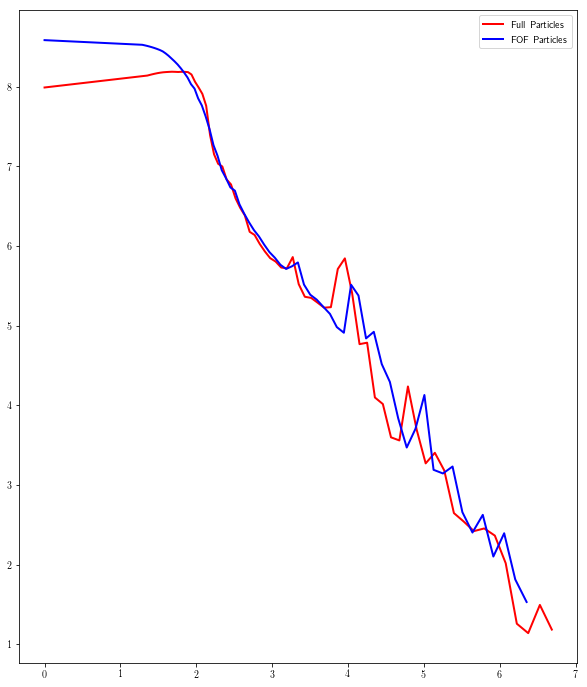

Galaxy 220
(36, u'subbox_036_ptlstr_Coordinates', u'subbox_036_ptlstr_Masses')
Pixel Scales: 5.36091522594, 5.3333 kpc/pixel


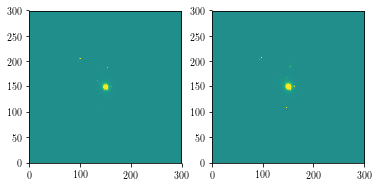

Measuring FULL PARTICLE profile
(20199148., 406, 384, 139, 162, 138, 162, 149.96857711, 150.20227392, 4.23690913, 4.65980708, 0.52222014, 0., 0., 0., 2.23869658, 1.97102857, 0.97776151, 0.23932695, 0.21760698, -0.05364229, 2.17363038e+11, 2.17511231e+11, 3.03930286e+10, 9.70384589e+10, 150, 150, 150, 150, 0)


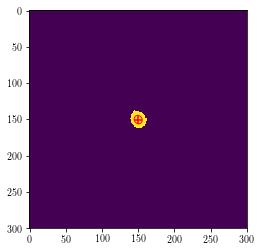

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.96857711424025 150.2022739196069
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_220_xy_full_particles.fits
###      Input Image   : temp_SG977.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

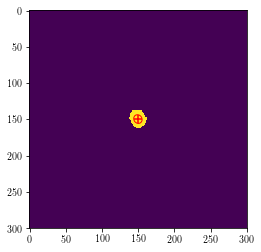

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.5595255118024 149.4937921659636
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_220_xy_full_particles.fits
###      Input Image   : temp_J7O4M.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

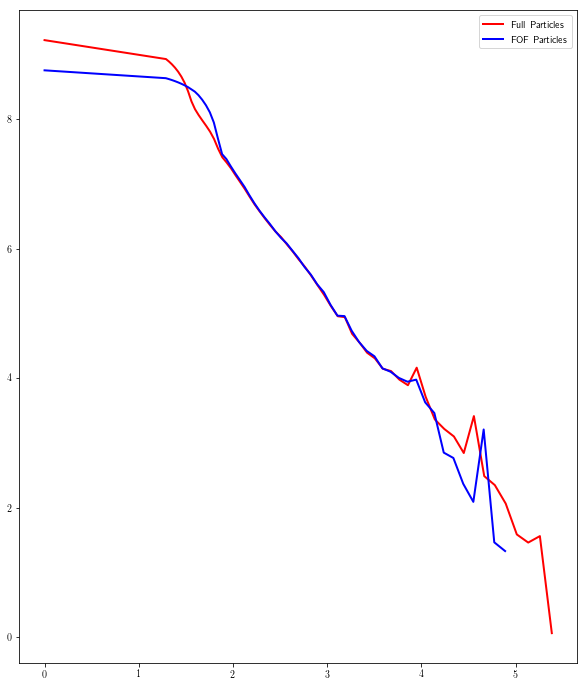

Galaxy 11
(37, u'subbox_037_ptlstr_Coordinates', u'subbox_037_ptlstr_Masses')
Pixel Scales: 11.665748964, 5.3333 kpc/pixel


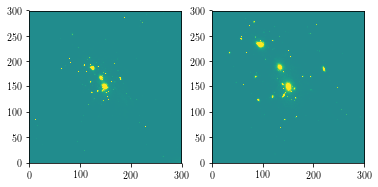

Measuring FULL PARTICLE profile
(36734692., 656, 616, 130, 160, 123, 170, 147.7630408, 150.51148019, 20.35677675, 20.82002728, -5.14314652, 0., 0., 0., 5.0731411, 3.92938185, -0.80790079, 0.05239368, 0.05122791, 0.0258855, 8.07374356e+11, 8.0762726e+11, 5.42725857e+10, 1.43542911e+11, 148, 149, 148, 149, 1)


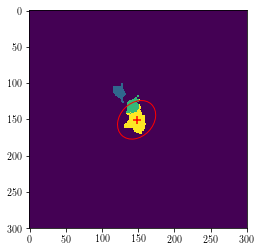

----------------------------------------------------------------------------------------------------
###      galX, galY :  147.76304079974966 150.51148019489193
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_11_xy_full_particles.fits
###      Input Image   : temp_WM34W.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

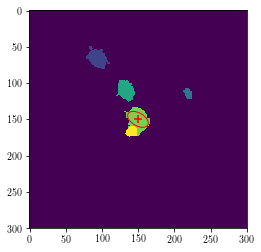

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.62969696094527 149.89302493881502
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_11_xy_full_particles.fits
###      Input Image   : temp_I1AQ6.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

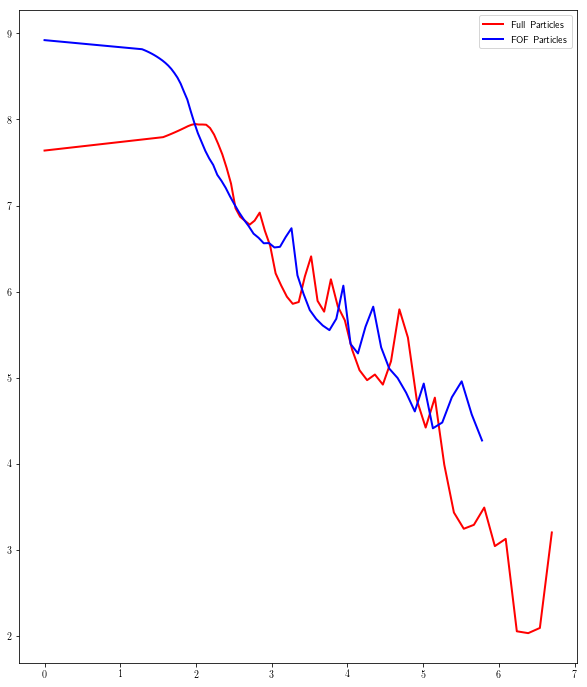

Galaxy 128
(38, u'subbox_038_ptlstr_Coordinates', u'subbox_038_ptlstr_Masses')
Pixel Scales: 6.11910802545, 5.3333 kpc/pixel


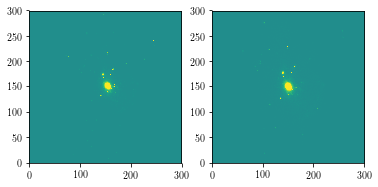

Measuring FULL PARTICLE profile
(21584242., 657, 602, 143, 173, 129, 166, 154.35220988, 148.41328619, 9.99359882, 11.37079201, 1.71864556, 0., 0., 0., 3.54029036, 2.97165513, 0.97593677, 0.10273445, 0.09029159, -0.03105573, 2.98573627e+11, 2.98807001e+11, 2.80218173e+10, 7.74741361e+10, 154, 148, 154, 148, 1)


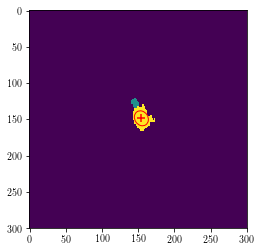

----------------------------------------------------------------------------------------------------
###      galX, galY :  154.35220987616225 148.4132861921781
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_128_xy_full_particles.fits
###      Input Image   : temp_V05G8.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

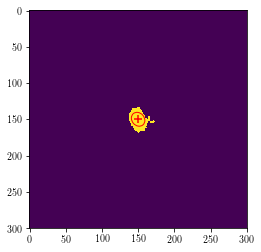

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.82964691913256 149.76483389318292
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_128_xy_full_particles.fits
###      Input Image   : temp_KA4MB.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

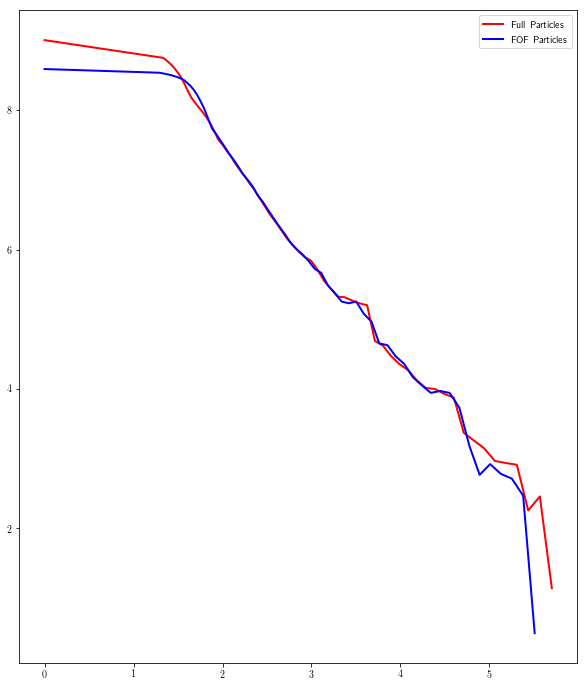

Galaxy 273
(39, u'subbox_039_ptlstr_Coordinates', u'subbox_039_ptlstr_Masses')
Pixel Scales: 4.74947177317, 5.3333 kpc/pixel


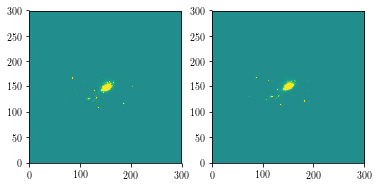

Measuring FULL PARTICLE profile
(12234295., 637, 605, 135, 168, 137, 164, 152.00551986, 151.23921417, 17.01995998, 11.09908442, -6.2068065, 0., 0., 0., 4.57560873, 2.68008375, -0.56287241, 0.07380617, 0.11317853, 0.08254746, 2.23301681e+11, 2.23478809e+11, 1.38736865e+10, 3.11319327e+10, 152, 152, 152, 152, 0)


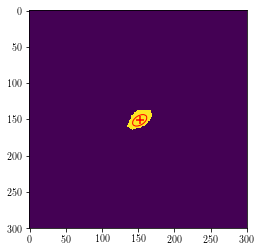

----------------------------------------------------------------------------------------------------
###      galX, galY :  152.00551985651717 151.239214167589
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_273_xy_full_particles.fits
###      Input Image   : temp_QX2LM.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

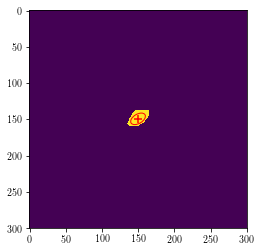

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.7265851742395 149.160718102854
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_273_xy_full_particles.fits
###      Input Image   : temp_FTD5W.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

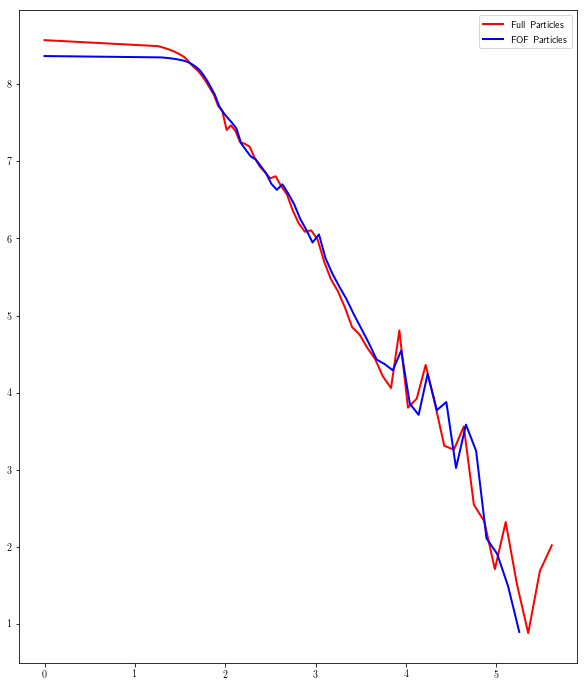

Galaxy 424
(40, u'subbox_040_ptlstr_Coordinates', u'subbox_040_ptlstr_Masses')
Pixel Scales: 4.11615520713, 5.3333 kpc/pixel


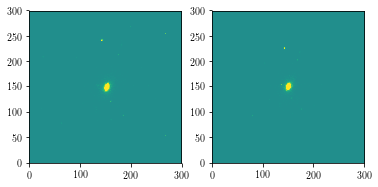

Measuring FULL PARTICLE profile
(19407012., 335, 317, 143, 162, 139, 162, 152.247298, 150.83313137, 3.50287331, 6.54779478, -1.30980086, 0., 0., 0., 2.65210915, 1.73694706, -1.21556938, 0.30855963, 0.16507012, 0.12344665, 1.63783672e+11, 1.63929571e+11, 1.58476472e+10, 4.30851932e+10, 152, 151, 152, 151, 0)


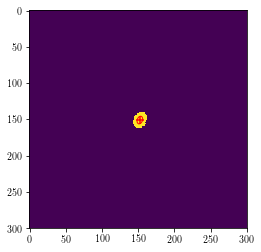

----------------------------------------------------------------------------------------------------
###      galX, galY :  152.2472979960144 150.8331313713003
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_424_xy_full_particles.fits
###      Input Image   : temp_X0JUM.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

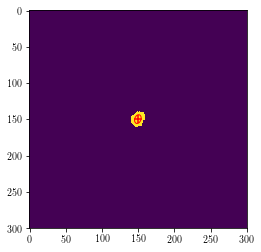

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.49270537740202 149.52869437605
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_424_xy_full_particles.fits
###      Input Image   : temp_RYPWM.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

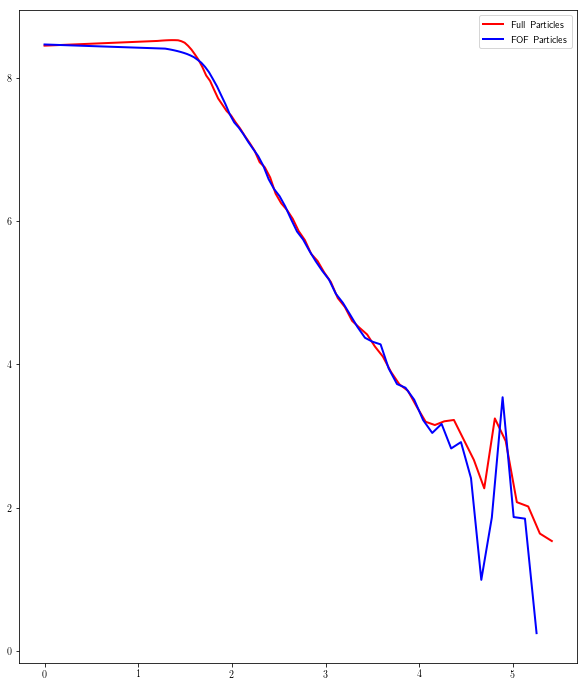

Galaxy 360
(41, u'subbox_041_ptlstr_Coordinates', u'subbox_041_ptlstr_Masses')
Pixel Scales: 4.05107547899, 5.3333 kpc/pixel


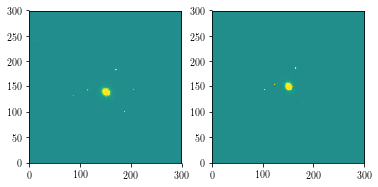

Measuring FULL PARTICLE profile
(13791894., 437, 419, 139, 162, 148, 172, 150.67586541, 160.12427925, 6.39217326, 6.82233971, 1.09720941, 0., 0., 0., 2.77945113, 2.3428967, 0.88218462, 0.16088258, 0.15073851, -0.05174819, 1.8567263e+11, 1.85823625e+11, 1.40048947e+10, 2.93541028e+10, 151, 160, 151, 160, 0)


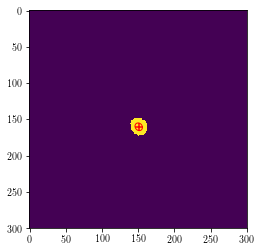

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.67586541364318 160.1242792486981
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_360_xy_full_particles.fits
###      Input Image   : temp_RBM19.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

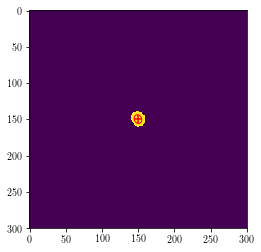

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.59717383697713 149.46893851310995
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_360_xy_full_particles.fits
###      Input Image   : temp_NSF3K.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

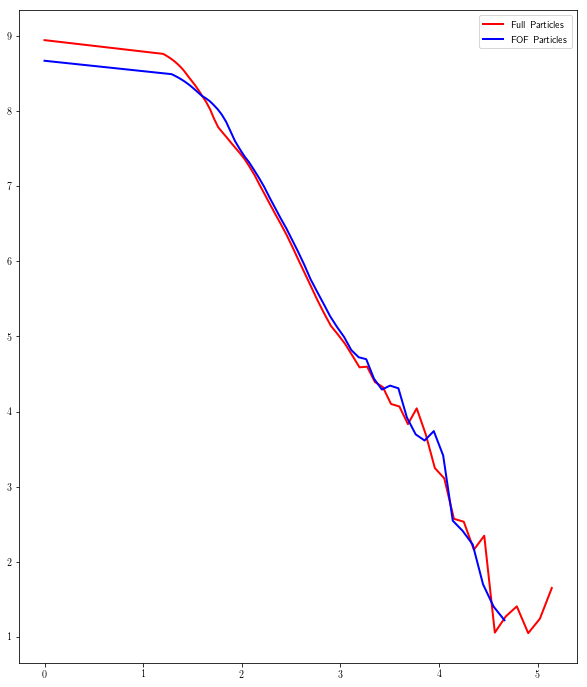

Galaxy 122
(42, u'subbox_042_ptlstr_Coordinates', u'subbox_042_ptlstr_Masses')
Pixel Scales: 5.7861746934, 5.3333 kpc/pixel


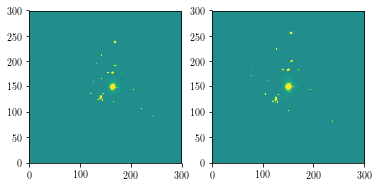

Measuring FULL PARTICLE profile
(23889876., 442, 412, 153, 180, 133, 164, 163.7391088, 150.08020713, 6.09910274, 7.35259507, -0.16191642, 0., 0., 0., 2.7153585, 2.4654665, -1.44438791, 0.16405445, 0.13608596, 0.00722551, 1.72182553e+11, 1.72426592e+11, 1.75958999e+10, 4.37062369e+10, 164, 150, 164, 150, 0)


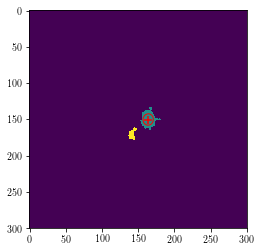

----------------------------------------------------------------------------------------------------
###      galX, galY :  163.7391087964376 150.08020712989432
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_122_xy_full_particles.fits
###      Input Image   : temp_XHO9J.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

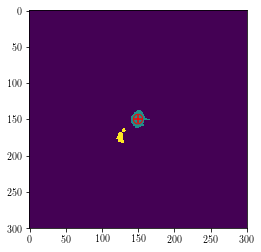

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.6671609757821 149.4890813976539
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_122_xy_full_particles.fits
###      Input Image   : temp_DG8F0.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

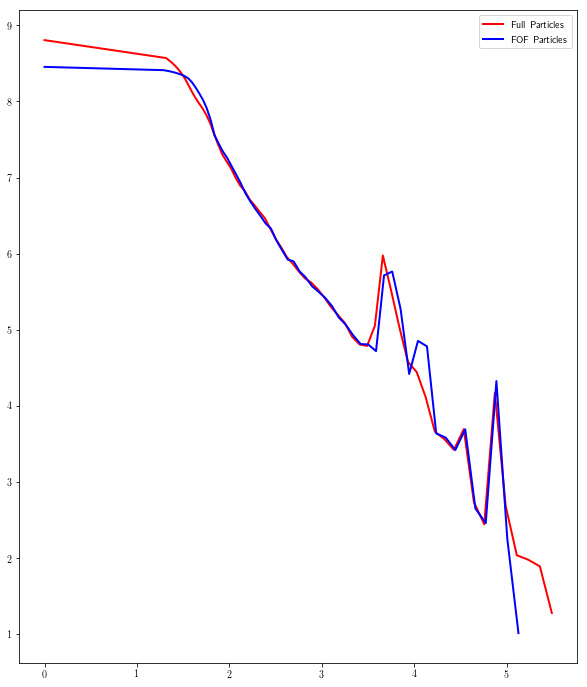

Galaxy 79
(43, u'subbox_043_ptlstr_Coordinates', u'subbox_043_ptlstr_Masses')
Pixel Scales: 6.63714808842, 5.3333 kpc/pixel


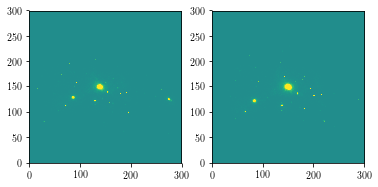

Measuring FULL PARTICLE profile
(21999992., 597, 565, 123, 156, 138, 162, 139.55492933, 150.54411804, 12.70732546, 7.38223349, 4.9113648, 0., 0., 0., 3.95366025, 2.11142826, 0.5370118, 0.10593425, 0.18234874, -0.14095511, 3.70365334e+11, 3.70630197e+11, 2.72890122e+10, 5.46580398e+10, 139, 150, 139, 150, 0)


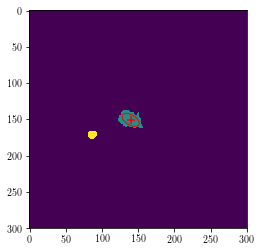

----------------------------------------------------------------------------------------------------
###      galX, galY :  139.55492933016038 150.54411803631677
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_79_xy_full_particles.fits
###      Input Image   : temp_8I87K.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

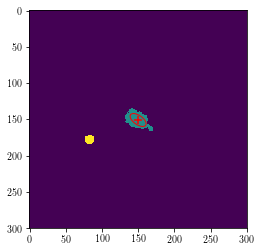

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.8343734215955 150.76698653587948
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_79_xy_full_particles.fits
###      Input Image   : temp_184UD.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

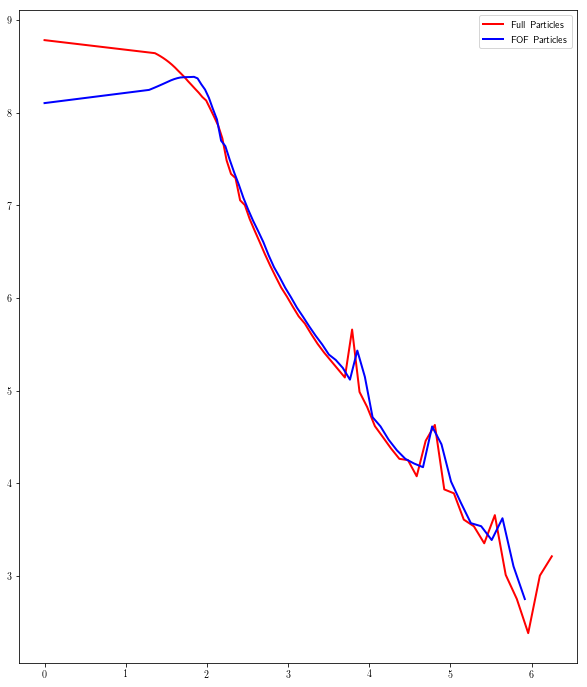

Galaxy 194
(44, u'subbox_044_ptlstr_Coordinates', u'subbox_044_ptlstr_Masses')
Pixel Scales: 4.8513712611, 5.3333 kpc/pixel


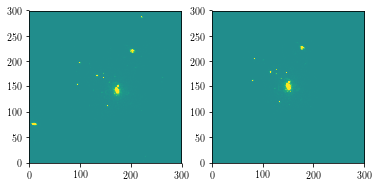

Measuring FULL PARTICLE profile
(16068172., 414, 389, 163, 182, 142, 169, 172.45726561, 156.22269755, 3.59574392, 12.87966222, -0.0489264, 0., 0., 0., 3.58886051, 1.8961767, -1.56552649, 0.27812093, 0.0776458, 0.00211301, 1.86685112e+11, 1.8684099e+11, 1.62347612e+10, 4.15236424e+10, 172, 157, 172, 157, 0)


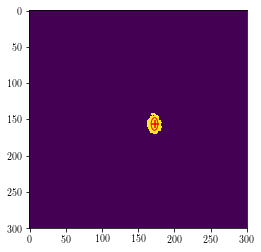

----------------------------------------------------------------------------------------------------
###      galX, galY :  172.4572656115913 156.22269755431668
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_194_xy_full_particles.fits
###      Input Image   : temp_ZAVPI.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

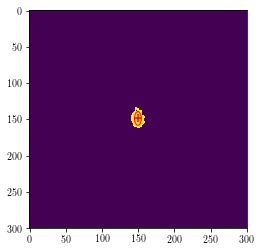

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.55613463911436 148.6007482060005
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_194_xy_full_particles.fits
###      Input Image   : temp_N7TCC.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

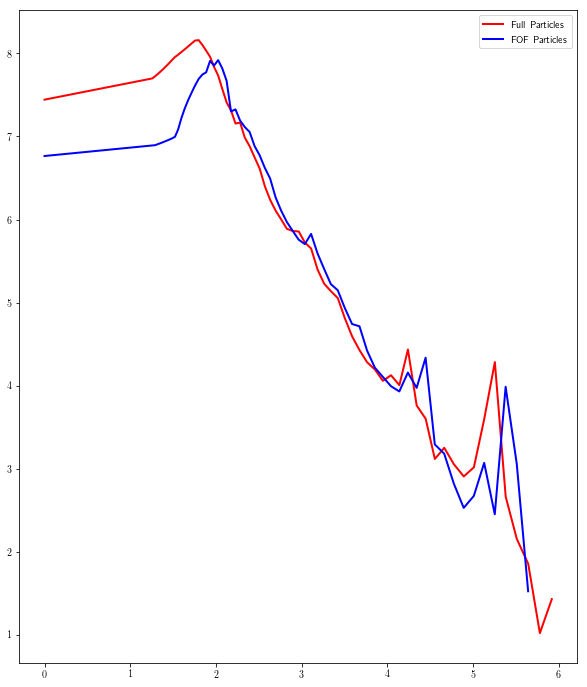

Galaxy 70
(45, u'subbox_045_ptlstr_Coordinates', u'subbox_045_ptlstr_Masses')
Pixel Scales: 7.04148673402, 5.3333 kpc/pixel


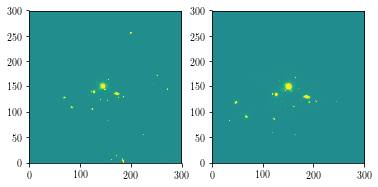

Measuring FULL PARTICLE profile
(22642078., 446, 431, 130, 157, 138, 158, 144.80138545, 148.90165898, 6.37405248, 5.03850718, -0.33588457, 0., 0., 0., 2.54042673, 2.22683454, -0.23301934, 0.15743913, 0.19917114, 0.02099089, 2.69920305e+11, 2.70137262e+11, 3.06621194e+10, 8.78335263e+10, 145, 149, 145, 149, 1)


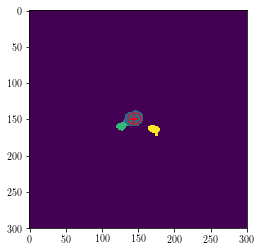

----------------------------------------------------------------------------------------------------
###      galX, galY :  144.80138544852358 148.9016589774949
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_70_xy_full_particles.fits
###      Input Image   : temp_8LZ2C.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

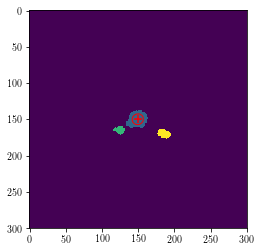

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.37916454483945 149.75877252689702
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_70_xy_full_particles.fits
###      Input Image   : temp_DKPBQ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

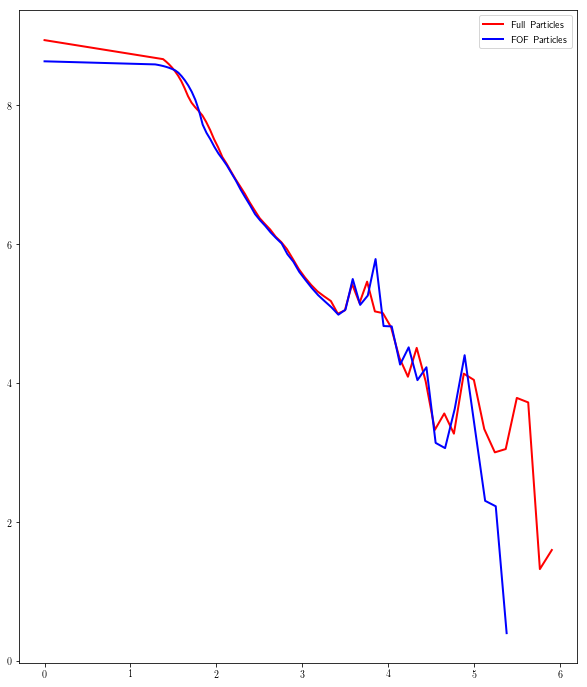

Galaxy 149
(46, u'subbox_046_ptlstr_Coordinates', u'subbox_046_ptlstr_Masses')
Pixel Scales: 6.0001033216, 5.3333 kpc/pixel


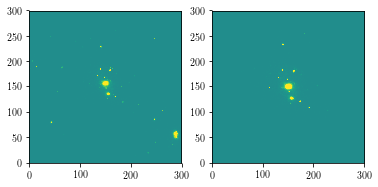

Measuring FULL PARTICLE profile
(21109456., 407, 385, 137, 161, 130, 155, 149.56999022, 143.66479262, 6.67709324, 6.38872832, 0.61396467, 0., 0., 0., 2.67648625, 2.42945337, 0.6700688, 0.15110099, 0.15792117, -0.02904198, 1.92215826e+11, 1.92531759e+11, 1.82908703e+10, 4.04700611e+10, 150, 144, 150, 144, 0)


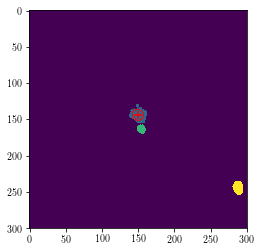

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.5699902233116 143.66479262218922
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_149_xy_full_particles.fits
###      Input Image   : temp_2143N.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

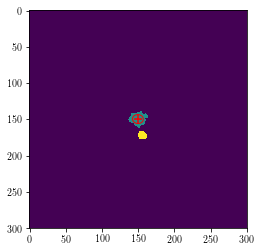

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.5596031171408 149.47662292241208
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_149_xy_full_particles.fits
###      Input Image   : temp_JAVH5.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

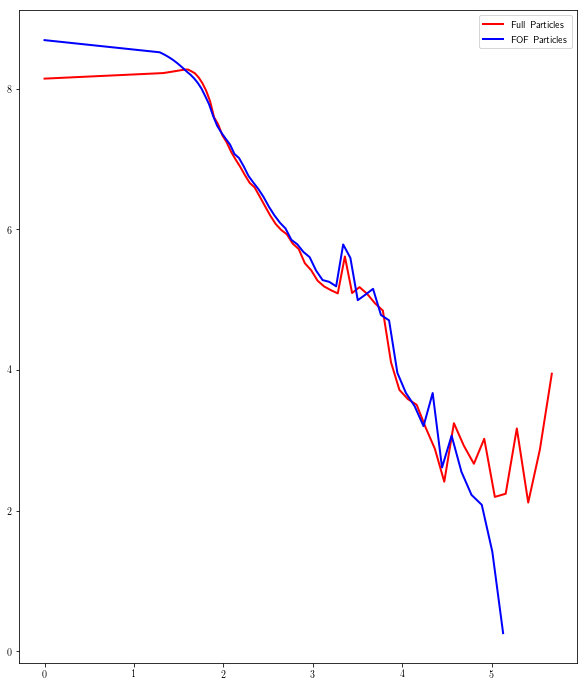

Galaxy 412
(47, u'subbox_047_ptlstr_Coordinates', u'subbox_047_ptlstr_Masses')
Pixel Scales: 4.30336907854, 5.3333 kpc/pixel


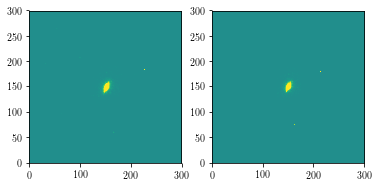

Measuring FULL PARTICLE profile
(19931898., 424, 402, 142, 162, 137, 165, 151.7010319, 150.56096323, 5.01348758, 12.17905075, -4.16766222, 0., 0., 0., 3.75396371, 1.76076543, -1.14043653, 0.2787599, 0.11475109, 0.19078286, 2.15243833e+11, 2.15437853e+11, 1.72531999e+10, 3.91932191e+10, 152, 151, 152, 151, 0)


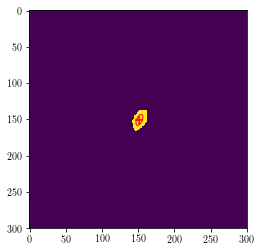

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.7010318989016 150.5609632286888
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_412_xy_full_particles.fits
###      Input Image   : temp_ZFRZP.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

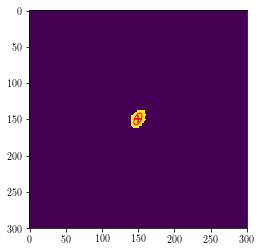

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.55752243322067 149.4344390004215
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_412_xy_full_particles.fits
###      Input Image   : temp_ISJSG.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

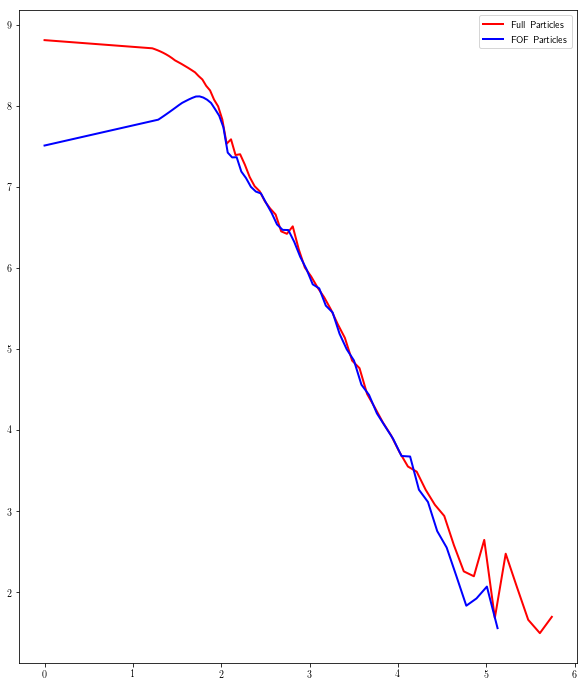

Galaxy 55
(48, u'subbox_048_ptlstr_Coordinates', u'subbox_048_ptlstr_Masses')
Pixel Scales: 7.15727784715, 5.3333 kpc/pixel


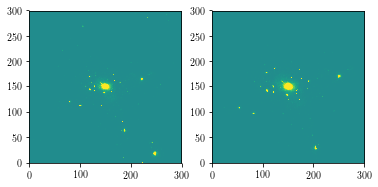

Measuring FULL PARTICLE profile
(20893120., 772, 718, 126, 168, 134, 164, 148.76980087, 149.9375202, 22.56119108, 18.76309819, 1.79524262, 0., 0., 0., 4.82446194, 4.24839449, 0.37865356, 0.04466395, 0.05370498, -0.00854684, 4.34124423e+11, 4.34520293e+11, 2.60457984e+10, 5.56970762e+10, 149, 149, 149, 149, 0)


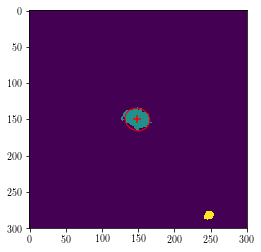

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.76980086873084 149.93752019936113
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_55_xy_full_particles.fits
###      Input Image   : temp_YFHLN.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

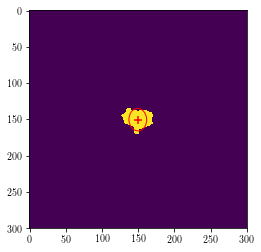

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.41993197606877 150.3091283994213
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_55_xy_full_particles.fits
###      Input Image   : temp_8U793.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

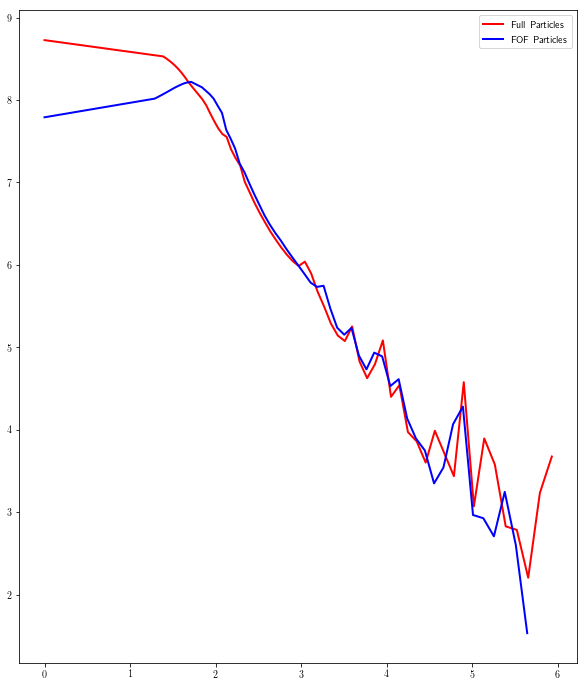

Galaxy 334
(49, u'subbox_049_ptlstr_Coordinates', u'subbox_049_ptlstr_Masses')
Pixel Scales: 4.46527255453, 5.3333 kpc/pixel


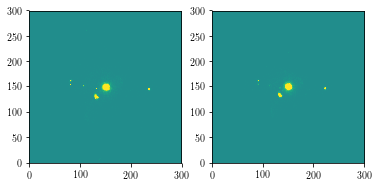

Measuring FULL PARTICLE profile
(18256968., 392, 371, 140, 162, 140, 163, 150.74239235, 150.80921715, 6.3435229, 6.04865738, 0.14057604, 0., 0., 0., 2.52978277, 2.44793367, 0.38079765, 0.15772234, 0.16541114, -0.00733121, 1.57228335e+11, 1.57392978e+11, 1.40219279e+10, 3.90745129e+10, 151, 151, 151, 151, 0)


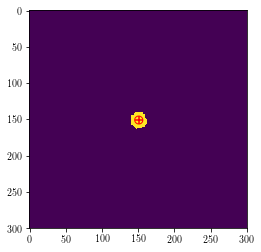

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.74239235340622 150.80921714533096
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_334_xy_full_particles.fits
###      Input Image   : temp_MXG84.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

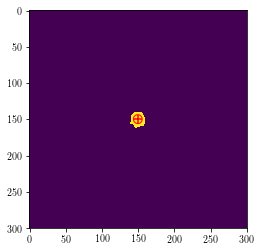

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.40431151125614 149.58039581731026
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_334_xy_full_particles.fits
###      Input Image   : temp_CFVGK.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

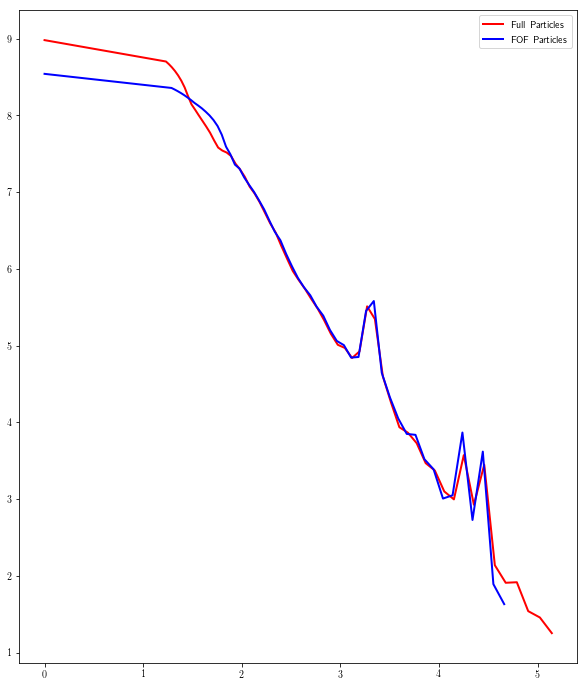

Galaxy 104
(50, u'subbox_050_ptlstr_Coordinates', u'subbox_050_ptlstr_Masses')
Pixel Scales: 6.24175587722, 5.3333 kpc/pixel


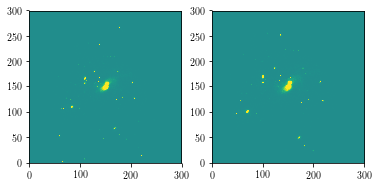

Measuring FULL PARTICLE profile
(18976542., 482, 451, 132, 169, 133, 161, 150.2383618, 149.52168741, 12.53029286, 9.46624872, -5.29328618, 0., 0., 0., 4.06310272, 2.34259224, -0.64453357, 0.1044886, 0.13830957, 0.11685476, 1.4281615e+11, 1.4283155e+11, 1.25411512e+10, 2.76277268e+10, 150, 149, 150, 149, 1)


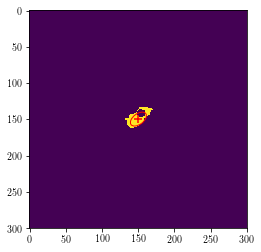

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.23836179732868 149.5216874132373
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_104_xy_full_particles.fits
###      Input Image   : temp_ED17F.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

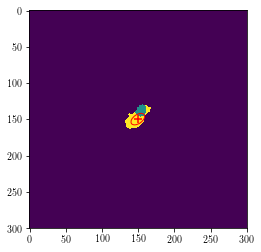

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.44337870081435 149.56330208988066
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_104_xy_full_particles.fits
###      Input Image   : temp_W3220.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

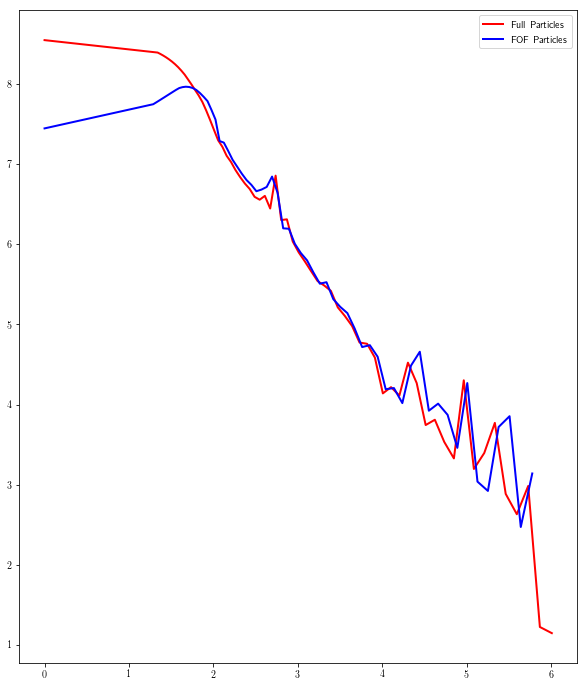

Galaxy 153
(51, u'subbox_051_ptlstr_Coordinates', u'subbox_051_ptlstr_Masses')
Pixel Scales: 5.46444774123, 5.3333 kpc/pixel


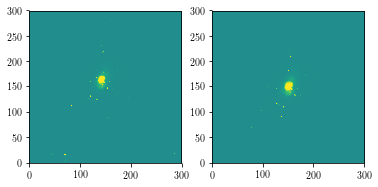

Measuring FULL PARTICLE profile
(22119800., 750, 706, 128, 155, 117, 155, 142.21476347, 137.44211836, 11.24888254, 21.11100094, 2.24767448, 0., 0., 0., 4.6474843, 3.28036189, 1.35695481, 0.09083004, 0.04839829, -0.01934123, 3.81281206e+11, 3.81568811e+11, 2.83311636e+10, 6.8769194e+10, 141, 137, 141, 137, 0)


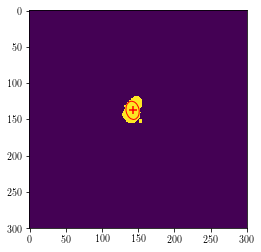

----------------------------------------------------------------------------------------------------
###      galX, galY :  142.21476347423635 137.44211835784463
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_153_xy_full_particles.fits
###      Input Image   : temp_LPMBU.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

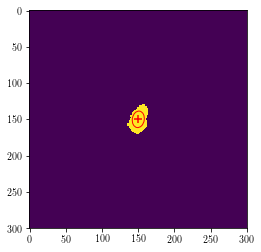

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.09128620688674 149.84521908149767
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_153_xy_full_particles.fits
###      Input Image   : temp_I5CZ1.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

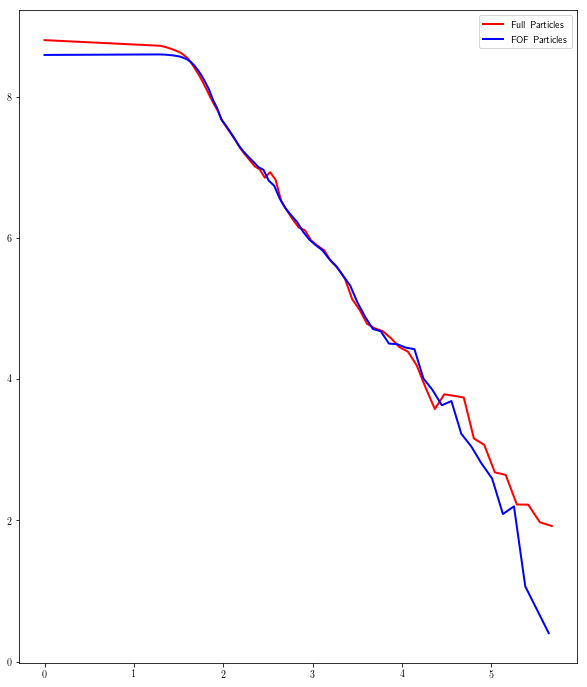

Galaxy 546
(52, u'subbox_052_ptlstr_Coordinates', u'subbox_052_ptlstr_Masses')
Pixel Scales: 3.43997055395, 5.3333 kpc/pixel


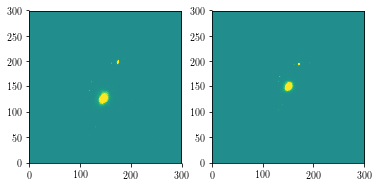

Measuring FULL PARTICLE profile
(19070140., 569, 551, 135, 158, 157, 187, 145.56308234, 172.68272194, 8.94414438, 16.11046968, -3.09365087, 0., 0., 0., 4.15465975, 2.79166889, -1.21468937, 0.11975935, 0.06648751, 0.04599414, 1.68704246e+11, 1.68871723e+11, 1.01266176e+10, 1.88341637e+10, 146, 173, 145, 173, 0)


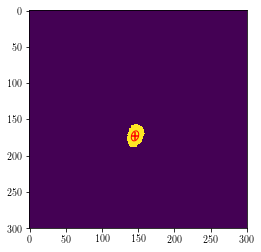

----------------------------------------------------------------------------------------------------
###      galX, galY :  145.56308234293724 172.68272194097506
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_546_xy_full_particles.fits
###      Input Image   : temp_126GU.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

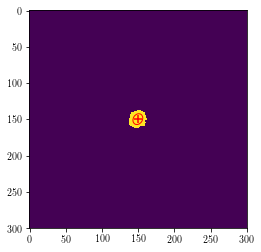

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.47257851299716 149.5614481817492
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_546_xy_full_particles.fits
###      Input Image   : temp_BI6OH.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

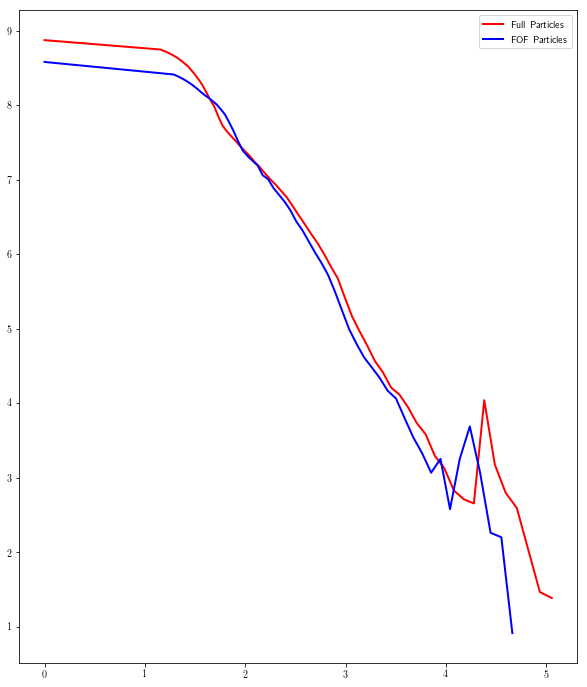

Galaxy 140
(53, u'subbox_053_ptlstr_Coordinates', u'subbox_053_ptlstr_Masses')
Pixel Scales: 5.31401683772, 5.3333 kpc/pixel


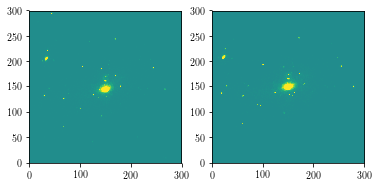

Measuring FULL PARTICLE profile
(17452164., 673, 627, 131, 165, 127, 165, 149.55852112, 153.25389623, 14.53314955, 21.99155239, -1.24109496, 0., 0., 0., 4.71090746, 3.78576946, -1.41015911, 0.06914143, 0.04569222, 0.007804, 2.3264741e+11, 2.32965194e+11, 1.56352891e+10, 3.4534912e+10, 149, 154, 149, 154, 0)


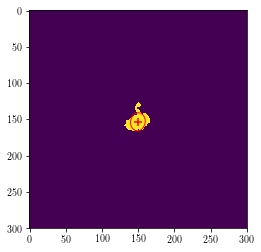

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.55852111717755 153.2538962349304
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_140_xy_full_particles.fits
###      Input Image   : temp_EYGMD.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

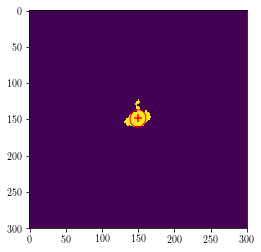

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.6000068870456 148.66509414004304
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_140_xy_full_particles.fits
###      Input Image   : temp_N9LQF.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

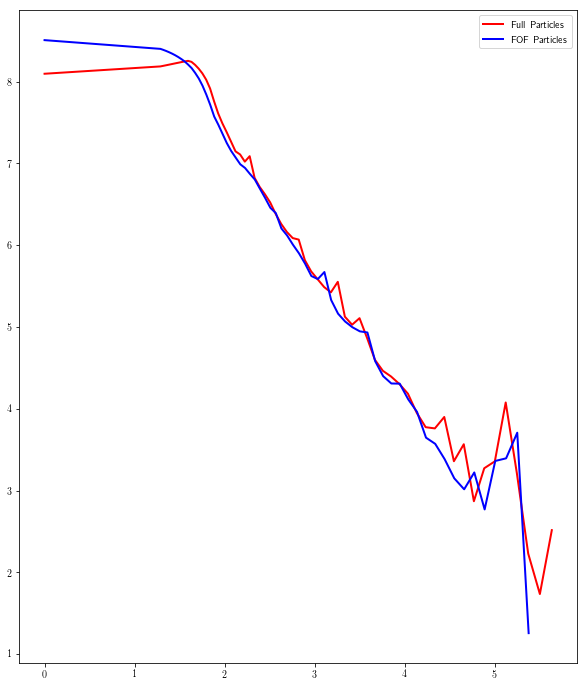

Galaxy 459
(54, u'subbox_054_ptlstr_Coordinates', u'subbox_054_ptlstr_Masses')
Pixel Scales: 3.98062028171, 5.3333 kpc/pixel


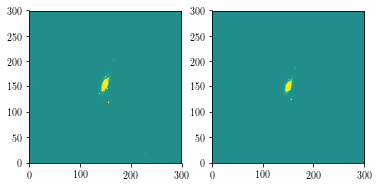

Measuring FULL PARTICLE profile
(16272035., 544, 514, 139, 158, 124, 166, 148.80972383, 145.53383733, 6.61853313, 28.63839364, -8.18089533, 0., 0., 0., 5.59866762, 1.97783852, -1.25127816, 0.23355952, 0.05397724, 0.13343807, 2.25195377e+11, 2.25417249e+11, 1.62601472e+10, 4.51982868e+10, 149, 146, 149, 146, 0)


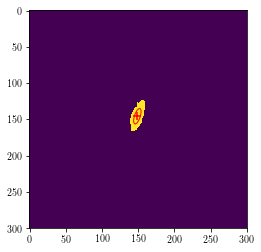

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.80972382721473 145.53383732711433
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_459_xy_full_particles.fits
###      Input Image   : temp_5MWVE.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

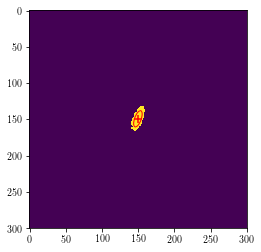

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.55561673106817 149.10865845987786
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_459_xy_full_particles.fits
###      Input Image   : temp_DDYZN.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

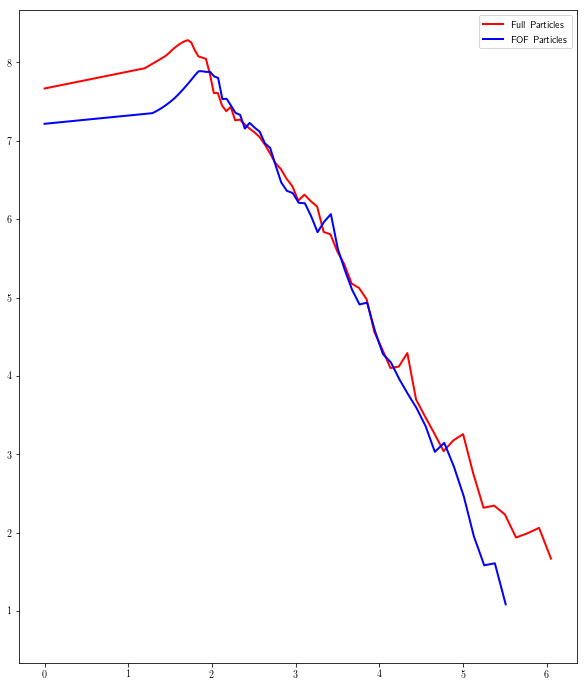

Galaxy 66
(55, u'subbox_055_ptlstr_Coordinates', u'subbox_055_ptlstr_Masses')
Pixel Scales: 7.14396537718, 5.3333 kpc/pixel


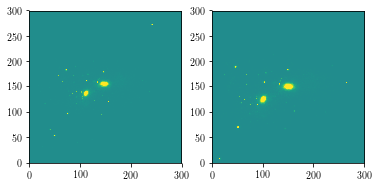

Measuring FULL PARTICLE profile
(21126876., 457, 425, 131, 162, 133, 152, 146.67493326, 144.3835086, 11.94496561, 3.83716827, 1.24321696, 0., 0., 0., 3.48300338, 1.91071224, 0.14878327, 0.08663881, 0.26970348, -0.0561408, 2.79828595e+11, 2.80102142e+11, 2.43552276e+10, 5.43084667e+10, 147, 144, 147, 144, 0)


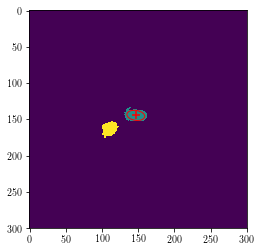

----------------------------------------------------------------------------------------------------
###      galX, galY :  146.67493325782726 144.38350859650228
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_66_xy_full_particles.fits
###      Input Image   : temp_THF81.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

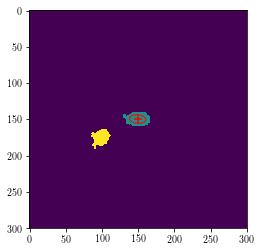

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.2543605856143 149.45736790548452
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_66_xy_full_particles.fits
###      Input Image   : temp_BSMQW.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

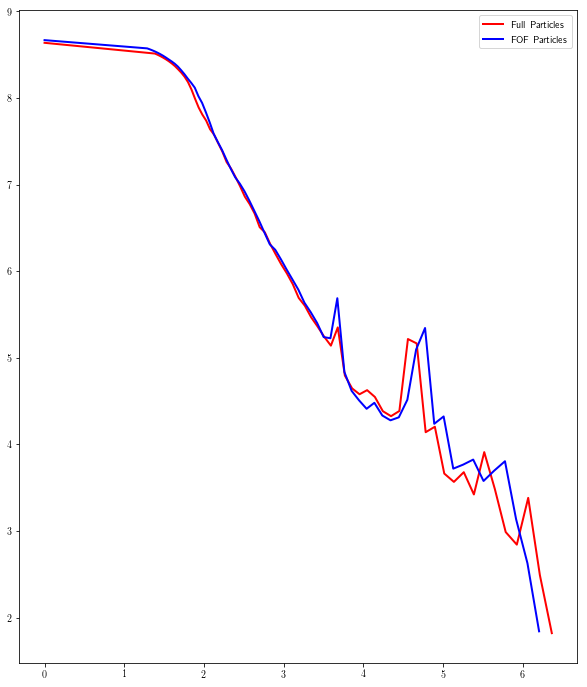

Galaxy 114
(56, u'subbox_056_ptlstr_Coordinates', u'subbox_056_ptlstr_Masses')
Pixel Scales: 6.34799970779, 5.3333 kpc/pixel


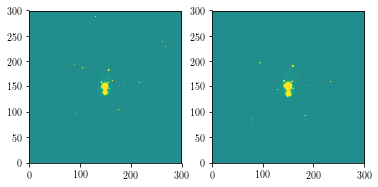

Measuring FULL PARTICLE profile
(18595912., 466, 434, 136, 159, 129, 163, 148.96685639, 149.45847837, 7.28895086, 8.19625518, 0.80053841, 0., 0., 0., 2.94325423, 2.61198401, 1.04317915, 0.13868161, 0.12332992, -0.02709041, 3.22723447e+11, 3.22733408e+11, 2.37730693e+10, 6.74393498e+10, 149, 150, 149, 150, 1)


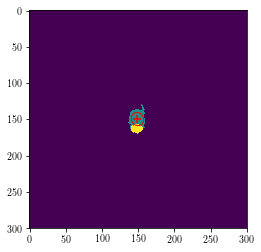

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.96685638546546 149.4584783698561
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_114_xy_full_particles.fits
###      Input Image   : temp_ICLLN.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

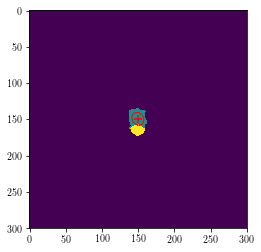

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.49446991771336 149.04900422965565
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_114_xy_full_particles.fits
###      Input Image   : temp_TYY4X.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

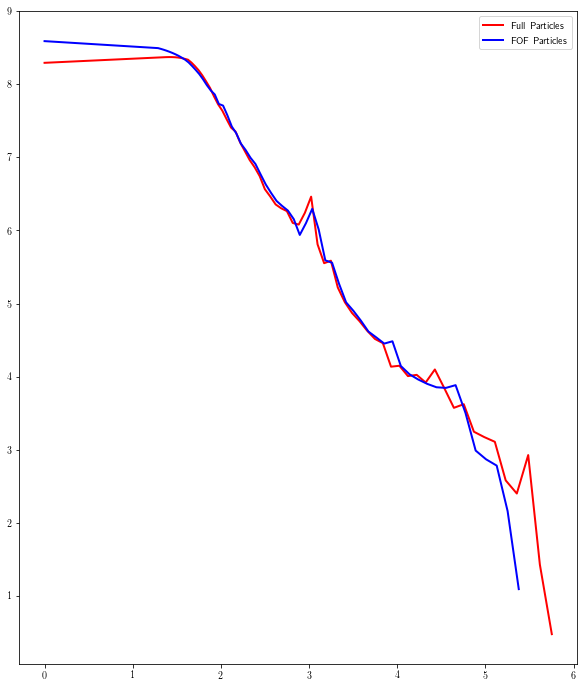

Galaxy 28
(57, u'subbox_057_ptlstr_Coordinates', u'subbox_057_ptlstr_Masses')
Pixel Scales: 9.0274267431, 5.3333 kpc/pixel


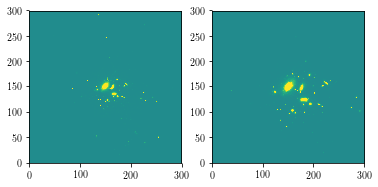

Measuring FULL PARTICLE profile
(24757150., 643, 601, 127, 166, 131, 162, 148.91313874, 149.0642024, 28.56511957, 19.39454664, -12.77336311, 0., 0., 0., 6.12790823, 3.22620606, -0.61307532, 0.04962162, 0.07308485, 0.06536219, 6.3672936e+11, 6.37251289e+11, 5.26427914e+10, 1.48343128e+11, 149, 149, 149, 149, 1)


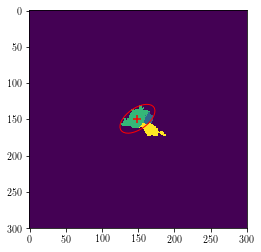

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.91313874128298 149.064202400211
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_28_xy_full_particles.fits
###      Input Image   : temp_ABQNJ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

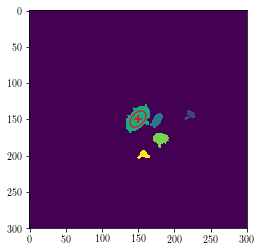

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.69205421341192 149.43728507519276
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_28_xy_full_particles.fits
###      Input Image   : temp_8JZSY.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

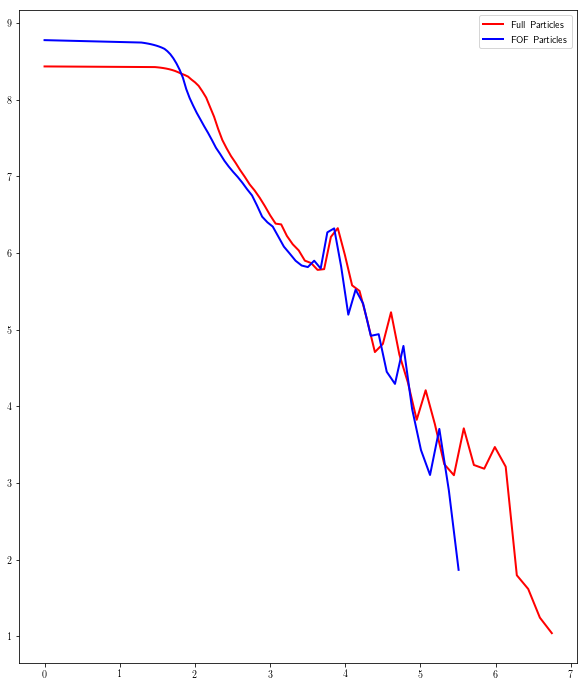

Galaxy 170
(58, u'subbox_058_ptlstr_Coordinates', u'subbox_058_ptlstr_Masses')
Pixel Scales: 5.38792652984, 5.3333 kpc/pixel


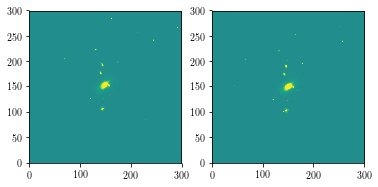

Measuring FULL PARTICLE profile
(14807569., 511, 469, 132, 162, 135, 161, 148.13997915, 146.63900645, 11.32160139, 5.90508149, -2.79491607, 0., 0., 0., 3.53626323, 2.17290735, -0.4005717, 0.10001252, 0.19175042, 0.09467324, 1.7715916e+11, 1.77321181e+11, 1.57076992e+10, 3.55655107e+10, 148, 146, 148, 146, 0)


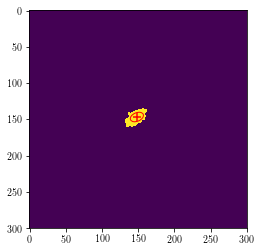

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.1399791535017 146.63900644615097
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_170_xy_full_particles.fits
###      Input Image   : temp_3EQMO.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

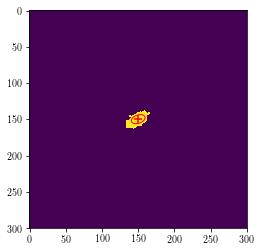

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.94109634655555 149.63196844226778
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_170_xy_full_particles.fits
###      Input Image   : temp_ZEYYD.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

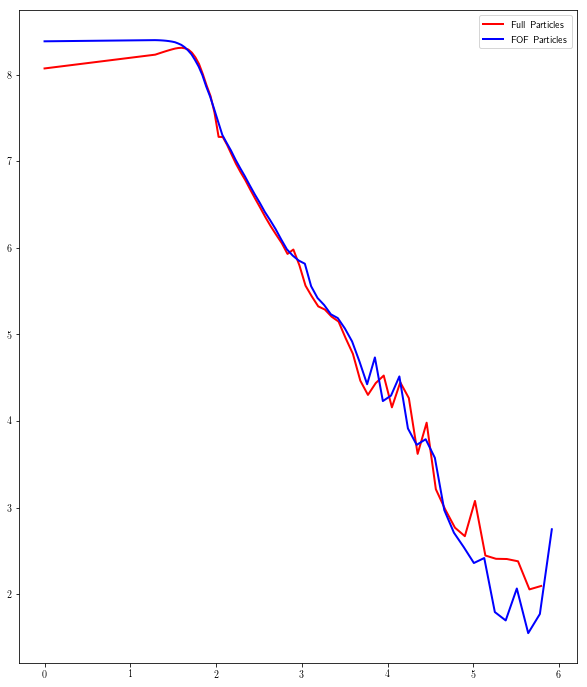

Galaxy 159
(59, u'subbox_059_ptlstr_Coordinates', u'subbox_059_ptlstr_Masses')
Pixel Scales: 5.303871363, 5.3333 kpc/pixel


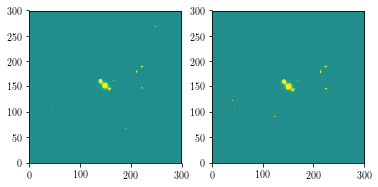

Measuring FULL PARTICLE profile
(11948815., 282, 266, 139, 159, 136, 158, 148.27021429, 148.00295045, 3.3590986, 3.84386737, -0.50112306, 0., 0., 0., 2.03915334, 1.744941, -1.01065242, 0.30360371, 0.26531476, 0.07916132, 1.78851774e+11, 1.78918621e+11, 2.13965496e+10, 6.22298767e+10, 148, 148, 148, 148, 1)


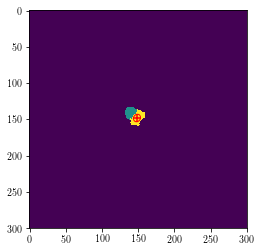

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.2702142864186 148.0029504487996
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_159_xy_full_particles.fits
###      Input Image   : temp_XERD0.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

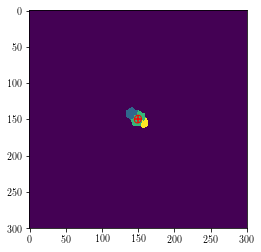

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.51059287886855 149.52109170844486
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_159_xy_full_particles.fits
###      Input Image   : temp_9UQFN.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

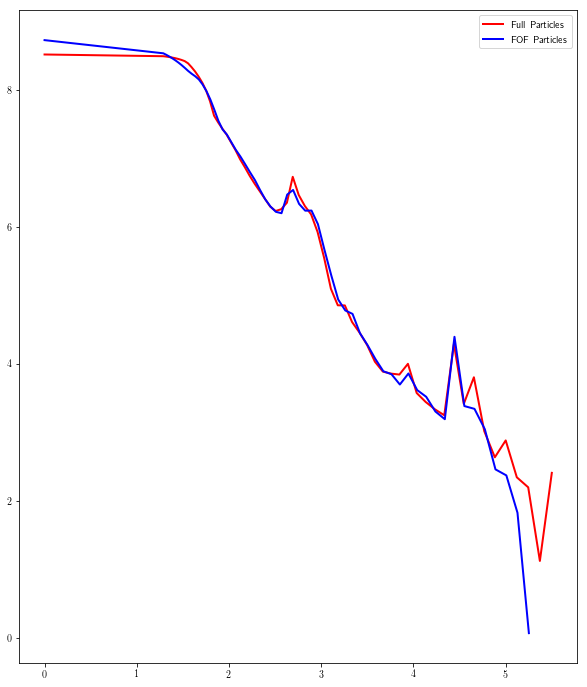

Galaxy 63
(60, u'subbox_060_ptlstr_Coordinates', u'subbox_060_ptlstr_Masses')
Pixel Scales: 7.17574364913, 5.3333 kpc/pixel


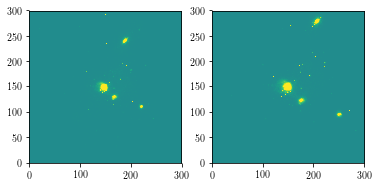

Measuring FULL PARTICLE profile
(19169506., 738, 700, 124, 162, 138, 165, 147.23449773, 151.27795892, 12.77356889, 11.13085189, -0.0336746, 0., 0., 0., 3.57410955, 3.33618975, -0.02048786, 0.07828728, 0.0898411, 0.00047369, 4.3321131e+11, 4.33547051e+11, 2.36929229e+10, 5.79973038e+10, 148, 150, 148, 150, 1)


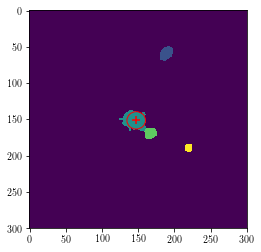

----------------------------------------------------------------------------------------------------
###      galX, galY :  147.2344977301138 151.27795892336505
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_63_xy_full_particles.fits
###      Input Image   : temp_K90OM.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

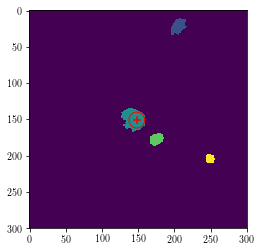

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.0823641447021 150.8679409157062
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_63_xy_full_particles.fits
###      Input Image   : temp_4N8Y4.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

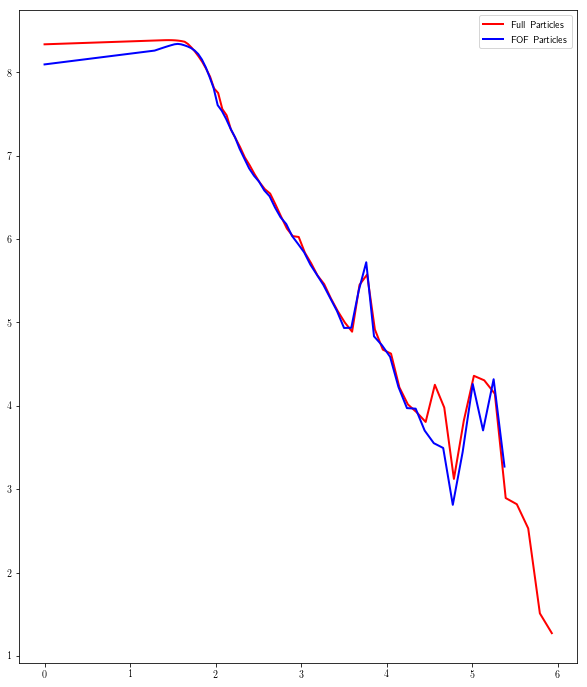

Galaxy 52
(61, u'subbox_061_ptlstr_Coordinates', u'subbox_061_ptlstr_Masses')
Pixel Scales: 8.20993568029, 5.3333 kpc/pixel


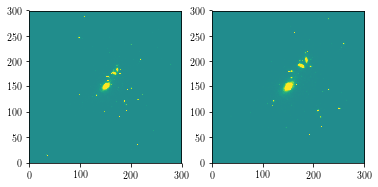

Measuring FULL PARTICLE profile
(21432772., 645, 597, 137, 168, 125, 165, 150.8732859, 147.83098008, 7.89752271, 22.73103648, -6.67251529, 0., 0., 0., 5.02899504, 2.31036139, -1.20448434, 0.16838251, 0.05850172, 0.09885471, 4.17138901e+11, 4.17378632e+11, 3.63018854e+10, 8.78456095e+10, 151, 149, 151, 149, 1)


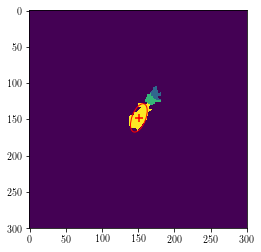

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.87328590491146 147.83098007858996
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_52_xy_full_particles.fits
###      Input Image   : temp_PTJ92.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

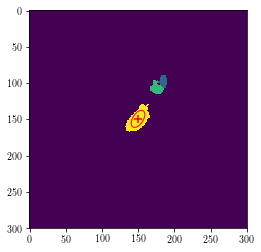

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.735919111398 149.22099352365467
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_52_xy_full_particles.fits
###      Input Image   : temp_TT0CZ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

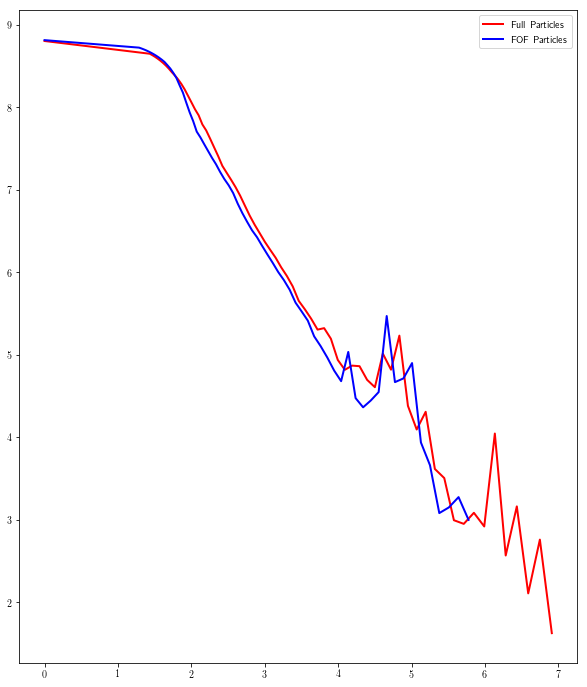

Galaxy 123
(62, u'subbox_062_ptlstr_Coordinates', u'subbox_062_ptlstr_Masses')
Pixel Scales: 6.35687156375, 5.3333 kpc/pixel


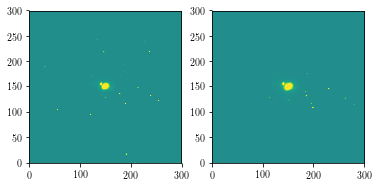

Measuring FULL PARTICLE profile
(18678244., 483, 448, 133, 167, 138, 160, 149.15568524, 148.9539986, 6.7758677, 4.51790791, -0.8932037, 0., 0., 0., 2.66204309, 2.05117083, -0.33466369, 0.15153171, 0.22726423, 0.05991653, 3.42747873e+11, 3.42842016e+11, 3.30749256e+10, 8.94074143e+10, 149, 149, 149, 149, 1)


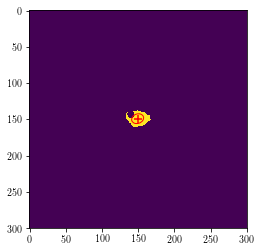

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.15568524305868 148.95399860180876
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_123_xy_full_particles.fits
###      Input Image   : temp_14L6E.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

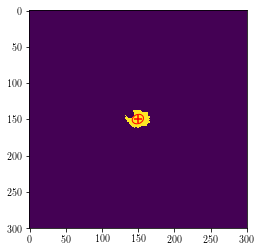

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.48685210407834 149.48299052477032
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_123_xy_full_particles.fits
###      Input Image   : temp_D6HE2.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

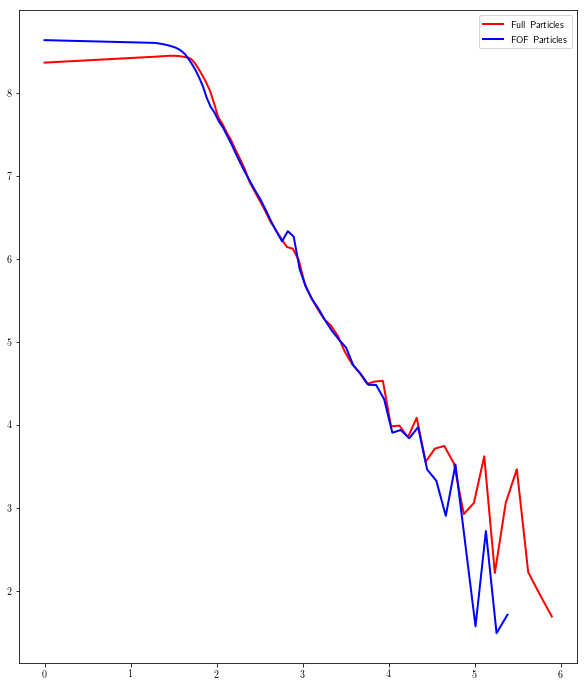

Galaxy 84
(63, u'subbox_063_ptlstr_Coordinates', u'subbox_063_ptlstr_Masses')
Pixel Scales: 6.8814260936, 5.3333 kpc/pixel


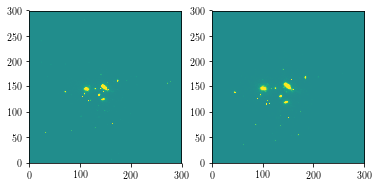

Measuring FULL PARTICLE profile
(20963832., 296, 272, 137, 161, 141, 161, 148.36670016, 151.33652774, 10.23067947, 6.29475978, 5.07546896, 0., 0., 0., 3.70221043, 1.67901051, 0.60045189, 0.16291088, 0.26477405, -0.2627103, 2.28647617e+11, 2.28898193e+11, 1.88070687e+10, 3.97739172e+10, 149, 151, 149, 151, 0)


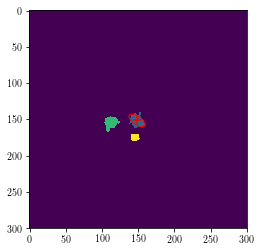

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.36670016151075 151.33652774100955
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_84_xy_full_particles.fits
###      Input Image   : temp_7VW2X.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

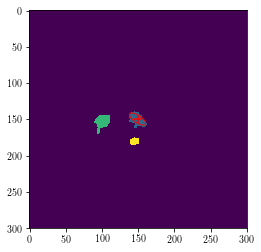

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.05866013342037 149.39278346683008
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_84_xy_full_particles.fits
###      Input Image   : temp_81F5Y.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

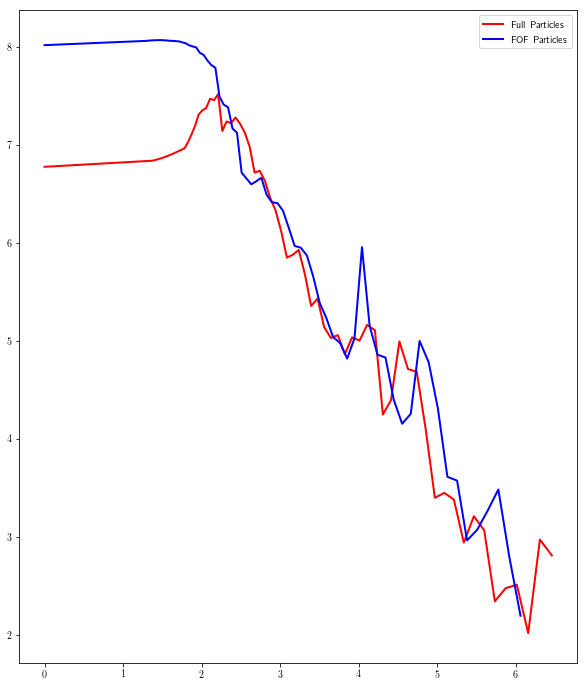

Galaxy 36
(64, u'subbox_064_ptlstr_Coordinates', u'subbox_064_ptlstr_Masses')
Pixel Scales: 8.50000967286, 5.3333 kpc/pixel


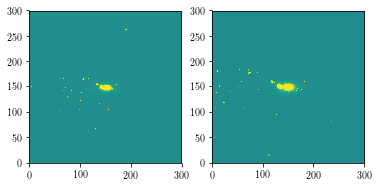

Measuring FULL PARTICLE profile
(22453572., 628, 584, 127, 179, 142, 164, 152.69506689, 151.22760442, 18.74668807, 5.65087593, 0.78395505, 0., 0., 0., 4.33514118, 2.36730075, 0.05957944, 0.05365403, 0.17799637, -0.01488702, 4.92353978e+11, 4.92702859e+11, 4.5669716e+10, 1.23190813e+11, 153, 151, 153, 151, 1)


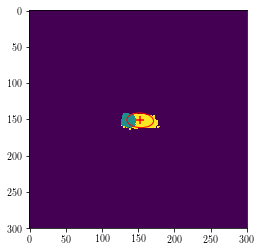

----------------------------------------------------------------------------------------------------
###      galX, galY :  152.69506689202862 151.2276044172937
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_36_xy_full_particles.fits
###      Input Image   : temp_SGA9I.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

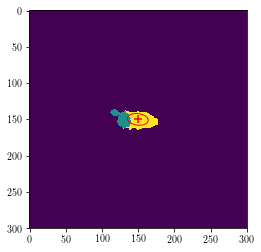

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.47041813810253 149.91551788028352
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_36_xy_full_particles.fits
###      Input Image   : temp_S15M1.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

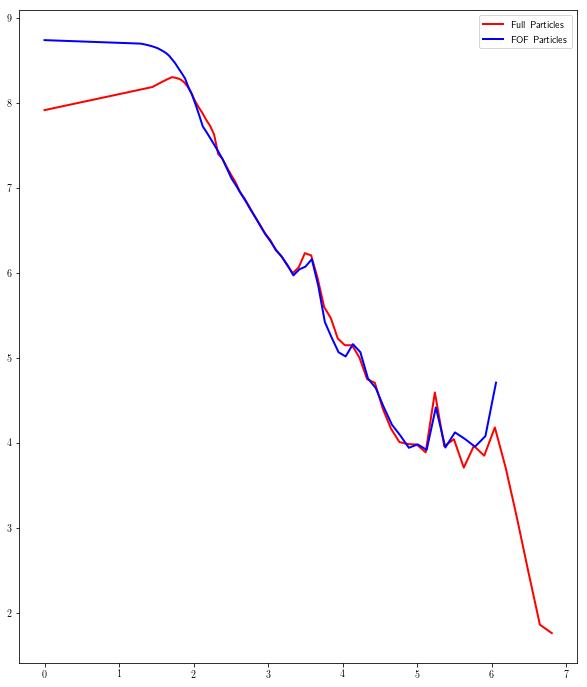

Galaxy 204
(65, u'subbox_065_ptlstr_Coordinates', u'subbox_065_ptlstr_Masses')
Pixel Scales: 5.12973476424, 5.3333 kpc/pixel


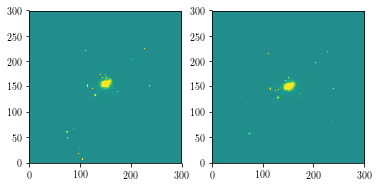

Measuring FULL PARTICLE profile
(23120170., 534, 507, 136, 164, 131, 155, 149.71394336, 144.10267682, 11.01099905, 8.04417249, -1.65122269, 0., 0., 0., 3.42743087, 2.70331097, -0.41944054, 0.09370268, 0.1282618, 0.03846859, 2.09072325e+11, 2.09341071e+11, 1.50585108e+10, 3.20235213e+10, 149, 144, 149, 144, 0)


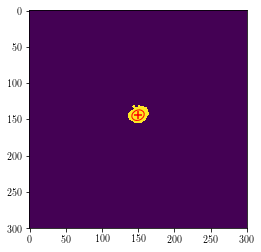

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.7139433612644 144.10267681565338
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_204_xy_full_particles.fits
###      Input Image   : temp_A419U.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

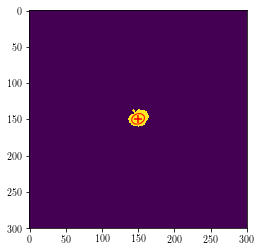

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.8037085182951 149.21640081029037
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_204_xy_full_particles.fits
###      Input Image   : temp_4ATTK.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

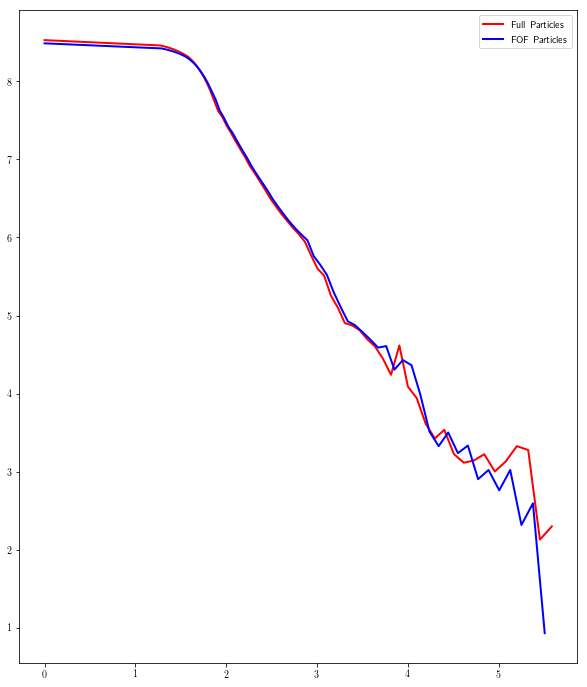

Galaxy 380
(66, u'subbox_066_ptlstr_Coordinates', u'subbox_066_ptlstr_Masses')
Pixel Scales: 3.92200319688, 5.3333 kpc/pixel


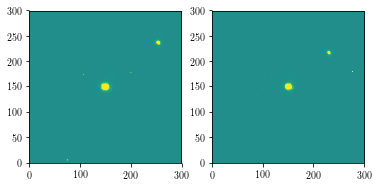

Measuring FULL PARTICLE profile
(21695404., 383, 373, 139, 162, 140, 160, 149.09345887, 149.96315694, 7.3769126, 5.56670367, 0.75410279, 0., 0., 0., 2.76584411, 2.30080914, 0.34731993, 0.13746163, 0.18216211, -0.03724294, 1.73842416e+11, 1.74072676e+11, 1.54972426e+10, 4.17732403e+10, 149, 150, 149, 150, 0)


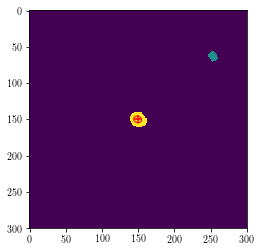

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.09345886728752 149.96315693976464
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_380_xy_full_particles.fits
###      Input Image   : temp_82SWK.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

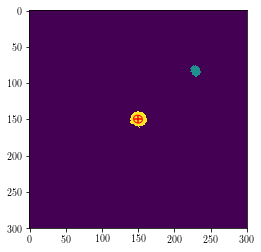

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.6486995308699 149.5564621743453
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_380_xy_full_particles.fits
###      Input Image   : temp_F4UZ5.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

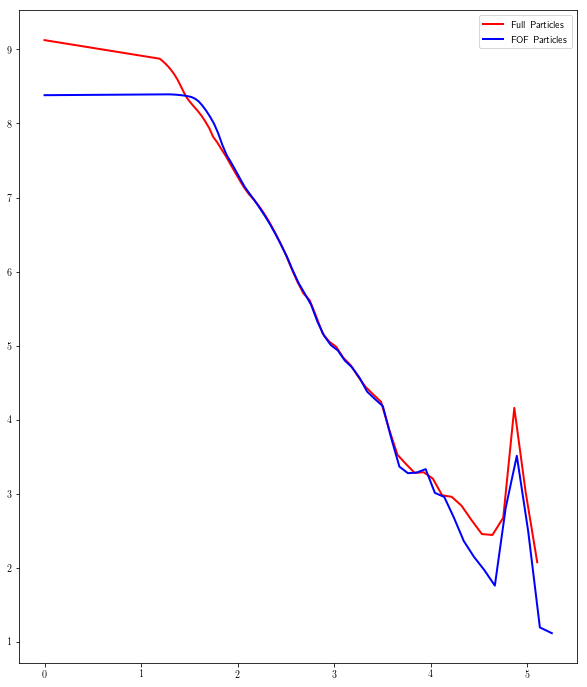

Galaxy 38
(67, u'subbox_067_ptlstr_Coordinates', u'subbox_067_ptlstr_Masses')
Pixel Scales: 8.17336378647, 5.3333 kpc/pixel


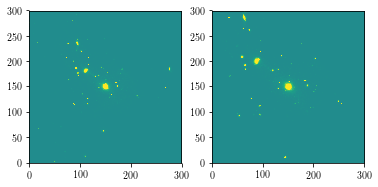

Measuring FULL PARTICLE profile
(25260518., 490, 448, 135, 162, 136, 163, 149.0397823, 149.39240671, 11.14751805, 5.54702969, 2.0675597, 0., 0., 0., 3.43920088, 2.206002, 0.3180016, 0.09636816, 0.19366506, -0.07183915, 3.2237142e+11, 3.2270241e+11, 2.62080635e+10, 4.81584988e+10, 150, 149, 150, 149, 0)


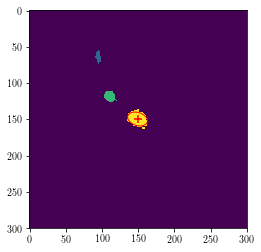

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.03978229707099 149.39240671166573
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_38_xy_full_particles.fits
###      Input Image   : temp_2M2TG.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

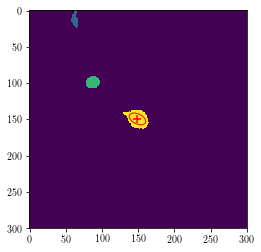

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.98006560671655 149.29638970449017
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_38_xy_full_particles.fits
###      Input Image   : temp_CI4RX.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

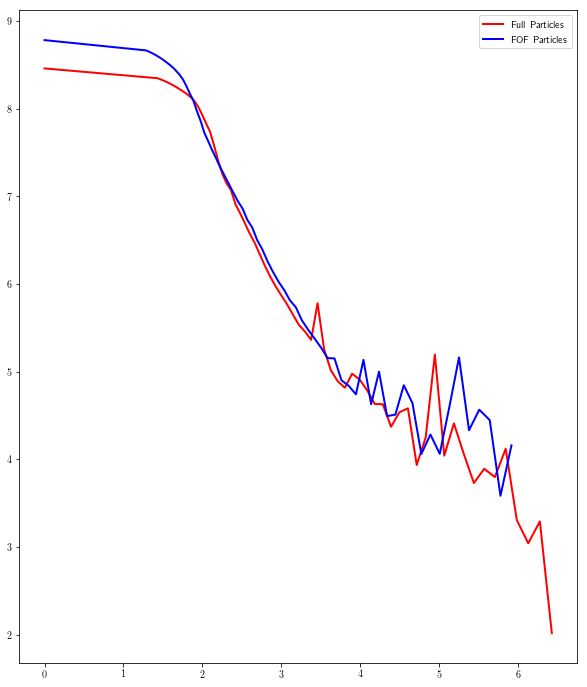

Galaxy 197
(68, u'subbox_068_ptlstr_Coordinates', u'subbox_068_ptlstr_Masses')
Pixel Scales: 5.0828013924, 5.3333 kpc/pixel


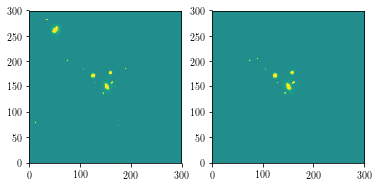

Measuring FULL PARTICLE profile
(14836979., 314, 293, 143, 161, 138, 164, 152.10991378, 149.64872273, 2.58703677, 4.88688008, 1.2774139, 0., 0., 0., 2.33574605, 1.42063618, 1.15185964, 0.44382799, 0.2349555, -0.23203027, 1.58376133e+11, 1.58556897e+11, 1.62959022e+10, 3.77125478e+10, 152, 150, 152, 150, 1)


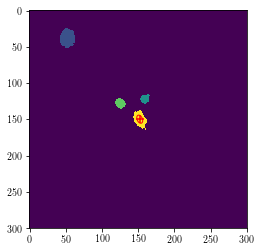

----------------------------------------------------------------------------------------------------
###      galX, galY :  152.10991377669595 149.64872273038947
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_197_xy_full_particles.fits
###      Input Image   : temp_UB6L2.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

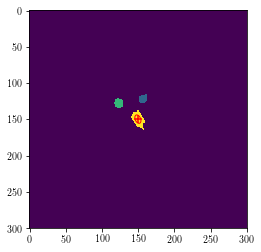

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.55267192307755 149.55815047751108
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_197_xy_full_particles.fits
###      Input Image   : temp_ROFAB.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

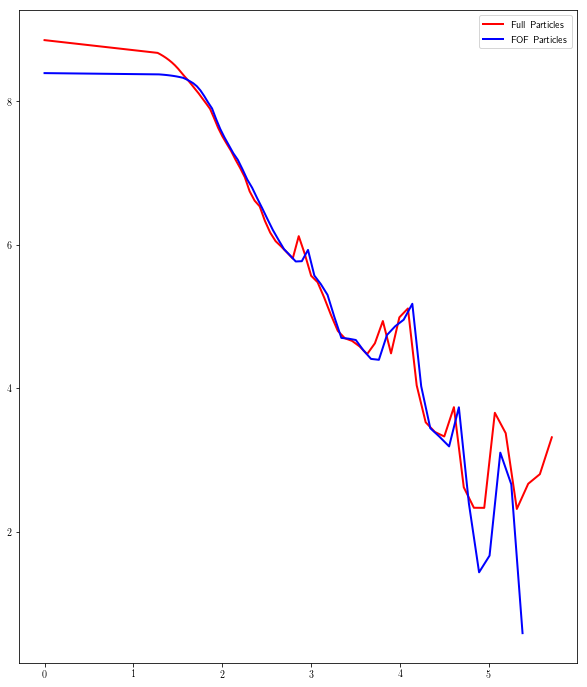

Galaxy 351
(69, u'subbox_069_ptlstr_Coordinates', u'subbox_069_ptlstr_Masses')
Pixel Scales: 4.3444461238, 5.3333 kpc/pixel


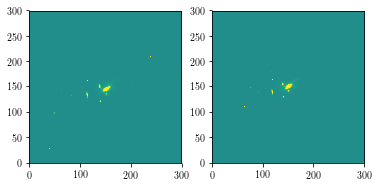

Measuring FULL PARTICLE profile
(24148984., 336, 312, 136, 162, 145, 167, 150.41306168, 153.82107813, 15.15303743, 6.31495525, 1.92628184, 0., 0., 0., 3.94393563, 2.43174124, 0.20553543, 0.0686556, 0.1647424, -0.04188471, 2.23270044e+11, 2.2357649e+11, 1.98930145e+10, 5.24957204e+10, 151, 154, 151, 154, 0)


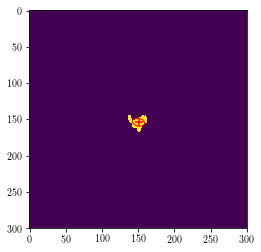

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.4130616843852 153.82107813318217
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_351_xy_full_particles.fits
###      Input Image   : temp_HH01E.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

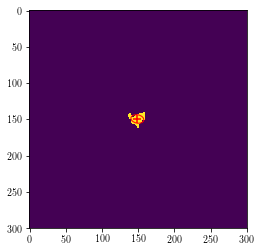

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.81696508554543 149.33568011964854
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_351_xy_full_particles.fits
###      Input Image   : temp_QHH5E.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

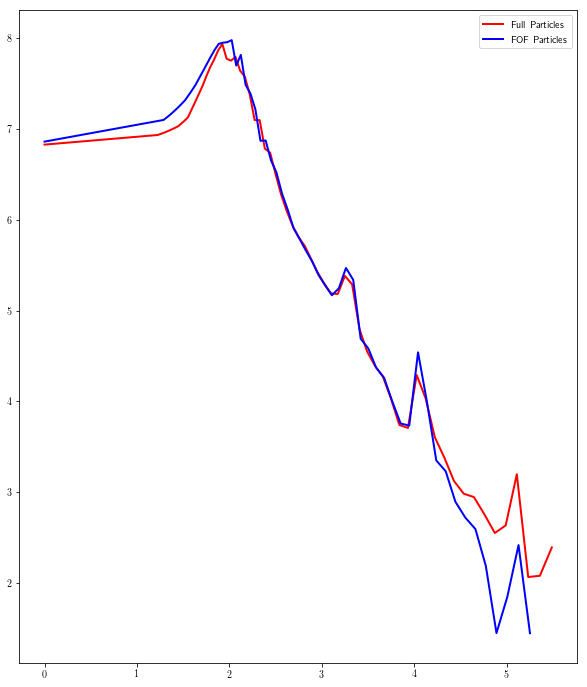

Galaxy 15
(70, u'subbox_070_ptlstr_Coordinates', u'subbox_070_ptlstr_Masses')
Pixel Scales: 8.25920313955, 5.3333 kpc/pixel


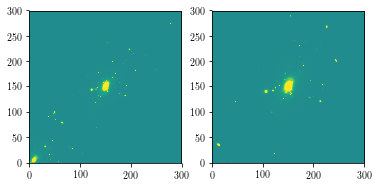

Measuring FULL PARTICLE profile
(20994324., 1085, 1014, 128, 167, 129, 173, 149.4623615, 149.36760456, 20.55758512, 20.28064123, -6.47909541, 0., 0., 0., 5.18649101, 3.73343515, -0.77471375, 0.05409003, 0.05482866, 0.03456049, 7.2350276e+11, 7.23935887e+11, 4.70685573e+10, 9.66248776e+10, 150, 149, 150, 149, 1)


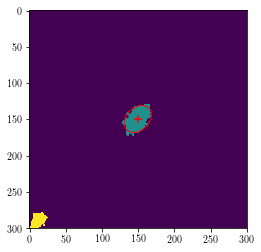

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.46236150359238 149.36760456026636
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_15_xy_full_particles.fits
###      Input Image   : temp_49LGB.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

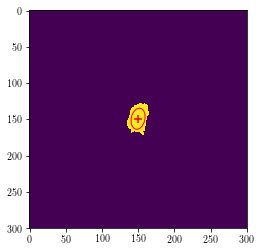

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.79491829907738 149.0138109751041
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_15_xy_full_particles.fits
###      Input Image   : temp_224S7.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

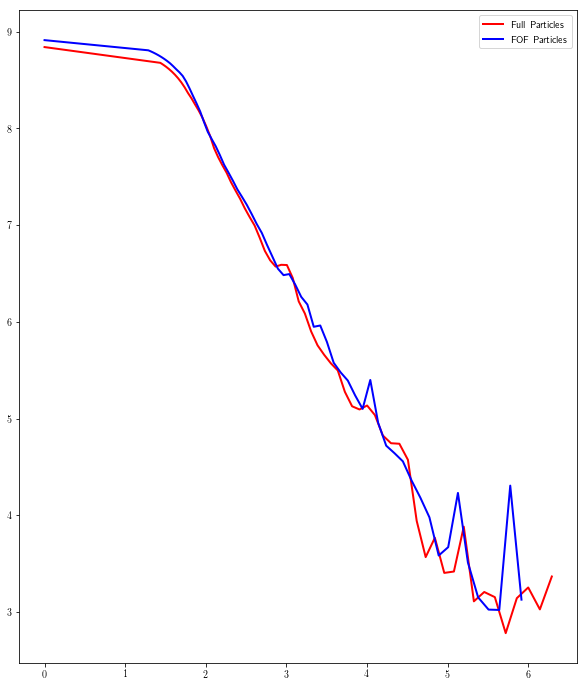

Galaxy 22
(71, u'subbox_071_ptlstr_Coordinates', u'subbox_071_ptlstr_Masses')
Pixel Scales: 9.82320606382, 5.3333 kpc/pixel


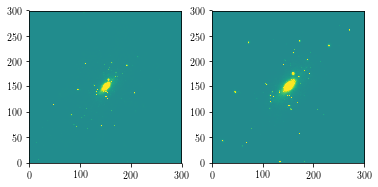

Measuring FULL PARTICLE profile
(21124728., 1764, 1663, 126, 176, 120, 179, 150.80280289, 148.7943013, 29.50291345, 42.82848793, -21.80016635, 0., 0., 0., 7.67862701, 3.65651298, -0.93370515, 0.05432896, 0.03742515, 0.05530806, 1.73225017e+12, 1.73285913e+12, 8.65334313e+10, 1.71638948e+11, 150, 149, 150, 149, 0)


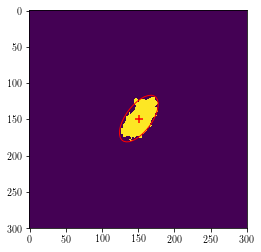

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.80280288840402 148.79430130230185
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_22_xy_full_particles.fits
###      Input Image   : temp_JPYKI.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

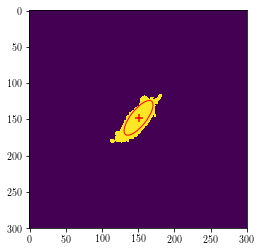

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.4537975344043 147.8134755745689
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_22_xy_full_particles.fits
###      Input Image   : temp_VV7HE.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

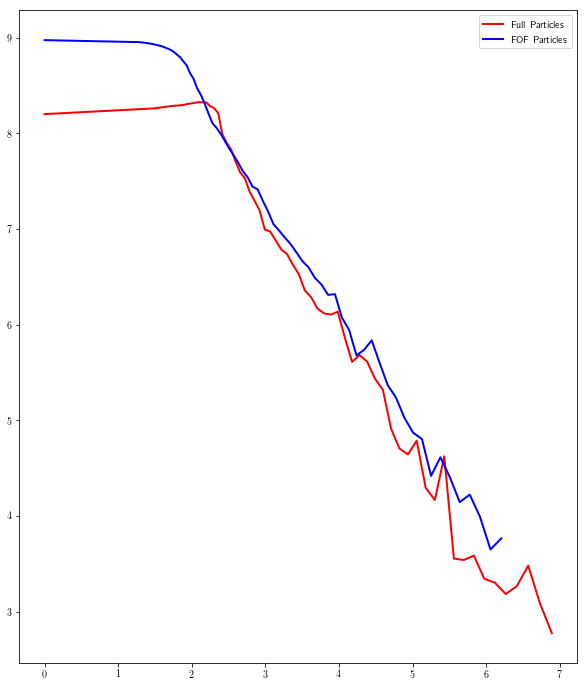

Galaxy 243
(72, u'subbox_072_ptlstr_Coordinates', u'subbox_072_ptlstr_Masses')
Pixel Scales: 5.10492916697, 5.3333 kpc/pixel


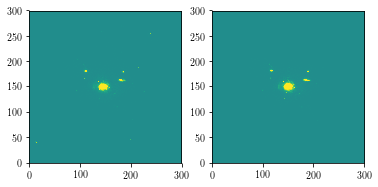

Measuring FULL PARTICLE profile
(15885898., 608, 564, 124, 159, 137, 162, 144.71268162, 149.88579484, 16.18764847, 7.74273045, 0.64419504, 0., 0., 0., 4.02945471, 2.77378321, 0.07569826, 0.06198071, 0.12958245, -0.01031359, 2.08467886e+11, 2.08671244e+11, 1.68653353e+10, 4.78931517e+10, 145, 150, 145, 150, 0)


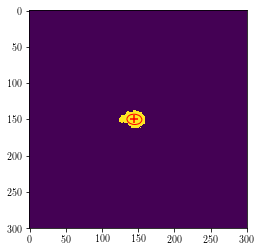

----------------------------------------------------------------------------------------------------
###      galX, galY :  144.71268162480905 149.88579484230553
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_243_xy_full_particles.fits
###      Input Image   : temp_7087M.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

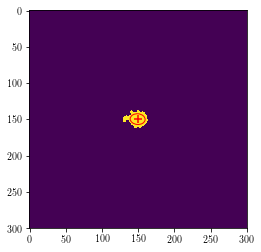

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.18658248538011 149.56760971631454
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_243_xy_full_particles.fits
###      Input Image   : temp_T88JY.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

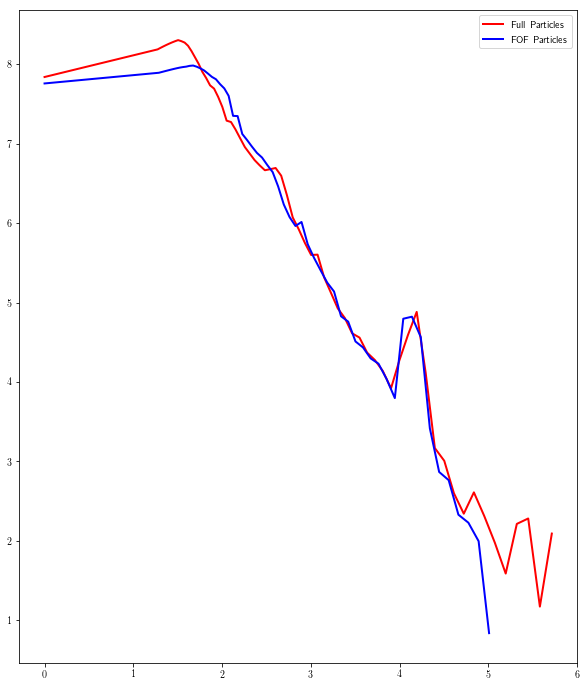

Galaxy 54
(73, u'subbox_073_ptlstr_Coordinates', u'subbox_073_ptlstr_Masses')
Pixel Scales: 7.25123434024, 5.3333 kpc/pixel


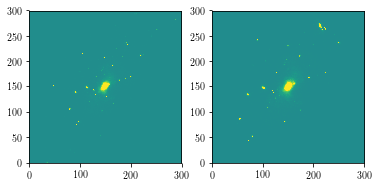

Measuring FULL PARTICLE profile
(23878824., 760, 714, 131, 169, 129, 170, 148.50001545, 149.08725048, 13.96149177, 14.47511823, -7.49821906, 0., 0., 0., 4.66057062, 2.59146476, -0.8025164, 0.09923235, 0.09571125, 0.1028062, 4.54479249e+11, 4.54858965e+11, 3.28807281e+10, 7.54438472e+10, 148, 150, 148, 150, 0)


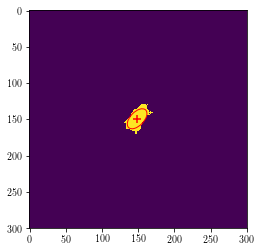

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.50001544817724 149.08725047910912
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_54_xy_full_particles.fits
###      Input Image   : temp_AXOA1.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

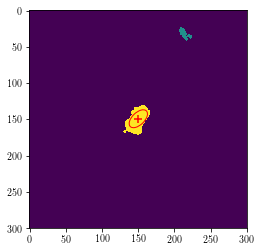

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.14829113427524 149.0340552191565
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_54_xy_full_particles.fits
###      Input Image   : temp_P7Z46.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

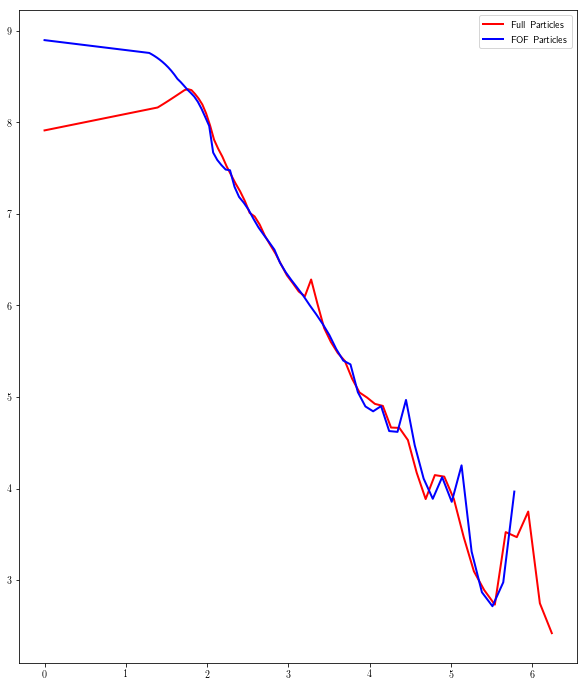

Galaxy 145
(74, u'subbox_074_ptlstr_Coordinates', u'subbox_074_ptlstr_Masses')
Pixel Scales: 5.79953889401, 5.3333 kpc/pixel


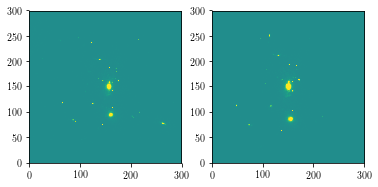

Measuring FULL PARTICLE profile
(18926280., 425, 408, 148, 165, 136, 167, 156.25069456, 149.66533527, 4.18029227, 8.27798751, 0.58889664, 0., 0., 0., 2.89152908, 2.02418852, 1.43085456, 0.24163939, 0.12202522, -0.03438049, 2.44994212e+11, 2.4522888e+11, 2.37239747e+10, 5.71413791e+10, 156, 150, 156, 150, 0)


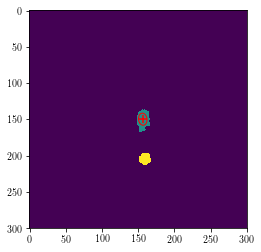

----------------------------------------------------------------------------------------------------
###      galX, galY :  156.25069456178056 149.66533527092653
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_145_xy_full_particles.fits
###      Input Image   : temp_R29J9.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

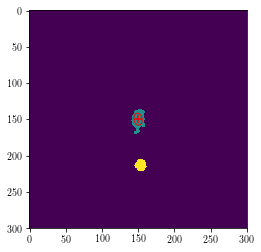

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.69136010991525 149.5858905934217
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_145_xy_full_particles.fits
###      Input Image   : temp_BJ5UG.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

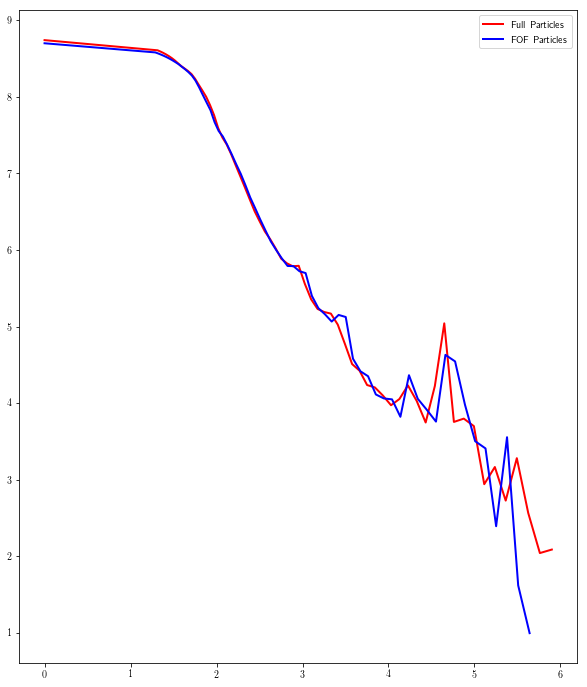

Galaxy 82
(75, u'subbox_075_ptlstr_Coordinates', u'subbox_075_ptlstr_Masses')
Pixel Scales: 5.94105648496, 5.3333 kpc/pixel


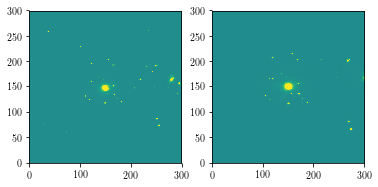

Measuring FULL PARTICLE profile
(15932704., 588, 559, 134, 171, 141, 166, 149.4301137, 152.60546437, 11.3929145, 5.82062789, -0.87982996, 0., 0., 0., 3.39536953, 2.38432574, -0.15293866, 0.08881056, 0.17383195, 0.02684872, 2.72417735e+11, 2.72604709e+11, 2.32668365e+10, 5.9929047e+10, 149, 153, 149, 153, 0)


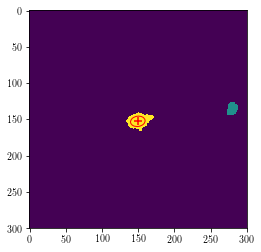

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.43011369990268 152.60546437407712
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_82_xy_full_particles.fits
###      Input Image   : temp_G56TT.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

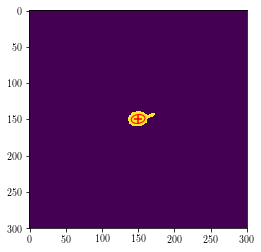

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.79523167368376 149.3617793567658
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_82_xy_full_particles.fits
###      Input Image   : temp_6R6O9.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

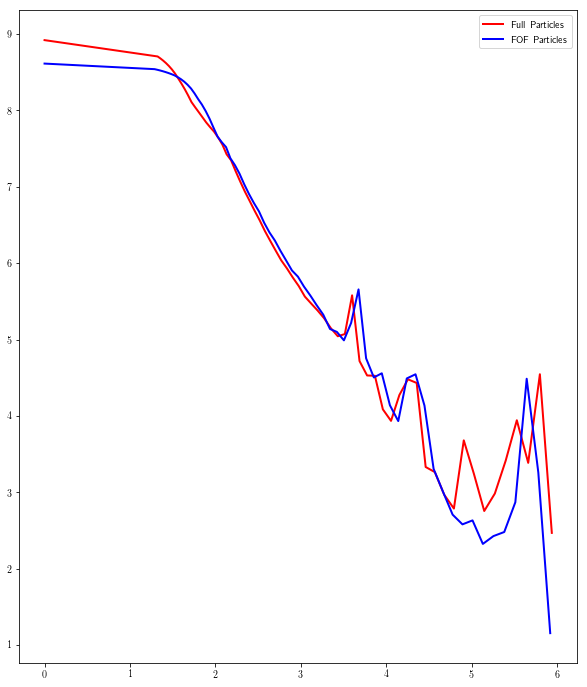

Galaxy 113
(76, u'subbox_076_ptlstr_Coordinates', u'subbox_076_ptlstr_Masses')
Pixel Scales: 6.13617030872, 5.3333 kpc/pixel


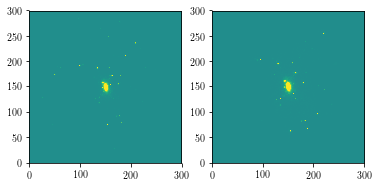

Measuring FULL PARTICLE profile
(18341382., 622, 573, 140, 164, 127, 168, 150.00102762, 150.04638845, 7.91210213, 20.98960756, -0.55978482, 0., 0., 0., 4.58405113, 2.80859113, -1.52809525, 0.12662759, 0.04773269, 0.00675422, 3.43702962e+11, 3.44124981e+11, 2.96629146e+10, 7.71236577e+10, 150, 151, 150, 151, 0)


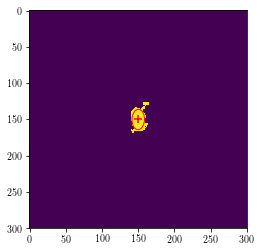

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.00102761921445 150.0463884464395
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_113_xy_full_particles.fits
###      Input Image   : temp_X109N.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

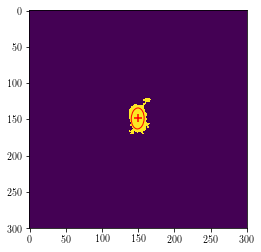

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.26149196872362 148.64371571885462
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_113_xy_full_particles.fits
###      Input Image   : temp_6Y1L0.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

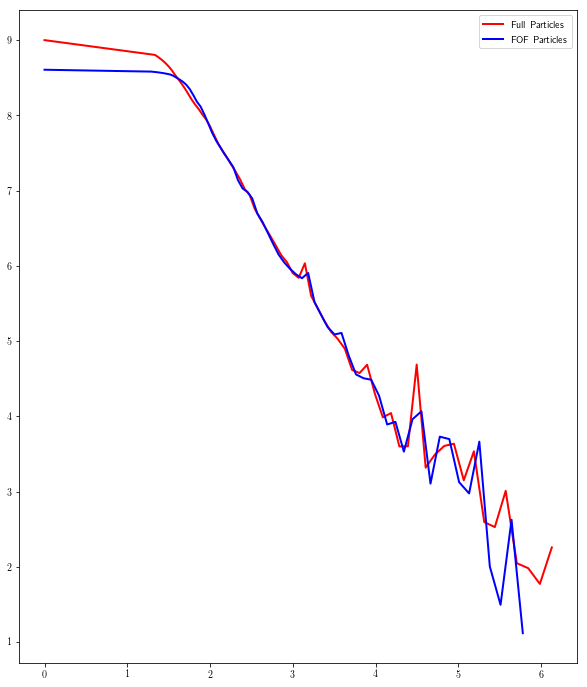

Galaxy 332
(77, u'subbox_077_ptlstr_Coordinates', u'subbox_077_ptlstr_Masses')
Pixel Scales: 4.50789301547, 5.3333 kpc/pixel


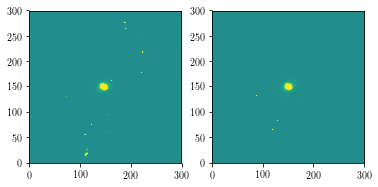

Measuring FULL PARTICLE profile
(18887452., 526, 499, 132, 163, 138, 161, 146.01473245, 149.65471966, 8.22373376, 5.56469384, 0.51028927, 0., 0., 0., 2.88414621, 2.33883071, 0.18323806, 0.12229514, 0.1807328, -0.02242923, 2.63810859e+11, 2.63983989e+11, 2.04257239e+10, 5.02244475e+10, 146, 150, 146, 150, 0)


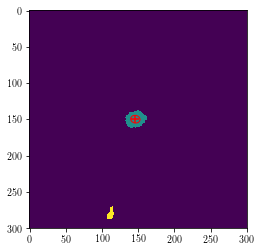

----------------------------------------------------------------------------------------------------
###      galX, galY :  146.01473245388235 149.654719664632
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_332_xy_full_particles.fits
###      Input Image   : temp_ILISQ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

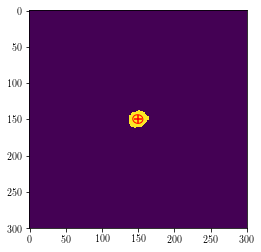

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.4445094032332 149.4625490029095
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_332_xy_full_particles.fits
###      Input Image   : temp_WBDVA.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

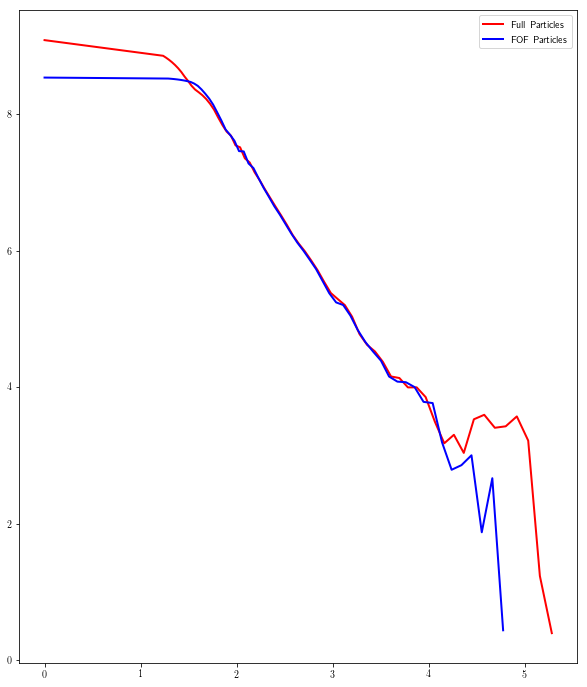

Galaxy 69
(78, u'subbox_078_ptlstr_Coordinates', u'subbox_078_ptlstr_Masses')
Pixel Scales: 7.42552417116, 5.3333 kpc/pixel


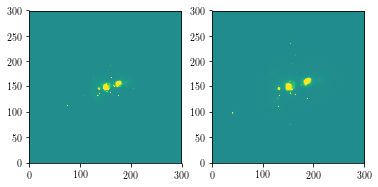

Measuring FULL PARTICLE profile
(37381364., 431, 401, 133, 163, 141, 162, 148.56384448, 151.45185936, 26.34496792, 7.38064016, -1.94876832, 0., 0., 0., 5.15200472, 2.68001056, -0.10134848, 0.03871404, 0.13818859, 0.02044395, 4.23448936e+11, 4.23816593e+11, 2.91750564e+10, 6.93103575e+10, 150, 151, 150, 151, 1)


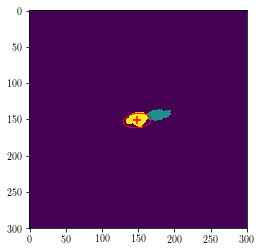

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.56384448190673 151.45185936373133
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_69_xy_full_particles.fits
###      Input Image   : temp_X469Y.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

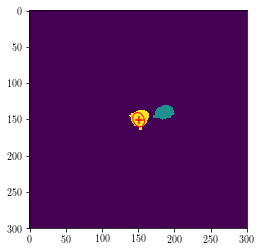

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.50163126731994 150.34241263312728
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_69_xy_full_particles.fits
###      Input Image   : temp_VC2RH.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

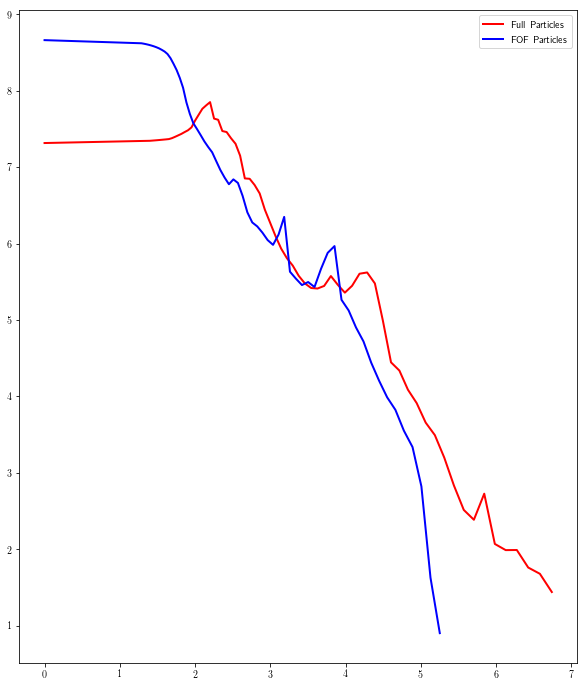

Galaxy 193
(79, u'subbox_079_ptlstr_Coordinates', u'subbox_079_ptlstr_Masses')
Pixel Scales: 5.31709314687, 5.3333 kpc/pixel


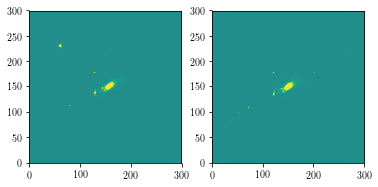

Measuring FULL PARTICLE profile
(18385460., 560, 530, 136, 174, 134, 162, 156.91415231, 148.56138314, 15.08224165, 7.82392264, -7.24780479, 0., 0., 0., 4.42252493, 1.82960045, -0.55328429, 0.11950098, 0.23036306, 0.22140296, 2.74613813e+11, 2.74865865e+11, 2.30580716e+10, 4.65962189e+10, 157, 148, 157, 148, 0)


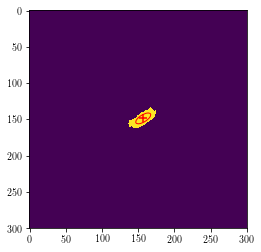

----------------------------------------------------------------------------------------------------
###      galX, galY :  156.91415231471 148.5613831387308
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_193_xy_full_particles.fits
###      Input Image   : temp_OLY0D.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figure

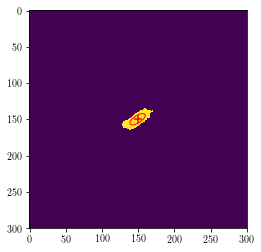

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.03066720707517 149.73786172055833
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_193_xy_full_particles.fits
###      Input Image   : temp_MTYB0.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

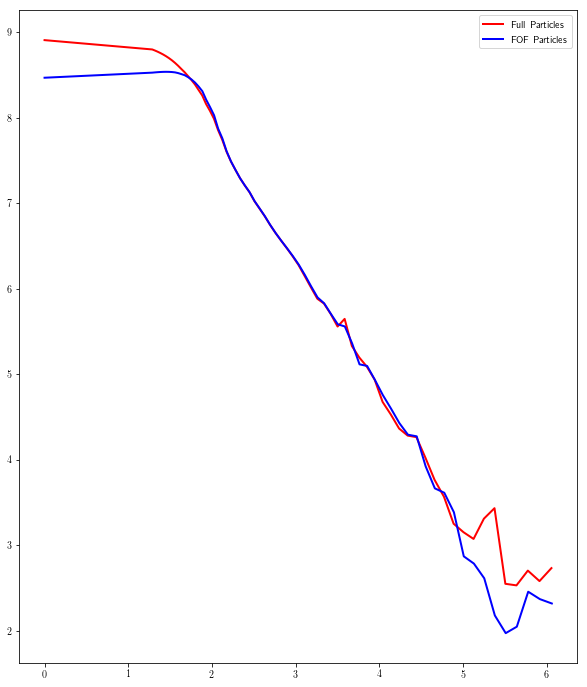

Galaxy 95
(80, u'subbox_080_ptlstr_Coordinates', u'subbox_080_ptlstr_Masses')
Pixel Scales: 6.9218527839, 5.3333 kpc/pixel


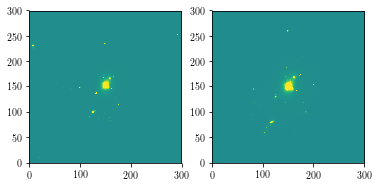

Measuring FULL PARTICLE profile
(26047840., 809, 746, 138, 168, 125, 164, 151.15058194, 145.69720205, 14.32181386, 27.55068085, -8.87440584, 0., 0., 0., 5.6572504, 3.1413393, -1.10565364, 0.08723521, 0.04534793, 0.05619902, 4.97299784e+11, 4.97549148e+11, 3.52082289e+10, 9.22835436e+10, 150, 147, 150, 147, 0)


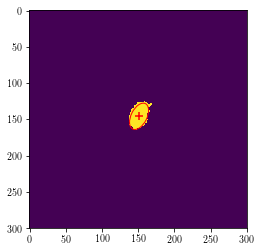

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.15058194178943 145.69720204777147
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_95_xy_full_particles.fits
###      Input Image   : temp_9SA45.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

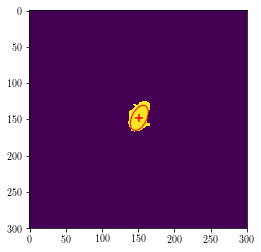

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.47538208268455 147.86121832465793
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_95_xy_full_particles.fits
###      Input Image   : temp_RKHEK.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

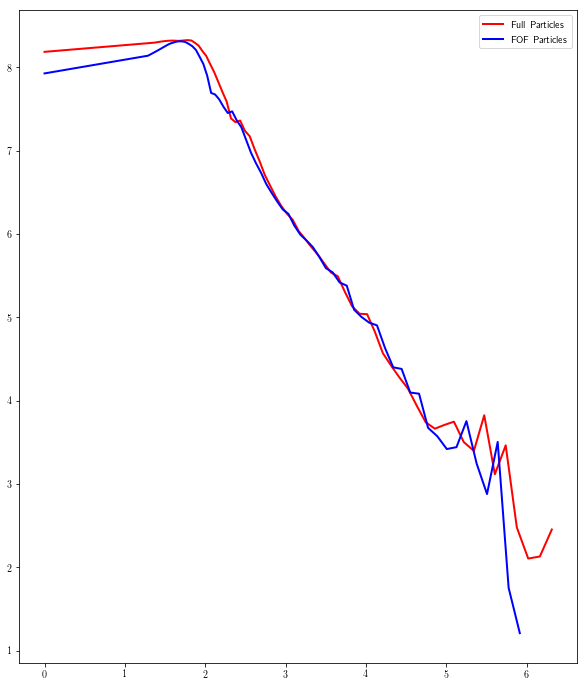

Galaxy 331
(81, u'subbox_081_ptlstr_Coordinates', u'subbox_081_ptlstr_Masses')
Pixel Scales: 4.57627157994, 5.3333 kpc/pixel


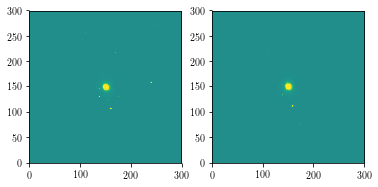

Measuring FULL PARTICLE profile
(12414806., 506, 463, 137, 162, 137, 163, 150.81172849, 150.63209785, 5.15922247, 5.68138558, 0.26708682, 0., 0., 0., 2.4070313, 2.24651027, 1.17241251, 0.19430053, 0.1764428, -0.01826847, 1.82313402e+11, 1.8239642e+11, 2.14384681e+10, 6.34986127e+10, 151, 151, 151, 151, 0)


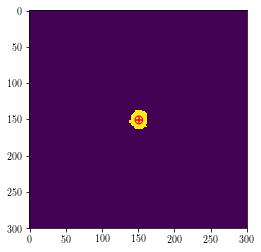

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.8117284875924 150.63209785138773
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_331_xy_full_particles.fits
###      Input Image   : temp_LD0OD.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

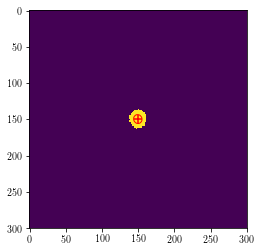

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.43378919419814 149.46964842462216
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_331_xy_full_particles.fits
###      Input Image   : temp_UB68P.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

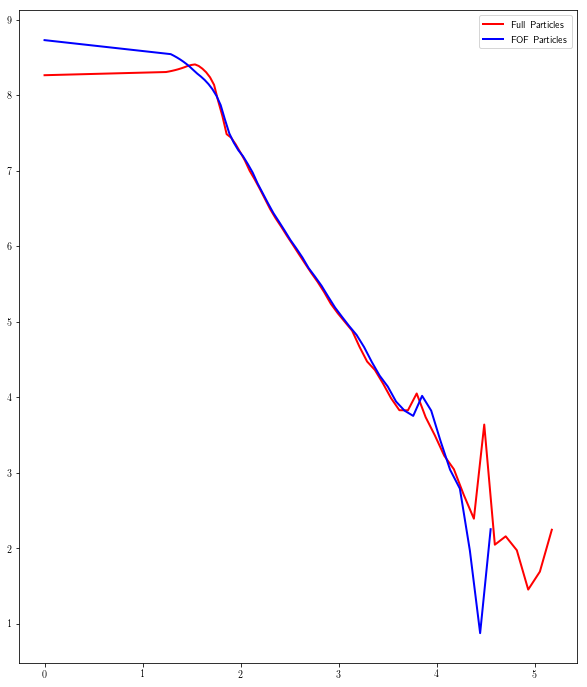

Galaxy 44
(82, u'subbox_082_ptlstr_Coordinates', u'subbox_082_ptlstr_Masses')
Pixel Scales: 8.69756784158, 5.3333 kpc/pixel


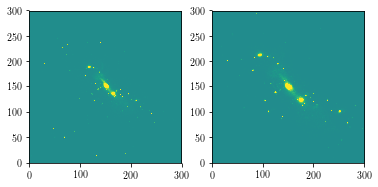

Measuring FULL PARTICLE profile
(36473304., 516, 455, 130, 160, 119, 163, 150.16243397, 147.82793836, 16.34817841, 47.11788865, 22.39759437, 0., 0., 0., 7.67499542, 2.13553524, 1.08633733, 0.17539455, 0.06085547, -0.16674839, 2.75463897e+11, 2.75862323e+11, 2.74654843e+10, 7.6576342e+10, 150, 148, 150, 148, 1)


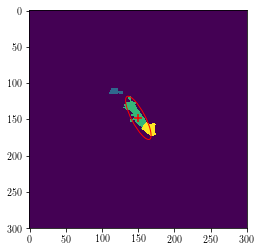

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.16243397395723 147.82793835864075
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_44_xy_full_particles.fits
###      Input Image   : temp_ALUY3.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

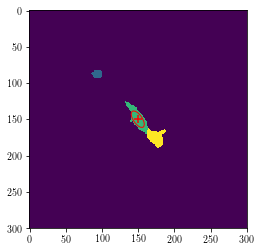

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.3521282697537 149.66791793814212
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_44_xy_full_particles.fits
###      Input Image   : temp_E1NZI.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

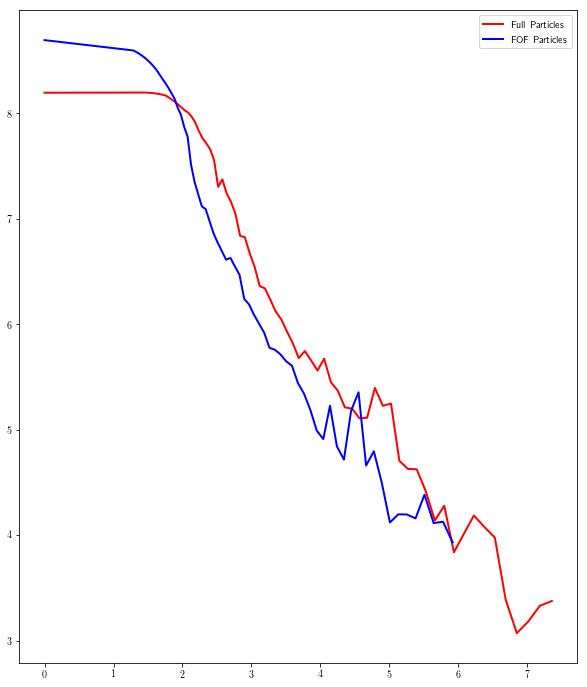

Galaxy 363
(83, u'subbox_083_ptlstr_Coordinates', u'subbox_083_ptlstr_Masses')
Pixel Scales: 4.46957584968, 5.3333 kpc/pixel


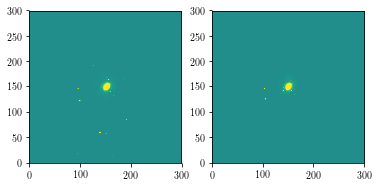

Measuring FULL PARTICLE profile
(17200944., 520, 482, 139, 166, 135, 163, 151.72675364, 149.69537652, 6.67317054, 8.21691262, -2.35328532, 0., 0., 0., 3.14986992, 2.22899151, -0.94386834, 0.16668887, 0.13537242, 0.09547783, 2.62486196e+11, 2.62666584e+11, 2.09725501e+10, 4.88999485e+10, 152, 150, 152, 150, 0)


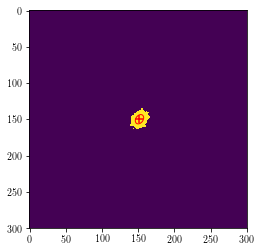

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.72675364361334 149.6953765232372
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_363_xy_full_particles.fits
###      Input Image   : temp_JNK9S.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

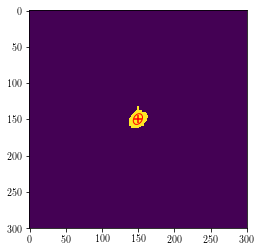

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.55147098342312 149.48246915882896
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_363_xy_full_particles.fits
###      Input Image   : temp_FVTY6.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

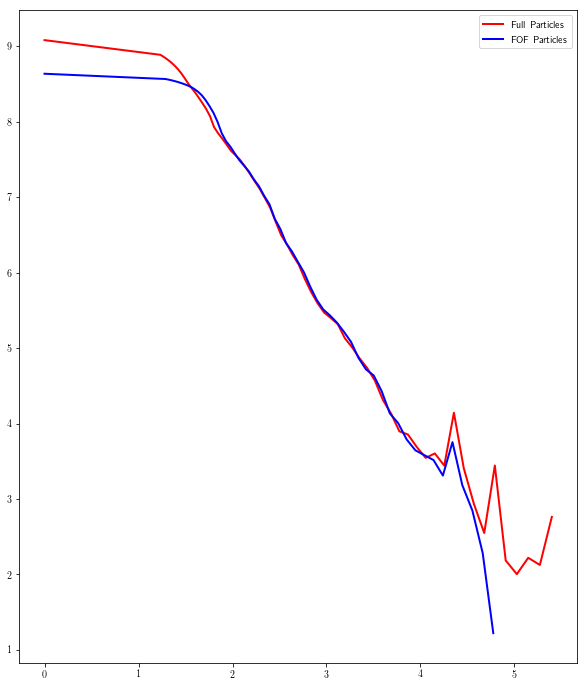

Galaxy 339
(84, u'subbox_084_ptlstr_Coordinates', u'subbox_084_ptlstr_Masses')
Pixel Scales: 3.8758416379, 5.3333 kpc/pixel


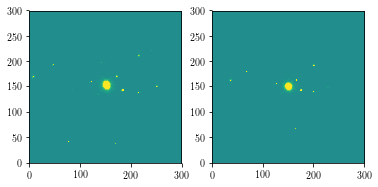

Measuring FULL PARTICLE profile
(22062712., 346, 331, 142, 161, 136, 158, 151.78874402, 146.84701141, 6.26720677, 8.38960761, 1.15377235, 0., 0., 0., 2.98261571, 2.40017033, 1.1572125, 0.16370536, 0.12229122, -0.04502683, 1.58380278e+11, 1.58555767e+11, 9.83885107e+09, 2.47737958e+10, 152, 147, 152, 147, 0)


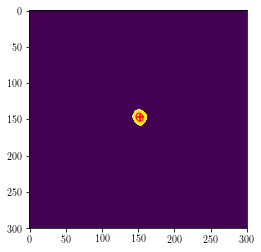

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.78874402263202 146.8470114136009
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_339_xy_full_particles.fits
###      Input Image   : temp_NDEJI.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

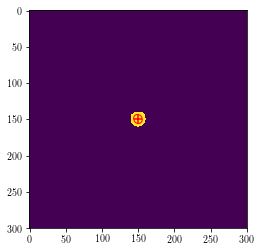

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.61864038842995 149.3771944938971
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_339_xy_full_particles.fits
###      Input Image   : temp_LWMAR.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

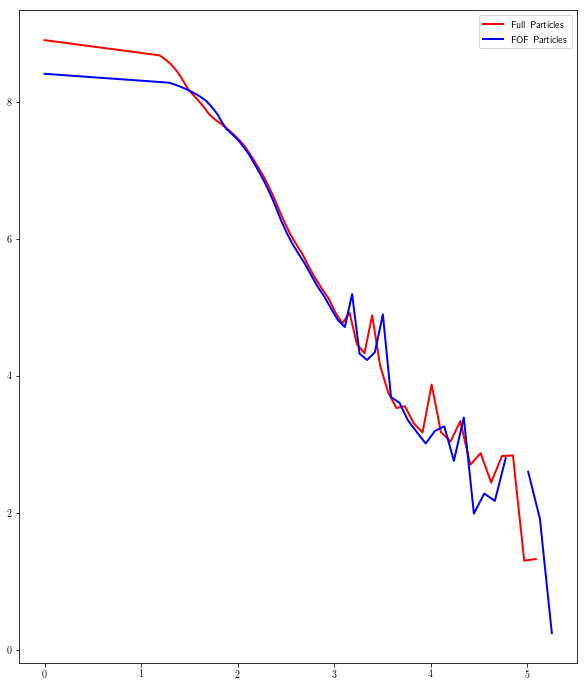

Galaxy 150
(85, u'subbox_085_ptlstr_Coordinates', u'subbox_085_ptlstr_Masses')
Pixel Scales: 5.4084799865, 5.3333 kpc/pixel


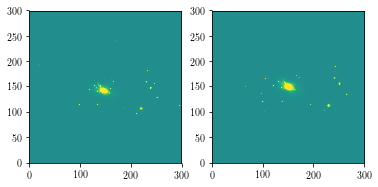

Measuring FULL PARTICLE profile
(11508969., 913, 868, 125, 168, 141, 171, 144.90461542, 156.38647508, 25.19775337, 11.97969802, 7.38636441, 0., 0., 0., 5.33855915, 2.94571495, 0.42044175, 0.04844136, 0.10189016, -0.05973532, 2.3431843e+11, 2.34505601e+11, 1.9008258e+10, 5.1631063e+10, 146, 157, 146, 157, 0)


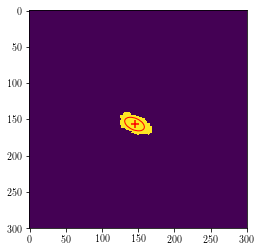

----------------------------------------------------------------------------------------------------
###      galX, galY :  144.9046154216245 156.38647508066956
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_150_xy_full_particles.fits
###      Input Image   : temp_CUCTN.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

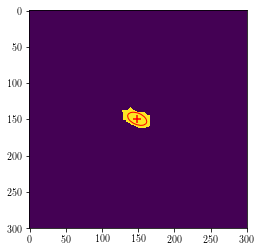

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.57333432695663 149.10556024359906
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_150_xy_full_particles.fits
###      Input Image   : temp_219LC.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

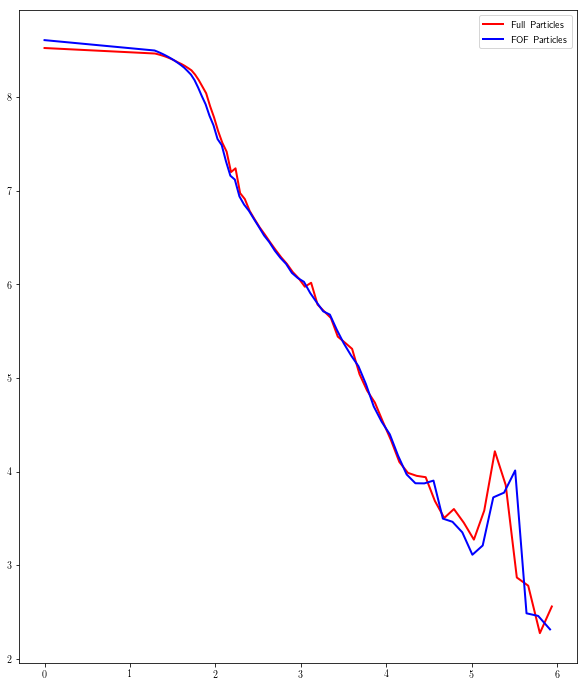

Galaxy 195
(86, u'subbox_086_ptlstr_Coordinates', u'subbox_086_ptlstr_Masses')
Pixel Scales: 5.2955233653, 5.3333 kpc/pixel


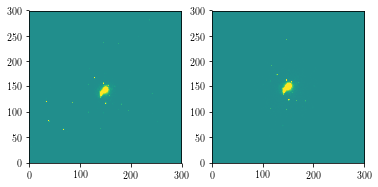

Measuring FULL PARTICLE profile
(18406008., 429, 402, 135, 163, 141, 170, 149.21755665, 155.85847234, 6.1410679, 11.15889696, 0.28209238, 0., 0., 0., 3.34285903, 2.47492599, 1.51481342, 0.16302744, 0.08971877, -0.00824253, 1.93271349e+11, 1.93481638e+11, 1.97511782e+10, 5.83519805e+10, 149, 156, 149, 156, 1)


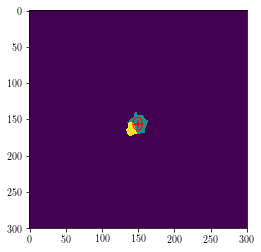

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.2175566484908 155.85847233801348
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_195_xy_full_particles.fits
###      Input Image   : temp_T5U3R.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

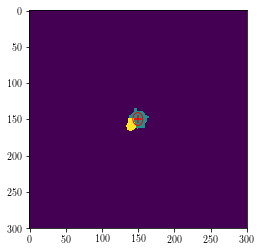

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.41931050340028 149.4256226267929
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_195_xy_full_particles.fits
###      Input Image   : temp_T07OU.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

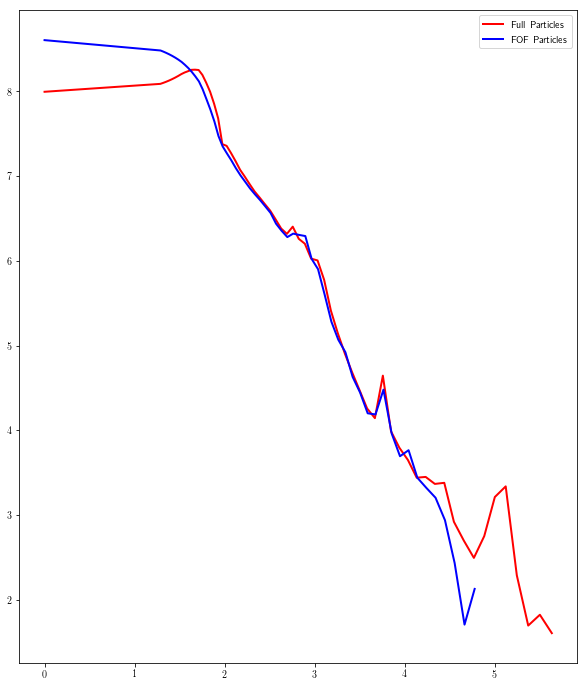

Galaxy 46
(87, u'subbox_087_ptlstr_Coordinates', u'subbox_087_ptlstr_Masses')
Pixel Scales: 7.20655174153, 5.3333 kpc/pixel


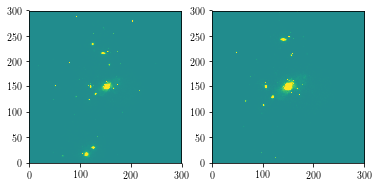

Measuring FULL PARTICLE profile
(22761190., 946, 894, 131, 178, 133, 168, 153.07308172, 149.46548635, 29.58768189, 12.52110792, -7.70534824, 0., 0., 0., 5.70541477, 3.09144473, -0.36722827, 0.04024809, 0.09510722, 0.04953644, 4.04879999e+11, 4.05253226e+11, 2.35586888e+10, 4.89309676e+10, 152, 150, 152, 150, 1)


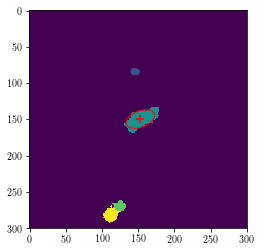

----------------------------------------------------------------------------------------------------
###      galX, galY :  153.07308171700564 149.46548635382658
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_46_xy_full_particles.fits
###      Input Image   : temp_PW4B1.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

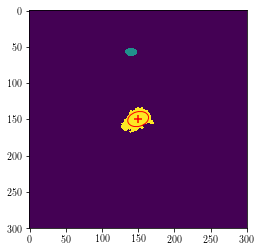

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.90302926725317 149.4779087533375
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_46_xy_full_particles.fits
###      Input Image   : temp_2PEBC.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

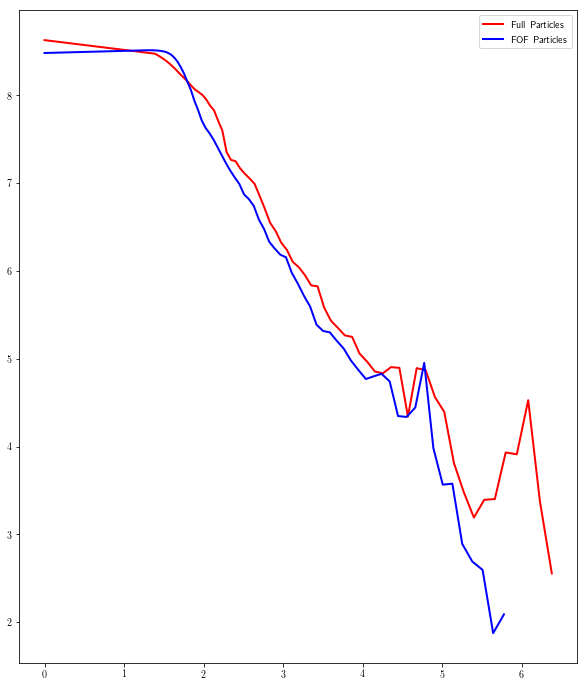

Galaxy 48
(88, u'subbox_088_ptlstr_Coordinates', u'subbox_088_ptlstr_Masses')
Pixel Scales: 8.39338982008, 5.3333 kpc/pixel


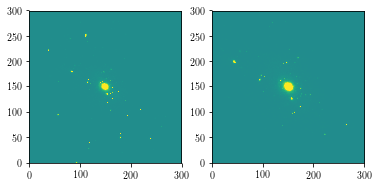

Measuring FULL PARTICLE profile
(24700862., 854, 807, 132, 166, 134, 169, 148.81548653, 150.30124526, 11.10386884, 19.80144685, 5.9982536, 0., 0., 0., 4.78137064, 2.83616138, 1.09905529, 0.10767882, 0.06038202, -0.06523612, 8.03588276e+11, 8.04078092e+11, 5.94300232e+10, 1.22689839e+11, 149, 149, 149, 149, 0)


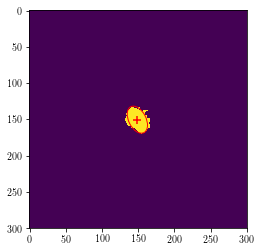

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.81548652664432 150.30124526329018
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_48_xy_full_particles.fits
###      Input Image   : temp_DL436.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

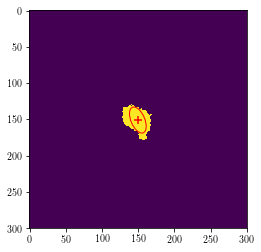

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.4855403005727 150.7973057787628
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_48_xy_full_particles.fits
###      Input Image   : temp_0MPN5.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

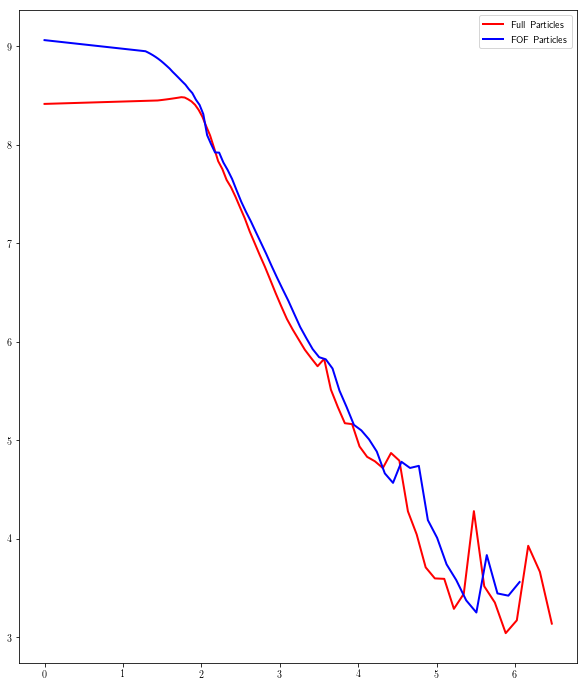

Galaxy 56
(89, u'subbox_089_ptlstr_Coordinates', u'subbox_089_ptlstr_Masses')
Pixel Scales: 7.060995221, 5.3333 kpc/pixel


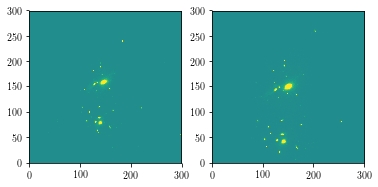

Measuring FULL PARTICLE profile
(33781696., 453, 427, 132, 160, 130, 155, 146.10121365, 141.08170208, 15.55679916, 5.52213525, -0.98231238, 0., 0., 0., 3.95626783, 2.32956624, -0.09666913, 0.0650108, 0.18314654, 0.02312907, 3.75751999e+11, 3.81772956e+11, 3.7650817e+10, 1.0727619e+11, 146, 141, 146, 141, 1)


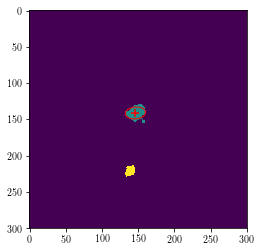

----------------------------------------------------------------------------------------------------
###      galX, galY :  146.10121364936887 141.08170208414262
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_56_xy_full_particles.fits
###      Input Image   : temp_RRRBT.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

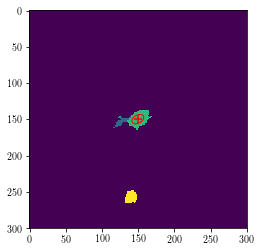

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.45958057142676 149.54708509089218
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_56_xy_full_particles.fits
###      Input Image   : temp_W37P4.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

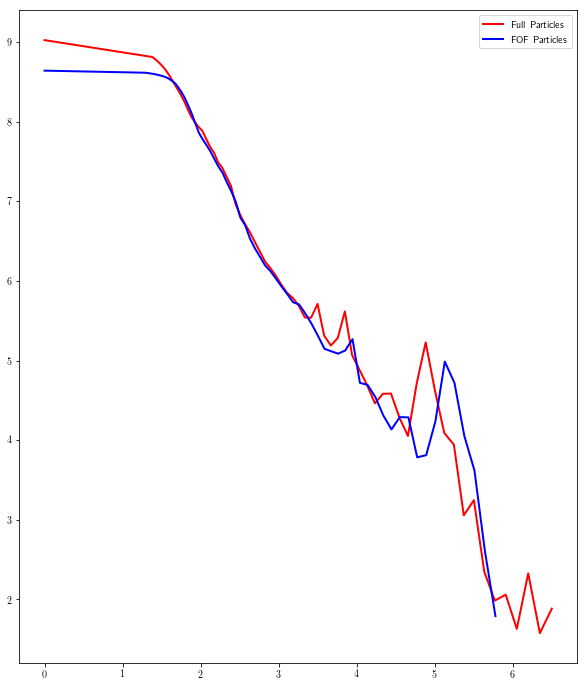

Galaxy 214
(90, u'subbox_090_ptlstr_Coordinates', u'subbox_090_ptlstr_Masses')
Pixel Scales: 5.44419520378, 5.3333 kpc/pixel


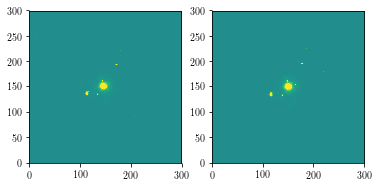

Measuring FULL PARTICLE profile
(24809316., 452, 419, 134, 159, 136, 160, 145.6836668, 147.88629927, 7.2898512, 10.25657091, 0.67407984, 0., 0., 0., 3.22529817, 2.67280269, 1.35753131, 0.13801576, 0.09809461, -0.01814128, 1.96294509e+11, 1.96449714e+11, 1.64617206e+10, 3.50160978e+10, 146, 148, 146, 148, 0)


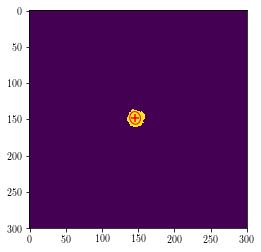

----------------------------------------------------------------------------------------------------
###      galX, galY :  145.68366679567055 147.88629927267172
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_214_xy_full_particles.fits
###      Input Image   : temp_VQMZZ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

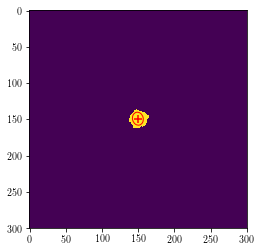

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.49800915942654 148.95418295619476
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_214_xy_full_particles.fits
###      Input Image   : temp_S8YQM.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

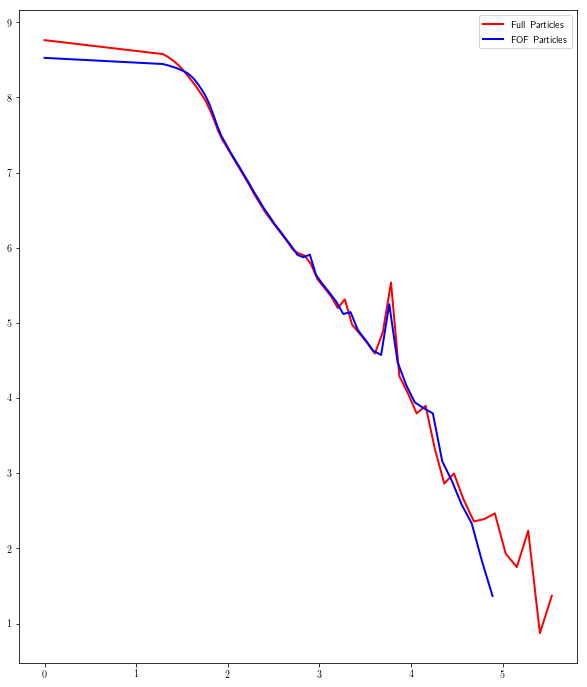

In [83]:
for i, Group_ID in enumerate(Group_IDs): 
    print('Galaxy {0}'.format(Group_ID))
    
    positions_key = keys[2*i]
    masses_key = keys[(2*i)+1]
    
    print(i, positions_key, masses_key)
    
    particle_positions = np.array(full_particles_file[positions_key])
    particle_masses = np.array(full_particles_file[masses_key])

    #convert from comoving h-inverse to physical real-h
    particle_positions = particle_positions / float(h_tng*(1+z_tng)) 
    
    
    xmin, xmax = min(particle_positions[:,0]), max(particle_positions[:,0]), 
    x_length = xmax - xmin
    
    ymin, ymax = min(particle_positions[:,1]), max(particle_positions[:,1]), 
    y_length = ymax - ymin
    
    
    
#     hist, _, _, _ = plt.hist2d(particle_positions[:,0], particle_positions[:,1], weights = particle_masses,
#                            bins=[x_length/5.33,y_length/5.33],norm=mcolors.LogNorm())

    hist, _, _, _ = plt.hist2d(particle_positions[:,0], particle_positions[:,1], weights = particle_masses,
                           bins=[300,300],norm=mcolors.LogNorm())
    
    pixel_scale_full = np.mean([x_length, y_length])/300.
    print('Pixel Scales: {0}, {1} kpc/pixel'.format(pixel_scale_full, 5.3333))
    
    plt.clf()
    m, s = np.mean(hist), np.std(hist)
    plt.subplot(121)
    plt.imshow(np.flipud(hist), interpolation='nearest', cmap=plt.get_cmap('viridis'),
                   vmin=m-s, vmax=m+s, origin='lower')
    
    
    #FOF plot
    FOF_galaxy_index = np.where(FOF_galaxy_IDS==Group_ID)[0][0]
    
    img_cen, img_cen_sat, img_cen_icl, pixel_scale, m_cat = get_mass_maps(FOF_particles_file_location,
                                                                          gal_n=FOF_galaxy_index)
    img_all = img_cen_sat + img_cen_icl - img_cen
    
    m, s = np.mean(img_all), np.std(img_all)
    
    plt.subplot(122)
    plt.imshow(np.flipud(img_all), interpolation='nearest', cmap=plt.get_cmap('viridis'),
                   vmin=m-s, vmax=m+s, origin='lower')
    plt.show()
    
    print('Measuring FULL PARTICLE profile')
    hist = np.ascontiguousarray(hist)
    full_particles_iso, _,_,_ = measure_profile_from_map(hist,Group_ID,pixel_scale=pixel_scale_full)
    
    print('Measuring FOF PARTICLES profile')
    FOF_particles_iso, _,_,_ = measure_profile_from_map(img_all,Group_ID,pixel_scale=5.33333)
    
    #plot profiles
    fig = plt.figure(figsize=(10, 12))
    ax1 = plt.subplot()
    hsc_sma = np.arange(0.4, 5.5, 0.1)
    if full_particles_iso is not None:
        ax1.plot((full_particles_iso['sma_kpc'] ) ** 0.25,
                             np.log10(full_particles_iso['intens_kpc'])+ np.log10(0.7 ** 2.0) , linewidth=2.0,
                             alpha=1, color = 'r', label='Full Particles')
    ax1.plot((FOF_particles_iso['sma_kpc'] ) ** 0.25,
                         np.log10(FOF_particles_iso['intens_kpc'])+ np.log10(0.7 ** 2.0) , linewidth=2.0,
                         alpha=1, color = 'b', label='FOF Particles')
    plt.legend()
    
    plt.show()

## use the same ellipticity parameters measured for the FULL maps on the FOF maps

In [87]:
full_particles_isos=[]
fof_particles_isos=[]

Galaxy 29
(0, u'subbox_000_ptlstr_Coordinates', u'subbox_000_ptlstr_Masses')
Pixel Scales: 9.55647405376, 5.3333 kpc/pixel


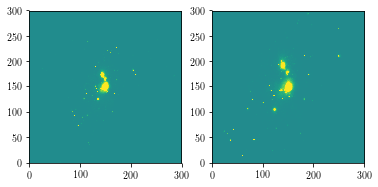

Measuring FULL PARTICLE profile
(30169218., 811, 760, 127, 160, 116, 179, 149.06717346, 150.50800738, 37.44519974, 75.61138767, -40.6812763, 0., 0., 0., 10.07288551, 3.40493107, -1.00470495, 0.06427806, 0.03183257, 0.06916718, 8.08097612e+11, 8.08749171e+11, 3.8607106e+10, 8.88093327e+10, 150, 150, 150, 150, 1)


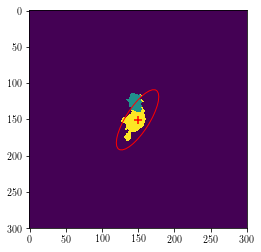

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.06717346215856 150.50800737836428
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_29_xy_full_particles.fits
###      Input Image   : temp_4PIHC.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

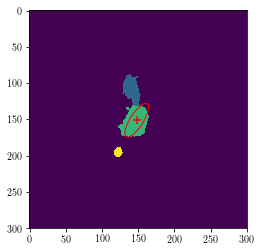

----------------------------------------------------------------------------------------------------
###      galX, galY :  147.88942271717124 151.1407878745708
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_29_xy_full_particles.fits
###      Input Image   : temp_WM1DY.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

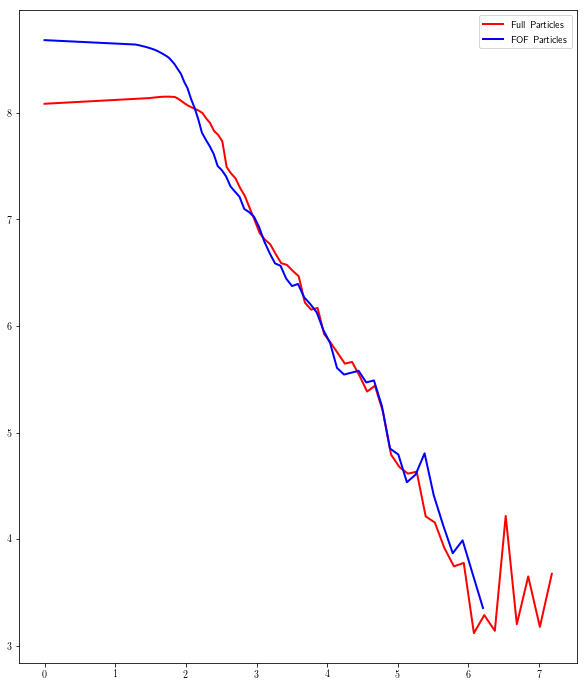

Galaxy 284
(1, u'subbox_001_ptlstr_Coordinates', u'subbox_001_ptlstr_Masses')
Pixel Scales: 4.70209907831, 5.3333 kpc/pixel


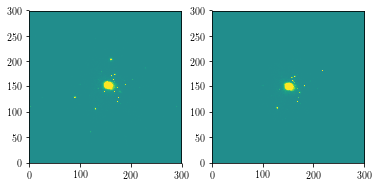

Measuring FULL PARTICLE profile
(16645046., 597, 535, 143, 175, 134, 160, 155.34602657, 147.30537859, 15.05437752, 9.2482602, 0.39019434, 0., 0., 0., 3.88335967, 3.03680015, 0.06680364, 0.06649859, 0.10824682, -0.0056113, 2.65187754e+11, 2.65367142e+11, 1.67638508e+10, 4.05976269e+10, 154, 147, 154, 147, 0)


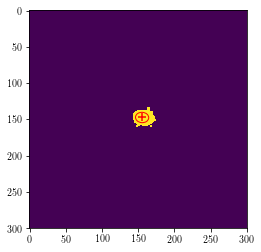

----------------------------------------------------------------------------------------------------
###      galX, galY :  155.3460265741062 147.30537858630112
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_284_xy_full_particles.fits
###      Input Image   : temp_2RXTR.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

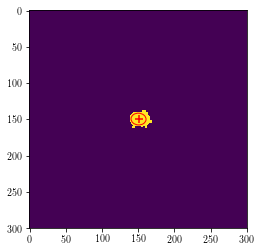

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.43104808604568 149.4706258744038
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_284_xy_full_particles.fits
###      Input Image   : temp_BEJZK.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

/Users/fardila/anaconda/envs/hsc_hydro4/lib/python2.7/site-packages/ipykernel/__main__.py:73: RuntimeWarning: divide by zero encountered in log10


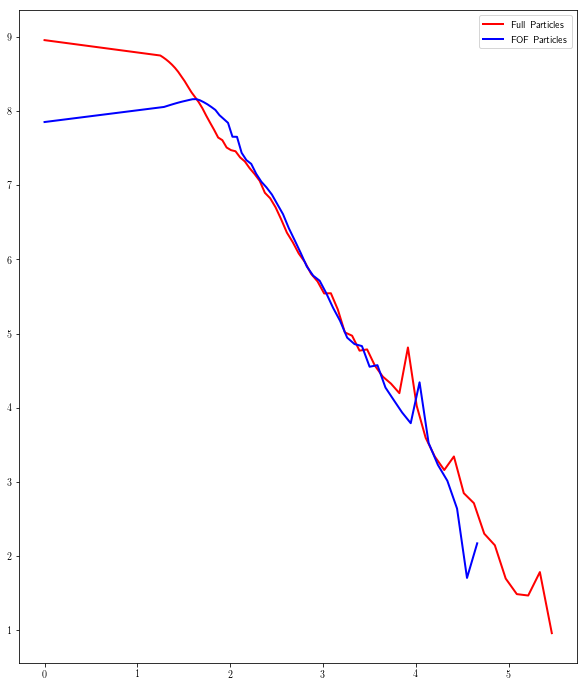

Galaxy 132
(2, u'subbox_002_ptlstr_Coordinates', u'subbox_002_ptlstr_Masses')
Pixel Scales: 5.63643333024, 5.3333 kpc/pixel


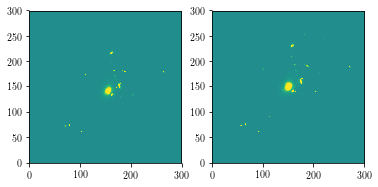

Measuring FULL PARTICLE profile
(20447102., 485, 464, 143, 167, 144, 172, 154.89919945, 157.20262986, 6.65932752, 8.31392356, -1.82753531, 0., 0., 0., 3.08102155, 2.34105921, -0.99794048, 0.15980554, 0.12800182, 0.0702557, 2.12419969e+11, 2.12560396e+11, 2.16361226e+10, 6.47094272e+10, 155, 157, 155, 157, 1)


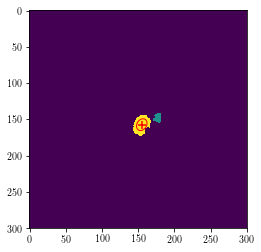

----------------------------------------------------------------------------------------------------
###      galX, galY :  154.89919945470913 157.20262985732322
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_132_xy_full_particles.fits
###      Input Image   : temp_VECJ5.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

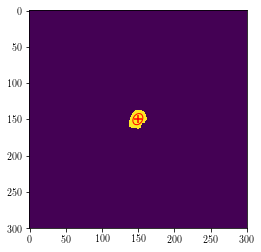

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.4778462379641 149.577017920388
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_132_xy_full_particles.fits
###      Input Image   : temp_H795P.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

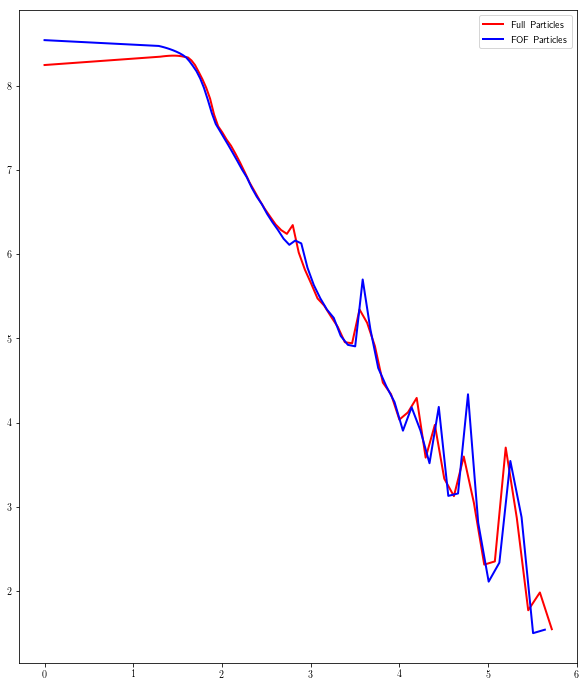

Galaxy 269
(3, u'subbox_003_ptlstr_Coordinates', u'subbox_003_ptlstr_Masses')
Pixel Scales: 4.23885668221, 5.3333 kpc/pixel


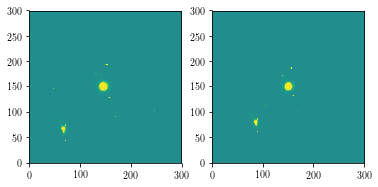

Measuring FULL PARTICLE profile
(14404572., 487, 466, 132, 159, 137, 161, 145.55503608, 149.20516581, 9.07254169, 8.73903512, 0.35838171, 0., 0., 0., 3.04976487, 2.91727805, 0.56764799, 0.11040154, 0.11461478, -0.00905498, 2.19760132e+11, 2.19911487e+11, 1.0932864e+10, 2.08984945e+10, 146, 150, 146, 150, 0)


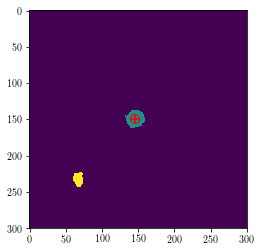

----------------------------------------------------------------------------------------------------
###      galX, galY :  145.55503608319054 149.2051658113734
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_269_xy_full_particles.fits
###      Input Image   : temp_LS192.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

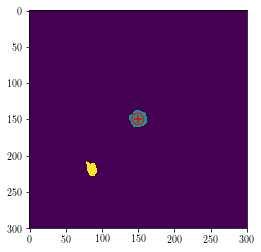

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.48627974814778 149.17284448351168
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_269_xy_full_particles.fits
###      Input Image   : temp_MAWTL.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

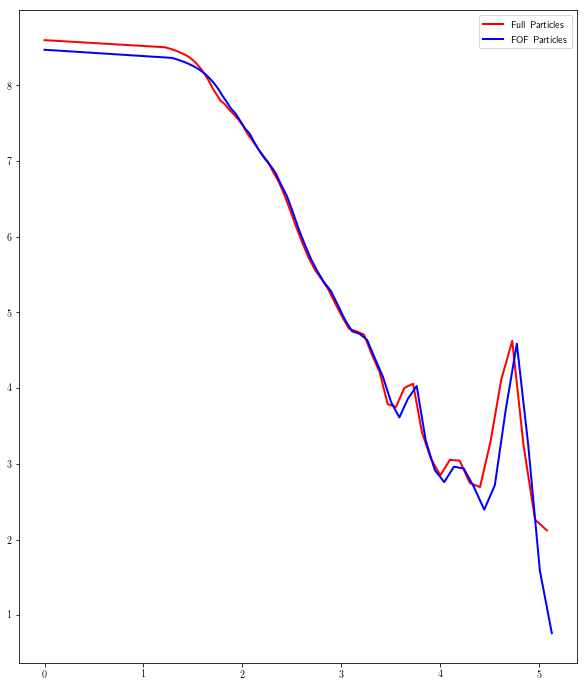

Galaxy 73
(4, u'subbox_004_ptlstr_Coordinates', u'subbox_004_ptlstr_Masses')
Pixel Scales: 6.75600173221, 5.3333 kpc/pixel


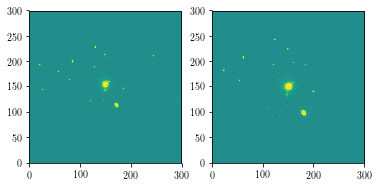

Measuring FULL PARTICLE profile
(19119562., 730, 699, 134, 163, 129, 164, 149.11574193, 145.4025743, 7.21902705, 11.22208461, -0.44315526, 0., 0., 0., 3.3571651, 2.67778921, -1.46184969, 0.13885944, 0.08932655, 0.010967, 4.08739348e+11, 4.09028755e+11, 4.97907384e+10, 1.56703179e+11, 149, 145, 149, 145, 0)


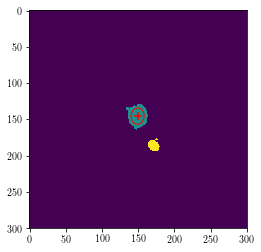

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.11574192969658 145.40257430091307
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_73_xy_full_particles.fits
###      Input Image   : temp_K7I6U.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

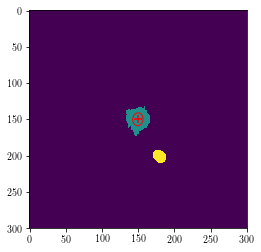

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.50264834090123 149.74566998558117
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_73_xy_full_particles.fits
###      Input Image   : temp_XUW53.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

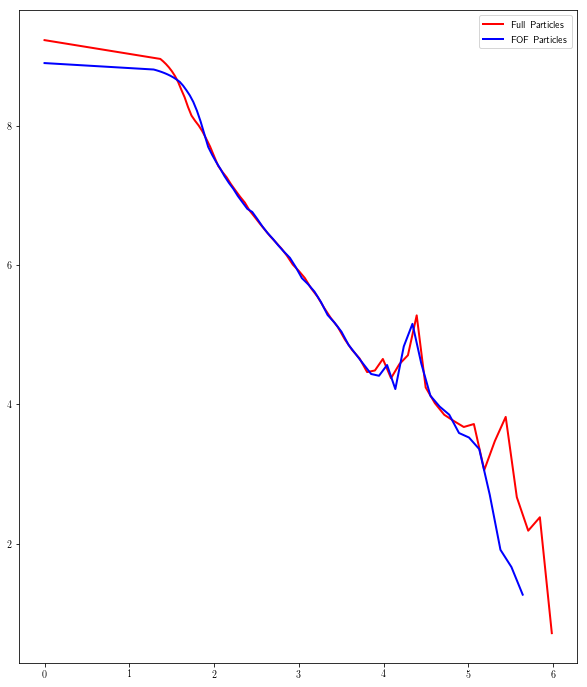

Galaxy 154
(5, u'subbox_005_ptlstr_Coordinates', u'subbox_005_ptlstr_Masses')
Pixel Scales: 5.46486496485, 5.3333 kpc/pixel


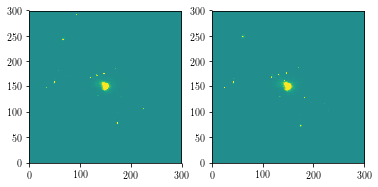

Measuring FULL PARTICLE profile
(19508384., 377, 356, 129, 165, 138, 160, 150.47784791, 149.43457695, 5.43703729, 6.22179149, -1.70820737, 0., 0., 0., 2.75356269, 2.01908922, -0.8982904, 0.20128642, 0.17589818, 0.11052731, 2.64155595e+11, 2.63660323e+11, 2.25589535e+10, 5.30986885e+10, 151, 149, 151, 149, 1)


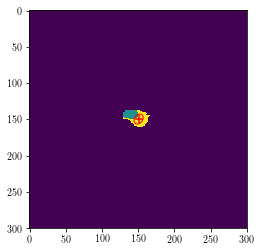

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.4778479139403 149.43457695172123
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_154_xy_full_particles.fits
###      Input Image   : temp_4OR0H.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

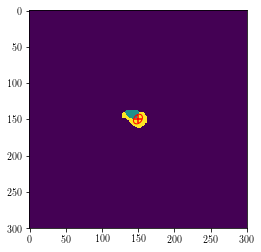

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.57167013212853 149.45119142534128
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_154_xy_full_particles.fits
###      Input Image   : temp_VNU0M.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

/Users/fardila/anaconda/envs/hsc_hydro4/lib/python2.7/site-packages/ipykernel/__main__.py:70: RuntimeWarning: divide by zero encountered in log10


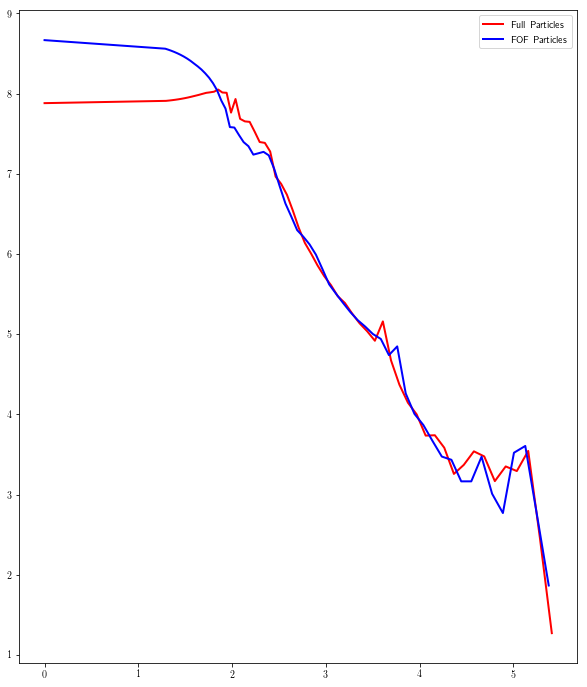

Galaxy 86
(6, u'subbox_006_ptlstr_Coordinates', u'subbox_006_ptlstr_Masses')
Pixel Scales: 6.8000912395, 5.3333 kpc/pixel


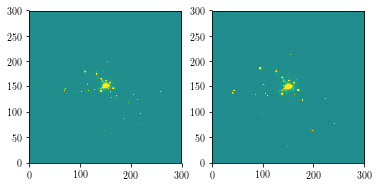

Measuring FULL PARTICLE profile
(19207692., 639, 587, 128, 165, 118, 162, 150.41686136, 147.17582224, 50.96820308, 71.43382934, 46.7629578, 0., 0., 0., 10.44368076, 3.65124106, 0.89311188, 0.04912649, 0.03505186, -0.06431966, 3.19254561e+11, 3.19558877e+11, 1.94422702e+10, 4.75512054e+10, 150, 147, 150, 147, 1)


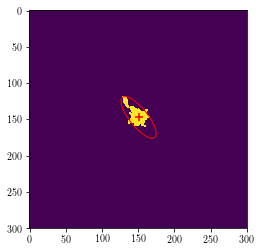

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.41686135503613 147.1758222427445
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_86_xy_full_particles.fits
###      Input Image   : temp_Z0HO6.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

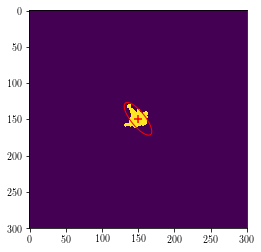

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.67157441923976 149.13258986110463
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_86_xy_full_particles.fits
###      Input Image   : temp_LWD8U.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

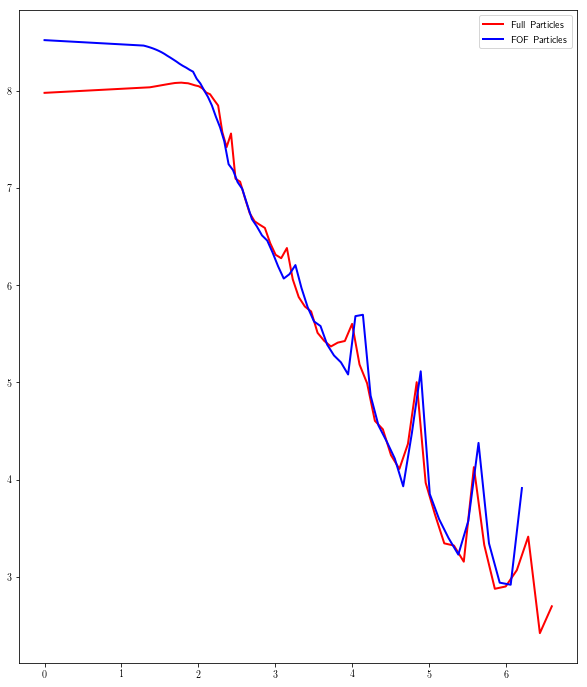

Galaxy 211
(7, u'subbox_007_ptlstr_Coordinates', u'subbox_007_ptlstr_Masses')
Pixel Scales: 3.80342158929, 5.3333 kpc/pixel


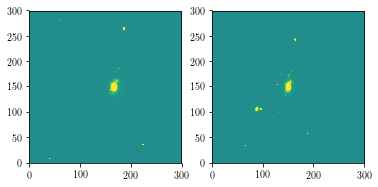

Measuring FULL PARTICLE profile
(20990488., 576, 548, 154, 178, 134, 167, 166.45249143, 149.90538154, 7.10910295, 15.56939938, -2.40695576, 0., 0., 0., 4.02569771, 2.54406404, -1.31213951, 0.14843404, 0.06777608, 0.04589441, 1.72861211e+11, 1.73117555e+11, 1.39034132e+10, 3.3727531e+10, 167, 150, 167, 150, 0)


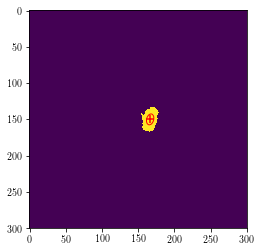

----------------------------------------------------------------------------------------------------
###      galX, galY :  166.45249142953267 149.90538153534297
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_211_xy_full_particles.fits
###      Input Image   : temp_DOAAO.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

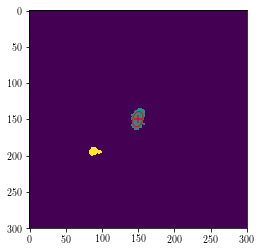

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.42028124493092 149.5667291471334
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_211_xy_full_particles.fits
###      Input Image   : temp_P7EDC.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

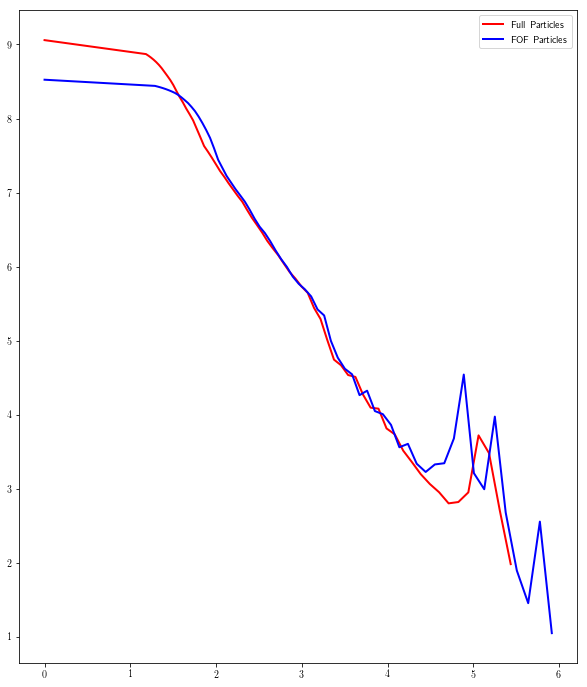

Galaxy 201
(8, u'subbox_008_ptlstr_Coordinates', u'subbox_008_ptlstr_Masses')
Pixel Scales: 4.64782047815, 5.3333 kpc/pixel


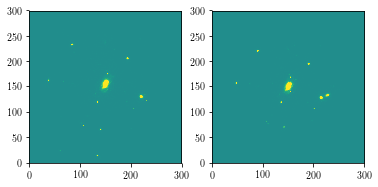

Measuring FULL PARTICLE profile
(17002492., 506, 475, 140, 161, 123, 161, 149.85544589, 144.42761151, 5.87462386, 17.47707239, -4.29739674, 0., 0., 0., 4.3468833, 2.11099601, -1.25201118, 0.20755729, 0.06976689, 0.10207156, 2.21056483e+11, 2.21332603e+11, 1.92081879e+10, 5.17922652e+10, 150, 145, 150, 145, 0)


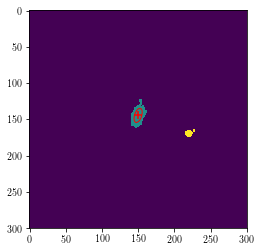

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.855445887816 144.42761150685521
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_201_xy_full_particles.fits
###      Input Image   : temp_ARGF6.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

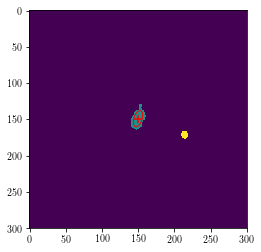

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.69229853321573 149.01608674245497
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_201_xy_full_particles.fits
###      Input Image   : temp_O08F1.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

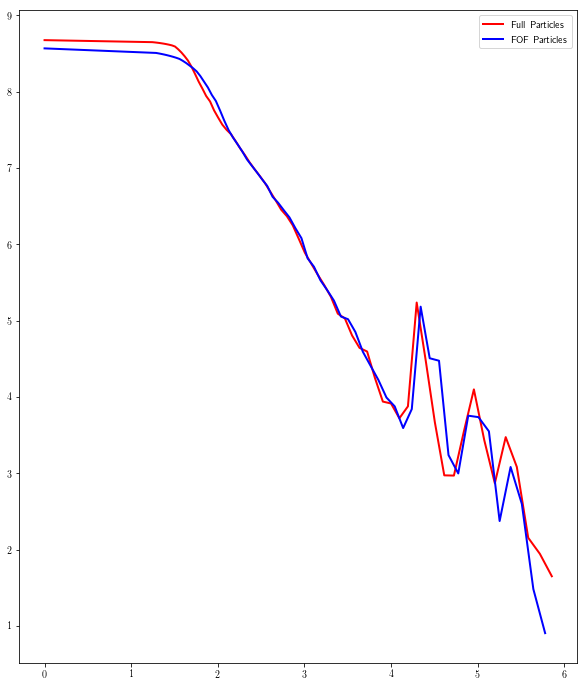

Galaxy 94
(9, u'subbox_009_ptlstr_Coordinates', u'subbox_009_ptlstr_Masses')
Pixel Scales: 5.85846568707, 5.3333 kpc/pixel


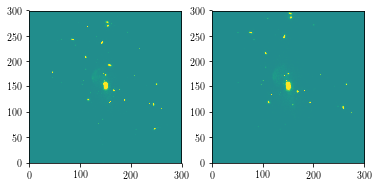

Measuring FULL PARTICLE profile
(25318224., 365, 324, 140, 158, 123, 160, 149.80189338, 146.6210557, 2.44748526, 18.96242923, 1.34666567, 0., 0., 0., 4.36709499, 1.52918136, 1.48996568, 0.42519748, 0.05488034, -0.06039299, 2.81854444e+11, 2.82197e+11, 2.01649869e+10, 5.94205082e+10, 150, 149, 150, 149, 0)


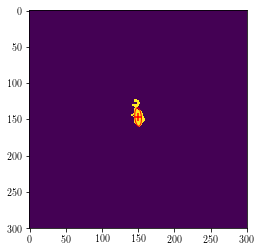

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.80189337755095 146.62105570334063
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_94_xy_full_particles.fits
###      Input Image   : temp_LR9QU.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

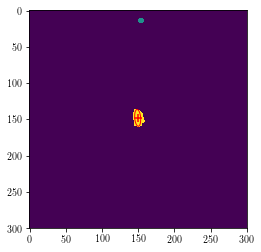

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.24613197942884 147.81623497025458
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_94_xy_full_particles.fits
###      Input Image   : temp_VDILT.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

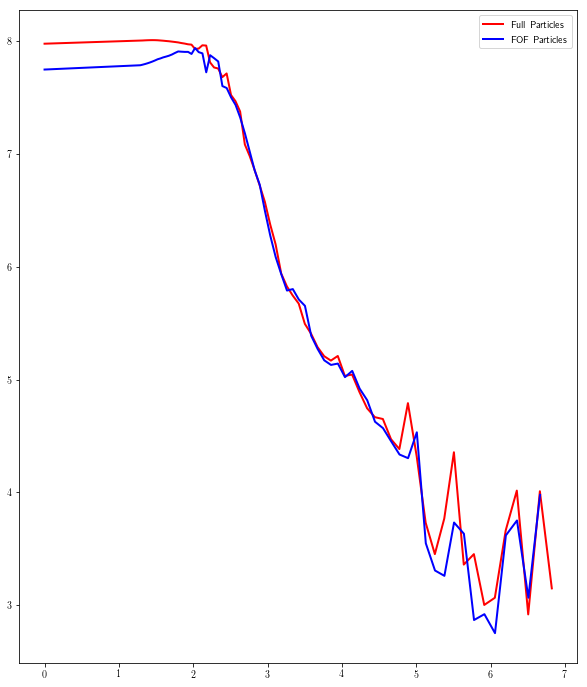

Galaxy 67
(10, u'subbox_010_ptlstr_Coordinates', u'subbox_010_ptlstr_Masses')
Pixel Scales: 7.59465770178, 5.3333 kpc/pixel


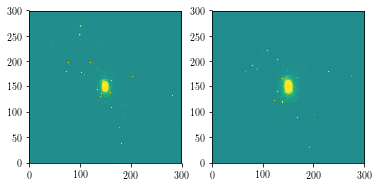

Measuring FULL PARTICLE profile
(28310230., 988, 951, 133, 163, 128, 172, 148.77419021, 149.70831157, 10.89357224, 24.73764822, -0.56859164, 0., 0., 0., 4.97603893, 3.29700756, -1.52981722, 0.09190752, 0.04047277, 0.00422496, 7.32814639e+11, 7.33311271e+11, 4.79250227e+10, 1.0951938e+11, 149, 149, 149, 149, 0)


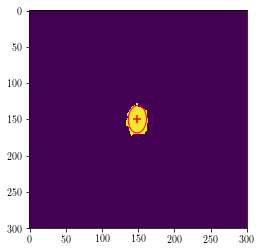

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.77419021298712 149.70831156651926
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_67_xy_full_particles.fits
###      Input Image   : temp_C49YH.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

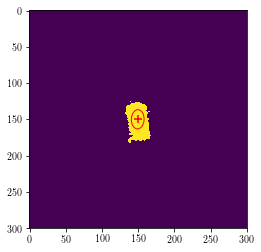

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.300082945047 149.84296312103538
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_67_xy_full_particles.fits
###      Input Image   : temp_H0QR0.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

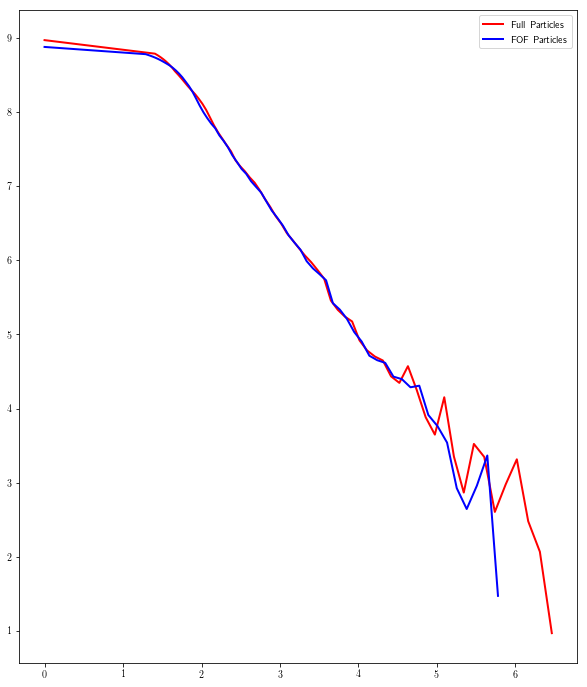

Galaxy 160
(11, u'subbox_011_ptlstr_Coordinates', u'subbox_011_ptlstr_Masses')
Pixel Scales: 5.33204427061, 5.3333 kpc/pixel


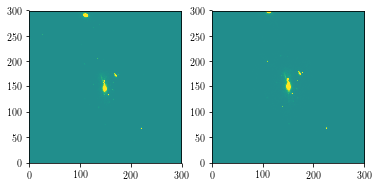

Measuring FULL PARTICLE profile
(18567552., 534, 504, 139, 157, 124, 168, 147.98783523, 151.13580194, 3.33169918, 33.79454001, 4.58869434, 0., 0., 0., 5.87117863, 1.6295712, 1.42448783, 0.36918944, 0.03639724, -0.10025865, 2.52017164e+11, 2.52270526e+11, 2.62725079e+10, 7.98573281e+10, 148, 153, 148, 153, 0)


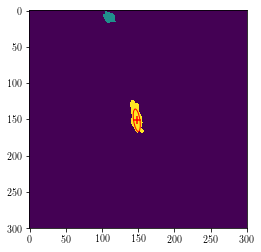

----------------------------------------------------------------------------------------------------
###      galX, galY :  147.98783522728436 151.13580193918415
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_160_xy_full_particles.fits
###      Input Image   : temp_VC237.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

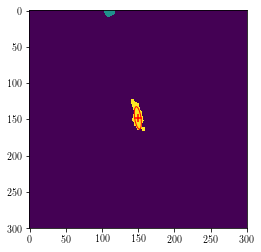

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.44719337364995 147.88595832128175
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_160_xy_full_particles.fits
###      Input Image   : temp_VOCIO.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

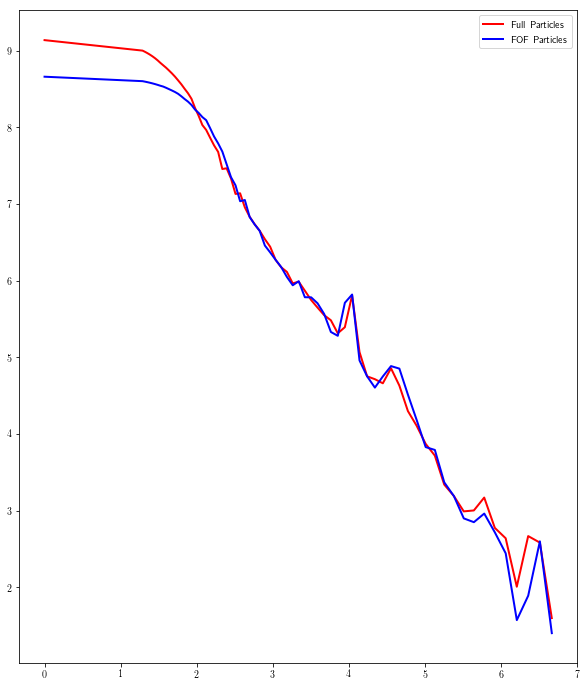

Galaxy 260
(12, u'subbox_012_ptlstr_Coordinates', u'subbox_012_ptlstr_Masses')
Pixel Scales: 5.03073851808, 5.3333 kpc/pixel


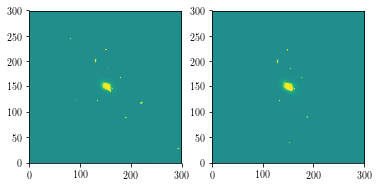

Measuring FULL PARTICLE profile
(14436716., 559, 534, 138, 166, 136, 163, 151.93562688, 149.28299748, 10.87237338, 8.52152631, 4.25009363, 0., 0., 0., 3.75587392, 2.29941535, 0.65048826, 0.11425114, 0.14576979, -0.11396504, 1.91513543e+11, 1.91682658e+11, 1.7046869e+10, 5.20758927e+10, 152, 149, 152, 149, 0)


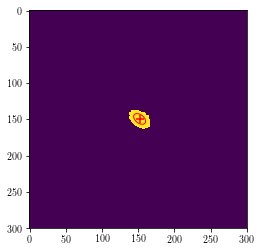

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.93562688187464 149.28299747536576
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_260_xy_full_particles.fits
###      Input Image   : temp_FMEFN.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

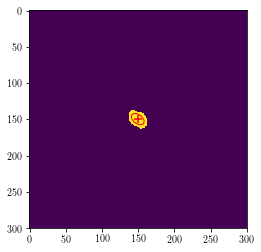

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.3132224833235 149.57017593549054
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_260_xy_full_particles.fits
###      Input Image   : temp_UZQ3N.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

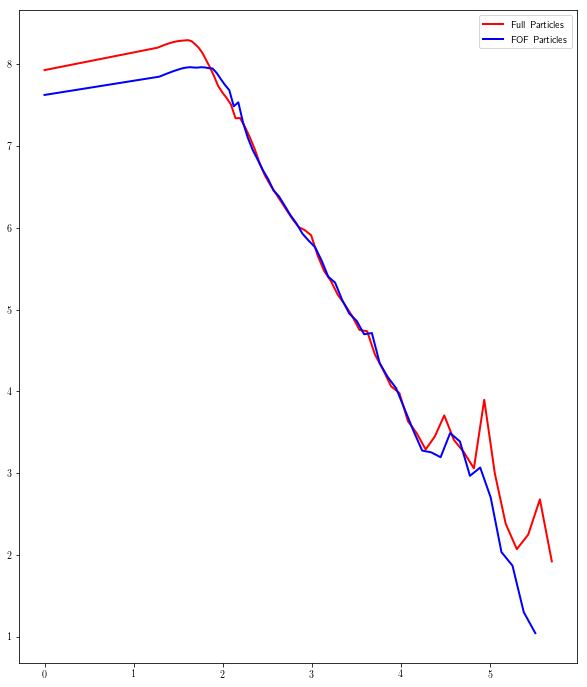

Galaxy 199
(13, u'subbox_013_ptlstr_Coordinates', u'subbox_013_ptlstr_Masses')
Pixel Scales: 4.75256395288, 5.3333 kpc/pixel


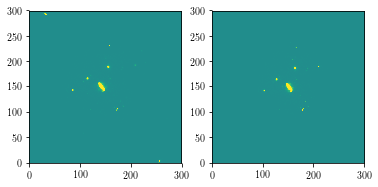

Measuring FULL PARTICLE profile
(11374584., 172, 157, 137, 153, 143, 161, 145.76388918, 153.17218112, 2.64641716, 3.11468941, 0.09036712, 0., 0., 0., 1.769611, 1.62159896, 1.3866241, 0.3782441, 0.32137769, -0.02194815, 9.73257114e+10, 9.69395978e+10, 9.64804813e+09, 2.25040712e+10, 146, 153, 146, 153, 1)


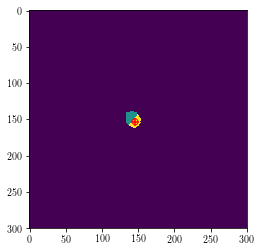

----------------------------------------------------------------------------------------------------
###      galX, galY :  145.76388917869096 153.17218111528794
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_199_xy_full_particles.fits
###      Input Image   : temp_R61F0.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

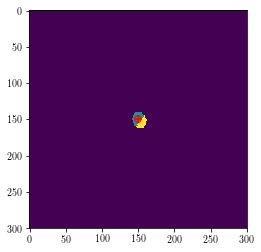

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.50851375268223 149.4764850065048
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_199_xy_full_particles.fits
###      Input Image   : temp_OOBH5.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

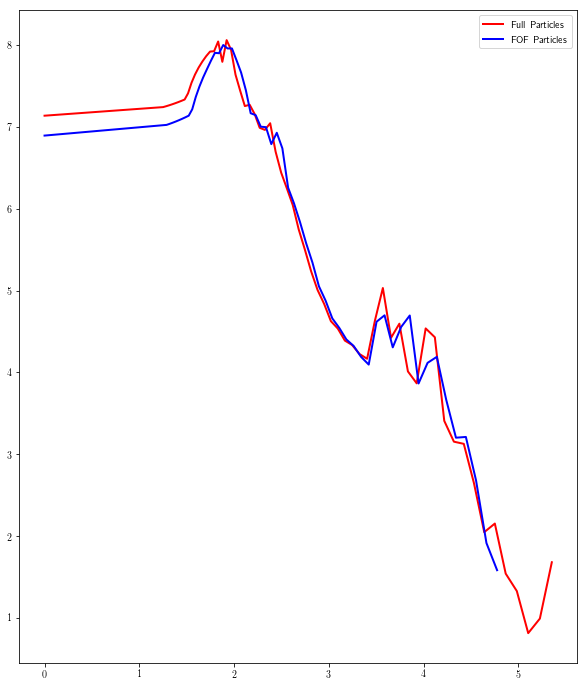

Galaxy 5
(14, u'subbox_014_ptlstr_Coordinates', u'subbox_014_ptlstr_Masses')
Pixel Scales: 13.0514807268, 5.3333 kpc/pixel


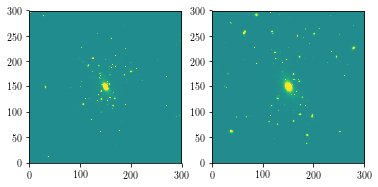

Measuring FULL PARTICLE profile
(30406170., 1433, 1297, 134, 173, 120, 195, 150.46921048, 153.65861272, 45.28537766, 174.64017301, 45.09686472, 0., 0., 0., 13.74081707, 5.57812691, 1.26635444, 0.0297264, 0.00770826, -0.01535234, 1.72282216e+12, 1.72418951e+12, 9.81778268e+10, 2.04416254e+11, 150, 150, 150, 150, 0)


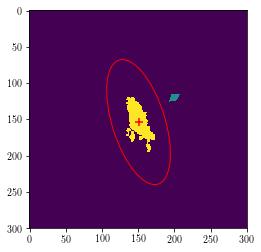

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.46921048082288 153.6586127210399
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_5_xy_full_particles.fits
###      Input Image   : temp_OX8FT.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

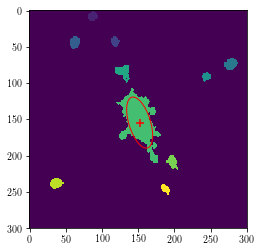

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.96404439276236 154.30931218401554
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_5_xy_full_particles.fits
###      Input Image   : temp_49DMF.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

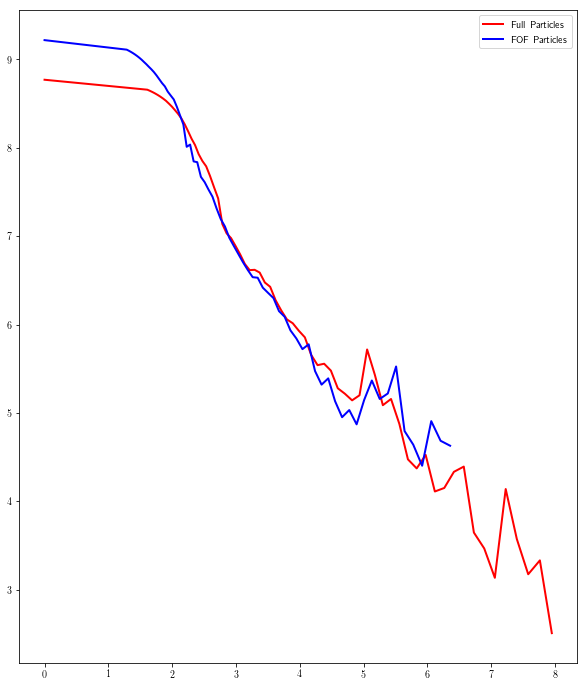

Galaxy 163
(15, u'subbox_015_ptlstr_Coordinates', u'subbox_015_ptlstr_Masses')
Pixel Scales: 5.46254347739, 5.3333 kpc/pixel


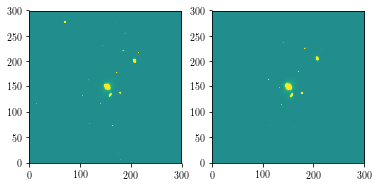

Measuring FULL PARTICLE profile
(19225360., 438, 411, 140, 165, 138, 162, 153.16427914, 149.89470742, 5.13657649, 5.29432327, 0.57345403, 0., 0., 0., 2.40713573, 2.15327597, 0.8537398, 0.19706519, 0.19119355, -0.04269019, 2.35996234e+11, 2.36136022e+11, 2.25483223e+10, 6.18161398e+10, 153, 150, 153, 150, 1)


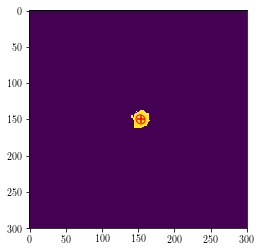

----------------------------------------------------------------------------------------------------
###      galX, galY :  153.16427913918028 149.89470741764214
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_163_xy_full_particles.fits
###      Input Image   : temp_GKC9R.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

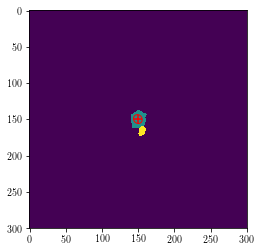

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.4881275128911 149.50757511308873
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_163_xy_full_particles.fits
###      Input Image   : temp_JF1M2.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

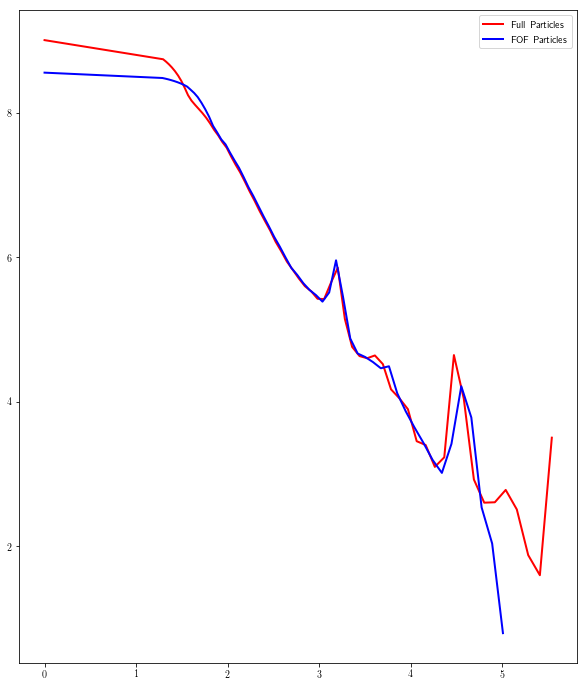

Galaxy 147
(16, u'subbox_016_ptlstr_Coordinates', u'subbox_016_ptlstr_Masses')
Pixel Scales: 5.8330985855, 5.3333 kpc/pixel


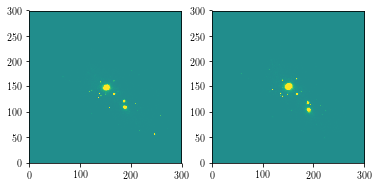

Measuring FULL PARTICLE profile
(16172085., 445, 408, 139, 164, 139, 166, 151.07683349, 151.34027135, 7.55292665, 5.81136867, 1.2187711, 0., 0., 0., 2.86007571, 2.27689767, 0.47521144, 0.13703655, 0.17810382, -0.05747912, 2.08457073e+11, 2.08661398e+11, 1.86437345e+10, 4.59428127e+10, 151, 151, 151, 151, 0)


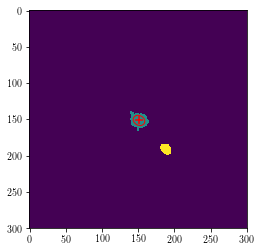

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.0768334904024 151.34027134556618
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_147_xy_full_particles.fits
###      Input Image   : temp_OY9PB.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

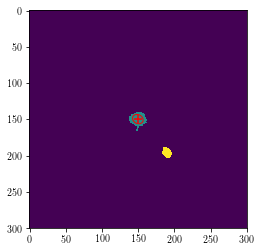

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.47412261745717 149.5420831363994
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_147_xy_full_particles.fits
###      Input Image   : temp_IMQ2V.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

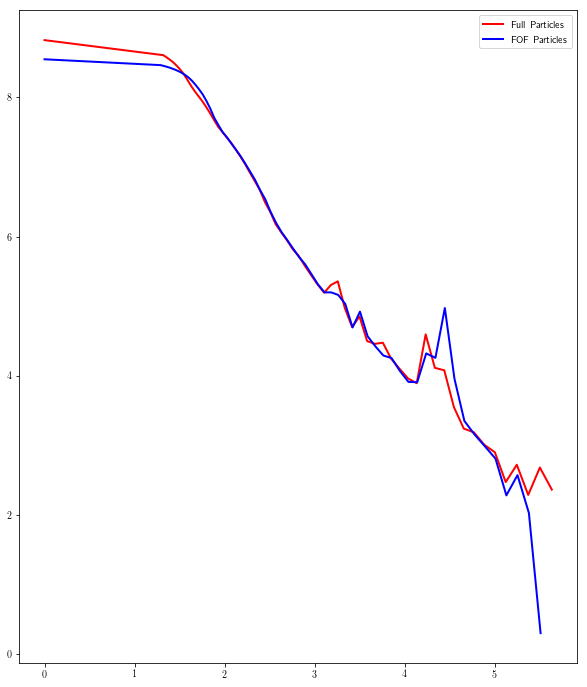

Galaxy 7
(17, u'subbox_017_ptlstr_Coordinates', u'subbox_017_ptlstr_Masses')
Pixel Scales: 13.0022490087, 5.3333 kpc/pixel


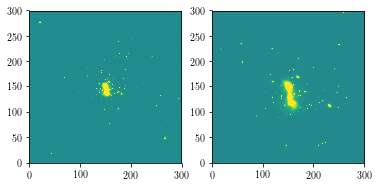

Measuring FULL PARTICLE profile
(24511652., 580, 514, 132, 169, 124, 156, 149.61587376, 148.74464629, 18.80580859, 22.06932742, 0.19827055, 0., 0., 0., 4.69907761, 4.33518267, 1.51033914, 0.0531801, 0.04531605, -0.00095554, 1.17566079e+12, 1.13376258e+12, 5.5753257e+10, 1.09026066e+11, 149, 148, 149, 148, 1)


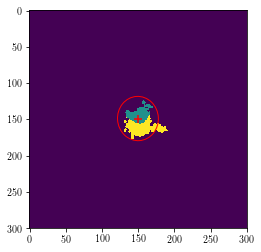

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.6158737584309 148.74464629410312
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_7_xy_full_particles.fits
###      Input Image   : temp_EOC1P.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

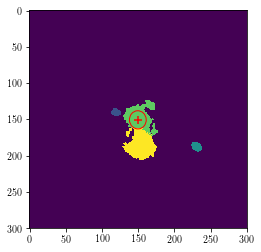

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.47090692232214 150.52839708211283
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_7_xy_full_particles.fits
###      Input Image   : temp_C2PB3.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

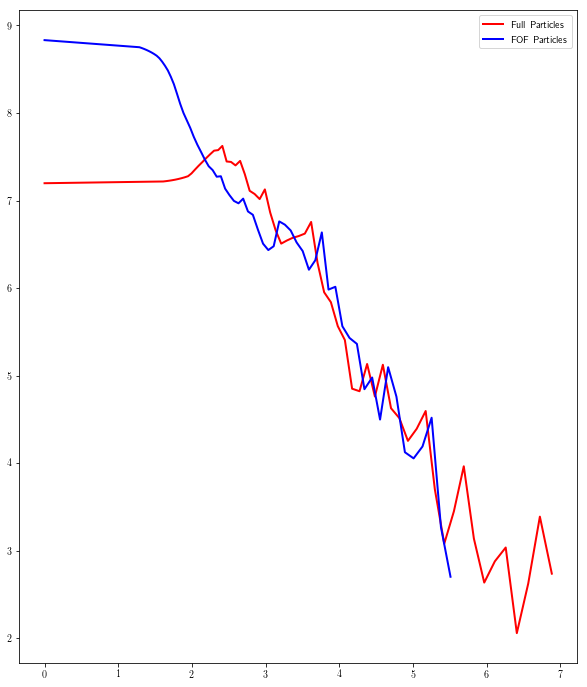

Galaxy 384
(18, u'subbox_018_ptlstr_Coordinates', u'subbox_018_ptlstr_Masses')
Pixel Scales: 3.94969330656, 5.3333 kpc/pixel


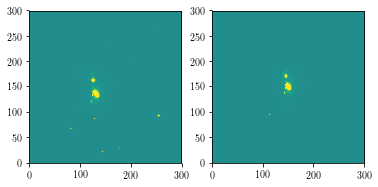

Measuring FULL PARTICLE profile
(24363928., 290, 271, 122, 139, 150, 174, 130.98248116, 163.14358392, 5.70937139, 6.47761917, 2.09526693, 0., 0., 0., 2.86769629, 1.9908061, 0.87605613, 0.1987427, 0.17517176, -0.12857163, 1.57443883e+11, 1.57667033e+11, 1.19522161e+10, 2.74082038e+10, 131, 163, 131, 163, 0)


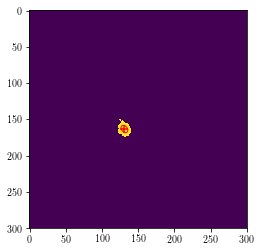

----------------------------------------------------------------------------------------------------
###      galX, galY :  130.98248116197783 163.14358392467273
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_384_xy_full_particles.fits
###      Input Image   : temp_5WU9B.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

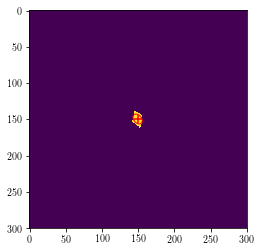

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.20282167139052 149.4081697259791
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_384_xy_full_particles.fits
###      Input Image   : temp_ADKYV.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

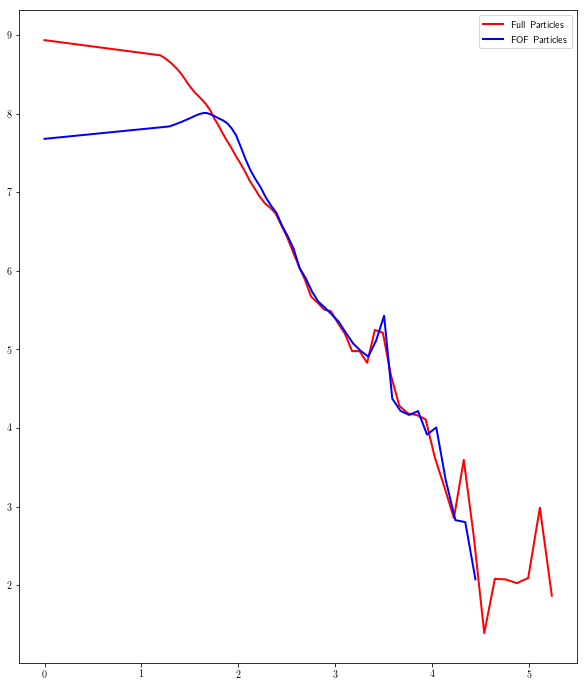

Galaxy 2
(19, u'subbox_019_ptlstr_Coordinates', u'subbox_019_ptlstr_Masses')
Pixel Scales: 14.1701145834, 5.3333 kpc/pixel


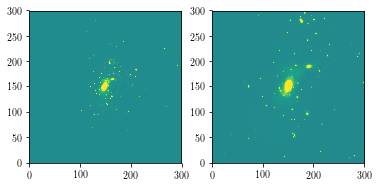

Measuring FULL PARTICLE profile
(33505096., 1914, 1769, 127, 176, 120, 191, 150.30002798, 149.52898343, 46.6222899, 113.61925998, -18.56598981, 0., 0., 0., 10.88210392, 6.46694422, -1.31775236, 0.02294183, 0.0094139, 0.00749763, 3.00424443e+12, 3.00587339e+12, 1.47725353e+11, 4.05283897e+11, 148, 150, 148, 150, 0)


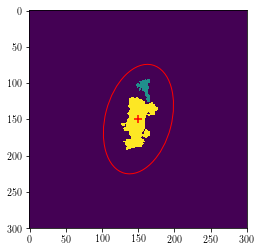

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.30002798167476 149.52898343477403
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_2_xy_full_particles.fits
###      Input Image   : temp_N08J3.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

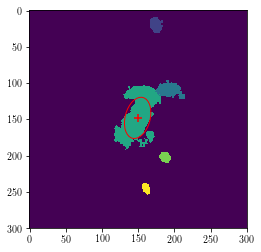

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.21088779887117 147.8569290134976
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_2_xy_full_particles.fits
###      Input Image   : temp_8DNSD.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

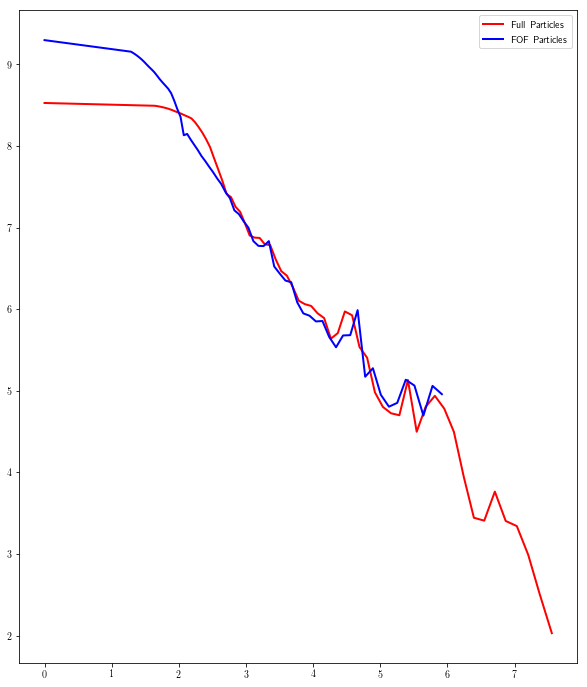

Galaxy 37
(20, u'subbox_020_ptlstr_Coordinates', u'subbox_020_ptlstr_Masses')
Pixel Scales: 8.76193422577, 5.3333 kpc/pixel


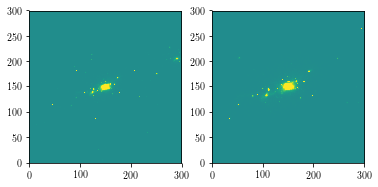

Measuring FULL PARTICLE profile
(23703832., 1075, 997, 106, 178, 129, 172, 149.38635806, 150.32851821, 60.46556632, 19.37876492, -24.82089003, 0., 0., 0., 8.49363613, 2.77533484, -0.43970609, 0.0348745, 0.10881533, 0.08933657, 1.1793831e+12, 1.1798859e+12, 7.82809498e+10, 1.7610462e+11, 149, 151, 149, 151, 1)


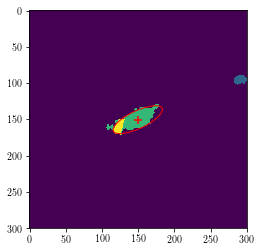

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.38635806092682 150.32851820588868
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_37_xy_full_particles.fits
###      Input Image   : temp_05Y2R.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

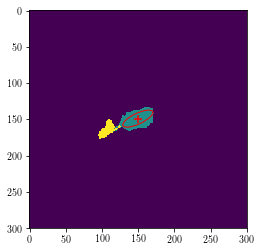

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.53374157657743 148.8526848443837
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_37_xy_full_particles.fits
###      Input Image   : temp_CAPNC.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

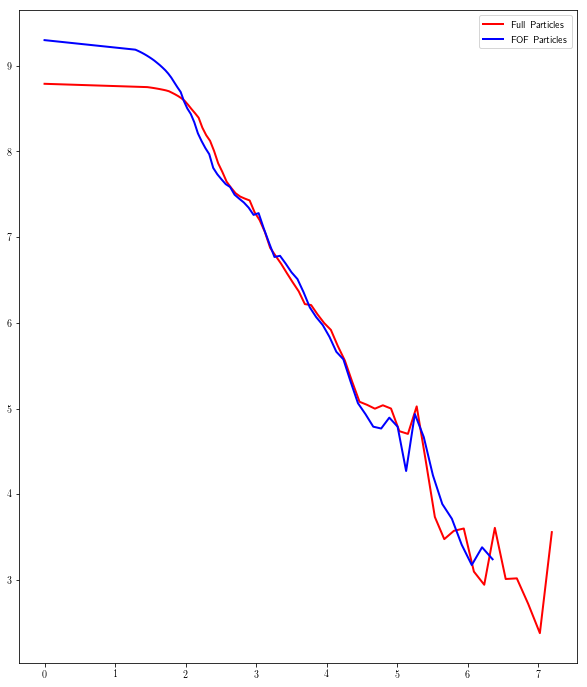

Galaxy 74
(21, u'subbox_021_ptlstr_Coordinates', u'subbox_021_ptlstr_Masses')
Pixel Scales: 6.92185503078, 5.3333 kpc/pixel


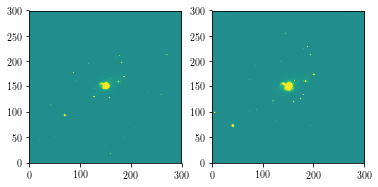

Measuring FULL PARTICLE profile
(25123532., 615, 580, 134, 166, 133, 159, 149.00374301, 147.2651707, 13.11124549, 7.42238913, 1.71399259, 0., 0., 0., 3.68615556, 2.63550615, 0.27115682, 0.0786445, 0.13892122, -0.03632148, 4.76041052e+11, 4.76371223e+11, 4.22768148e+10, 1.28655557e+11, 150, 148, 150, 148, 0)


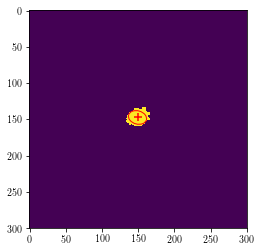

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.00374300740222 147.26517069653812
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_74_xy_full_particles.fits
###      Input Image   : temp_OSZ9N.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

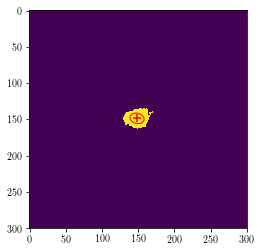

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.42131129036034 148.53201810796116
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_74_xy_full_particles.fits
###      Input Image   : temp_HG97C.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

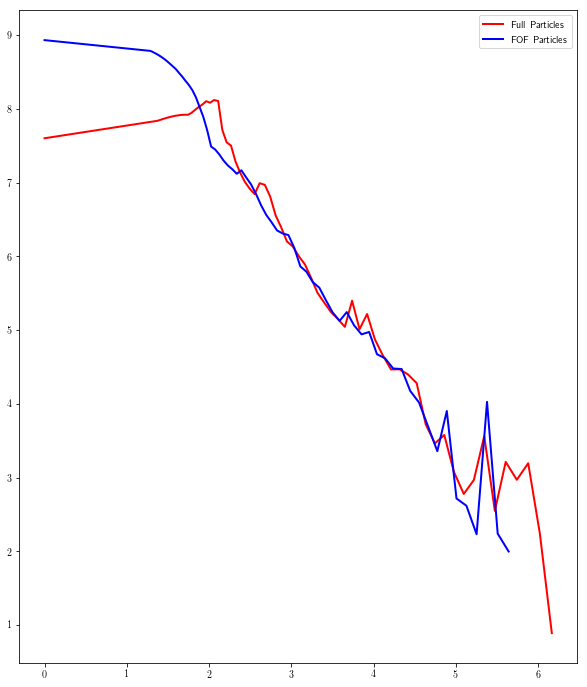

Galaxy 31
(22, u'subbox_022_ptlstr_Coordinates', u'subbox_022_ptlstr_Masses')
Pixel Scales: 8.98117372293, 5.3333 kpc/pixel


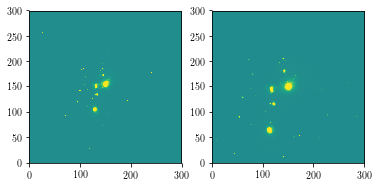

Measuring FULL PARTICLE profile
(29377556., 646, 612, 136, 163, 123, 156, 149.45999647, 144.73194122, 10.40346707, 40.01672425, 5.45725985, 0., 0., 0., 6.40237427, 3.07079697, 1.39423609, 0.10352786, 0.02691496, -0.02823711, 5.23544855e+11, 5.23821285e+11, 4.48679731e+10, 1.40266439e+11, 150, 145, 150, 145, 1)


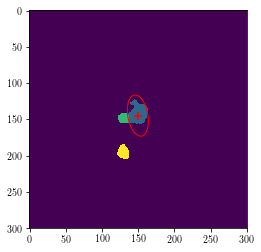

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.45999647035023 144.73194121604968
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_31_xy_full_particles.fits
###      Input Image   : temp_51G16.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

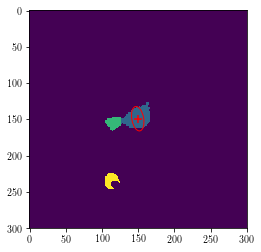

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.30095729712815 148.97054397255573
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_31_xy_full_particles.fits
###      Input Image   : temp_VZHHZ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

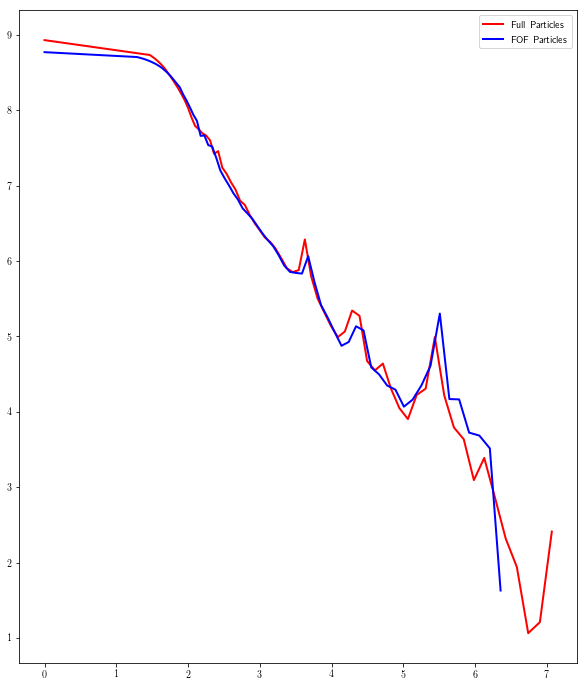

Galaxy 198
(23, u'subbox_023_ptlstr_Coordinates', u'subbox_023_ptlstr_Masses')
Pixel Scales: 5.30078995778, 5.3333 kpc/pixel


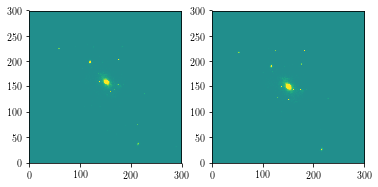

Measuring FULL PARTICLE profile
(15518738., 536, 506, 136, 164, 122, 154, 151.12150687, 140.64872458, 8.38611818, 8.66877011, 3.48357708, 0., 0., 0., 3.46610546, 2.24521756, 0.80567163, 0.14313872, 0.13847157, -0.11504164, 1.72430328e+11, 1.72680069e+11, 2.09346867e+10, 5.99223296e+10, 151, 141, 151, 141, 0)


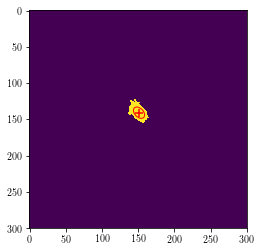

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.12150687099157 140.64872457671459
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_198_xy_full_particles.fits
###      Input Image   : temp_FYHVV.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

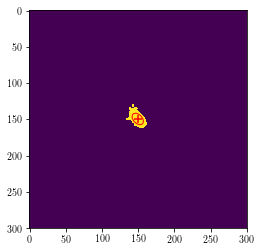

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.32638983164594 149.31401526326655
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_198_xy_full_particles.fits
###      Input Image   : temp_OIP36.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

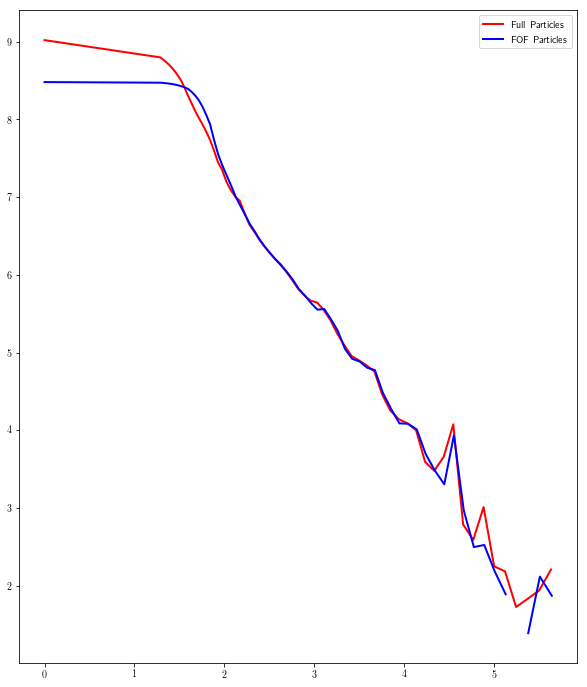

Galaxy 178
(24, u'subbox_024_ptlstr_Coordinates', u'subbox_024_ptlstr_Masses')
Pixel Scales: 5.3642850415, 5.3333 kpc/pixel


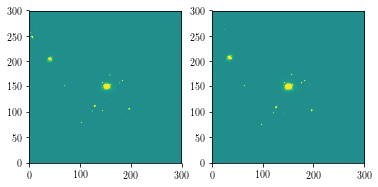

Measuring FULL PARTICLE profile
(11416879., 572, 537, 138, 170, 138, 160, 152.08184858, 149.21253492, 8.44739201, 5.12019779, 0.1666548, 0., 0., 0., 2.90787196, 2.26094484, 0.04992213, 0.1184558, 0.19543044, -0.00771112, 2.14250242e+11, 2.14391783e+11, 2.44163338e+10, 7.16581192e+10, 152, 149, 152, 149, 0)


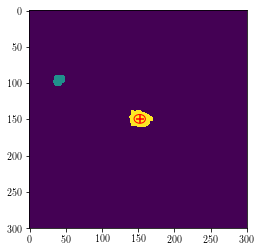

----------------------------------------------------------------------------------------------------
###      galX, galY :  152.08184858324722 149.21253492009964
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_178_xy_full_particles.fits
###      Input Image   : temp_6Q9Z6.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

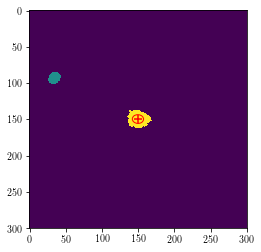

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.61321396989112 149.4678219247581
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_178_xy_full_particles.fits
###      Input Image   : temp_IVEQ6.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

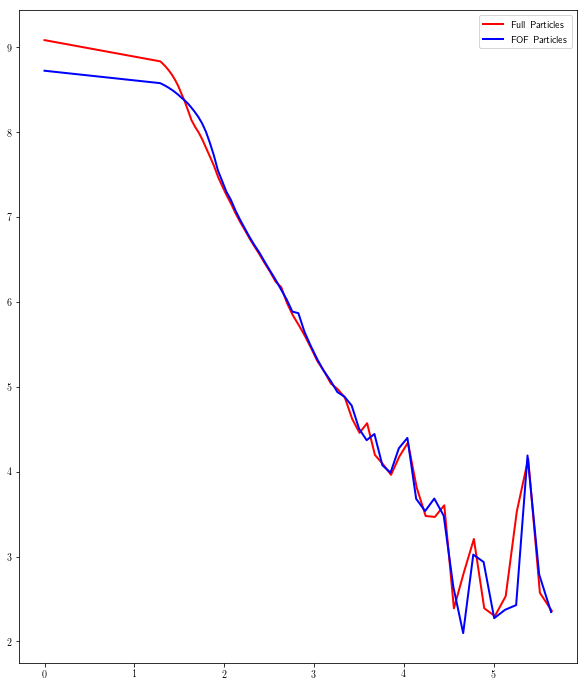

Galaxy 17
(25, u'subbox_025_ptlstr_Coordinates', u'subbox_025_ptlstr_Masses')
Pixel Scales: 8.25952875245, 5.3333 kpc/pixel


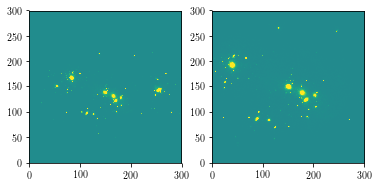

Measuring FULL PARTICLE profile
(27353752., 306, 282, 139, 163, 152, 170, 149.19050807, 160.20829754, 5.09962921, 5.94852054, -0.7901532, 0., 0., 0., 2.53397155, 2.15107822, -1.0318675, 0.20021336, 0.17164165, 0.05318944, 1.86440745e+11, 1.866588e+11, 2.33365565e+10, 7.79643044e+10, 149, 160, 149, 160, 1)


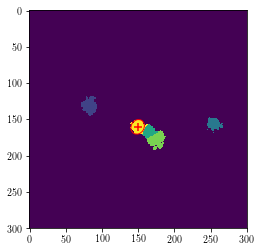

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.19050806681037 160.20829754160823
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_17_xy_full_particles.fits
###      Input Image   : temp_YFIQ4.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

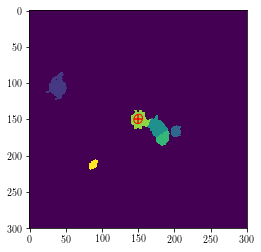

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.960640134305 149.26203647346844
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_17_xy_full_particles.fits
###      Input Image   : temp_G3GT1.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

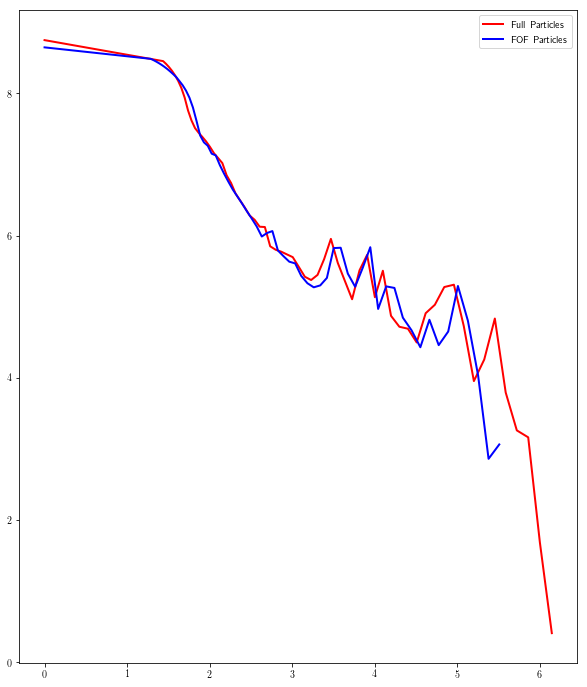

Galaxy 77
(26, u'subbox_026_ptlstr_Coordinates', u'subbox_026_ptlstr_Masses')
Pixel Scales: 6.1874456374, 5.3333 kpc/pixel


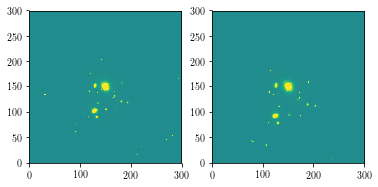

Measuring FULL PARTICLE profile
(33896924., 465, 442, 138, 160, 137, 162, 149.45916653, 149.49123357, 7.22041882, 8.83023602, 0.94101875, 0., 0., 0., 3.0436213, 2.60519195, 1.13919663, 0.14044675, 0.11484227, -0.0299342, 2.85236888e+11, 2.85517283e+11, 2.08499589e+10, 4.29214597e+10, 150, 150, 150, 150, 0)


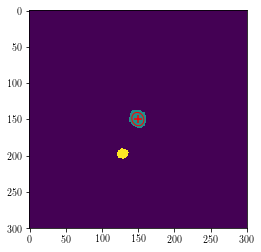

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.4591665283128 149.4912335690329
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_77_xy_full_particles.fits
###      Input Image   : temp_2NYUM.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

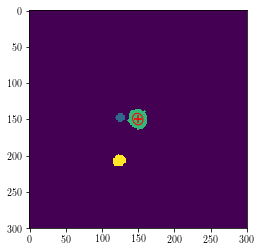

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.38537532951275 149.50396790257074
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_77_xy_full_particles.fits
###      Input Image   : temp_LC92Y.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

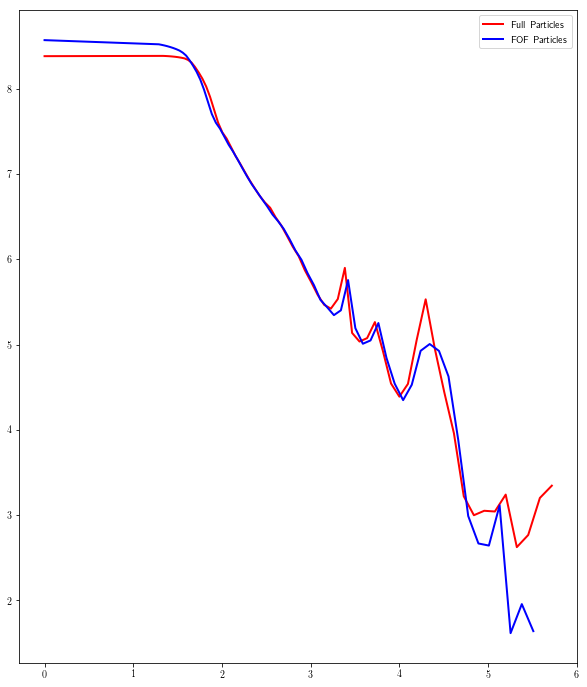

Galaxy 222
(27, u'subbox_027_ptlstr_Coordinates', u'subbox_027_ptlstr_Masses')
Pixel Scales: 4.72694710641, 5.3333 kpc/pixel


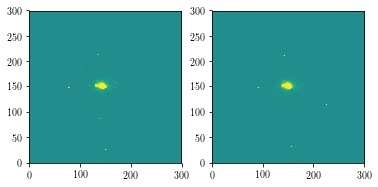

Measuring FULL PARTICLE profile
(17791362., 581, 548, 126, 163, 136, 160, 142.16422668, 148.60144488, 20.71303302, 5.86541722, 3.02797129, 0., 0., 0., 4.61592913, 2.29600716, 0.19363751, 0.05221968, 0.18440767, -0.05391592, 2.08528359e+11, 2.08710304e+11, 1.47477688e+10, 3.29317704e+10, 144, 149, 144, 149, 0)


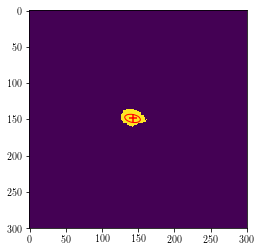

----------------------------------------------------------------------------------------------------
###      galX, galY :  142.16422667951062 148.6014448830194
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_222_xy_full_particles.fits
###      Input Image   : temp_PINA6.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

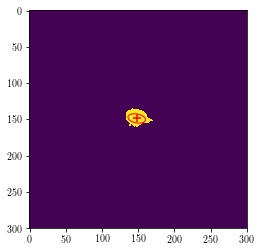

----------------------------------------------------------------------------------------------------
###      galX, galY :  147.95022654148735 148.6324055853179
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_222_xy_full_particles.fits
###      Input Image   : temp_L0JEK.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

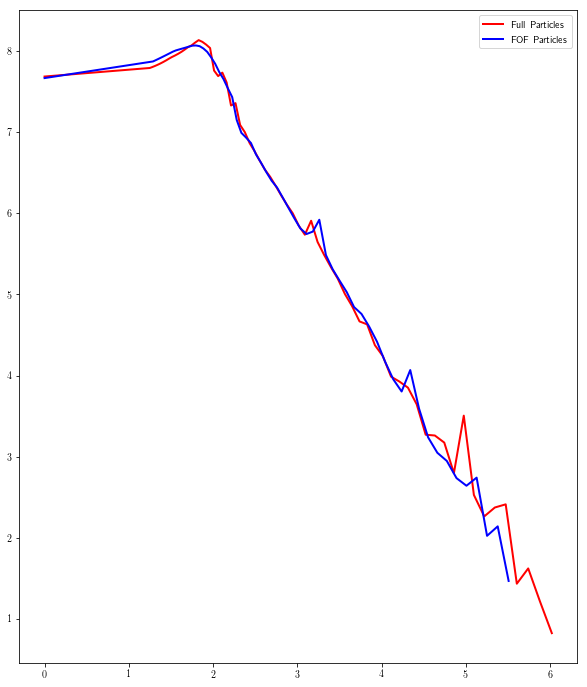

Galaxy 164
(28, u'subbox_028_ptlstr_Coordinates', u'subbox_028_ptlstr_Masses')
Pixel Scales: 5.70654330761, 5.3333 kpc/pixel


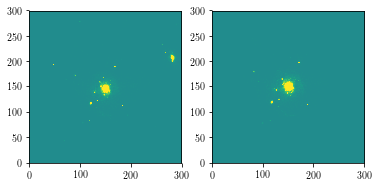

Measuring FULL PARTICLE profile
(21173082., 760, 702, 125, 163, 138, 172, 147.87853296, 153.63661694, 32.47512083, 25.97671736, 0.42576038, 0., 0., 0., 5.70113134, 5.09401035, 0.06514652, 0.03079942, 0.03850428, -0.00100961, 3.1483016e+11, 3.15156169e+11, 1.58079816e+10, 3.75552164e+10, 150, 154, 150, 154, 0)


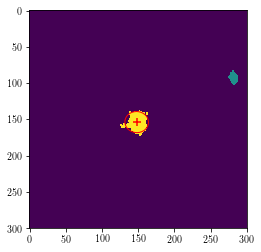

----------------------------------------------------------------------------------------------------
###      galX, galY :  147.87853296474026 153.63661694024324
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_164_xy_full_particles.fits
###      Input Image   : temp_EVRD0.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

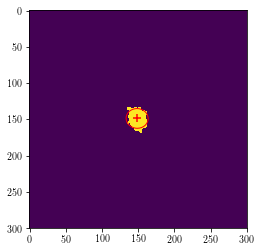

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.49832677694528 148.6001319834465
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_164_xy_full_particles.fits
###      Input Image   : temp_B97PZ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

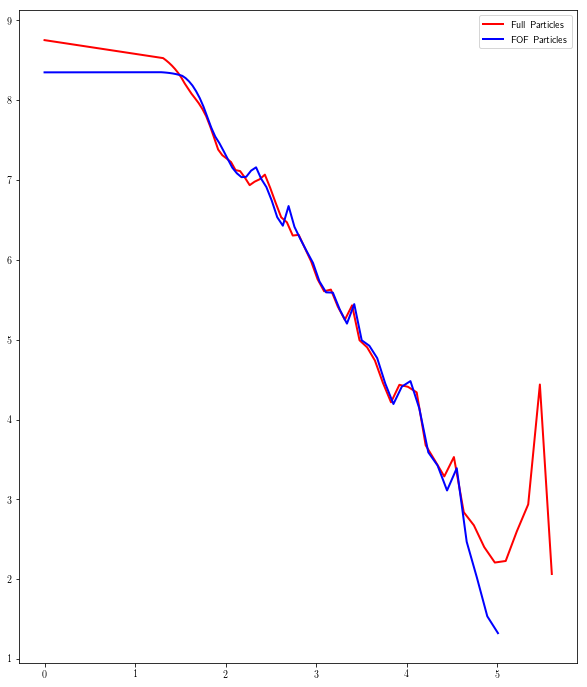

Galaxy 80
(29, u'subbox_029_ptlstr_Coordinates', u'subbox_029_ptlstr_Masses')
Pixel Scales: 6.80173071975, 5.3333 kpc/pixel


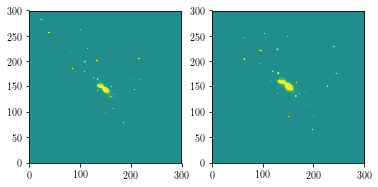

Measuring FULL PARTICLE profile
(20481398., 725, 676, 131, 172, 132, 175, 147.1267451, 153.26061886, 34.78077752, 41.38735478, 32.81677762, 0., 0., 0., 8.43010521, 2.25864029, 0.83555847, 0.11415832, 0.09593546, -0.18103637, 4.14629233e+11, 4.15043617e+11, 3.34263153e+10, 1.05381282e+11, 149, 155, 149, 155, 0)


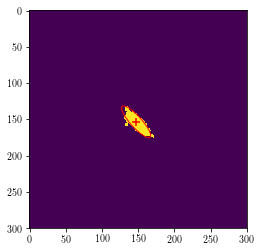

----------------------------------------------------------------------------------------------------
###      galX, galY :  147.12674510310185 153.26061886423196
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_80_xy_full_particles.fits
###      Input Image   : temp_OKL8C.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

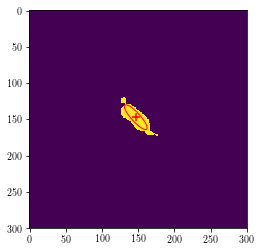

----------------------------------------------------------------------------------------------------
###      galX, galY :  146.63714456829535 146.92741240789263
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_80_xy_full_particles.fits
###      Input Image   : temp_L85A2.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

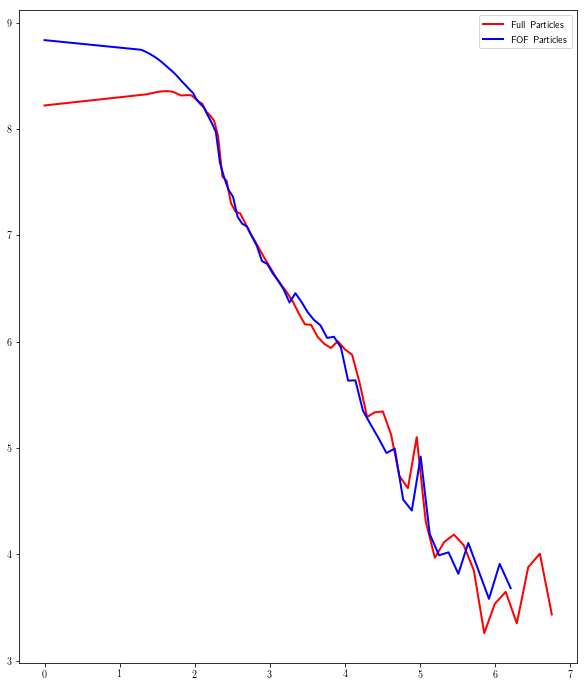

Galaxy 221
(30, u'subbox_030_ptlstr_Coordinates', u'subbox_030_ptlstr_Masses')
Pixel Scales: 4.87548777681, 5.3333 kpc/pixel


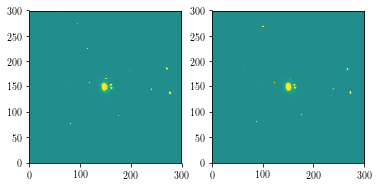

Measuring FULL PARTICLE profile
(11200054., 587, 555, 137, 165, 133, 165, 148.98264139, 149.90446367, 20.7170852, 8.30061033, 0.49192779, 0., 0., 0., 4.55373955, 2.8776989, 0.03953635, 0.04833736, 0.12064284, -0.00572934, 1.98038831e+11, 1.9819425e+11, 1.52504535e+10, 3.35229276e+10, 147, 150, 147, 150, 0)


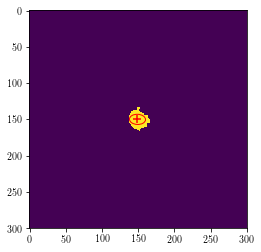

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.98264139059074 149.9044636735355
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_221_xy_full_particles.fits
###      Input Image   : temp_LFD5Y.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

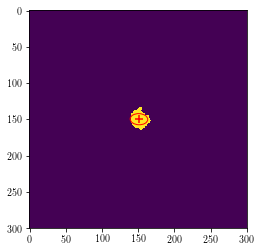

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.99137992640692 149.65555230243362
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_221_xy_full_particles.fits
###      Input Image   : temp_4MCQ2.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

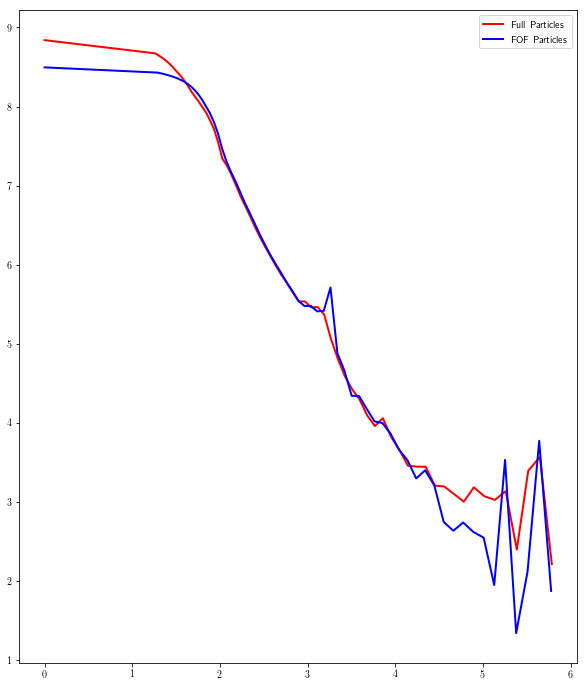

Galaxy 57
(31, u'subbox_031_ptlstr_Coordinates', u'subbox_031_ptlstr_Masses')
Pixel Scales: 6.797229416, 5.3333 kpc/pixel


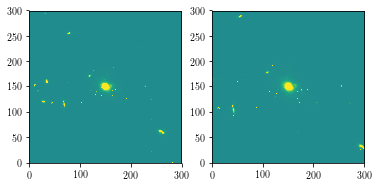

Measuring FULL PARTICLE profile
(21584750., 873, 811, 132, 171, 133, 170, 150.31927128, 149.86920214, 17.59196669, 10.44382824, 3.88579581, 0., 0., 0., 4.3928833, 2.956074, 0.41358051, 0.0619341, 0.10432407, -0.04608718, 5.07557544e+11, 5.07862024e+11, 2.8894935e+10, 5.35025705e+10, 149, 149, 149, 149, 0)


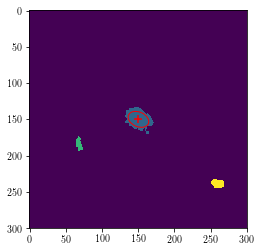

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.31927128414515 149.86920213687856
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_57_xy_full_particles.fits
###      Input Image   : temp_ISFPU.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

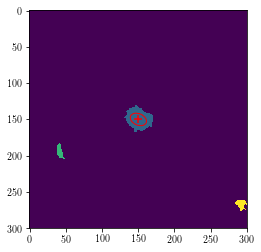

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.2006539028561 149.9700914923761
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_57_xy_full_particles.fits
###      Input Image   : temp_PBE83.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

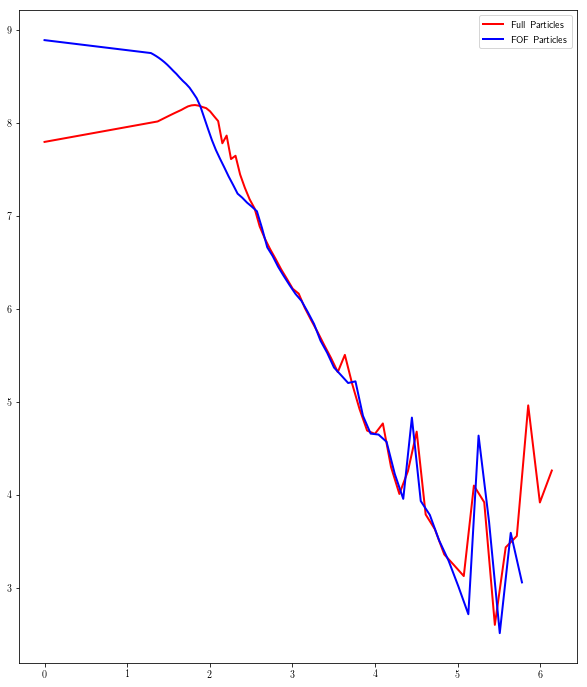

Galaxy 189
(32, u'subbox_032_ptlstr_Coordinates', u'subbox_032_ptlstr_Masses')
Pixel Scales: 5.34451850889, 5.3333 kpc/pixel


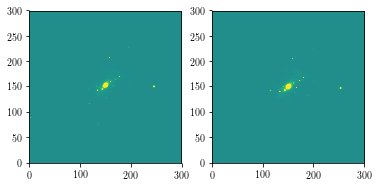

Measuring FULL PARTICLE profile
(21643148., 427, 395, 132, 162, 136, 163, 148.8116441, 147.77808824, 12.82007337, 10.53123739, -8.84360729, 0., 0., 0., 4.53795147, 1.66081548, -0.72105265, 0.18540308, 0.22569819, 0.3113845, 1.78191876e+11, 1.78380358e+11, 2.15174636e+10, 6.56064963e+10, 150, 147, 150, 147, 0)


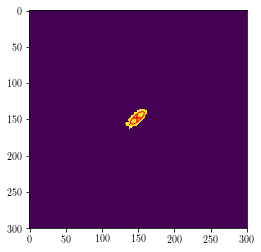

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.81164410156433 147.77808823694804
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_189_xy_full_particles.fits
###      Input Image   : temp_WMHGM.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

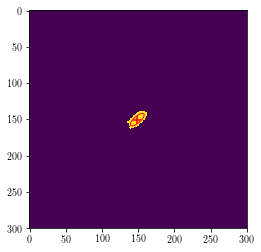

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.75264328922046 150.21943558494473
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_189_xy_full_particles.fits
###      Input Image   : temp_LAOL4.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

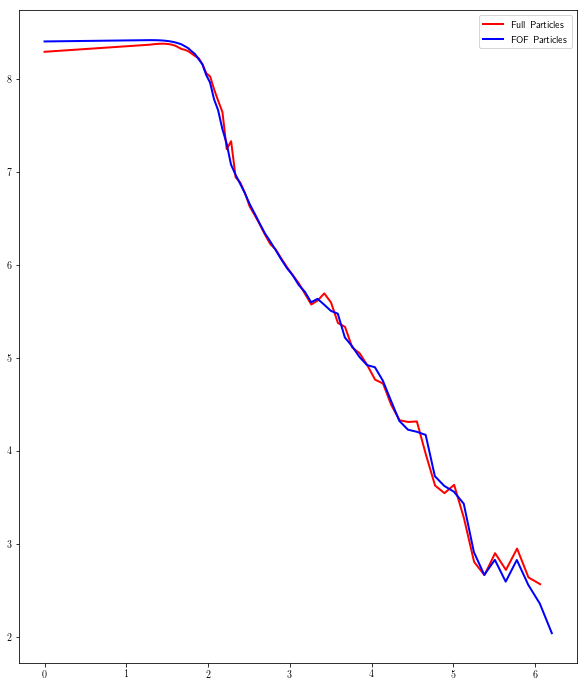

Galaxy 96
(33, u'subbox_033_ptlstr_Coordinates', u'subbox_033_ptlstr_Masses')
Pixel Scales: 6.29191722801, 5.3333 kpc/pixel


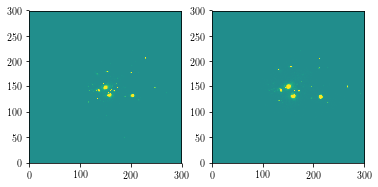

Measuring FULL PARTICLE profile
(27143748., 337, 310, 130, 162, 143, 160, 149.21384233, 151.14511768, 32.77262127, 7.46383325, -12.1195281, 0., 0., 0., 6.13515425, 1.61131525, -0.38190582, 0.07637478, 0.33535069, 0.24802972, 1.86713686e+11, 1.87423474e+11, 2.37345915e+10, 7.66180966e+10, 149, 151, 149, 151, 1)


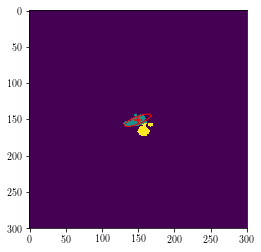

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.21384232698284 151.14511767758887
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_96_xy_full_particles.fits
###      Input Image   : temp_A6BHX.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

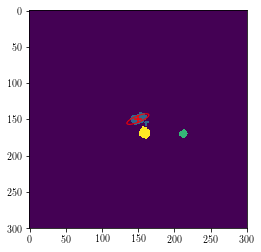

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.52286490127494 149.47895167637205
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_96_xy_full_particles.fits
###      Input Image   : temp_M0A9C.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

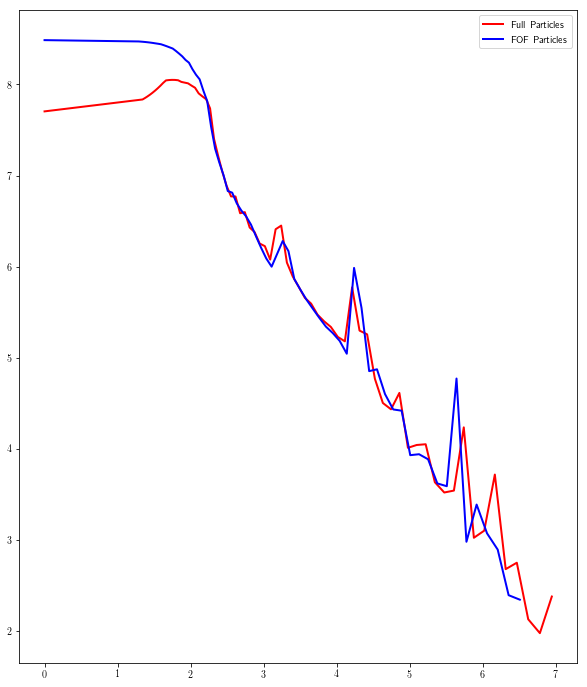

Galaxy 327
(34, u'subbox_034_ptlstr_Coordinates', u'subbox_034_ptlstr_Masses')
Pixel Scales: 3.6377186228, 5.3333 kpc/pixel


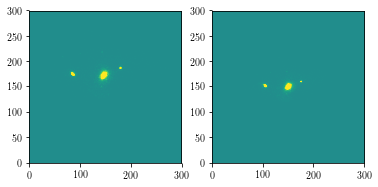

Measuring FULL PARTICLE profile
(16329412., 490, 465, 135, 158, 114, 141, 146.39982325, 127.46180657, 6.49397216, 9.90535386, -2.38022285, 0., 0., 0., 3.33585763, 2.29594851, -1.09629154, 0.16886151, 0.11070599, 0.08115369, 1.66275367e+11, 1.66392365e+11, 1.02634701e+10, 1.94705838e+10, 147, 127, 147, 127, 0)


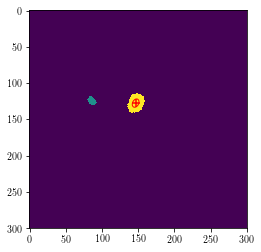

----------------------------------------------------------------------------------------------------
###      galX, galY :  146.39982325478906 127.46180656715458
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_327_xy_full_particles.fits
###      Input Image   : temp_DKPCH.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

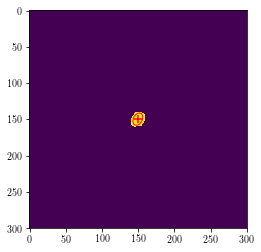

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.44743315295335 149.53825329038435
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_327_xy_full_particles.fits
###      Input Image   : temp_N7XDF.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

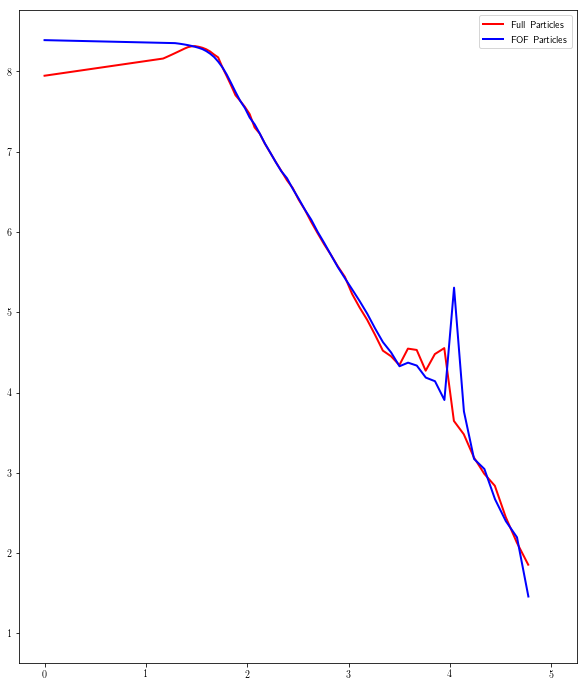

Galaxy 100
(35, u'subbox_035_ptlstr_Coordinates', u'subbox_035_ptlstr_Masses')
Pixel Scales: 6.53938711433, 5.3333 kpc/pixel


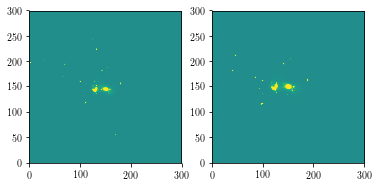

Measuring FULL PARTICLE profile
(22648658., 375, 355, 137, 165, 147, 165, 150.83020737, 154.13486464, 12.65907287, 3.04606224, 1.18393074, 0., 0., 0., 3.57809138, 1.70364237, 0.12075532, 0.08197455, 0.34067652, -0.06372305, 2.02237755e+11, 2.02429858e+11, 2.49853379e+10, 7.93163612e+10, 150, 154, 150, 154, 1)


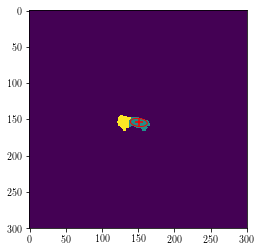

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.83020737205084 154.1348646403044
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_100_xy_full_particles.fits
###      Input Image   : temp_TTTZE.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

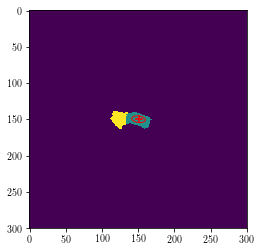

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.46444550631784 149.64626256896008
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_100_xy_full_particles.fits
###      Input Image   : temp_YUFSR.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

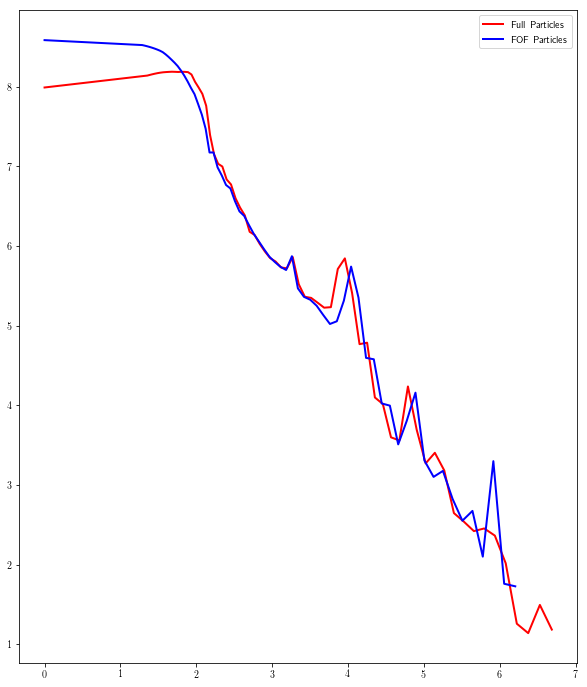

Galaxy 220
(36, u'subbox_036_ptlstr_Coordinates', u'subbox_036_ptlstr_Masses')
Pixel Scales: 5.36091522594, 5.3333 kpc/pixel


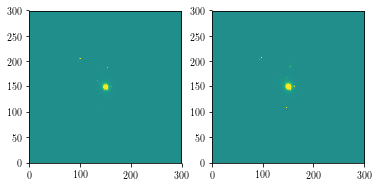

Measuring FULL PARTICLE profile
(20199148., 406, 384, 139, 162, 138, 162, 149.96857711, 150.20227392, 4.23690913, 4.65980708, 0.52222014, 0., 0., 0., 2.23869658, 1.97102857, 0.97776151, 0.23932695, 0.21760698, -0.05364229, 2.17363038e+11, 2.17511231e+11, 3.03930286e+10, 9.70384589e+10, 150, 150, 150, 150, 0)


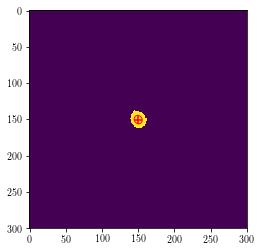

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.96857711424025 150.2022739196069
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_220_xy_full_particles.fits
###      Input Image   : temp_HJT5Q.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

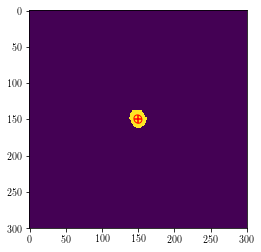

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.5595255118024 149.4937921659636
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_220_xy_full_particles.fits
###      Input Image   : temp_ZSSG0.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

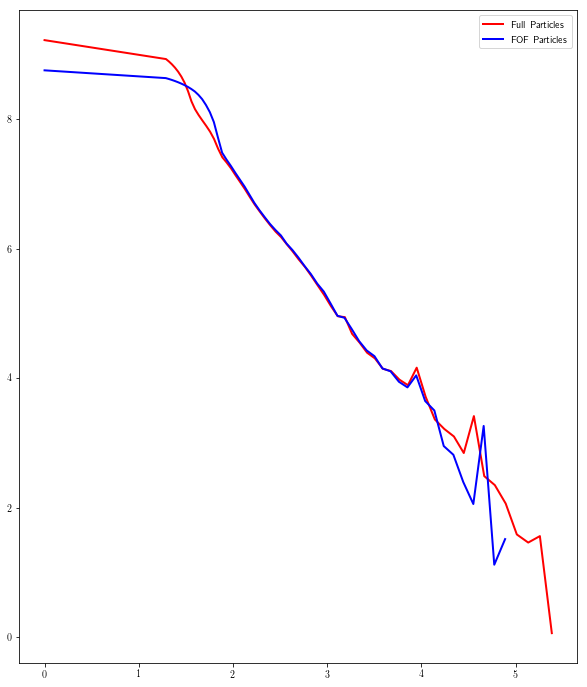

Galaxy 11
(37, u'subbox_037_ptlstr_Coordinates', u'subbox_037_ptlstr_Masses')
Pixel Scales: 11.665748964, 5.3333 kpc/pixel


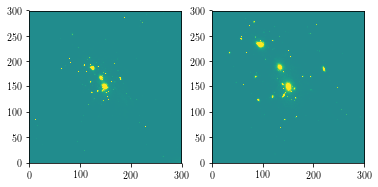

Measuring FULL PARTICLE profile
(36734692., 656, 616, 130, 160, 123, 170, 147.7630408, 150.51148019, 20.35677675, 20.82002728, -5.14314652, 0., 0., 0., 5.0731411, 3.92938185, -0.80790079, 0.05239368, 0.05122791, 0.0258855, 8.07374356e+11, 8.0762726e+11, 5.42725857e+10, 1.43542911e+11, 148, 149, 148, 149, 1)


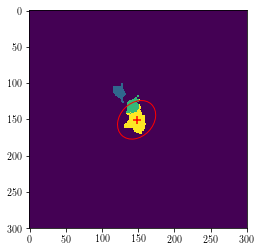

----------------------------------------------------------------------------------------------------
###      galX, galY :  147.76304079974966 150.51148019489193
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_11_xy_full_particles.fits
###      Input Image   : temp_5H786.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

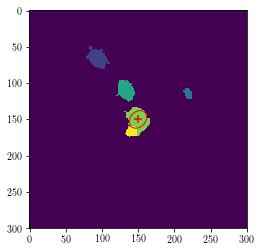

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.62969696094527 149.89302493881502
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_11_xy_full_particles.fits
###      Input Image   : temp_W4V40.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

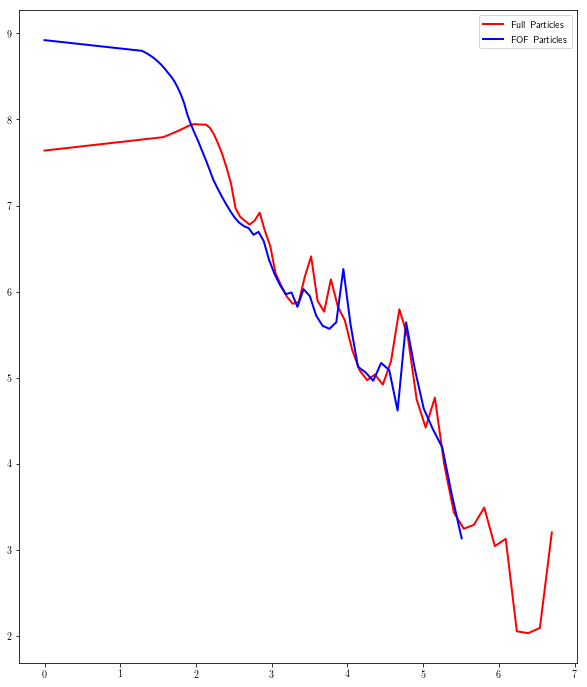

Galaxy 128
(38, u'subbox_038_ptlstr_Coordinates', u'subbox_038_ptlstr_Masses')
Pixel Scales: 6.11910802545, 5.3333 kpc/pixel


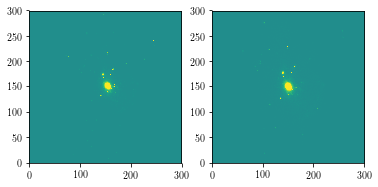

Measuring FULL PARTICLE profile
(21584242., 657, 602, 143, 173, 129, 166, 154.35220988, 148.41328619, 9.99359882, 11.37079201, 1.71864556, 0., 0., 0., 3.54029036, 2.97165513, 0.97593677, 0.10273445, 0.09029159, -0.03105573, 2.98573627e+11, 2.98807001e+11, 2.80218173e+10, 7.74741361e+10, 154, 148, 154, 148, 1)


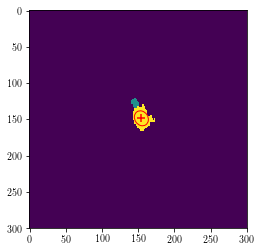

----------------------------------------------------------------------------------------------------
###      galX, galY :  154.35220987616225 148.4132861921781
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_128_xy_full_particles.fits
###      Input Image   : temp_DFH17.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

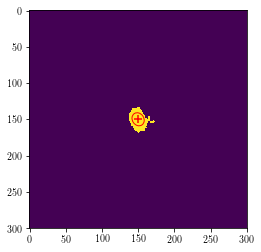

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.82964691913256 149.76483389318292
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_128_xy_full_particles.fits
###      Input Image   : temp_PD9PP.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

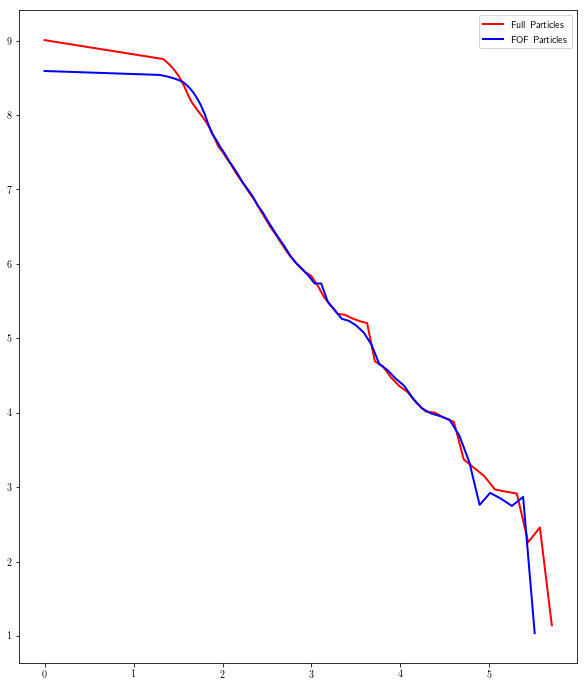

Galaxy 273
(39, u'subbox_039_ptlstr_Coordinates', u'subbox_039_ptlstr_Masses')
Pixel Scales: 4.74947177317, 5.3333 kpc/pixel


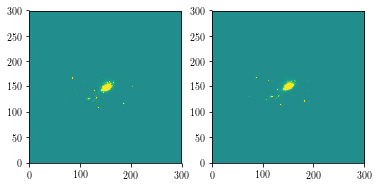

Measuring FULL PARTICLE profile
(12234295., 637, 605, 135, 168, 137, 164, 152.00551986, 151.23921417, 17.01995998, 11.09908442, -6.2068065, 0., 0., 0., 4.57560873, 2.68008375, -0.56287241, 0.07380617, 0.11317853, 0.08254746, 2.23301681e+11, 2.23478809e+11, 1.38736865e+10, 3.11319327e+10, 152, 152, 152, 152, 0)


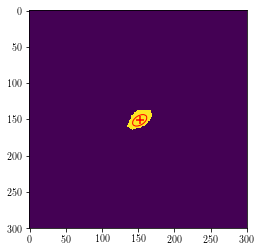

----------------------------------------------------------------------------------------------------
###      galX, galY :  152.00551985651717 151.239214167589
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_273_xy_full_particles.fits
###      Input Image   : temp_KQ8KL.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

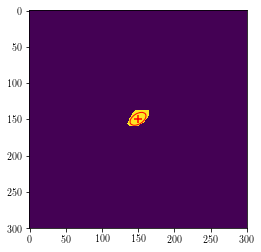

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.7265851742395 149.160718102854
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_273_xy_full_particles.fits
###      Input Image   : temp_KCQDG.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

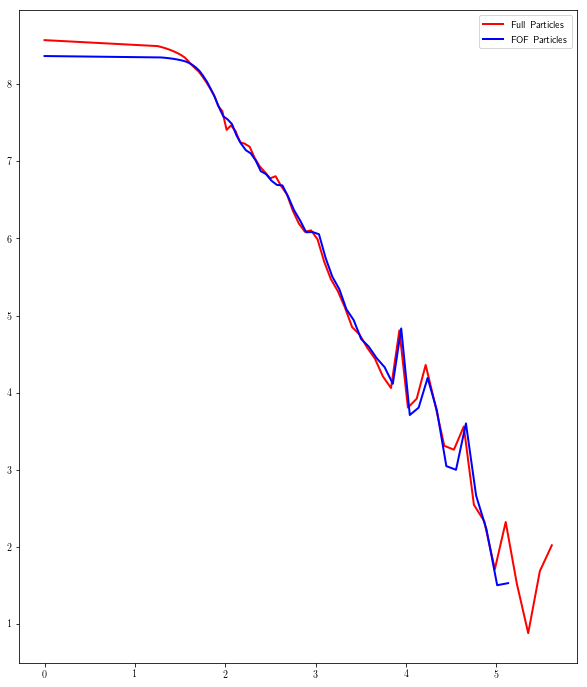

Galaxy 424
(40, u'subbox_040_ptlstr_Coordinates', u'subbox_040_ptlstr_Masses')
Pixel Scales: 4.11615520713, 5.3333 kpc/pixel


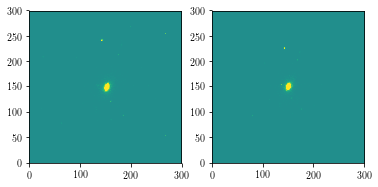

Measuring FULL PARTICLE profile
(19407012., 335, 317, 143, 162, 139, 162, 152.247298, 150.83313137, 3.50287331, 6.54779478, -1.30980086, 0., 0., 0., 2.65210915, 1.73694706, -1.21556938, 0.30855963, 0.16507012, 0.12344665, 1.63783672e+11, 1.63929571e+11, 1.58476472e+10, 4.30851932e+10, 152, 151, 152, 151, 0)


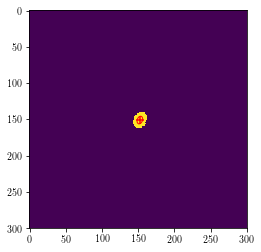

----------------------------------------------------------------------------------------------------
###      galX, galY :  152.2472979960144 150.8331313713003
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_424_xy_full_particles.fits
###      Input Image   : temp_1EIBQ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

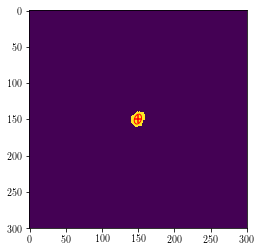

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.49270537740202 149.52869437605
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_424_xy_full_particles.fits
###      Input Image   : temp_2J3J8.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

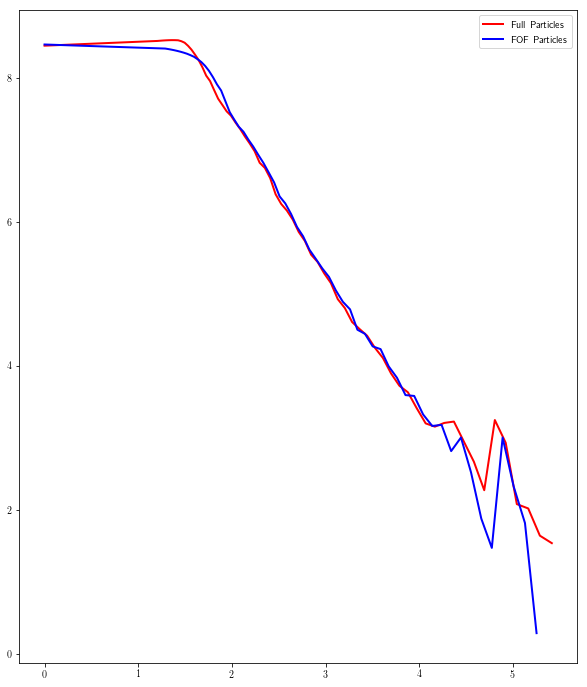

Galaxy 360
(41, u'subbox_041_ptlstr_Coordinates', u'subbox_041_ptlstr_Masses')
Pixel Scales: 4.05107547899, 5.3333 kpc/pixel


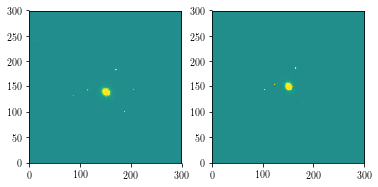

Measuring FULL PARTICLE profile
(13791894., 437, 419, 139, 162, 148, 172, 150.67586541, 160.12427925, 6.39217326, 6.82233971, 1.09720941, 0., 0., 0., 2.77945113, 2.3428967, 0.88218462, 0.16088258, 0.15073851, -0.05174819, 1.8567263e+11, 1.85823625e+11, 1.40048947e+10, 2.93541028e+10, 151, 160, 151, 160, 0)


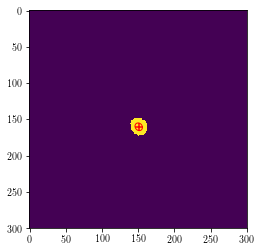

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.67586541364318 160.1242792486981
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_360_xy_full_particles.fits
###      Input Image   : temp_II2OE.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

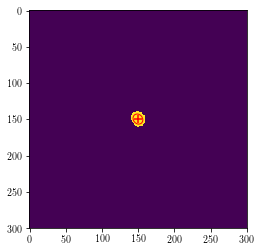

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.59717383697713 149.46893851310995
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_360_xy_full_particles.fits
###      Input Image   : temp_MVHIP.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

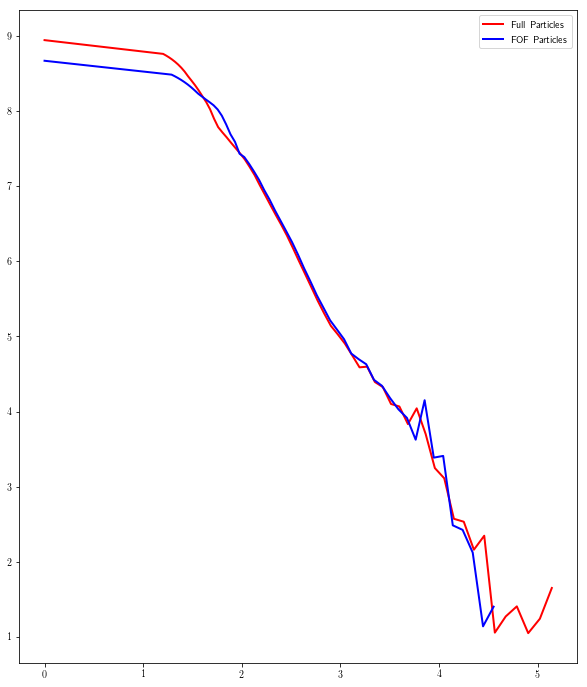

Galaxy 122
(42, u'subbox_042_ptlstr_Coordinates', u'subbox_042_ptlstr_Masses')
Pixel Scales: 5.7861746934, 5.3333 kpc/pixel


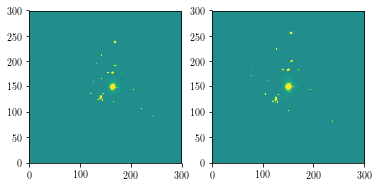

Measuring FULL PARTICLE profile
(23889876., 442, 412, 153, 180, 133, 164, 163.7391088, 150.08020713, 6.09910274, 7.35259507, -0.16191642, 0., 0., 0., 2.7153585, 2.4654665, -1.44438791, 0.16405445, 0.13608596, 0.00722551, 1.72182553e+11, 1.72426592e+11, 1.75958999e+10, 4.37062369e+10, 164, 150, 164, 150, 0)


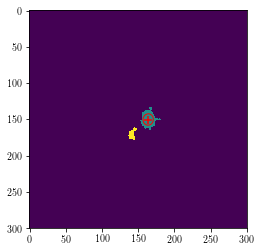

----------------------------------------------------------------------------------------------------
###      galX, galY :  163.7391087964376 150.08020712989432
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_122_xy_full_particles.fits
###      Input Image   : temp_13CO3.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

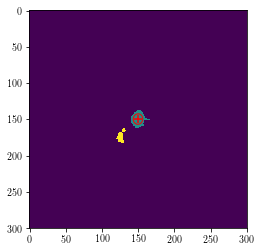

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.6671609757821 149.4890813976539
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_122_xy_full_particles.fits
###      Input Image   : temp_QLD7U.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

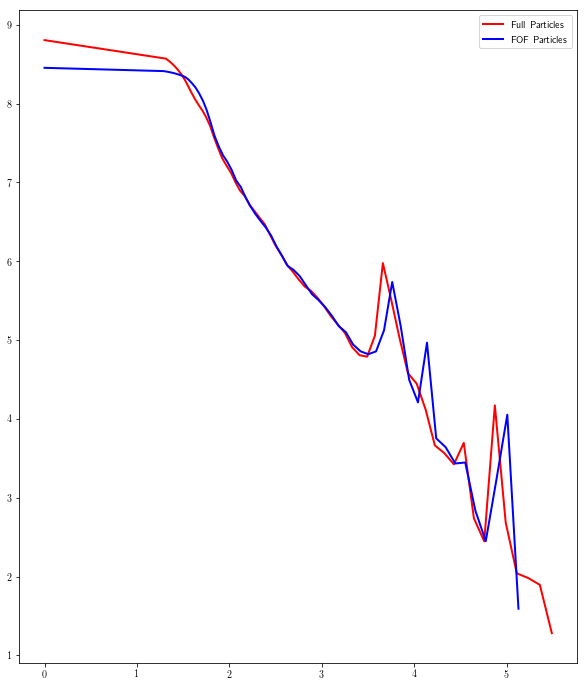

Galaxy 79
(43, u'subbox_043_ptlstr_Coordinates', u'subbox_043_ptlstr_Masses')
Pixel Scales: 6.63714808842, 5.3333 kpc/pixel


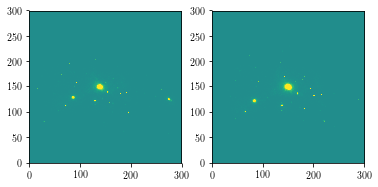

Measuring FULL PARTICLE profile
(21999992., 597, 565, 123, 156, 138, 162, 139.55492933, 150.54411804, 12.70732546, 7.38223349, 4.9113648, 0., 0., 0., 3.95366025, 2.11142826, 0.5370118, 0.10593425, 0.18234874, -0.14095511, 3.70365334e+11, 3.70630197e+11, 2.72890122e+10, 5.46580398e+10, 139, 150, 139, 150, 0)


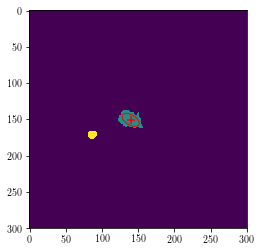

----------------------------------------------------------------------------------------------------
###      galX, galY :  139.55492933016038 150.54411803631677
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_79_xy_full_particles.fits
###      Input Image   : temp_9J168.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

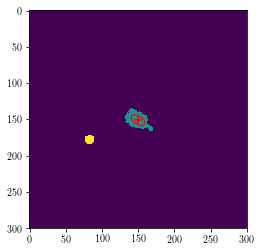

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.8343734215955 150.76698653587948
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_79_xy_full_particles.fits
###      Input Image   : temp_Q49UU.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

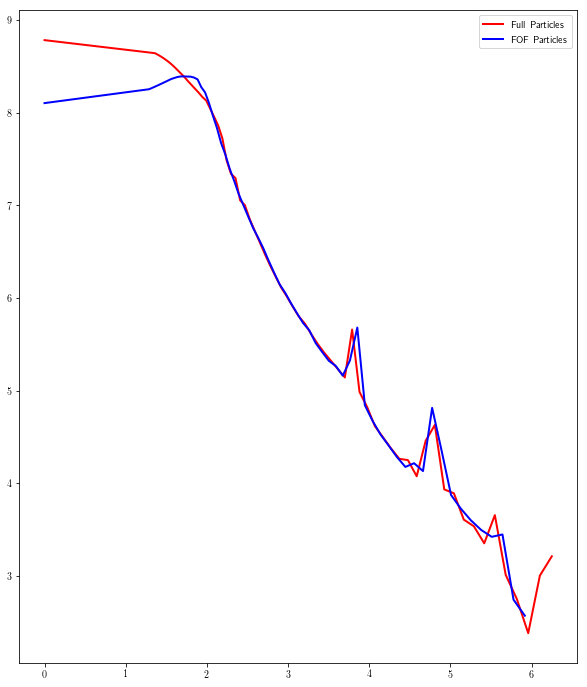

Galaxy 194
(44, u'subbox_044_ptlstr_Coordinates', u'subbox_044_ptlstr_Masses')
Pixel Scales: 4.8513712611, 5.3333 kpc/pixel


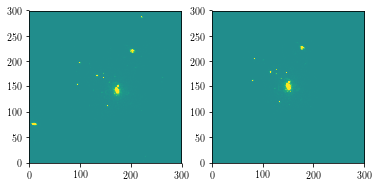

Measuring FULL PARTICLE profile
(16068172., 414, 389, 163, 182, 142, 169, 172.45726561, 156.22269755, 3.59574392, 12.87966222, -0.0489264, 0., 0., 0., 3.58886051, 1.8961767, -1.56552649, 0.27812093, 0.0776458, 0.00211301, 1.86685112e+11, 1.8684099e+11, 1.62347612e+10, 4.15236424e+10, 172, 157, 172, 157, 0)


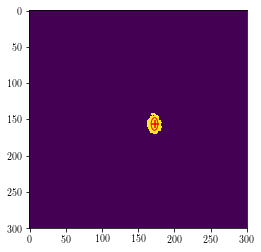

----------------------------------------------------------------------------------------------------
###      galX, galY :  172.4572656115913 156.22269755431668
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_194_xy_full_particles.fits
###      Input Image   : temp_JD92B.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

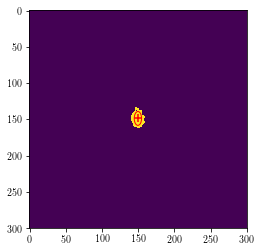

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.55613463911436 148.6007482060005
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_194_xy_full_particles.fits
###      Input Image   : temp_Q9XAU.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

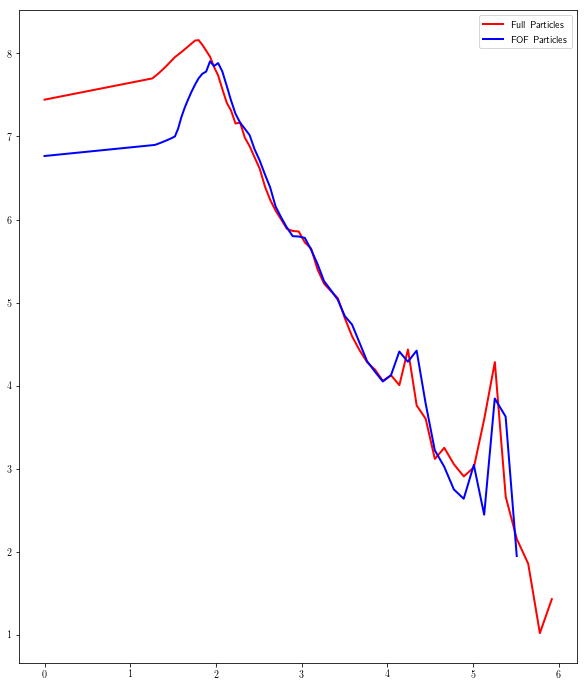

Galaxy 70
(45, u'subbox_045_ptlstr_Coordinates', u'subbox_045_ptlstr_Masses')
Pixel Scales: 7.04148673402, 5.3333 kpc/pixel


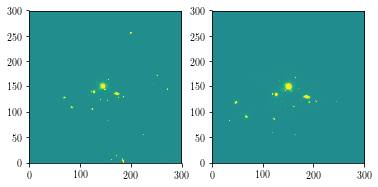

Measuring FULL PARTICLE profile
(22642078., 446, 431, 130, 157, 138, 158, 144.80138545, 148.90165898, 6.37405248, 5.03850718, -0.33588457, 0., 0., 0., 2.54042673, 2.22683454, -0.23301934, 0.15743913, 0.19917114, 0.02099089, 2.69920305e+11, 2.70137262e+11, 3.06621194e+10, 8.78335263e+10, 145, 149, 145, 149, 1)


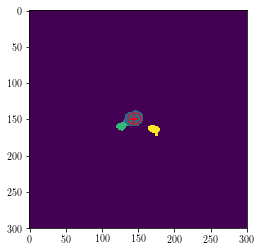

----------------------------------------------------------------------------------------------------
###      galX, galY :  144.80138544852358 148.9016589774949
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_70_xy_full_particles.fits
###      Input Image   : temp_3HK47.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

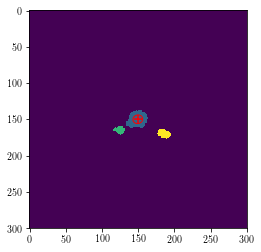

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.37916454483945 149.75877252689702
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_70_xy_full_particles.fits
###      Input Image   : temp_FD7Q0.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

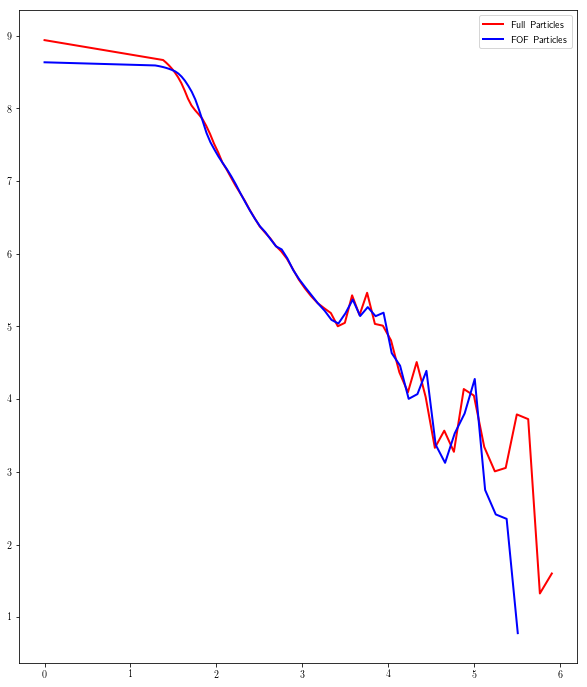

Galaxy 149
(46, u'subbox_046_ptlstr_Coordinates', u'subbox_046_ptlstr_Masses')
Pixel Scales: 6.0001033216, 5.3333 kpc/pixel


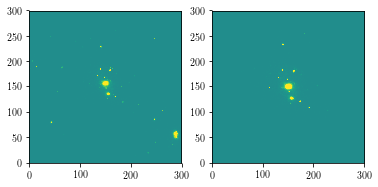

Measuring FULL PARTICLE profile
(21109456., 407, 385, 137, 161, 130, 155, 149.56999022, 143.66479262, 6.67709324, 6.38872832, 0.61396467, 0., 0., 0., 2.67648625, 2.42945337, 0.6700688, 0.15110099, 0.15792117, -0.02904198, 1.92215826e+11, 1.92531759e+11, 1.82908703e+10, 4.04700611e+10, 150, 144, 150, 144, 0)


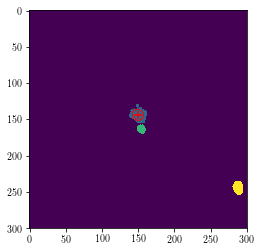

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.5699902233116 143.66479262218922
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_149_xy_full_particles.fits
###      Input Image   : temp_9DYC2.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

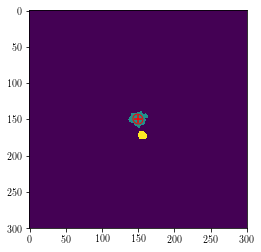

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.5596031171408 149.47662292241208
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_149_xy_full_particles.fits
###      Input Image   : temp_A1C9J.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

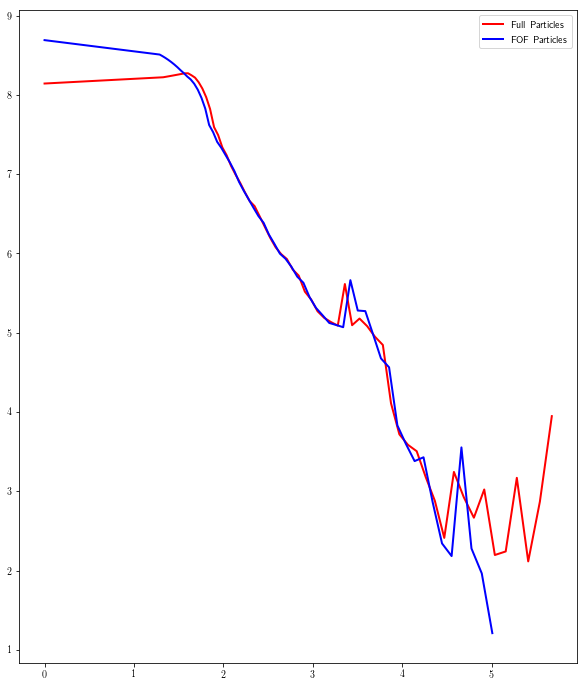

Galaxy 412
(47, u'subbox_047_ptlstr_Coordinates', u'subbox_047_ptlstr_Masses')
Pixel Scales: 4.30336907854, 5.3333 kpc/pixel


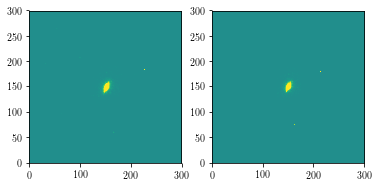

Measuring FULL PARTICLE profile
(19931898., 424, 402, 142, 162, 137, 165, 151.7010319, 150.56096323, 5.01348758, 12.17905075, -4.16766222, 0., 0., 0., 3.75396371, 1.76076543, -1.14043653, 0.2787599, 0.11475109, 0.19078286, 2.15243833e+11, 2.15437853e+11, 1.72531999e+10, 3.91932191e+10, 152, 151, 152, 151, 0)


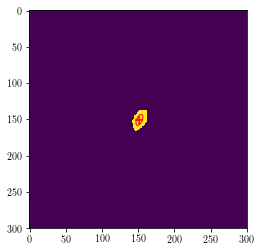

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.7010318989016 150.5609632286888
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_412_xy_full_particles.fits
###      Input Image   : temp_D9IWG.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

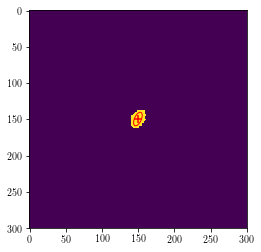

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.55752243322067 149.4344390004215
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_412_xy_full_particles.fits
###      Input Image   : temp_XDR2R.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

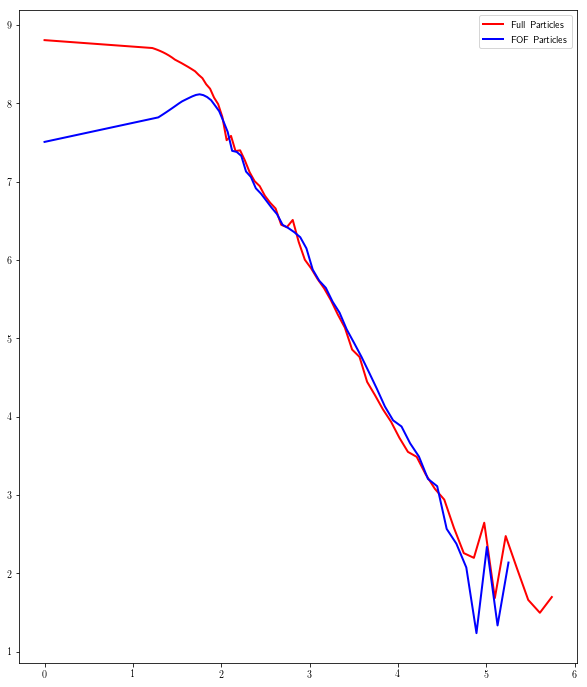

Galaxy 55
(48, u'subbox_048_ptlstr_Coordinates', u'subbox_048_ptlstr_Masses')
Pixel Scales: 7.15727784715, 5.3333 kpc/pixel


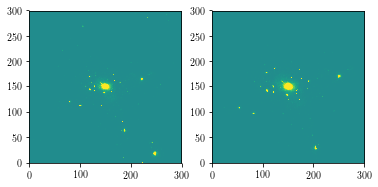

Measuring FULL PARTICLE profile
(20893120., 772, 718, 126, 168, 134, 164, 148.76980087, 149.9375202, 22.56119108, 18.76309819, 1.79524262, 0., 0., 0., 4.82446194, 4.24839449, 0.37865356, 0.04466395, 0.05370498, -0.00854684, 4.34124423e+11, 4.34520293e+11, 2.60457984e+10, 5.56970762e+10, 149, 149, 149, 149, 0)


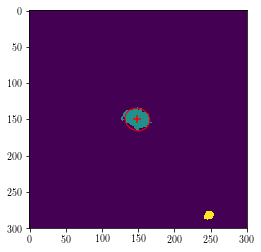

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.76980086873084 149.93752019936113
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_55_xy_full_particles.fits
###      Input Image   : temp_SVFD7.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

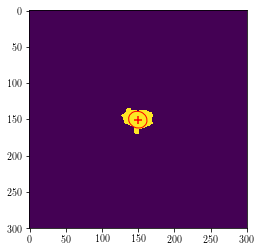

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.41993197606877 150.3091283994213
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_55_xy_full_particles.fits
###      Input Image   : temp_UVI8V.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

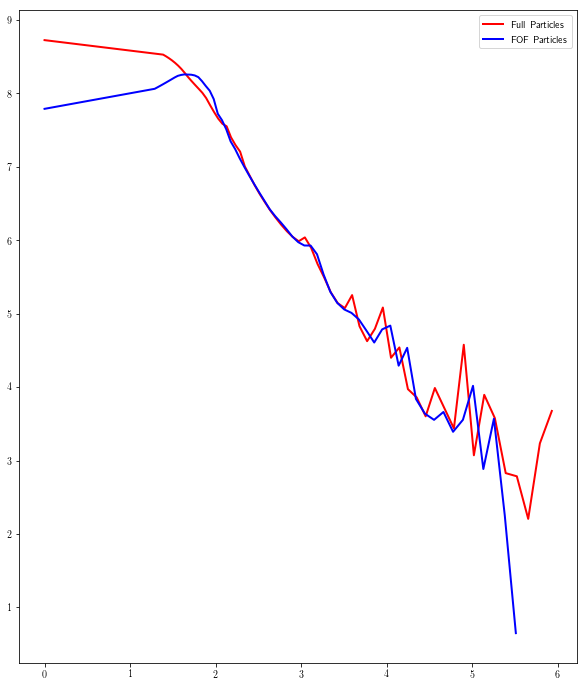

Galaxy 334
(49, u'subbox_049_ptlstr_Coordinates', u'subbox_049_ptlstr_Masses')
Pixel Scales: 4.46527255453, 5.3333 kpc/pixel


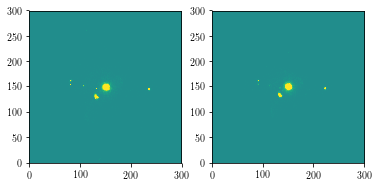

Measuring FULL PARTICLE profile
(18256968., 392, 371, 140, 162, 140, 163, 150.74239235, 150.80921715, 6.3435229, 6.04865738, 0.14057604, 0., 0., 0., 2.52978277, 2.44793367, 0.38079765, 0.15772234, 0.16541114, -0.00733121, 1.57228335e+11, 1.57392978e+11, 1.40219279e+10, 3.90745129e+10, 151, 151, 151, 151, 0)


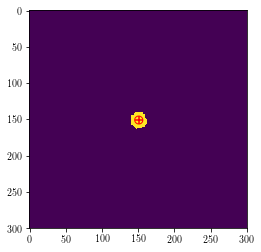

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.74239235340622 150.80921714533096
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_334_xy_full_particles.fits
###      Input Image   : temp_DCUGJ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

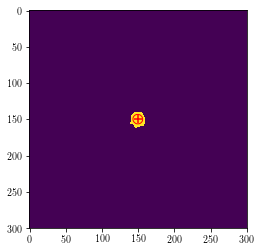

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.40431151125614 149.58039581731026
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_334_xy_full_particles.fits
###      Input Image   : temp_08OZX.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

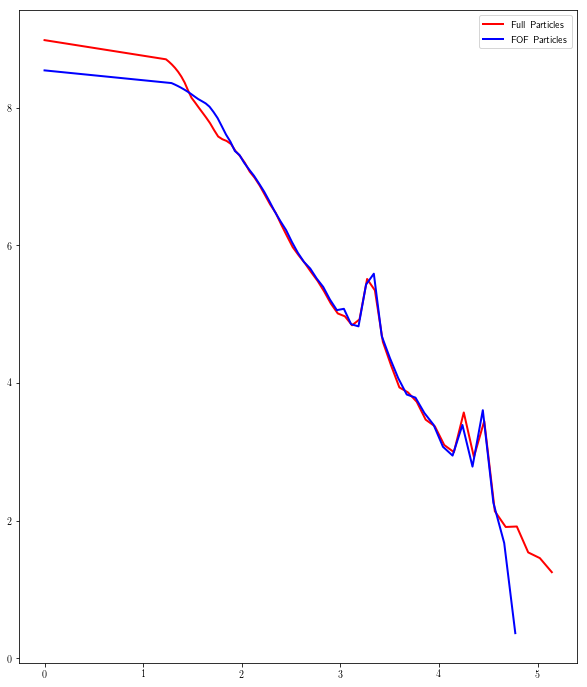

Galaxy 104
(50, u'subbox_050_ptlstr_Coordinates', u'subbox_050_ptlstr_Masses')
Pixel Scales: 6.24175587722, 5.3333 kpc/pixel


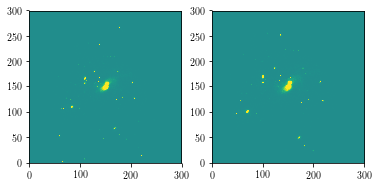

Measuring FULL PARTICLE profile
(18976542., 482, 451, 132, 169, 133, 161, 150.2383618, 149.52168741, 12.53029286, 9.46624872, -5.29328618, 0., 0., 0., 4.06310272, 2.34259224, -0.64453357, 0.1044886, 0.13830957, 0.11685476, 1.4281615e+11, 1.4283155e+11, 1.25411512e+10, 2.76277268e+10, 150, 149, 150, 149, 1)


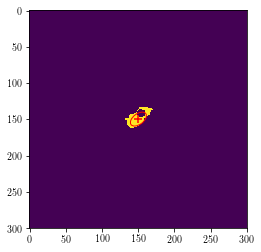

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.23836179732868 149.5216874132373
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_104_xy_full_particles.fits
###      Input Image   : temp_Q30JZ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

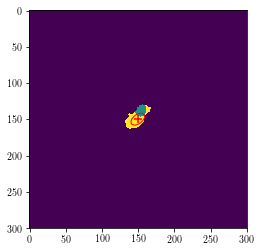

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.44337870081435 149.56330208988066
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_104_xy_full_particles.fits
###      Input Image   : temp_0Z2IM.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

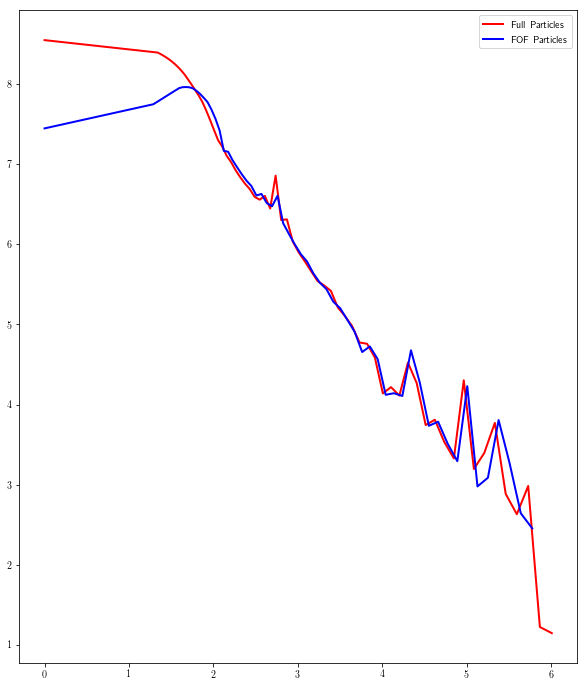

Galaxy 153
(51, u'subbox_051_ptlstr_Coordinates', u'subbox_051_ptlstr_Masses')
Pixel Scales: 5.46444774123, 5.3333 kpc/pixel


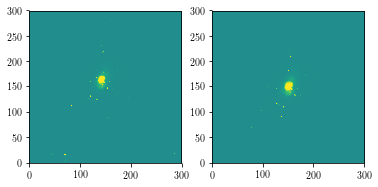

Measuring FULL PARTICLE profile
(22119800., 750, 706, 128, 155, 117, 155, 142.21476347, 137.44211836, 11.24888254, 21.11100094, 2.24767448, 0., 0., 0., 4.6474843, 3.28036189, 1.35695481, 0.09083004, 0.04839829, -0.01934123, 3.81281206e+11, 3.81568811e+11, 2.83311636e+10, 6.8769194e+10, 141, 137, 141, 137, 0)


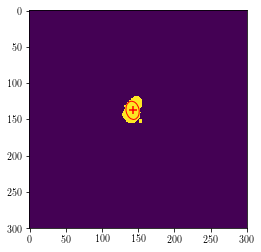

----------------------------------------------------------------------------------------------------
###      galX, galY :  142.21476347423635 137.44211835784463
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_153_xy_full_particles.fits
###      Input Image   : temp_DFHXN.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

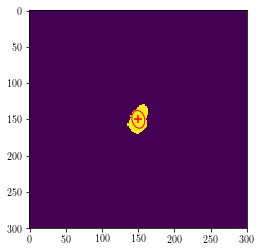

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.09128620688674 149.84521908149767
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_153_xy_full_particles.fits
###      Input Image   : temp_1FF2D.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

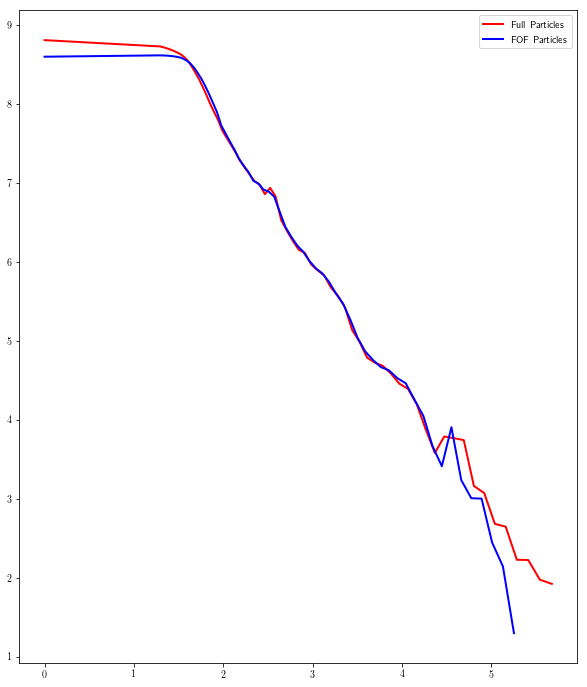

Galaxy 546
(52, u'subbox_052_ptlstr_Coordinates', u'subbox_052_ptlstr_Masses')
Pixel Scales: 3.43997055395, 5.3333 kpc/pixel


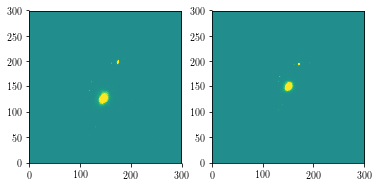

Measuring FULL PARTICLE profile
(19070140., 569, 551, 135, 158, 157, 187, 145.56308234, 172.68272194, 8.94414438, 16.11046968, -3.09365087, 0., 0., 0., 4.15465975, 2.79166889, -1.21468937, 0.11975935, 0.06648751, 0.04599414, 1.68704246e+11, 1.68871723e+11, 1.01266176e+10, 1.88341637e+10, 146, 173, 145, 173, 0)


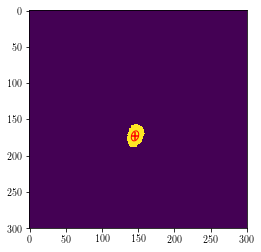

----------------------------------------------------------------------------------------------------
###      galX, galY :  145.56308234293724 172.68272194097506
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_546_xy_full_particles.fits
###      Input Image   : temp_ZRHZ2.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

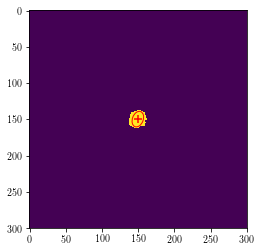

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.47257851299716 149.5614481817492
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_546_xy_full_particles.fits
###      Input Image   : temp_J415I.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

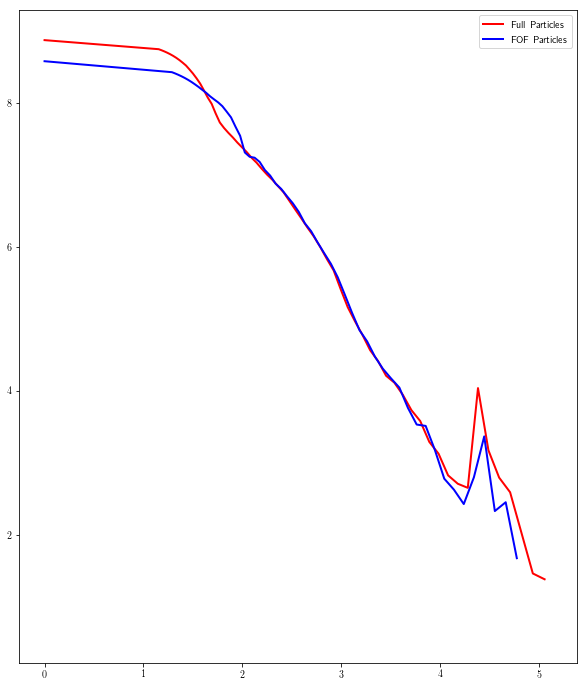

Galaxy 140
(53, u'subbox_053_ptlstr_Coordinates', u'subbox_053_ptlstr_Masses')
Pixel Scales: 5.31401683772, 5.3333 kpc/pixel


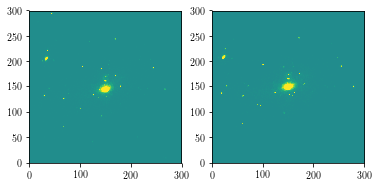

Measuring FULL PARTICLE profile
(17452164., 673, 627, 131, 165, 127, 165, 149.55852112, 153.25389623, 14.53314955, 21.99155239, -1.24109496, 0., 0., 0., 4.71090746, 3.78576946, -1.41015911, 0.06914143, 0.04569222, 0.007804, 2.3264741e+11, 2.32965194e+11, 1.56352891e+10, 3.4534912e+10, 149, 154, 149, 154, 0)


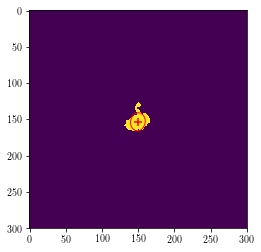

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.55852111717755 153.2538962349304
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_140_xy_full_particles.fits
###      Input Image   : temp_AK3PA.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

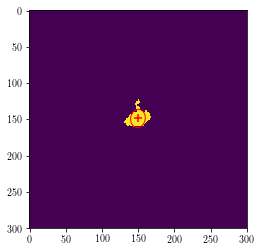

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.6000068870456 148.66509414004304
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_140_xy_full_particles.fits
###      Input Image   : temp_1TJI1.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

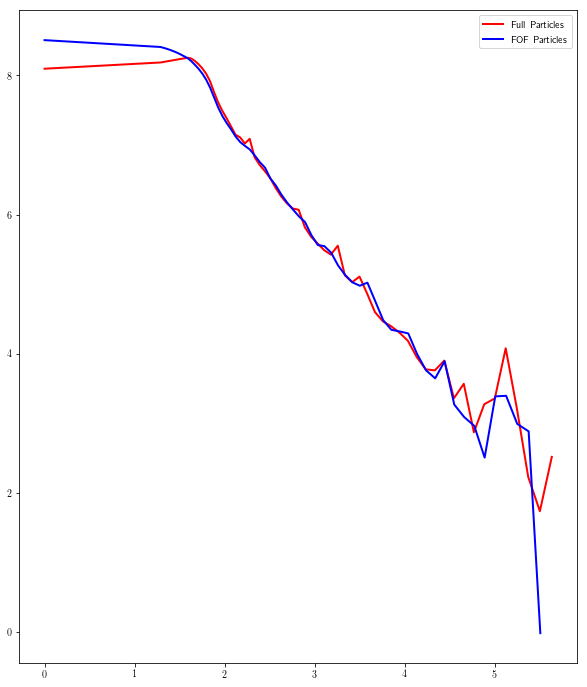

Galaxy 459
(54, u'subbox_054_ptlstr_Coordinates', u'subbox_054_ptlstr_Masses')
Pixel Scales: 3.98062028171, 5.3333 kpc/pixel


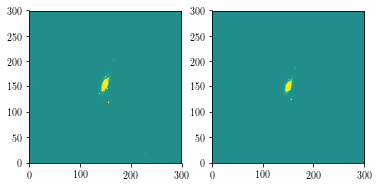

Measuring FULL PARTICLE profile
(16272035., 544, 514, 139, 158, 124, 166, 148.80972383, 145.53383733, 6.61853313, 28.63839364, -8.18089533, 0., 0., 0., 5.59866762, 1.97783852, -1.25127816, 0.23355952, 0.05397724, 0.13343807, 2.25195377e+11, 2.25417249e+11, 1.62601472e+10, 4.51982868e+10, 149, 146, 149, 146, 0)


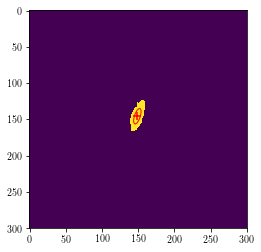

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.80972382721473 145.53383732711433
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_459_xy_full_particles.fits
###      Input Image   : temp_JW1B5.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

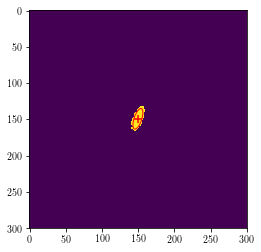

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.55561673106817 149.10865845987786
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_459_xy_full_particles.fits
###      Input Image   : temp_IGJZ1.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

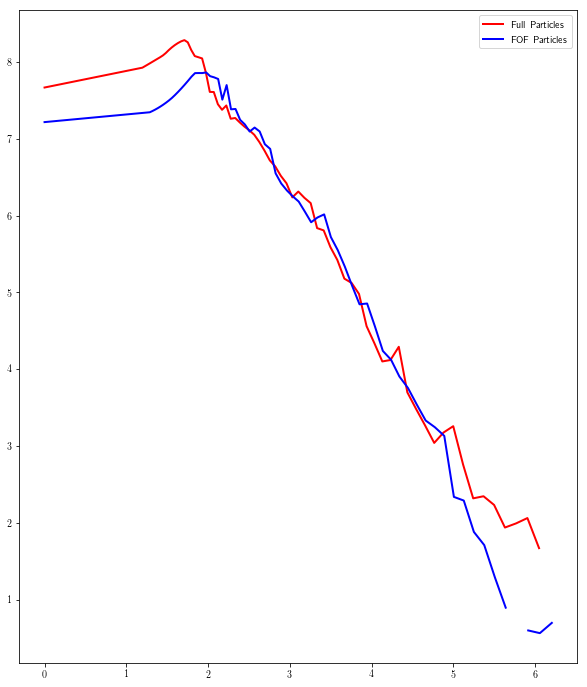

Galaxy 66
(55, u'subbox_055_ptlstr_Coordinates', u'subbox_055_ptlstr_Masses')
Pixel Scales: 7.14396537718, 5.3333 kpc/pixel


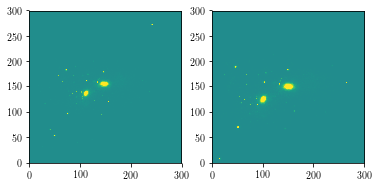

Measuring FULL PARTICLE profile
(21126876., 457, 425, 131, 162, 133, 152, 146.67493326, 144.3835086, 11.94496561, 3.83716827, 1.24321696, 0., 0., 0., 3.48300338, 1.91071224, 0.14878327, 0.08663881, 0.26970348, -0.0561408, 2.79828595e+11, 2.80102142e+11, 2.43552276e+10, 5.43084667e+10, 147, 144, 147, 144, 0)


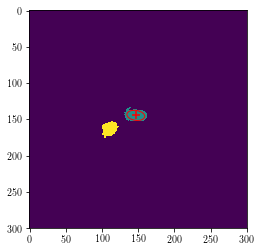

----------------------------------------------------------------------------------------------------
###      galX, galY :  146.67493325782726 144.38350859650228
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_66_xy_full_particles.fits
###      Input Image   : temp_Y45S4.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

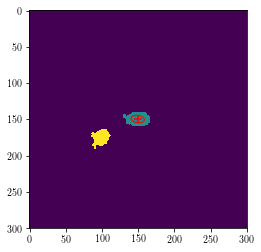

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.2543605856143 149.45736790548452
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_66_xy_full_particles.fits
###      Input Image   : temp_RAV97.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

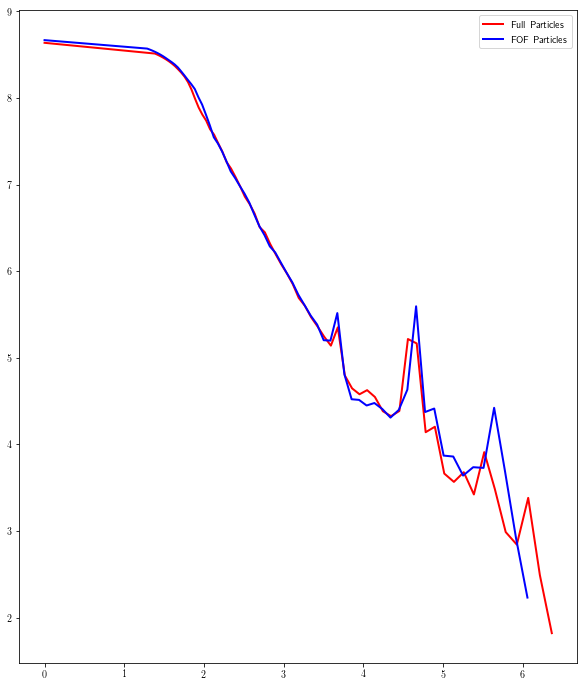

Galaxy 114
(56, u'subbox_056_ptlstr_Coordinates', u'subbox_056_ptlstr_Masses')
Pixel Scales: 6.34799970779, 5.3333 kpc/pixel


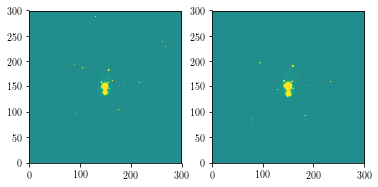

Measuring FULL PARTICLE profile
(18595912., 466, 434, 136, 159, 129, 163, 148.96685639, 149.45847837, 7.28895086, 8.19625518, 0.80053841, 0., 0., 0., 2.94325423, 2.61198401, 1.04317915, 0.13868161, 0.12332992, -0.02709041, 3.22723447e+11, 3.22733408e+11, 2.37730693e+10, 6.74393498e+10, 149, 150, 149, 150, 1)


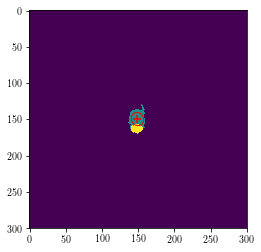

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.96685638546546 149.4584783698561
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_114_xy_full_particles.fits
###      Input Image   : temp_GV5YI.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

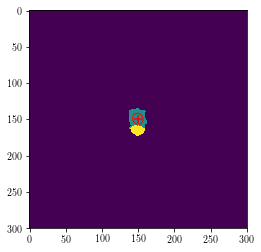

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.49446991771336 149.04900422965565
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_114_xy_full_particles.fits
###      Input Image   : temp_5XO2F.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

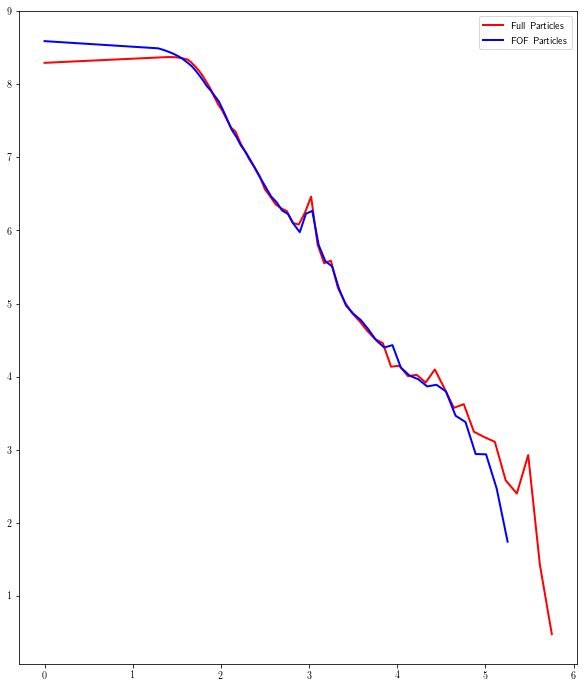

Galaxy 28
(57, u'subbox_057_ptlstr_Coordinates', u'subbox_057_ptlstr_Masses')
Pixel Scales: 9.0274267431, 5.3333 kpc/pixel


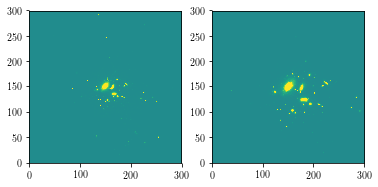

Measuring FULL PARTICLE profile
(24757150., 643, 601, 127, 166, 131, 162, 148.91313874, 149.0642024, 28.56511957, 19.39454664, -12.77336311, 0., 0., 0., 6.12790823, 3.22620606, -0.61307532, 0.04962162, 0.07308485, 0.06536219, 6.3672936e+11, 6.37251289e+11, 5.26427914e+10, 1.48343128e+11, 149, 149, 149, 149, 1)


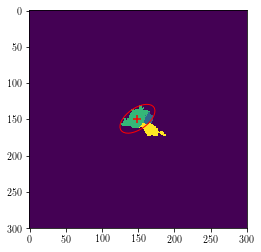

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.91313874128298 149.064202400211
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_28_xy_full_particles.fits
###      Input Image   : temp_TBAGR.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

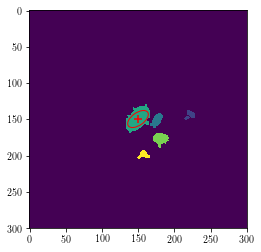

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.69205421341192 149.43728507519276
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_28_xy_full_particles.fits
###      Input Image   : temp_C07O9.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

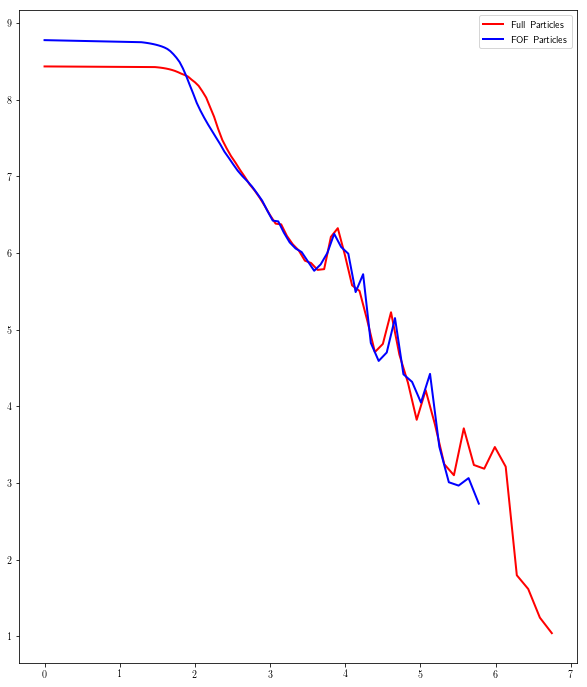

Galaxy 170
(58, u'subbox_058_ptlstr_Coordinates', u'subbox_058_ptlstr_Masses')
Pixel Scales: 5.38792652984, 5.3333 kpc/pixel


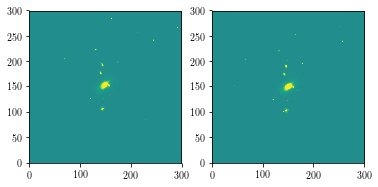

Measuring FULL PARTICLE profile
(14807569., 511, 469, 132, 162, 135, 161, 148.13997915, 146.63900645, 11.32160139, 5.90508149, -2.79491607, 0., 0., 0., 3.53626323, 2.17290735, -0.4005717, 0.10001252, 0.19175042, 0.09467324, 1.7715916e+11, 1.77321181e+11, 1.57076992e+10, 3.55655107e+10, 148, 146, 148, 146, 0)


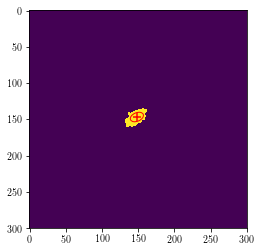

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.1399791535017 146.63900644615097
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_170_xy_full_particles.fits
###      Input Image   : temp_ZY1C9.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

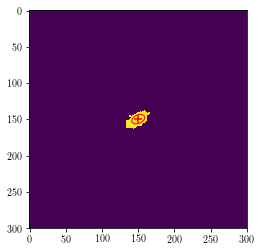

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.94109634655555 149.63196844226778
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_170_xy_full_particles.fits
###      Input Image   : temp_62HFF.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

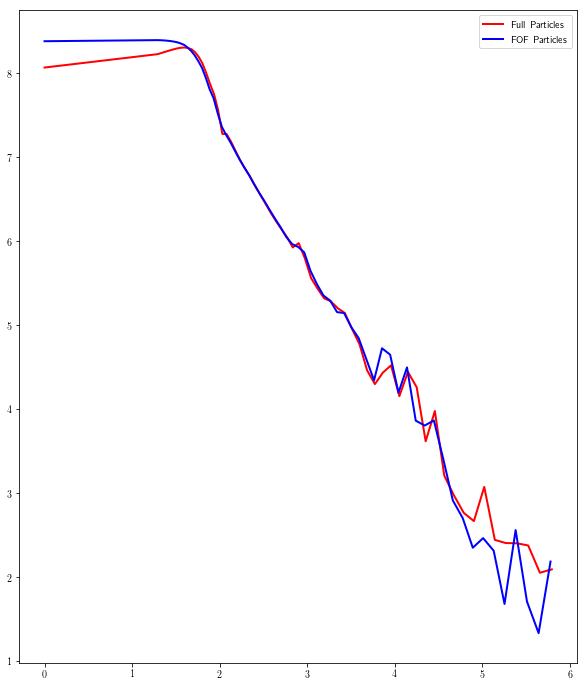

Galaxy 159
(59, u'subbox_059_ptlstr_Coordinates', u'subbox_059_ptlstr_Masses')
Pixel Scales: 5.303871363, 5.3333 kpc/pixel


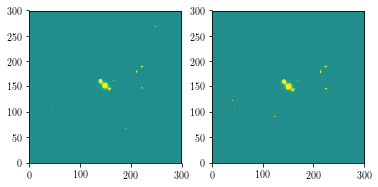

Measuring FULL PARTICLE profile
(11948815., 282, 266, 139, 159, 136, 158, 148.27021429, 148.00295045, 3.3590986, 3.84386737, -0.50112306, 0., 0., 0., 2.03915334, 1.744941, -1.01065242, 0.30360371, 0.26531476, 0.07916132, 1.78851774e+11, 1.78918621e+11, 2.13965496e+10, 6.22298767e+10, 148, 148, 148, 148, 1)


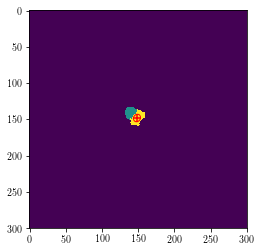

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.2702142864186 148.0029504487996
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_159_xy_full_particles.fits
###      Input Image   : temp_9Z6E4.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

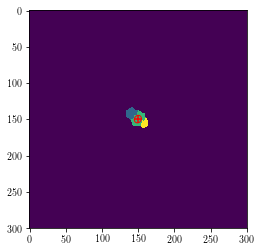

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.51059287886855 149.52109170844486
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_159_xy_full_particles.fits
###      Input Image   : temp_IYXIH.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

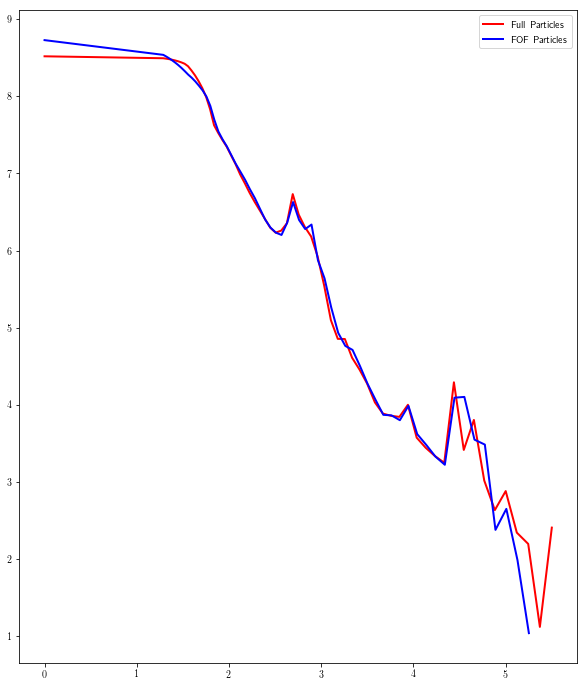

Galaxy 63
(60, u'subbox_060_ptlstr_Coordinates', u'subbox_060_ptlstr_Masses')
Pixel Scales: 7.17574364913, 5.3333 kpc/pixel


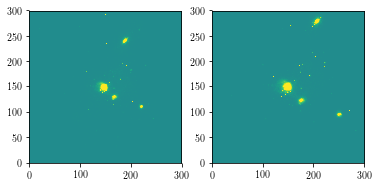

Measuring FULL PARTICLE profile
(19169506., 738, 700, 124, 162, 138, 165, 147.23449773, 151.27795892, 12.77356889, 11.13085189, -0.0336746, 0., 0., 0., 3.57410955, 3.33618975, -0.02048786, 0.07828728, 0.0898411, 0.00047369, 4.3321131e+11, 4.33547051e+11, 2.36929229e+10, 5.79973038e+10, 148, 150, 148, 150, 1)


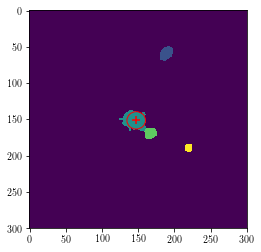

----------------------------------------------------------------------------------------------------
###      galX, galY :  147.2344977301138 151.27795892336505
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_63_xy_full_particles.fits
###      Input Image   : temp_ST617.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

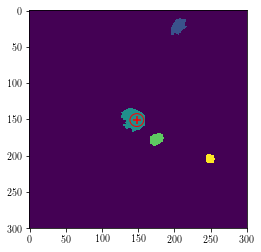

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.0823641447021 150.8679409157062
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_63_xy_full_particles.fits
###      Input Image   : temp_RPPN4.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

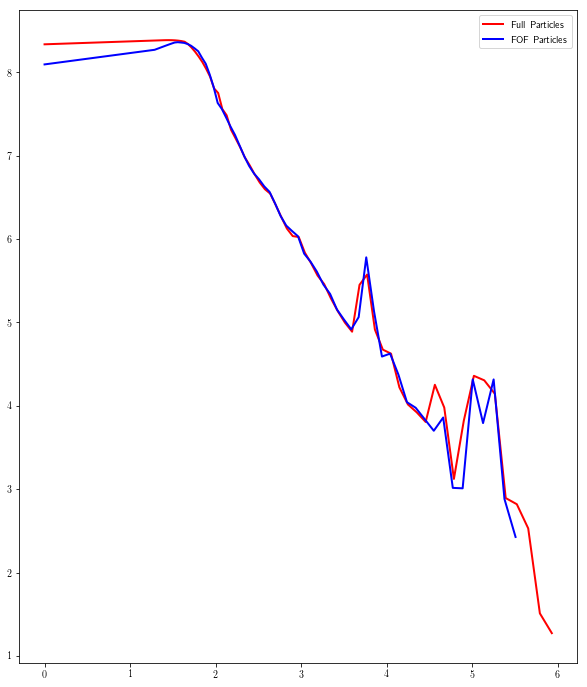

Galaxy 52
(61, u'subbox_061_ptlstr_Coordinates', u'subbox_061_ptlstr_Masses')
Pixel Scales: 8.20993568029, 5.3333 kpc/pixel


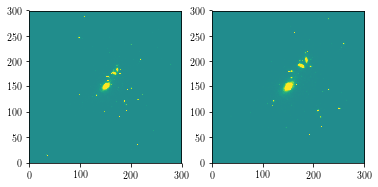

Measuring FULL PARTICLE profile
(21432772., 645, 597, 137, 168, 125, 165, 150.8732859, 147.83098008, 7.89752271, 22.73103648, -6.67251529, 0., 0., 0., 5.02899504, 2.31036139, -1.20448434, 0.16838251, 0.05850172, 0.09885471, 4.17138901e+11, 4.17378632e+11, 3.63018854e+10, 8.78456095e+10, 151, 149, 151, 149, 1)


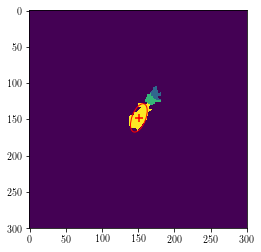

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.87328590491146 147.83098007858996
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_52_xy_full_particles.fits
###      Input Image   : temp_D5XLD.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

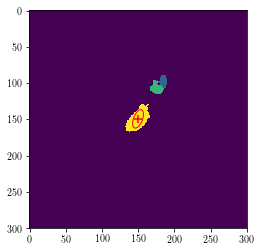

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.735919111398 149.22099352365467
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_52_xy_full_particles.fits
###      Input Image   : temp_7PD6V.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

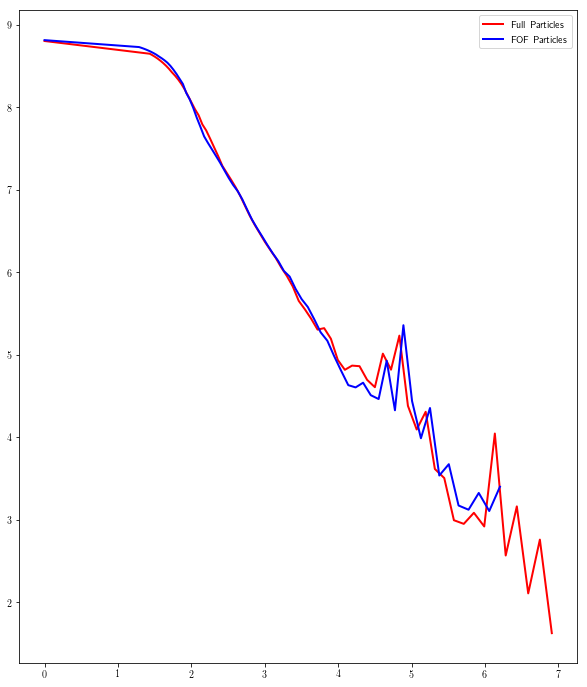

Galaxy 123
(62, u'subbox_062_ptlstr_Coordinates', u'subbox_062_ptlstr_Masses')
Pixel Scales: 6.35687156375, 5.3333 kpc/pixel


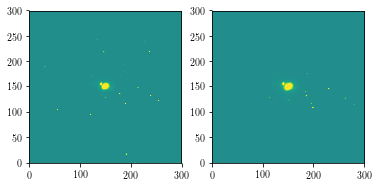

Measuring FULL PARTICLE profile
(18678244., 483, 448, 133, 167, 138, 160, 149.15568524, 148.9539986, 6.7758677, 4.51790791, -0.8932037, 0., 0., 0., 2.66204309, 2.05117083, -0.33466369, 0.15153171, 0.22726423, 0.05991653, 3.42747873e+11, 3.42842016e+11, 3.30749256e+10, 8.94074143e+10, 149, 149, 149, 149, 1)


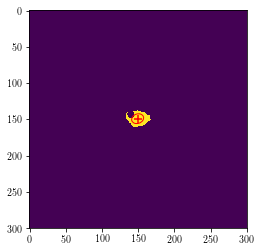

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.15568524305868 148.95399860180876
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_123_xy_full_particles.fits
###      Input Image   : temp_VBYYL.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

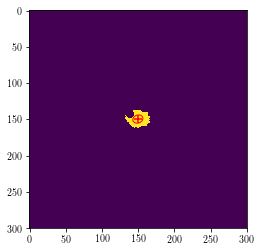

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.48685210407834 149.48299052477032
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_123_xy_full_particles.fits
###      Input Image   : temp_A5CC2.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

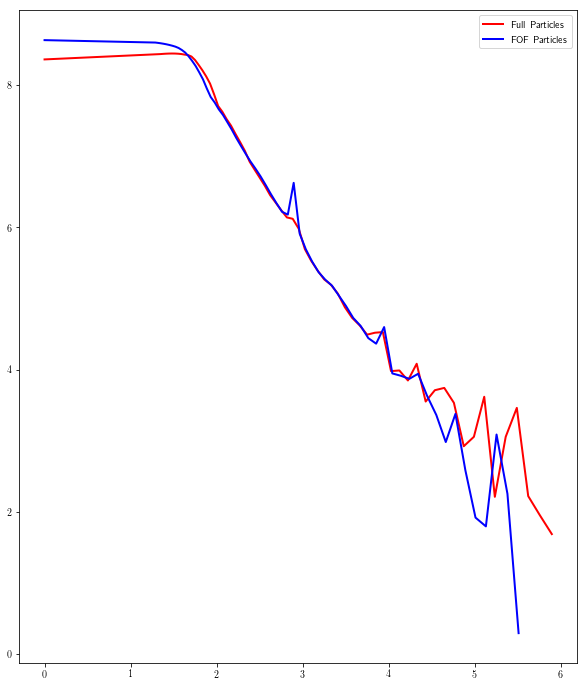

Galaxy 84
(63, u'subbox_063_ptlstr_Coordinates', u'subbox_063_ptlstr_Masses')
Pixel Scales: 6.8814260936, 5.3333 kpc/pixel


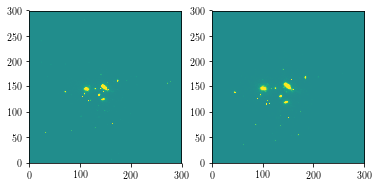

Measuring FULL PARTICLE profile
(20963832., 296, 272, 137, 161, 141, 161, 148.36670016, 151.33652774, 10.23067947, 6.29475978, 5.07546896, 0., 0., 0., 3.70221043, 1.67901051, 0.60045189, 0.16291088, 0.26477405, -0.2627103, 2.28647617e+11, 2.28898193e+11, 1.88070687e+10, 3.97739172e+10, 149, 151, 149, 151, 0)


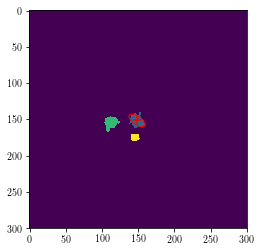

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.36670016151075 151.33652774100955
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_84_xy_full_particles.fits
###      Input Image   : temp_4O3KW.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

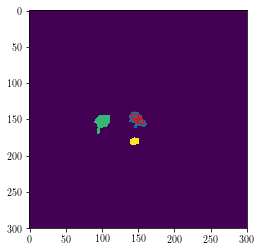

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.05866013342037 149.39278346683008
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_84_xy_full_particles.fits
###      Input Image   : temp_4XO02.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

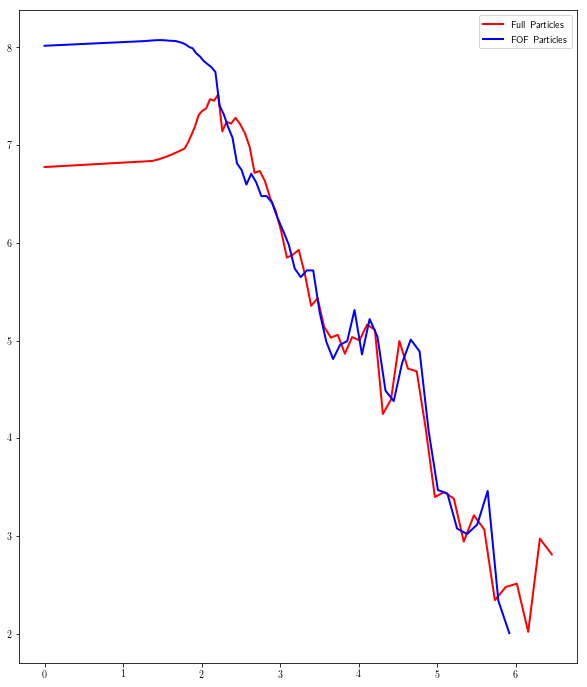

Galaxy 36
(64, u'subbox_064_ptlstr_Coordinates', u'subbox_064_ptlstr_Masses')
Pixel Scales: 8.50000967286, 5.3333 kpc/pixel


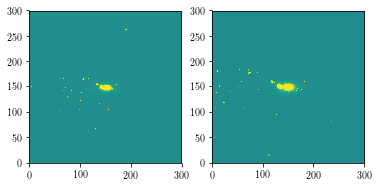

Measuring FULL PARTICLE profile
(22453572., 628, 584, 127, 179, 142, 164, 152.69506689, 151.22760442, 18.74668807, 5.65087593, 0.78395505, 0., 0., 0., 4.33514118, 2.36730075, 0.05957944, 0.05365403, 0.17799637, -0.01488702, 4.92353978e+11, 4.92702859e+11, 4.5669716e+10, 1.23190813e+11, 153, 151, 153, 151, 1)


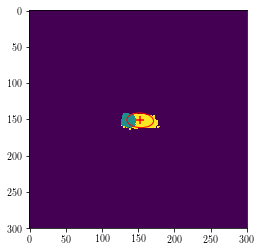

----------------------------------------------------------------------------------------------------
###      galX, galY :  152.69506689202862 151.2276044172937
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_36_xy_full_particles.fits
###      Input Image   : temp_0RJR2.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

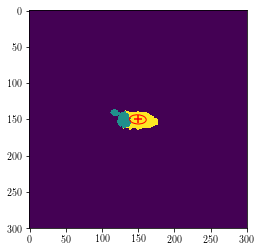

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.47041813810253 149.91551788028352
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_36_xy_full_particles.fits
###      Input Image   : temp_57659.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

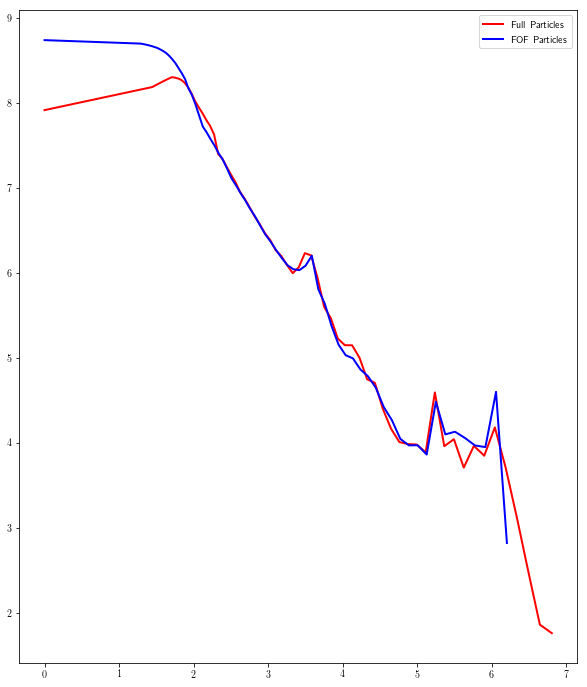

Galaxy 204
(65, u'subbox_065_ptlstr_Coordinates', u'subbox_065_ptlstr_Masses')
Pixel Scales: 5.12973476424, 5.3333 kpc/pixel


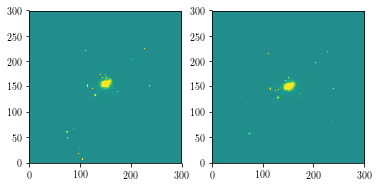

Measuring FULL PARTICLE profile
(23120170., 534, 507, 136, 164, 131, 155, 149.71394336, 144.10267682, 11.01099905, 8.04417249, -1.65122269, 0., 0., 0., 3.42743087, 2.70331097, -0.41944054, 0.09370268, 0.1282618, 0.03846859, 2.09072325e+11, 2.09341071e+11, 1.50585108e+10, 3.20235213e+10, 149, 144, 149, 144, 0)


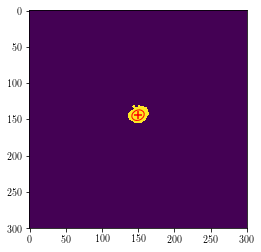

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.7139433612644 144.10267681565338
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_204_xy_full_particles.fits
###      Input Image   : temp_NFQ6K.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

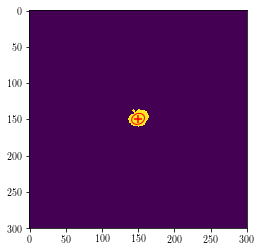

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.8037085182951 149.21640081029037
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_204_xy_full_particles.fits
###      Input Image   : temp_31OJ3.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

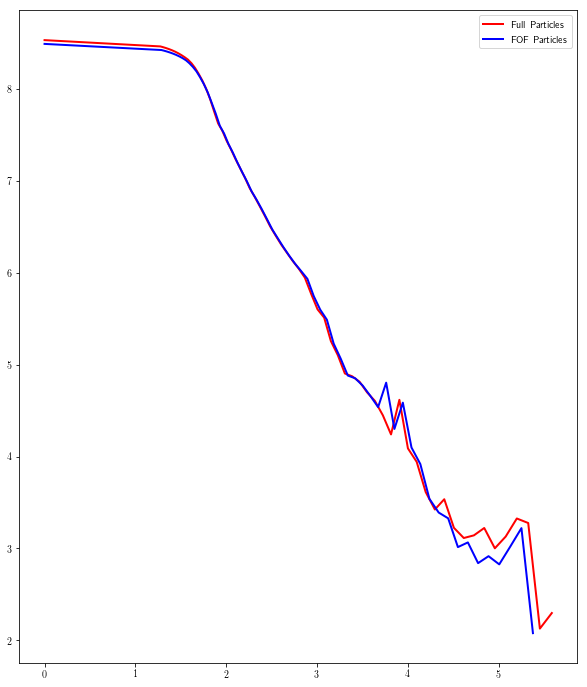

Galaxy 380
(66, u'subbox_066_ptlstr_Coordinates', u'subbox_066_ptlstr_Masses')
Pixel Scales: 3.92200319688, 5.3333 kpc/pixel


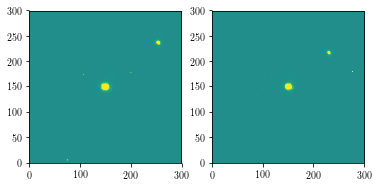

Measuring FULL PARTICLE profile
(21695404., 383, 373, 139, 162, 140, 160, 149.09345887, 149.96315694, 7.3769126, 5.56670367, 0.75410279, 0., 0., 0., 2.76584411, 2.30080914, 0.34731993, 0.13746163, 0.18216211, -0.03724294, 1.73842416e+11, 1.74072676e+11, 1.54972426e+10, 4.17732403e+10, 149, 150, 149, 150, 0)


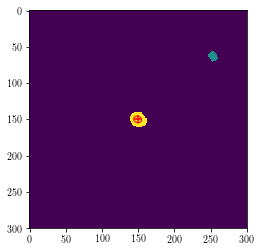

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.09345886728752 149.96315693976464
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_380_xy_full_particles.fits
###      Input Image   : temp_XQTKZ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

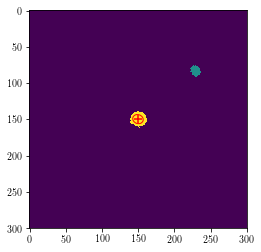

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.6486995308699 149.5564621743453
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_380_xy_full_particles.fits
###      Input Image   : temp_E8ZF3.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

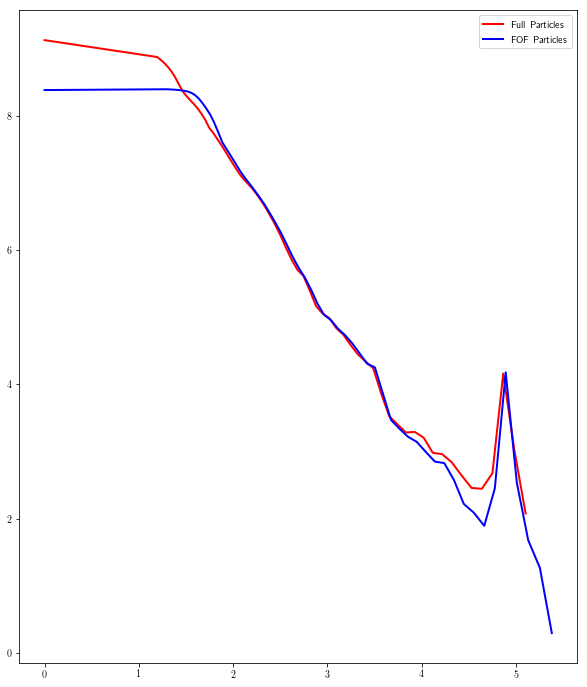

Galaxy 38
(67, u'subbox_067_ptlstr_Coordinates', u'subbox_067_ptlstr_Masses')
Pixel Scales: 8.17336378647, 5.3333 kpc/pixel


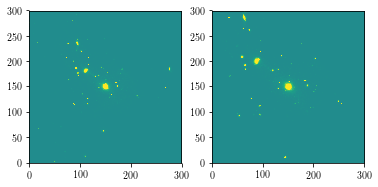

Measuring FULL PARTICLE profile
(25260518., 490, 448, 135, 162, 136, 163, 149.0397823, 149.39240671, 11.14751805, 5.54702969, 2.0675597, 0., 0., 0., 3.43920088, 2.206002, 0.3180016, 0.09636816, 0.19366506, -0.07183915, 3.2237142e+11, 3.2270241e+11, 2.62080635e+10, 4.81584988e+10, 150, 149, 150, 149, 0)


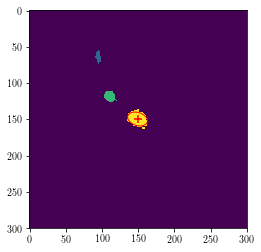

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.03978229707099 149.39240671166573
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_38_xy_full_particles.fits
###      Input Image   : temp_SC86Y.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

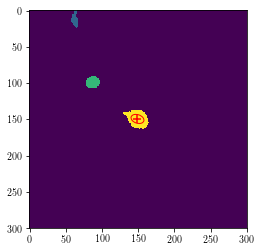

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.98006560671655 149.29638970449017
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_38_xy_full_particles.fits
###      Input Image   : temp_U1WV3.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

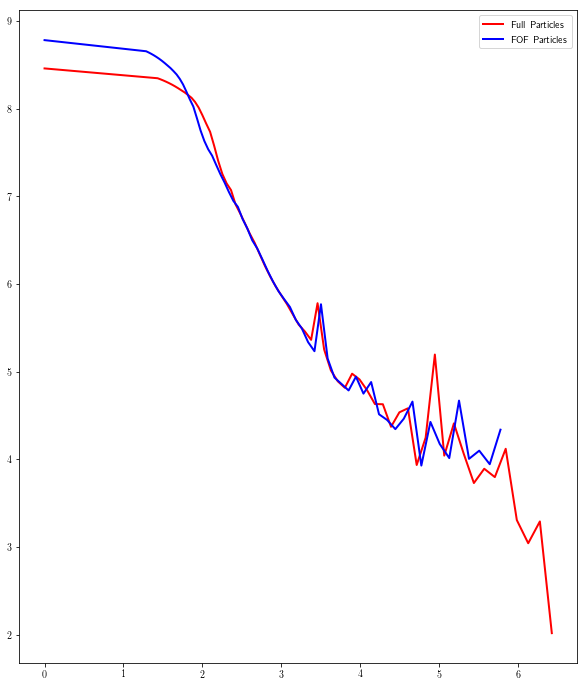

Galaxy 197
(68, u'subbox_068_ptlstr_Coordinates', u'subbox_068_ptlstr_Masses')
Pixel Scales: 5.0828013924, 5.3333 kpc/pixel


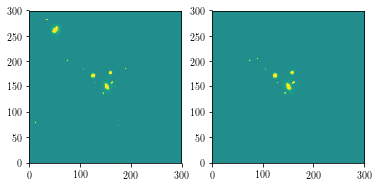

Measuring FULL PARTICLE profile
(14836979., 314, 293, 143, 161, 138, 164, 152.10991378, 149.64872273, 2.58703677, 4.88688008, 1.2774139, 0., 0., 0., 2.33574605, 1.42063618, 1.15185964, 0.44382799, 0.2349555, -0.23203027, 1.58376133e+11, 1.58556897e+11, 1.62959022e+10, 3.77125478e+10, 152, 150, 152, 150, 1)


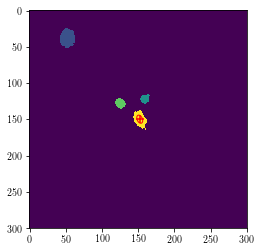

----------------------------------------------------------------------------------------------------
###      galX, galY :  152.10991377669595 149.64872273038947
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_197_xy_full_particles.fits
###      Input Image   : temp_I2YFP.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

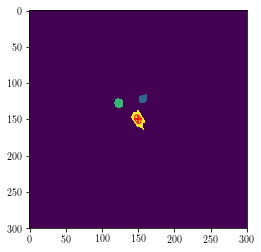

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.55267192307755 149.55815047751108
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_197_xy_full_particles.fits
###      Input Image   : temp_XF8X0.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

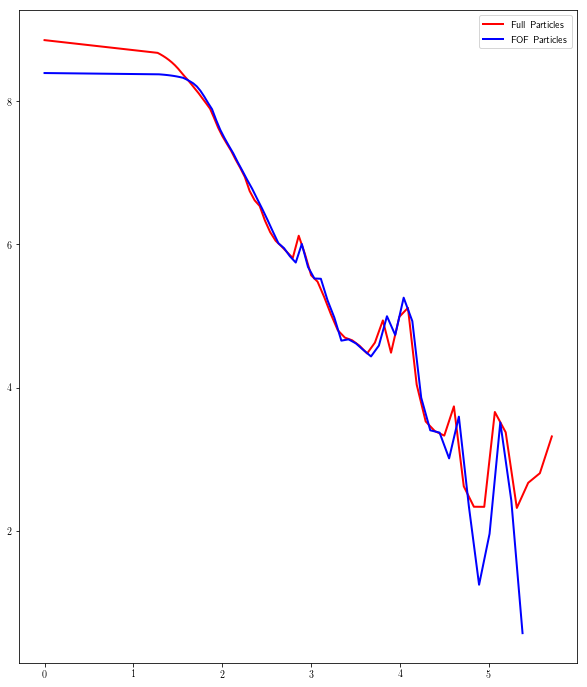

Galaxy 351
(69, u'subbox_069_ptlstr_Coordinates', u'subbox_069_ptlstr_Masses')
Pixel Scales: 4.3444461238, 5.3333 kpc/pixel


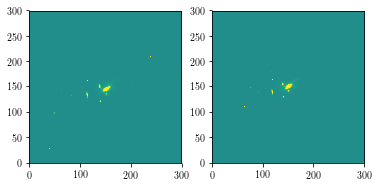

Measuring FULL PARTICLE profile
(24148984., 336, 312, 136, 162, 145, 167, 150.41306168, 153.82107813, 15.15303743, 6.31495525, 1.92628184, 0., 0., 0., 3.94393563, 2.43174124, 0.20553543, 0.0686556, 0.1647424, -0.04188471, 2.23270044e+11, 2.2357649e+11, 1.98930145e+10, 5.24957204e+10, 151, 154, 151, 154, 0)


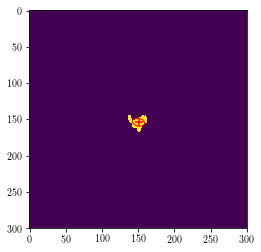

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.4130616843852 153.82107813318217
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_351_xy_full_particles.fits
###      Input Image   : temp_9ME2S.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

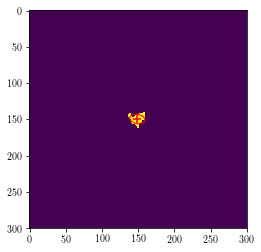

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.81696508554543 149.33568011964854
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_351_xy_full_particles.fits
###      Input Image   : temp_IHK30.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

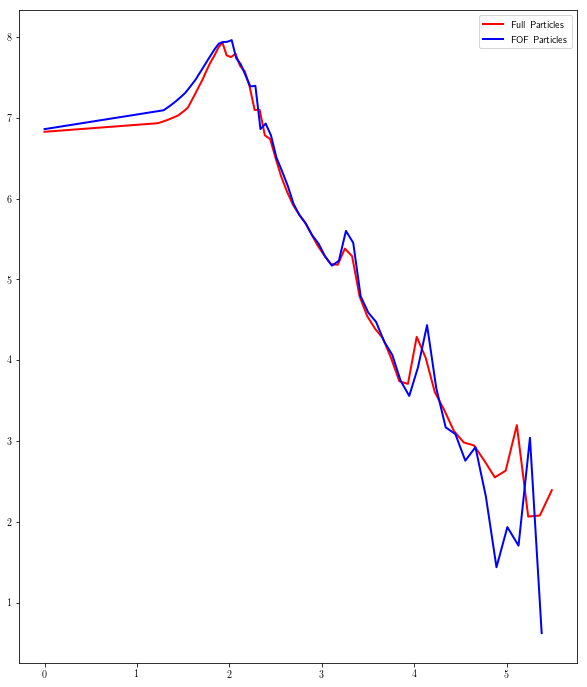

Galaxy 15
(70, u'subbox_070_ptlstr_Coordinates', u'subbox_070_ptlstr_Masses')
Pixel Scales: 8.25920313955, 5.3333 kpc/pixel


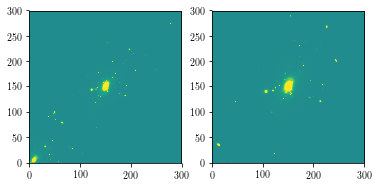

Measuring FULL PARTICLE profile
(20994324., 1085, 1014, 128, 167, 129, 173, 149.4623615, 149.36760456, 20.55758512, 20.28064123, -6.47909541, 0., 0., 0., 5.18649101, 3.73343515, -0.77471375, 0.05409003, 0.05482866, 0.03456049, 7.2350276e+11, 7.23935887e+11, 4.70685573e+10, 9.66248776e+10, 150, 149, 150, 149, 1)


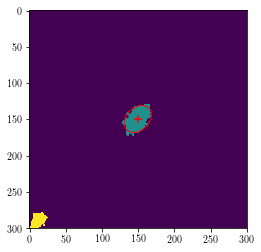

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.46236150359238 149.36760456026636
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_15_xy_full_particles.fits
###      Input Image   : temp_AFVS7.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

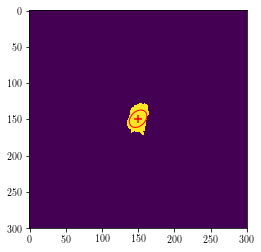

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.79491829907738 149.0138109751041
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_15_xy_full_particles.fits
###      Input Image   : temp_ALDAR.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

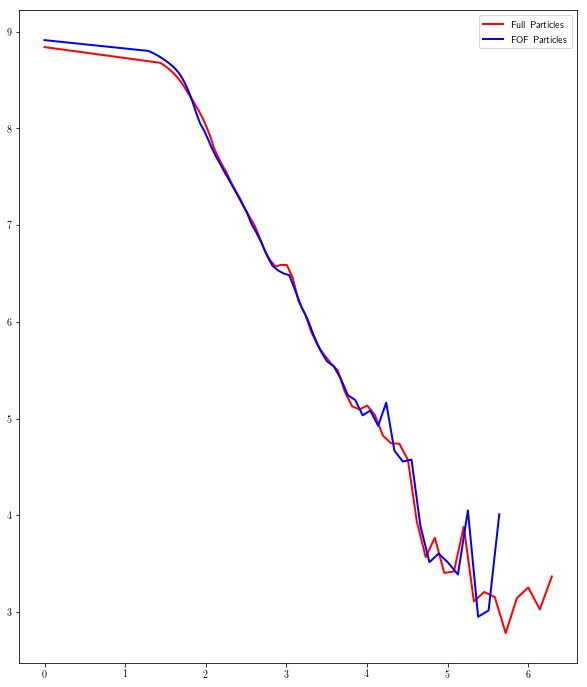

Galaxy 22
(71, u'subbox_071_ptlstr_Coordinates', u'subbox_071_ptlstr_Masses')
Pixel Scales: 9.82320606382, 5.3333 kpc/pixel


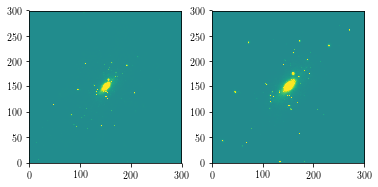

Measuring FULL PARTICLE profile
(21124728., 1764, 1663, 126, 176, 120, 179, 150.80280289, 148.7943013, 29.50291345, 42.82848793, -21.80016635, 0., 0., 0., 7.67862701, 3.65651298, -0.93370515, 0.05432896, 0.03742515, 0.05530806, 1.73225017e+12, 1.73285913e+12, 8.65334313e+10, 1.71638948e+11, 150, 149, 150, 149, 0)


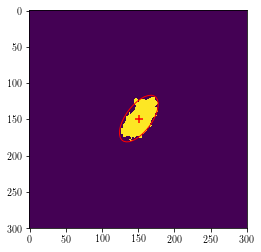

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.80280288840402 148.79430130230185
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_22_xy_full_particles.fits
###      Input Image   : temp_KO3AA.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

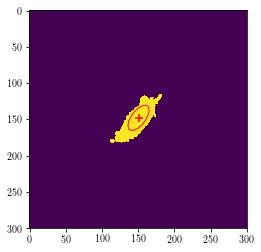

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.4537975344043 147.8134755745689
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_22_xy_full_particles.fits
###      Input Image   : temp_B8OES.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

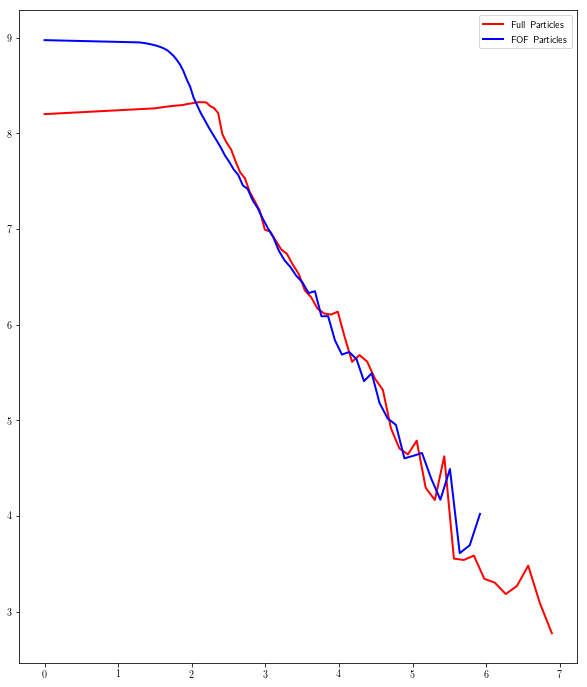

Galaxy 243
(72, u'subbox_072_ptlstr_Coordinates', u'subbox_072_ptlstr_Masses')
Pixel Scales: 5.10492916697, 5.3333 kpc/pixel


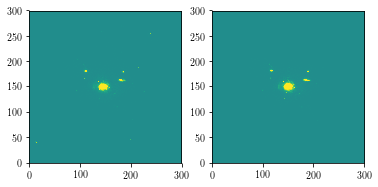

Measuring FULL PARTICLE profile
(15885898., 608, 564, 124, 159, 137, 162, 144.71268162, 149.88579484, 16.18764847, 7.74273045, 0.64419504, 0., 0., 0., 4.02945471, 2.77378321, 0.07569826, 0.06198071, 0.12958245, -0.01031359, 2.08467886e+11, 2.08671244e+11, 1.68653353e+10, 4.78931517e+10, 145, 150, 145, 150, 0)


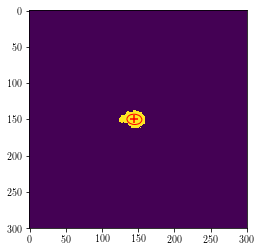

----------------------------------------------------------------------------------------------------
###      galX, galY :  144.71268162480905 149.88579484230553
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_243_xy_full_particles.fits
###      Input Image   : temp_Q6VYY.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

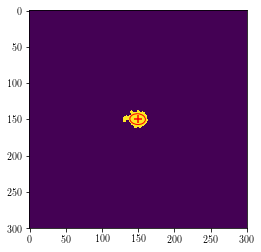

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.18658248538011 149.56760971631454
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_243_xy_full_particles.fits
###      Input Image   : temp_AFUNJ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

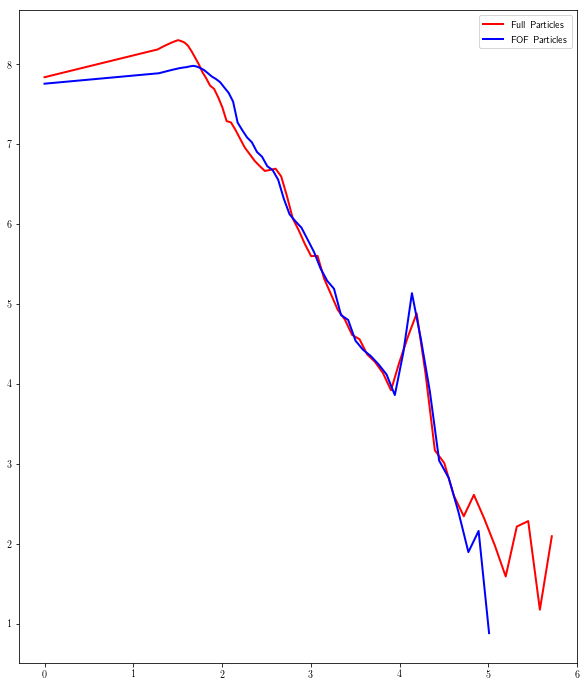

Galaxy 54
(73, u'subbox_073_ptlstr_Coordinates', u'subbox_073_ptlstr_Masses')
Pixel Scales: 7.25123434024, 5.3333 kpc/pixel


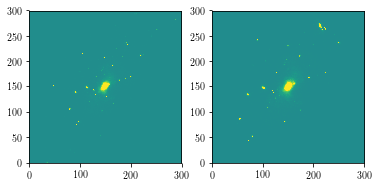

Measuring FULL PARTICLE profile
(23878824., 760, 714, 131, 169, 129, 170, 148.50001545, 149.08725048, 13.96149177, 14.47511823, -7.49821906, 0., 0., 0., 4.66057062, 2.59146476, -0.8025164, 0.09923235, 0.09571125, 0.1028062, 4.54479249e+11, 4.54858965e+11, 3.28807281e+10, 7.54438472e+10, 148, 150, 148, 150, 0)


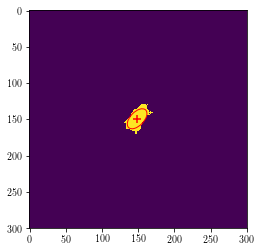

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.50001544817724 149.08725047910912
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_54_xy_full_particles.fits
###      Input Image   : temp_4ZV6C.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

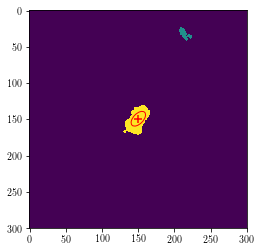

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.14829113427524 149.0340552191565
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_54_xy_full_particles.fits
###      Input Image   : temp_G6D8B.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

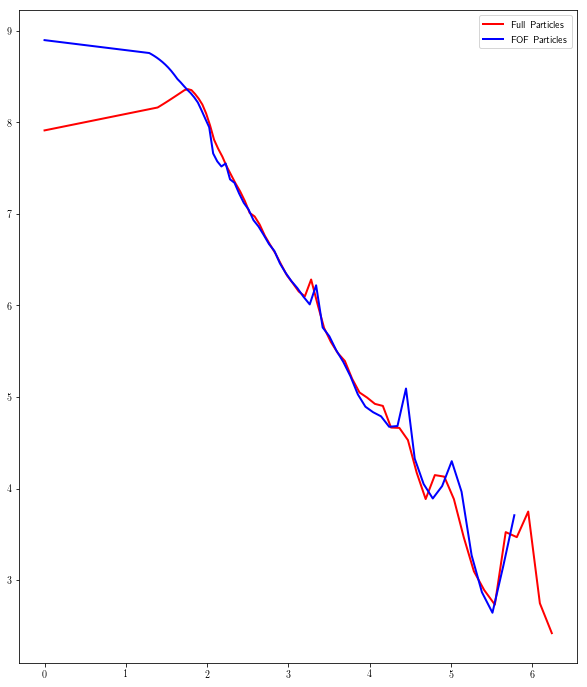

Galaxy 145
(74, u'subbox_074_ptlstr_Coordinates', u'subbox_074_ptlstr_Masses')
Pixel Scales: 5.79953889401, 5.3333 kpc/pixel


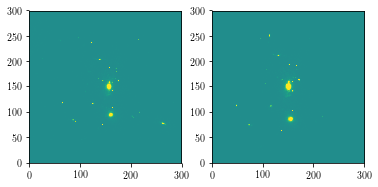

Measuring FULL PARTICLE profile
(18926280., 425, 408, 148, 165, 136, 167, 156.25069456, 149.66533527, 4.18029227, 8.27798751, 0.58889664, 0., 0., 0., 2.89152908, 2.02418852, 1.43085456, 0.24163939, 0.12202522, -0.03438049, 2.44994212e+11, 2.4522888e+11, 2.37239747e+10, 5.71413791e+10, 156, 150, 156, 150, 0)


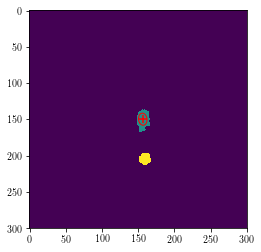

----------------------------------------------------------------------------------------------------
###      galX, galY :  156.25069456178056 149.66533527092653
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_145_xy_full_particles.fits
###      Input Image   : temp_YKOFM.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

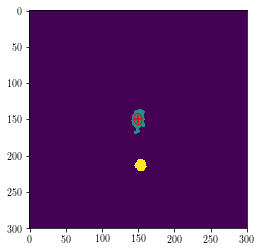

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.69136010991525 149.5858905934217
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_145_xy_full_particles.fits
###      Input Image   : temp_31PCL.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

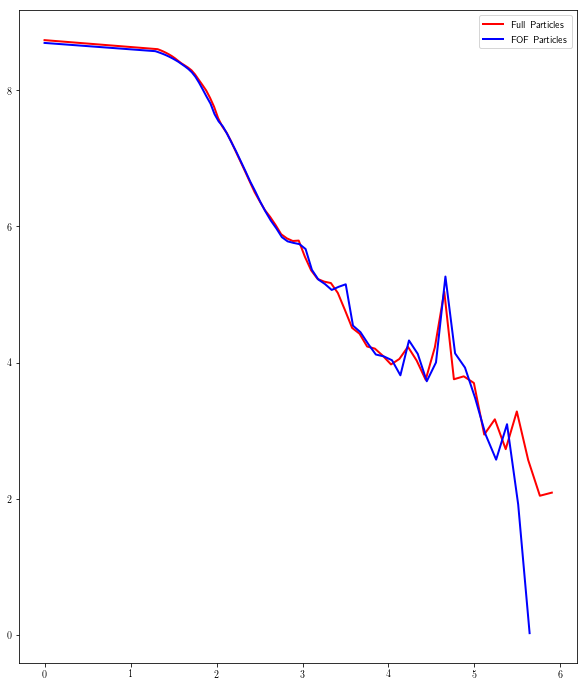

Galaxy 82
(75, u'subbox_075_ptlstr_Coordinates', u'subbox_075_ptlstr_Masses')
Pixel Scales: 5.94105648496, 5.3333 kpc/pixel


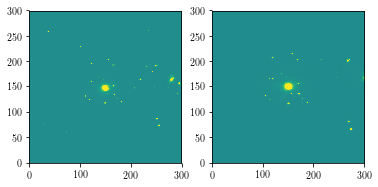

Measuring FULL PARTICLE profile
(15932704., 588, 559, 134, 171, 141, 166, 149.4301137, 152.60546437, 11.3929145, 5.82062789, -0.87982996, 0., 0., 0., 3.39536953, 2.38432574, -0.15293866, 0.08881056, 0.17383195, 0.02684872, 2.72417735e+11, 2.72604709e+11, 2.32668365e+10, 5.9929047e+10, 149, 153, 149, 153, 0)


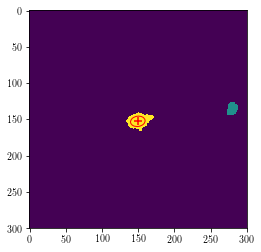

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.43011369990268 152.60546437407712
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_82_xy_full_particles.fits
###      Input Image   : temp_UPBY2.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

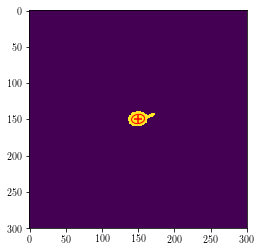

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.79523167368376 149.3617793567658
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_82_xy_full_particles.fits
###      Input Image   : temp_MFO79.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

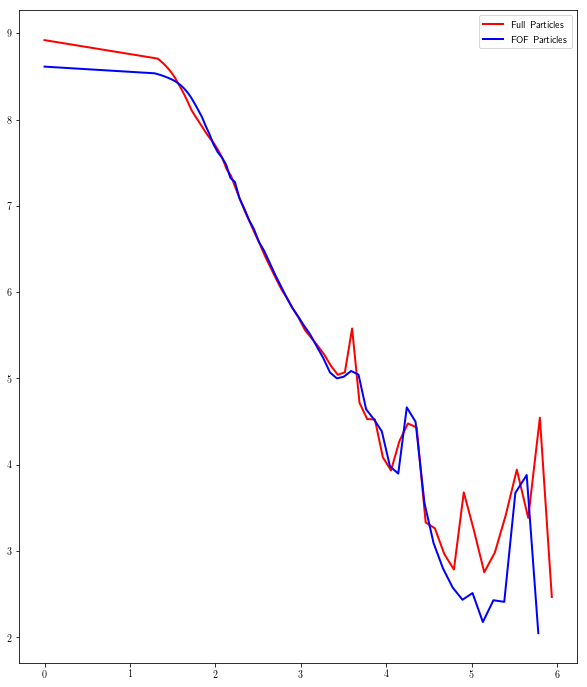

Galaxy 113
(76, u'subbox_076_ptlstr_Coordinates', u'subbox_076_ptlstr_Masses')
Pixel Scales: 6.13617030872, 5.3333 kpc/pixel


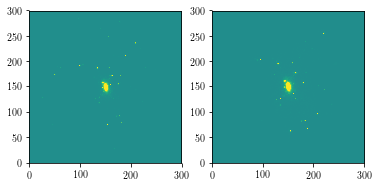

Measuring FULL PARTICLE profile
(18341382., 622, 573, 140, 164, 127, 168, 150.00102762, 150.04638845, 7.91210213, 20.98960756, -0.55978482, 0., 0., 0., 4.58405113, 2.80859113, -1.52809525, 0.12662759, 0.04773269, 0.00675422, 3.43702962e+11, 3.44124981e+11, 2.96629146e+10, 7.71236577e+10, 150, 151, 150, 151, 0)


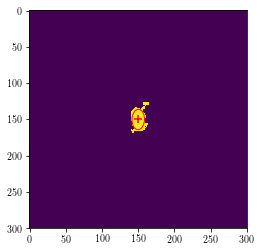

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.00102761921445 150.0463884464395
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_113_xy_full_particles.fits
###      Input Image   : temp_896GO.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

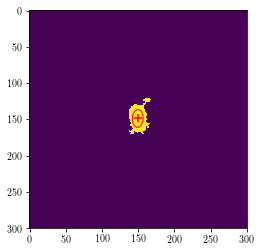

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.26149196872362 148.64371571885462
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_113_xy_full_particles.fits
###      Input Image   : temp_2C70P.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

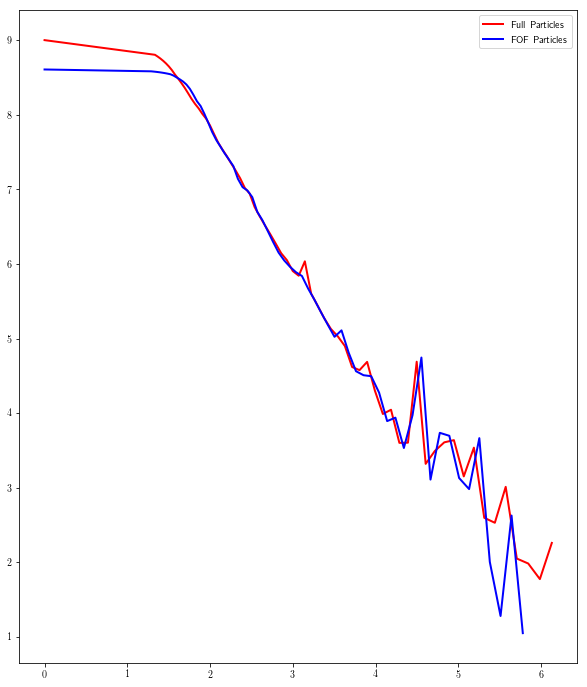

Galaxy 332
(77, u'subbox_077_ptlstr_Coordinates', u'subbox_077_ptlstr_Masses')
Pixel Scales: 4.50789301547, 5.3333 kpc/pixel


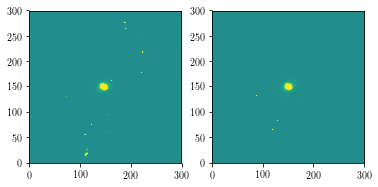

Measuring FULL PARTICLE profile
(18887452., 526, 499, 132, 163, 138, 161, 146.01473245, 149.65471966, 8.22373376, 5.56469384, 0.51028927, 0., 0., 0., 2.88414621, 2.33883071, 0.18323806, 0.12229514, 0.1807328, -0.02242923, 2.63810859e+11, 2.63983989e+11, 2.04257239e+10, 5.02244475e+10, 146, 150, 146, 150, 0)


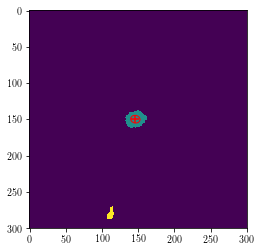

----------------------------------------------------------------------------------------------------
###      galX, galY :  146.01473245388235 149.654719664632
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_332_xy_full_particles.fits
###      Input Image   : temp_F52S1.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

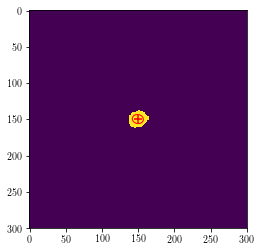

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.4445094032332 149.4625490029095
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_332_xy_full_particles.fits
###      Input Image   : temp_88Y7H.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

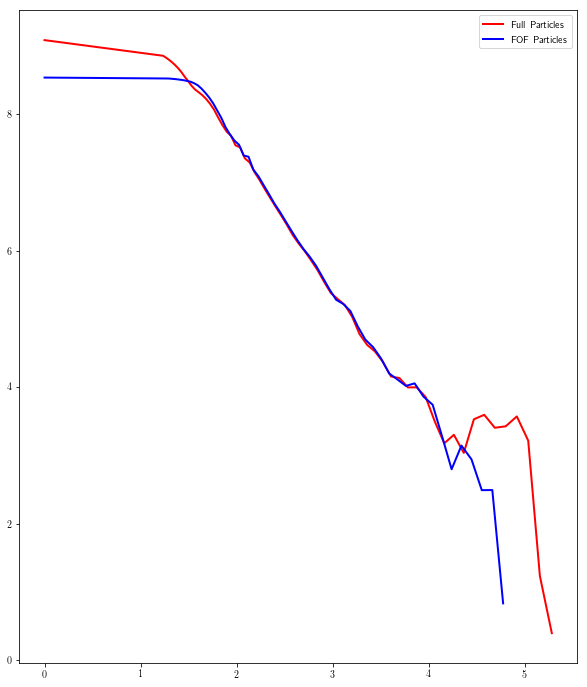

Galaxy 69
(78, u'subbox_078_ptlstr_Coordinates', u'subbox_078_ptlstr_Masses')
Pixel Scales: 7.42552417116, 5.3333 kpc/pixel


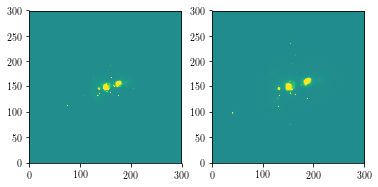

Measuring FULL PARTICLE profile
(37381364., 431, 401, 133, 163, 141, 162, 148.56384448, 151.45185936, 26.34496792, 7.38064016, -1.94876832, 0., 0., 0., 5.15200472, 2.68001056, -0.10134848, 0.03871404, 0.13818859, 0.02044395, 4.23448936e+11, 4.23816593e+11, 2.91750564e+10, 6.93103575e+10, 150, 151, 150, 151, 1)


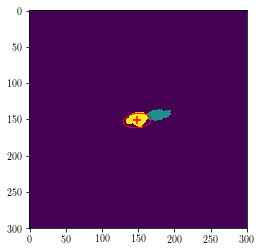

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.56384448190673 151.45185936373133
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_69_xy_full_particles.fits
###      Input Image   : temp_I2NOY.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

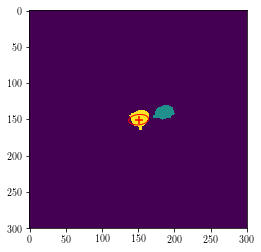

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.50163126731994 150.34241263312728
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_69_xy_full_particles.fits
###      Input Image   : temp_U2DY2.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

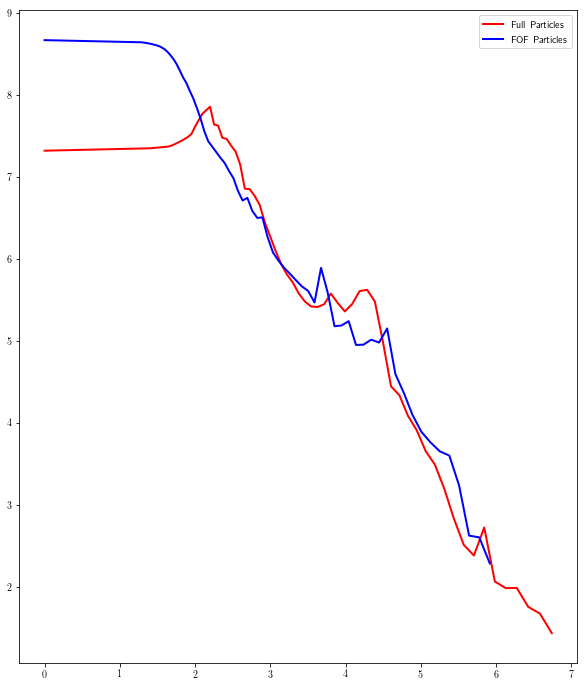

Galaxy 193
(79, u'subbox_079_ptlstr_Coordinates', u'subbox_079_ptlstr_Masses')
Pixel Scales: 5.31709314687, 5.3333 kpc/pixel


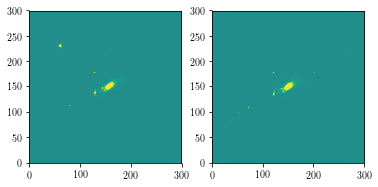

Measuring FULL PARTICLE profile
(18385460., 560, 530, 136, 174, 134, 162, 156.91415231, 148.56138314, 15.08224165, 7.82392264, -7.24780479, 0., 0., 0., 4.42252493, 1.82960045, -0.55328429, 0.11950098, 0.23036306, 0.22140296, 2.74613813e+11, 2.74865865e+11, 2.30580716e+10, 4.65962189e+10, 157, 148, 157, 148, 0)


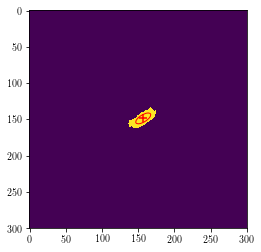

----------------------------------------------------------------------------------------------------
###      galX, galY :  156.91415231471 148.5613831387308
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_193_xy_full_particles.fits
###      Input Image   : temp_MZ7QV.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figure

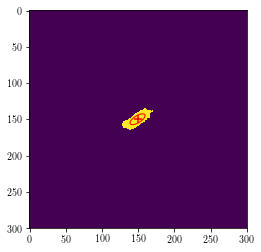

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.03066720707517 149.73786172055833
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_193_xy_full_particles.fits
###      Input Image   : temp_C2E79.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

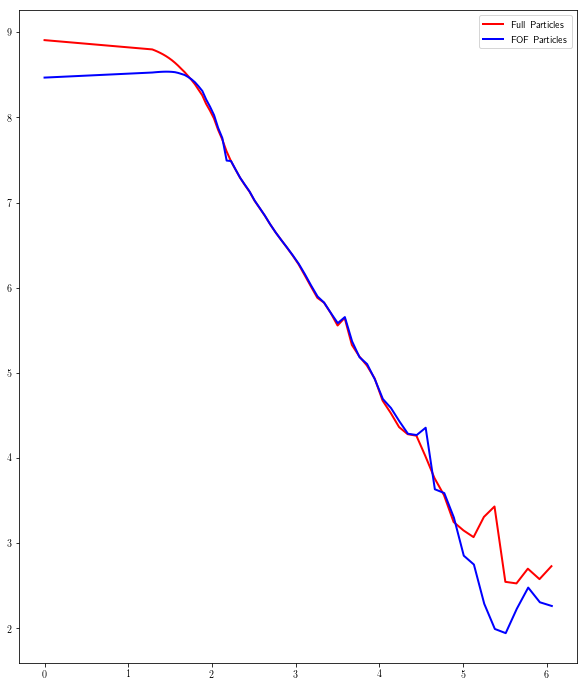

Galaxy 95
(80, u'subbox_080_ptlstr_Coordinates', u'subbox_080_ptlstr_Masses')
Pixel Scales: 6.9218527839, 5.3333 kpc/pixel


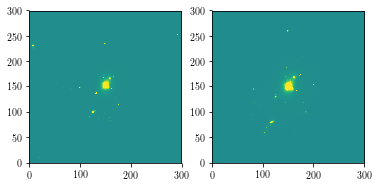

Measuring FULL PARTICLE profile
(26047840., 809, 746, 138, 168, 125, 164, 151.15058194, 145.69720205, 14.32181386, 27.55068085, -8.87440584, 0., 0., 0., 5.6572504, 3.1413393, -1.10565364, 0.08723521, 0.04534793, 0.05619902, 4.97299784e+11, 4.97549148e+11, 3.52082289e+10, 9.22835436e+10, 150, 147, 150, 147, 0)


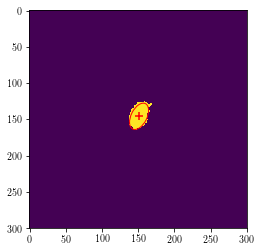

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.15058194178943 145.69720204777147
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_95_xy_full_particles.fits
###      Input Image   : temp_MZX3Q.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

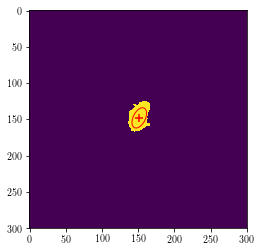

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.47538208268455 147.86121832465793
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_95_xy_full_particles.fits
###      Input Image   : temp_KD0XK.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

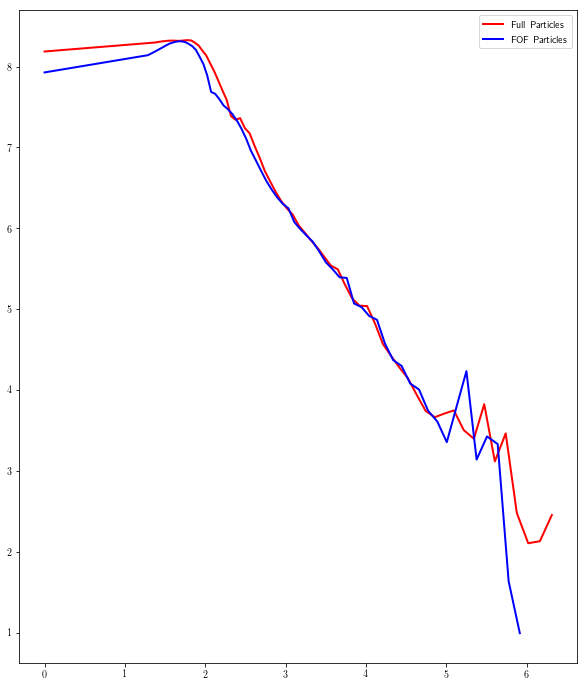

Galaxy 331
(81, u'subbox_081_ptlstr_Coordinates', u'subbox_081_ptlstr_Masses')
Pixel Scales: 4.57627157994, 5.3333 kpc/pixel


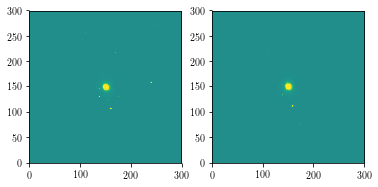

Measuring FULL PARTICLE profile
(12414806., 506, 463, 137, 162, 137, 163, 150.81172849, 150.63209785, 5.15922247, 5.68138558, 0.26708682, 0., 0., 0., 2.4070313, 2.24651027, 1.17241251, 0.19430053, 0.1764428, -0.01826847, 1.82313402e+11, 1.8239642e+11, 2.14384681e+10, 6.34986127e+10, 151, 151, 151, 151, 0)


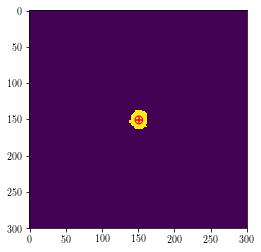

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.8117284875924 150.63209785138773
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_331_xy_full_particles.fits
###      Input Image   : temp_MJJF8.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

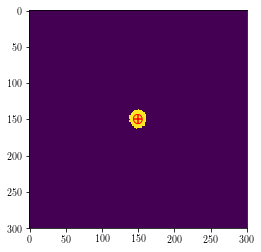

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.43378919419814 149.46964842462216
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_331_xy_full_particles.fits
###      Input Image   : temp_C1P6B.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

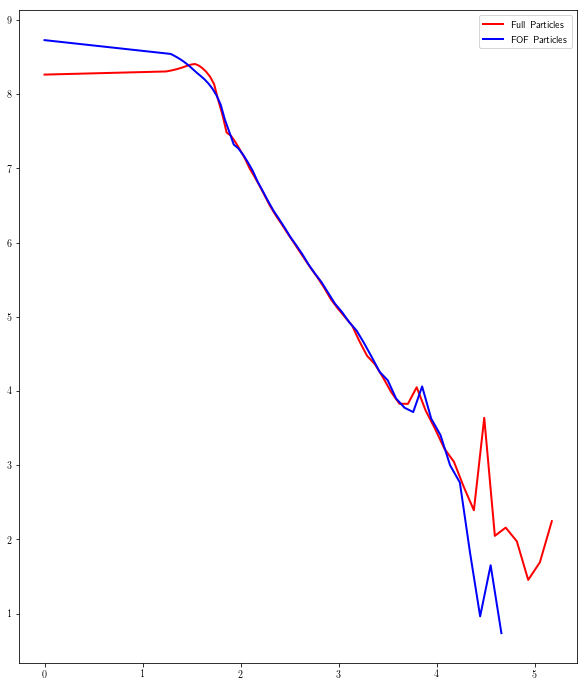

Galaxy 44
(82, u'subbox_082_ptlstr_Coordinates', u'subbox_082_ptlstr_Masses')
Pixel Scales: 8.69756784158, 5.3333 kpc/pixel


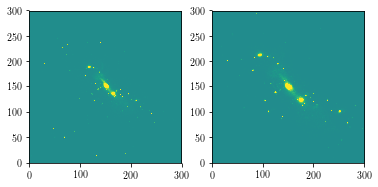

Measuring FULL PARTICLE profile
(36473304., 516, 455, 130, 160, 119, 163, 150.16243397, 147.82793836, 16.34817841, 47.11788865, 22.39759437, 0., 0., 0., 7.67499542, 2.13553524, 1.08633733, 0.17539455, 0.06085547, -0.16674839, 2.75463897e+11, 2.75862323e+11, 2.74654843e+10, 7.6576342e+10, 150, 148, 150, 148, 1)


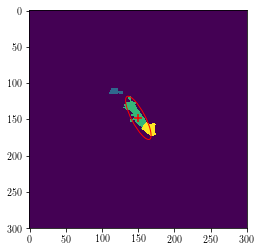

----------------------------------------------------------------------------------------------------
###      galX, galY :  150.16243397395723 147.82793835864075
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_44_xy_full_particles.fits
###      Input Image   : temp_OUBZ7.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

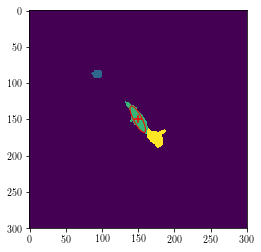

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.3521282697537 149.66791793814212
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_44_xy_full_particles.fits
###      Input Image   : temp_E6FWV.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

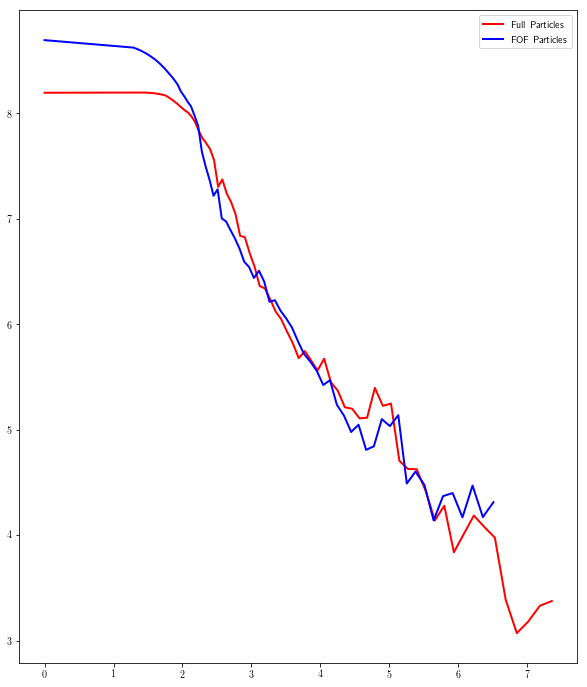

Galaxy 363
(83, u'subbox_083_ptlstr_Coordinates', u'subbox_083_ptlstr_Masses')
Pixel Scales: 4.46957584968, 5.3333 kpc/pixel


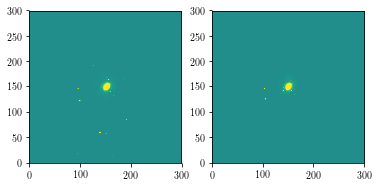

Measuring FULL PARTICLE profile
(17200944., 520, 482, 139, 166, 135, 163, 151.72675364, 149.69537652, 6.67317054, 8.21691262, -2.35328532, 0., 0., 0., 3.14986992, 2.22899151, -0.94386834, 0.16668887, 0.13537242, 0.09547783, 2.62486196e+11, 2.62666584e+11, 2.09725501e+10, 4.88999485e+10, 152, 150, 152, 150, 0)


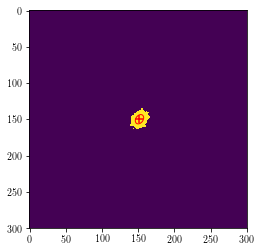

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.72675364361334 149.6953765232372
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_363_xy_full_particles.fits
###      Input Image   : temp_91IYX.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

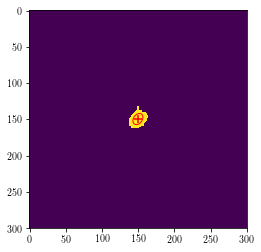

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.55147098342312 149.48246915882896
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_363_xy_full_particles.fits
###      Input Image   : temp_HK47L.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

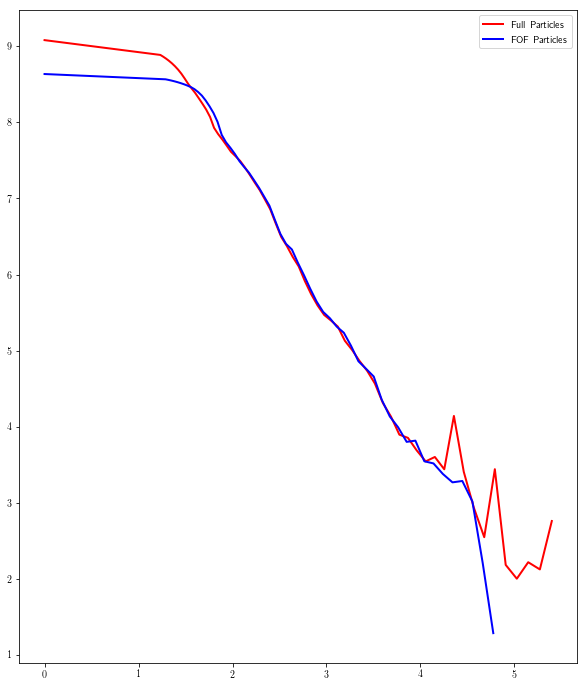

Galaxy 339
(84, u'subbox_084_ptlstr_Coordinates', u'subbox_084_ptlstr_Masses')
Pixel Scales: 3.8758416379, 5.3333 kpc/pixel


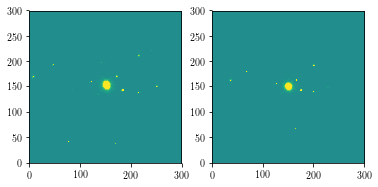

Measuring FULL PARTICLE profile
(22062712., 346, 331, 142, 161, 136, 158, 151.78874402, 146.84701141, 6.26720677, 8.38960761, 1.15377235, 0., 0., 0., 2.98261571, 2.40017033, 1.1572125, 0.16370536, 0.12229122, -0.04502683, 1.58380278e+11, 1.58555767e+11, 9.83885107e+09, 2.47737958e+10, 152, 147, 152, 147, 0)


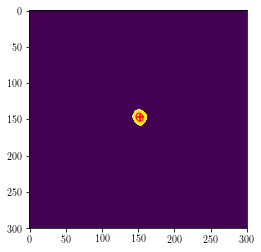

----------------------------------------------------------------------------------------------------
###      galX, galY :  151.78874402263202 146.8470114136009
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_339_xy_full_particles.fits
###      Input Image   : temp_R1PDQ.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

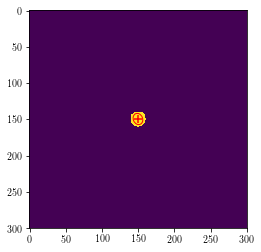

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.61864038842995 149.3771944938971
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_339_xy_full_particles.fits
###      Input Image   : temp_U31Q6.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

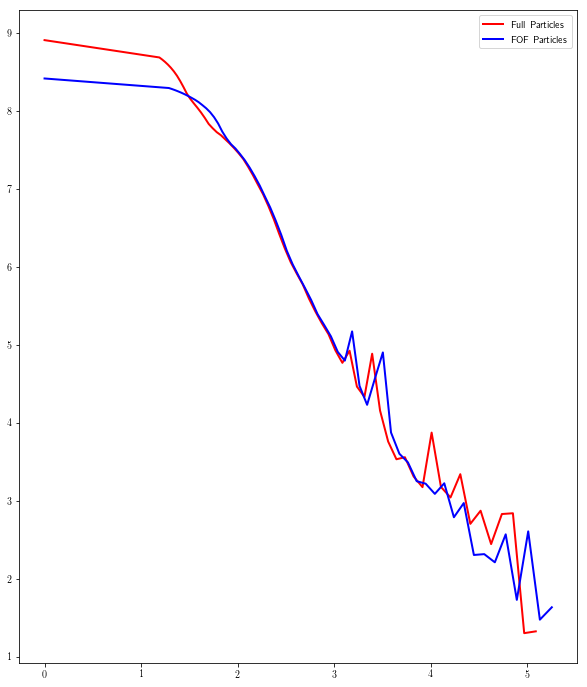

Galaxy 150
(85, u'subbox_085_ptlstr_Coordinates', u'subbox_085_ptlstr_Masses')
Pixel Scales: 5.4084799865, 5.3333 kpc/pixel


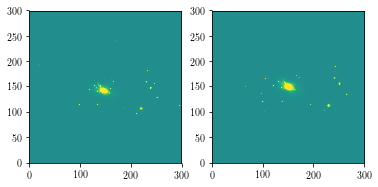

Measuring FULL PARTICLE profile
(11508969., 913, 868, 125, 168, 141, 171, 144.90461542, 156.38647508, 25.19775337, 11.97969802, 7.38636441, 0., 0., 0., 5.33855915, 2.94571495, 0.42044175, 0.04844136, 0.10189016, -0.05973532, 2.3431843e+11, 2.34505601e+11, 1.9008258e+10, 5.1631063e+10, 146, 157, 146, 157, 0)


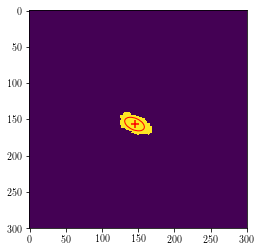

----------------------------------------------------------------------------------------------------
###      galX, galY :  144.9046154216245 156.38647508066956
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_150_xy_full_particles.fits
###      Input Image   : temp_OHTB5.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

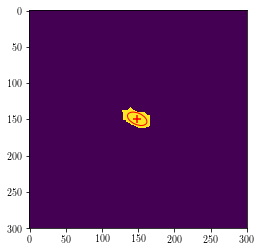

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.57333432695663 149.10556024359906
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_150_xy_full_particles.fits
###      Input Image   : temp_WO1E7.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

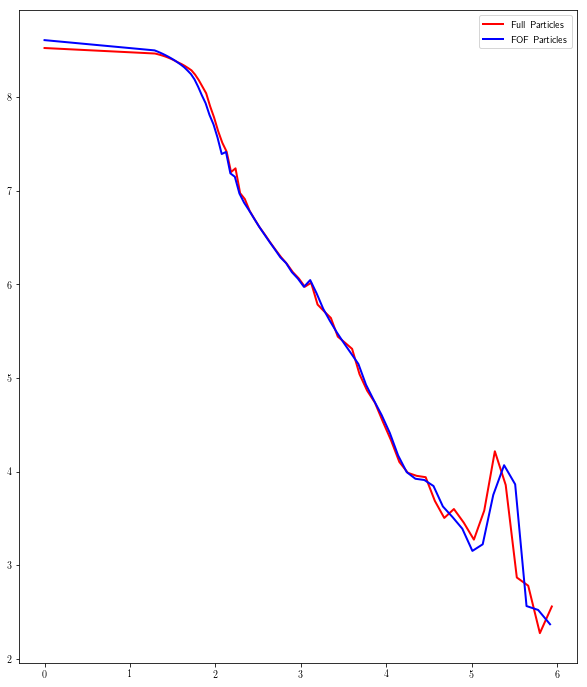

Galaxy 195
(86, u'subbox_086_ptlstr_Coordinates', u'subbox_086_ptlstr_Masses')
Pixel Scales: 5.2955233653, 5.3333 kpc/pixel


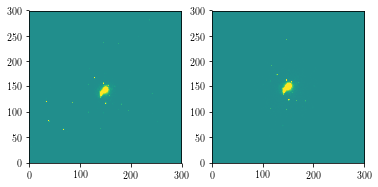

Measuring FULL PARTICLE profile
(18406008., 429, 402, 135, 163, 141, 170, 149.21755665, 155.85847234, 6.1410679, 11.15889696, 0.28209238, 0., 0., 0., 3.34285903, 2.47492599, 1.51481342, 0.16302744, 0.08971877, -0.00824253, 1.93271349e+11, 1.93481638e+11, 1.97511782e+10, 5.83519805e+10, 149, 156, 149, 156, 1)


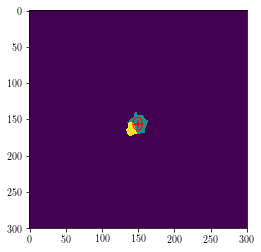

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.2175566484908 155.85847233801348
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_195_xy_full_particles.fits
###      Input Image   : temp_WLEUA.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

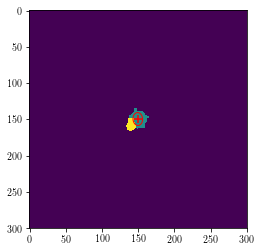

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.41931050340028 149.4256226267929
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_195_xy_full_particles.fits
###      Input Image   : temp_JP58Q.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

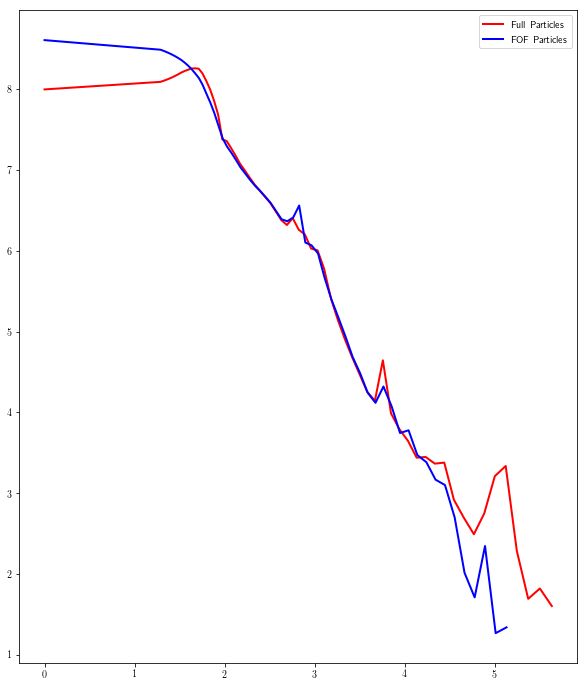

Galaxy 46
(87, u'subbox_087_ptlstr_Coordinates', u'subbox_087_ptlstr_Masses')
Pixel Scales: 7.20655174153, 5.3333 kpc/pixel


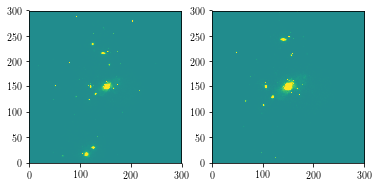

Measuring FULL PARTICLE profile
(22761190., 946, 894, 131, 178, 133, 168, 153.07308172, 149.46548635, 29.58768189, 12.52110792, -7.70534824, 0., 0., 0., 5.70541477, 3.09144473, -0.36722827, 0.04024809, 0.09510722, 0.04953644, 4.04879999e+11, 4.05253226e+11, 2.35586888e+10, 4.89309676e+10, 152, 150, 152, 150, 1)


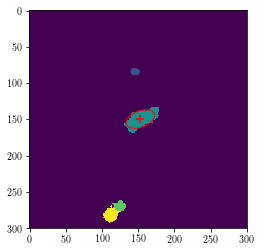

----------------------------------------------------------------------------------------------------
###      galX, galY :  153.07308171700564 149.46548635382658
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_46_xy_full_particles.fits
###      Input Image   : temp_9J399.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

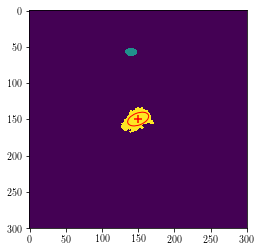

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.90302926725317 149.4779087533375
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_46_xy_full_particles.fits
###      Input Image   : temp_5AI0T.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figu

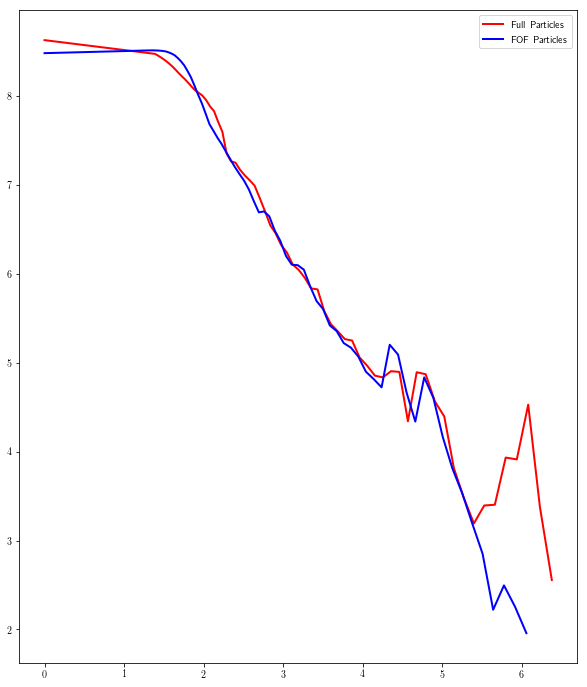

Galaxy 48
(88, u'subbox_088_ptlstr_Coordinates', u'subbox_088_ptlstr_Masses')
Pixel Scales: 8.39338982008, 5.3333 kpc/pixel


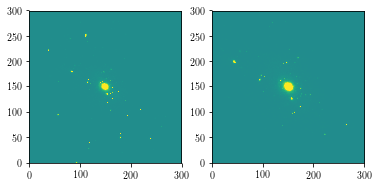

Measuring FULL PARTICLE profile
(24700862., 854, 807, 132, 166, 134, 169, 148.81548653, 150.30124526, 11.10386884, 19.80144685, 5.9982536, 0., 0., 0., 4.78137064, 2.83616138, 1.09905529, 0.10767882, 0.06038202, -0.06523612, 8.03588276e+11, 8.04078092e+11, 5.94300232e+10, 1.22689839e+11, 149, 149, 149, 149, 0)


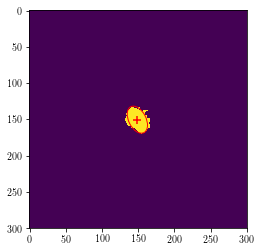

----------------------------------------------------------------------------------------------------
###      galX, galY :  148.81548652664432 150.30124526329018
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_48_xy_full_particles.fits
###      Input Image   : temp_MPGSY.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

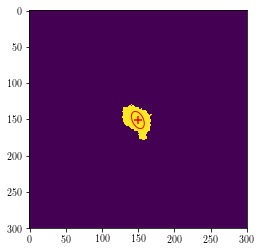

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.4855403005727 150.7973057787628
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_48_xy_full_particles.fits
###      Input Image   : temp_5BWV3.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figur

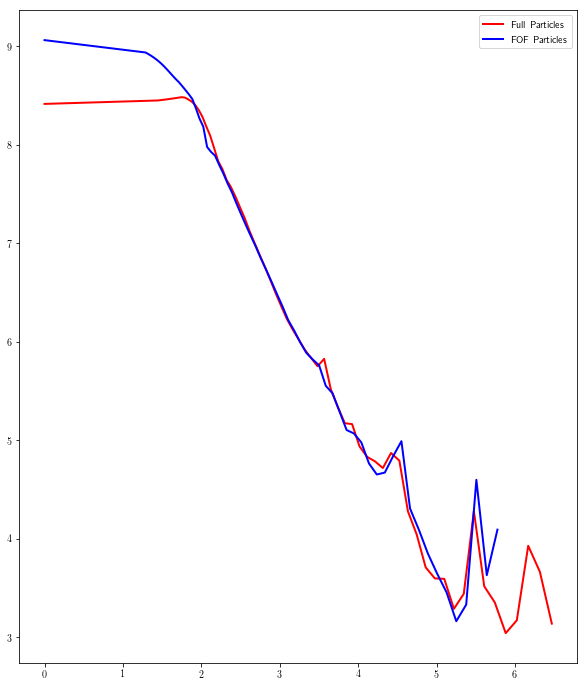

Galaxy 56
(89, u'subbox_089_ptlstr_Coordinates', u'subbox_089_ptlstr_Masses')
Pixel Scales: 7.060995221, 5.3333 kpc/pixel


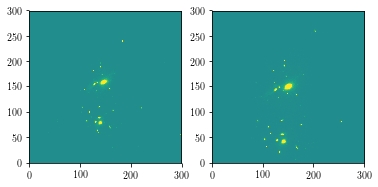

Measuring FULL PARTICLE profile
(33781696., 453, 427, 132, 160, 130, 155, 146.10121365, 141.08170208, 15.55679916, 5.52213525, -0.98231238, 0., 0., 0., 3.95626783, 2.32956624, -0.09666913, 0.0650108, 0.18314654, 0.02312907, 3.75751999e+11, 3.81772956e+11, 3.7650817e+10, 1.0727619e+11, 146, 141, 146, 141, 1)


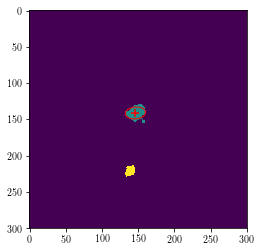

----------------------------------------------------------------------------------------------------
###      galX, galY :  146.10121364936887 141.08170208414262
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_56_xy_full_particles.fits
###      Input Image   : temp_UBWS6.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

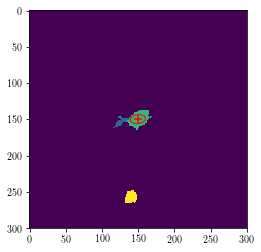

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.45958057142676 149.54708509089218
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_56_xy_full_particles.fits
###      Input Image   : temp_CAMCL.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fig

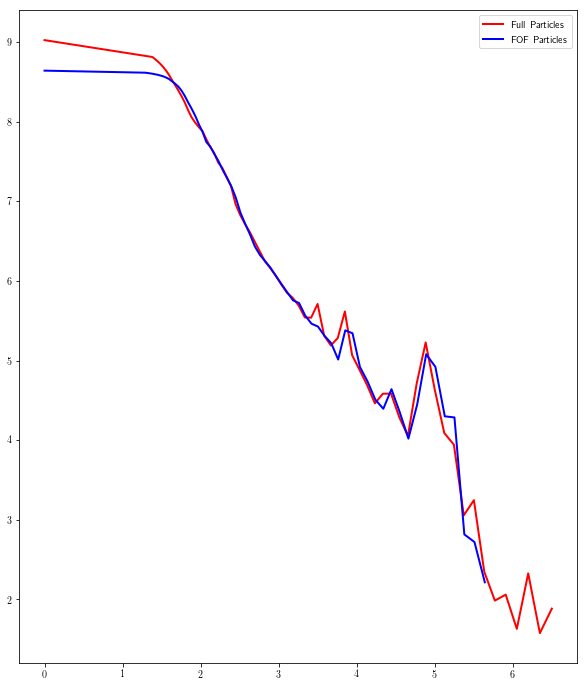

Galaxy 214
(90, u'subbox_090_ptlstr_Coordinates', u'subbox_090_ptlstr_Masses')
Pixel Scales: 5.44419520378, 5.3333 kpc/pixel


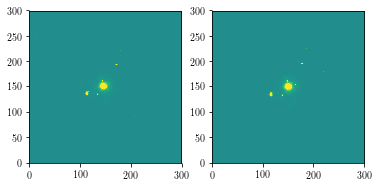

Measuring FULL PARTICLE profile
(24809316., 452, 419, 134, 159, 136, 160, 145.6836668, 147.88629927, 7.2898512, 10.25657091, 0.67407984, 0., 0., 0., 3.22529817, 2.67280269, 1.35753131, 0.13801576, 0.09809461, -0.01814128, 1.96294509e+11, 1.96449714e+11, 1.64617206e+10, 3.50160978e+10, 146, 148, 146, 148, 0)


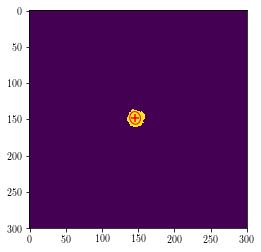

----------------------------------------------------------------------------------------------------
###      galX, galY :  145.68366679567055 147.88629927267172
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_214_xy_full_particles.fits
###      Input Image   : temp_EUX9H.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

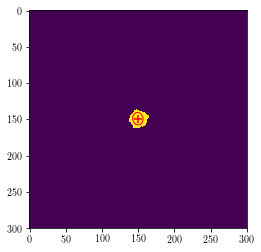

----------------------------------------------------------------------------------------------------
###      galX, galY :  149.49800915942654 148.95418295619476
###      galR :  20.0
###      iniSma, maxSma :  50.0 1000
###      Stage :  3
###      Step :  0.1
----------------------------------------------------------------------------------------------------
##       Set up the Ellipse configuration
----------------------------------------------------------------------------------------------------

----------------------------------------------------------------------------------------------------
##       Start the Ellipse Run: Attempt  1
----------------------------------------------------------------------------------------------------
###      Origin Image  : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Figures/fits_files/full_particles/TNG_214_xy_full_particles.fits
###      Input Image   : temp_62VGV.fits
###      Output Binary : /Users/fardila/Documents/GitHub/HSC_vs_hydro/Fi

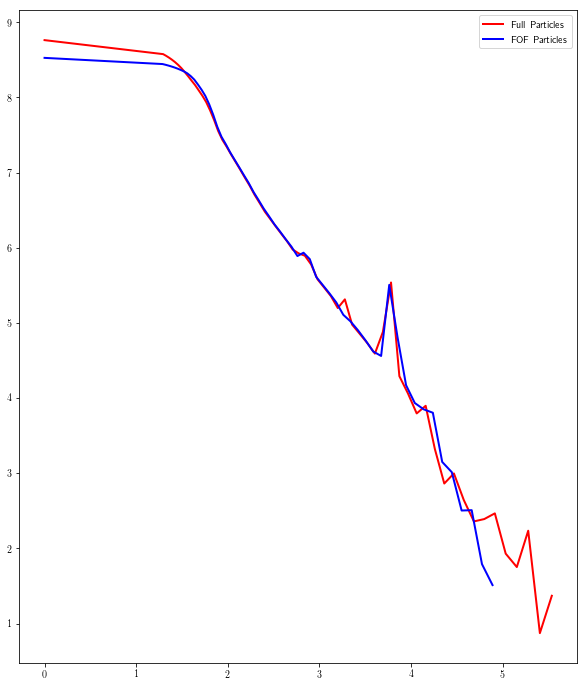

In [88]:
for i, Group_ID in enumerate(Group_IDs): #one more group id in list than HDF5 file
    print('Galaxy {0}'.format(Group_ID))
    
    positions_key = keys[2*i]
    masses_key = keys[(2*i)+1]
    
    print(i, positions_key, masses_key)
    
    particle_positions = np.array(full_particles_file[positions_key])
    particle_masses = np.array(full_particles_file[masses_key])

    #convert from comoving h-inverse to physical real-h
    particle_positions = particle_positions / float(h_tng*(1+z_tng)) 
    
    
    xmin, xmax = min(particle_positions[:,0]), max(particle_positions[:,0]), 
    x_length = xmax - xmin
    
    ymin, ymax = min(particle_positions[:,1]), max(particle_positions[:,1]), 
    y_length = ymax - ymin
    
    
    
#     hist, _, _, _ = plt.hist2d(particle_positions[:,0], particle_positions[:,1], weights = particle_masses,
#                            bins=[x_length/5.33,y_length/5.33],norm=mcolors.LogNorm())

    hist, _, _, _ = plt.hist2d(particle_positions[:,0], particle_positions[:,1], weights = particle_masses,
                           bins=[300,300],norm=mcolors.LogNorm())
    
    pixel_scale_full = np.mean([x_length, y_length])/300.
    print('Pixel Scales: {0}, {1} kpc/pixel'.format(pixel_scale_full, 5.3333))
    
    plt.clf()
    m, s = np.mean(hist), np.std(hist)
    plt.subplot(121)
    plt.imshow(np.flipud(hist), interpolation='nearest', cmap=plt.get_cmap('viridis'),
                   vmin=m-s, vmax=m+s, origin='lower')
    
    
    #FOF plot
    FOF_galaxy_index = np.where(FOF_galaxy_IDS==Group_ID)[0][0]
    
    img_cen, img_cen_sat, img_cen_icl, pixel_scale, m_cat = get_mass_maps(FOF_particles_file_location,
                                                                          gal_n=FOF_galaxy_index)
    img_all = img_cen_sat + img_cen_icl - img_cen
    
    m, s = np.mean(img_all), np.std(img_all)
    
    plt.subplot(122)
    plt.imshow(np.flipud(img_all), interpolation='nearest', cmap=plt.get_cmap('viridis'),
                   vmin=m-s, vmax=m+s, origin='lower')
    plt.show()
    
    print('Measuring FULL PARTICLE profile')
    hist = np.ascontiguousarray(hist)
    full_particles_iso, theta_full, a_full, b_full = measure_profile_from_map(hist,Group_ID,
                                                                              pixel_scale=pixel_scale_full)
    
    print('Measuring FOF PARTICLES profile')
    FOF_particles_iso, theta_FOF, a_FOF, b_FOF = measure_profile_from_map(img_all,Group_ID,pixel_scale=5.33333,
                                                                          theta = theta_full, a = a_full,
                                                                          b = b_full)
    
    #plot profiles
    fig = plt.figure(figsize=(10, 12))
    ax1 = plt.subplot()
    hsc_sma = np.arange(0.4, 5.5, 0.1)
    if full_particles_iso is not None:
        ax1.plot((full_particles_iso['sma_kpc'] ) ** 0.25,
                             np.log10(full_particles_iso['intens_kpc'])+ np.log10(0.7 ** 2.0) , linewidth=2.0,
                             alpha=1, color = 'r', label='Full Particles')
    ax1.plot((FOF_particles_iso['sma_kpc'] ) ** 0.25,
                         np.log10(FOF_particles_iso['intens_kpc'])+ np.log10(0.7 ** 2.0) , linewidth=2.0,
                         alpha=1, color = 'b', label='FOF Particles')
    plt.legend()
    
    plt.show()
    
    full_particles_isos.append(full_particles_iso)
    fof_particles_isos.append(FOF_particles_iso)

In [116]:
#save isos
np.save('/Users/fardila/Documents/GitHub/HSC_vs_hydro/Data/TNG/full_particles/full_particle_isos.npy',
        full_particles_isos )

np.save('/Users/fardila/Documents/GitHub/HSC_vs_hydro/Data/TNG/full_particles/fof_particle_isos.npy',
        fof_particles_isos )
